In [42]:
from AL_methods import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [43]:
f_adj_list = {12: [26, 19, 5, 33, 56, 74, 68, 62, 86, 80],
 13: [27, 20, 6, 34, 57, 75, 69, 63, 87, 81],
 14: [28, 21, 7, 35, 58, 76, 70, 64, 88, 82],
 26: [12, 19, 5, 33, 56, 74, 68, 62, 86, 80],
 27: [13, 20, 6, 34, 57, 75, 69, 63, 87, 81],
 28: [14, 21, 7, 35, 58, 76, 70, 64, 88, 82],
 19: [12, 26, 5, 33, 56, 74, 68, 62, 86, 80],
 20: [13, 27, 6, 34, 57, 75, 69, 63, 87, 81],
 21: [14, 28, 7, 35, 58, 76, 70, 64, 88, 82],
 5: [12, 26, 19, 33, 56, 74, 68, 62, 86, 80],
 6: [13, 27, 20, 34, 57, 75, 69, 63, 87, 81],
 7: [14, 28, 21, 35, 58, 76, 70, 64, 88, 82],
 33: [12, 26, 19, 5, 56, 74, 68, 62, 86, 80],
 34: [13, 27, 20, 6, 57, 75, 69, 63, 87, 81],
 35: [14, 28, 21, 7, 58, 76, 70, 64, 88, 82],
 56: [12, 26, 19, 5, 33, 74, 68, 62, 86, 80],
 57: [13, 27, 20, 6, 34, 75, 69, 63, 87, 81],
 58: [14, 28, 21, 7, 35, 76, 70, 64, 88, 82],
 74: [12, 26, 19, 5, 33, 56, 68, 62, 86, 80],
 75: [13, 27, 20, 6, 34, 57, 69, 63, 87, 81],
 76: [14, 28, 21, 7, 35, 58, 70, 64, 88, 82],
 68: [12, 26, 19, 5, 33, 56, 74, 62, 86, 80],
 69: [13, 27, 20, 6, 34, 57, 75, 63, 87, 81],
 70: [14, 28, 21, 7, 35, 58, 76, 64, 88, 82],
 62: [12, 26, 19, 5, 33, 56, 74, 68, 86, 80],
 63: [13, 27, 20, 6, 34, 57, 75, 69, 87, 81],
 64: [14, 28, 21, 7, 35, 58, 76, 70, 88, 82],
 86: [12, 26, 19, 5, 33, 56, 74, 68, 62, 80],
 87: [13, 27, 20, 6, 34, 57, 75, 69, 63, 81],
 88: [14, 28, 21, 7, 35, 58, 76, 70, 64, 82],
 80: [12, 26, 19, 5, 33, 56, 74, 68, 62, 86],
 81: [13, 27, 20, 6, 34, 57, 75, 69, 63, 87],
 82: [14, 28, 21, 7, 35, 58, 76, 70, 64, 88]}

c_adj_list = {1: [29, 65],
 2: [30, 66],
 3: [31, 67],
 5: [12, 26, 19, 62],
 6: [13, 27, 20, 63],
 7: [14, 28, 21, 64],
 8: [15, 22],
 9: [16, 23],
 10: [17, 24],
 12: [5, 26, 33, 19],
 13: [6, 27, 34,20],
 14: [7, 28, 35,21],
 15: [8, 29, 52],
 16: [9, 53, 30],
 17: [10, 54, 31],
 19: [26, 5, 33, 12],
 20: [27, 34, 6,13],
 21: [28, 35, 7,14],
 22: [8, 36, 40],
 23: [9, 37, 41],
 24: [10, 38, 42],
 26: [12, 33, 5, 19],
 27: [13, 20, 34, 6],
 28: [14, 21, 35, 7],
 29: [1, 65, 15, 48],
 30: [2, 66, 49, 16],
 31: [3, 67, 50, 17],
 33: [56, 19, 26, 12],
 34: [57, 13, 27, 20],
 35: [58, 14, 28, 21],
 36: [22, 40],
 37: [23, 41],
 38: [24, 42],
 40: [36, 48,22],
 41: [37, 49, 23],
 42: [38, 50, 24],
 44: [52, 59],
 45: [53, 60],
 46: [54, 61],
 48: [40, 52, 29],
 49: [53, 30, 41],
 50: [31, 42, 54],
 52: [44, 59, 48, 15],
 53: [45, 60, 49, 16],
 54: [17, 50, 46, 61],
 56: [33, 74, 68],
 57: [34, 75, 69],
 58: [35, 76, 70],
 59: [71, 77, 44, 52],
 60: [45, 78, 72, 53],
 61: [46, 79, 73, 54],
 62: [5, 86, 80],
 63: [6, 87, 81],
 64: [7, 88, 82],
 65: [29, 1, 89, 83],
 66: [2, 30, 90, 84],
 67: [85, 91, 3, 31],
 68: [56, 74],
 69: [57, 75],
 70: [58, 76],
 71: [59, 77],
 72: [60, 78],
 73: [79, 61],
 74: [56, 68],
 75: [57, 69],
 76: [58, 70],
 77: [59, 71],
 78: [60, 72],
 79: [61, 73],
 80: [62, 86],
 81: [63, 87],
 82: [64, 88],
 83: [89, 65],
 84: [90, 66],
 85: [91, 67],
 86: [62, 80],
 87: [63, 81],
 88: [64, 82],
 89: [65, 83],
 90: [66, 84],
 91: [85, 67]}


In [44]:
f_weights = {12:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           13:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           14:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           26:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           27:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           28:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           19:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           20:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],
           21:[1, 1, 4.25, 4.27, 1.05, 0.07, 0.01, 1.05, 0.07, 0.01],

           5:[0.12, 0.12, 0.12, 0.51, 0.12, 0, 0, 0.12, 0, 0],
           6:[0.12, 0.12, 0.12, 0.51, 0.12, 0, 0, 0.12, 0, 0],
           7:[0.12, 0.12, 0.12, 0.51, 0.12, 0, 0, 0.12, 0, 0],

           33:[0.12, 0.12, 0.12, 0.5, 0.24, 0.01, 0, 0.24, 0.01, 0],
           34:[0.12, 0.12, 0.12, 0.5, 0.24, 0.01, 0, 0.24, 0.01, 0],
           35:[0.12, 0.12, 0.12, 0.5, 0.24, 0.01, 0, 0.24, 0.01, 0],

           56:[0.11, 0.11, 0.11, 0.48, 0.96, 0.07, 0.01, 0.23, 0.01, 0],
           57:[0.11, 0.11, 0.11, 0.48, 0.96, 0.07, 0.01, 0.23, 0.01, 0],
           58:[0.11, 0.11, 0.11, 0.48, 0.96, 0.07, 0.01, 0.23, 0.01, 0],

           74:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.02, 0.1, 0.01, 0],
           75:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.02, 0.1, 0.01, 0],
           76:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.02, 0.1, 0.01, 0],

           68:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.15, 0.1, 0.01, 0],
           69:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.15, 0.1, 0.01, 0],
           70:[0.05, 0.05, 0.05, 0.23, 0.45, 0.5, 0.15, 0.1, 0.01, 0],

           62:[0.11, 0.11, 0.11, 0.48, 0.96, 0.23, 0.01, 0, 0.07, 0.01],
           63:[0.11, 0.11, 0.11, 0.48, 0.96, 0.23, 0.01, 0, 0.07, 0.01],
           64:[0.11, 0.11, 0.11, 0.48, 0.96, 0.23, 0.01, 0, 0.07, 0.01],

           86:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.02],
           87:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.02],
           88:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.02],

           80:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.15],
           81:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.15],
           82:[0.05, 0.05, 0.05, 0.23, 0.45, 0.1, 0.01, 0, 0.5, 0.15],
           }

In [45]:
weights = {}
for key, value in c_adj_list.items():
  for i in value:
    if key not in weights.keys():
      weights[key] = [1]
    else:
      weights[key] += [1]
weights

{1: [1, 1],
 2: [1, 1],
 3: [1, 1],
 5: [1, 1, 1, 1],
 6: [1, 1, 1, 1],
 7: [1, 1, 1, 1],
 8: [1, 1],
 9: [1, 1],
 10: [1, 1],
 12: [1, 1, 1, 1],
 13: [1, 1, 1, 1],
 14: [1, 1, 1, 1],
 15: [1, 1, 1],
 16: [1, 1, 1],
 17: [1, 1, 1],
 19: [1, 1, 1, 1],
 20: [1, 1, 1, 1],
 21: [1, 1, 1, 1],
 22: [1, 1, 1],
 23: [1, 1, 1],
 24: [1, 1, 1],
 26: [1, 1, 1, 1],
 27: [1, 1, 1, 1],
 28: [1, 1, 1, 1],
 29: [1, 1, 1, 1],
 30: [1, 1, 1, 1],
 31: [1, 1, 1, 1],
 33: [1, 1, 1, 1],
 34: [1, 1, 1, 1],
 35: [1, 1, 1, 1],
 36: [1, 1],
 37: [1, 1],
 38: [1, 1],
 40: [1, 1, 1],
 41: [1, 1, 1],
 42: [1, 1, 1],
 44: [1, 1],
 45: [1, 1],
 46: [1, 1],
 48: [1, 1, 1],
 49: [1, 1, 1],
 50: [1, 1, 1],
 52: [1, 1, 1, 1],
 53: [1, 1, 1, 1],
 54: [1, 1, 1, 1],
 56: [1, 1, 1],
 57: [1, 1, 1],
 58: [1, 1, 1],
 59: [1, 1, 1, 1],
 60: [1, 1, 1, 1],
 61: [1, 1, 1, 1],
 62: [1, 1, 1],
 63: [1, 1, 1],
 64: [1, 1, 1],
 65: [1, 1, 1, 1],
 66: [1, 1, 1, 1],
 67: [1, 1, 1, 1],
 68: [1, 1],
 69: [1, 1],
 70: [1, 1],
 71: [1, 1],

In [46]:
for key, value in c_adj_list.items():
  if key in f_adj_list.keys():
    for index, i in enumerate(value):
      for ind, j in enumerate(f_adj_list[key]):
        if i == j:
          weights[key][index] = f_weights[key][ind]


In [47]:
weights

{1: [1, 1],
 2: [1, 1],
 3: [1, 1],
 5: [0.12, 0.12, 0.12, 0.12],
 6: [0.12, 0.12, 0.12, 0.12],
 7: [0.12, 0.12, 0.12, 0.12],
 8: [1, 1],
 9: [1, 1],
 10: [1, 1],
 12: [4.25, 1, 4.27, 1],
 13: [4.25, 1, 4.27, 1],
 14: [4.25, 1, 4.27, 1],
 15: [1, 1, 1],
 16: [1, 1, 1],
 17: [1, 1, 1],
 19: [1, 4.25, 4.27, 1],
 20: [1, 4.27, 4.25, 1],
 21: [1, 4.27, 4.25, 1],
 22: [1, 1, 1],
 23: [1, 1, 1],
 24: [1, 1, 1],
 26: [1, 4.27, 4.25, 1],
 27: [1, 1, 4.27, 4.25],
 28: [1, 1, 4.27, 4.25],
 29: [1, 1, 1, 1],
 30: [1, 1, 1, 1],
 31: [1, 1, 1, 1],
 33: [0.24, 0.12, 0.12, 0.12],
 34: [0.24, 0.12, 0.12, 0.12],
 35: [0.24, 0.12, 0.12, 0.12],
 36: [1, 1],
 37: [1, 1],
 38: [1, 1],
 40: [1, 1, 1],
 41: [1, 1, 1],
 42: [1, 1, 1],
 44: [1, 1],
 45: [1, 1],
 46: [1, 1],
 48: [1, 1, 1],
 49: [1, 1, 1],
 50: [1, 1, 1],
 52: [1, 1, 1, 1],
 53: [1, 1, 1, 1],
 54: [1, 1, 1, 1],
 56: [0.96, 0.07, 0.01],
 57: [0.96, 0.07, 0.01],
 58: [0.96, 0.07, 0.01],
 59: [1, 1, 1, 1],
 60: [1, 1, 1, 1],
 61: [1, 1, 1, 1],
 62

In [48]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [49]:
data_dir = "../Data/Data_Power/"
df = pd.read_csv("/content/drive/MyDrive/event_05.CSV", skiprows=[0,1,2,4])

df

,Time,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
0,0,-0.002934,-0.001368,-0.002883,-0.000112,0.04508,0.067282,-0.244665,-0.000550,0.000188,...,-0.023287,0.000081,-0.000039,0.000130,-0.081116,-0.117613,-0.05576,0.000453,-0.001614,0.000606
1,208,-0.002934,-0.001368,-0.002883,-0.000112,0.04508,0.067282,-0.244665,-0.000550,0.000188,...,-0.023287,0.000081,-0.000039,0.000130,-0.081116,-0.117613,-0.05576,0.000453,-0.001614,0.000606
2,417,-2.952545,0.134871,2.908653,-0.087328,185.03150,9.019005,-191.888600,-0.147661,0.076779,...,-14.103820,-0.010343,0.000550,0.009913,21.463490,0.533941,-21.40823,-0.087921,0.003065,0.082289
3,625,-59.591900,0.952302,60.348360,-1.703253,4822.05300,238.183100,-5049.003000,-4.277356,2.171021,...,-1571.959000,-0.697677,0.047035,0.680067,1767.272000,22.686780,-1783.38200,-6.534555,0.265079,6.453548
4,833,-121.721300,-8.754692,132.227900,-1.751707,11365.89000,1068.903000,-12438.870000,-13.147550,6.146880,...,-7043.420000,-2.322523,0.005846,2.382799,6816.355000,40.604510,-7327.11600,-30.228030,-0.263627,30.872170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,20000080,-107.348300,3.012909,104.189700,0.140403,10035.23000,-254.877800,-9779.997000,-31.849460,24.298880,...,-7363.753000,-13.151780,6.346667,6.802612,9672.753000,-2105.289000,-7556.85300,-146.830200,42.131080,104.609100
96002,20000289,-102.386800,-6.574876,108.817900,0.150094,9573.42100,637.788000,-10211.570000,-32.447320,22.394400,...,-7861.656000,-13.057320,5.413432,7.641304,9376.340000,-1305.506000,-8049.54100,-143.193000,30.429370,112.595800
96003,20000497,-96.794510,-16.128600,112.756000,0.159785,9052.01600,1526.515000,-10579.580000,-32.846280,20.350460,...,-8310.669000,-12.882710,4.447833,8.431526,9021.549000,-497.579100,-8492.40800,-138.671900,18.549870,119.883700
96004,20000705,-90.605440,-25.580150,116.004100,0.167053,8474.09900,2405.932000,-10882.070000,-33.042820,18.180770,...,-8708.053000,-12.629280,3.456345,9.169273,8611.159000,313.279900,-8882.68300,-133.295100,6.562758,126.427400


In [50]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = preprocess(df, time=0.25e6)
data

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
1201,-104.46690,-3.015645,107.3368,0.145249,9766.355,306.5743,-10073.130,-30.13120,21.10951,9.022733,...,-8232.835,-13.37720,5.258677,8.115348,9578.582,-1217.2210,-8334.637,-86.45235,19.948840,66.48133
1202,-99.07918,-12.637490,111.5443,0.162207,9264.375,1202.4630,-10467.260,-30.55253,19.23818,11.315290,...,-8685.367,-13.18175,4.261304,8.917131,9209.891,-388.7696,-8784.620,-83.89881,12.879150,70.99658
1203,-93.07766,-22.191210,115.0785,0.181589,8705.442,2090.8320,-10796.350,-30.78555,17.24682,13.538720,...,-9083.925,-12.90552,3.237452,9.663772,8784.211,441.9618,-9180.036,-80.82899,5.729930,75.07618
1204,-86.51350,-31.591670,117.9059,0.196125,8092.647,2965.5940,-11058.440,-30.82910,15.14915,15.678730,...,-9426.551,-12.54914,2.193594,10.351270,8304.670,1269.7610,-9518.512,-77.26148,-1.456724,78.69291
1205,-79.40374,-40.787770,119.9928,0.210661,7430.405,3821.7370,-11252.550,-30.68199,12.95774,17.723270,...,-9710.900,-12.11459,1.135613,10.974730,7774.047,2089.7420,-9798.467,-73.21954,-8.634020,81.82409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,-107.34830,3.012909,104.1897,0.140403,10035.230,-254.8778,-9779.997,-31.84946,24.29888,7.551060,...,-7363.753,-13.15178,6.346667,6.802612,9672.753,-2105.2890,-7556.853,-146.83020,42.131080,104.60910
96002,-102.38680,-6.574876,108.8179,0.150094,9573.421,637.7880,-10211.570,-32.44732,22.39440,10.053230,...,-7861.656,-13.05732,5.413432,7.641304,9376.340,-1305.5060,-8049.541,-143.19300,30.429370,112.59580
96003,-96.79451,-16.128600,112.7560,0.159785,9052.016,1526.5150,-10579.580,-32.84628,20.35046,12.496150,...,-8310.669,-12.88271,4.447833,8.431526,9021.549,-497.5791,-8492.408,-138.67190,18.549870,119.88370
96004,-90.60544,-25.580150,116.0041,0.167053,8474.099,2405.9320,-10882.070,-33.04282,18.18077,14.861140,...,-8708.053,-12.62928,3.456345,9.169273,8611.159,313.2799,-8882.683,-133.29510,6.562758,126.42740


In [51]:
corr_training = data.corr()
corr_training

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,1.000000,-0.506986,-0.499413,0.099407,-0.873094,0.348716,0.527749,0.707514,-0.816062,0.121448,...,0.420666,0.843527,-0.655317,-0.190536,-0.880565,0.461197,0.428268,0.810896,-0.499765,-0.316758
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,-0.506986,1.000000,-0.493509,-0.345391,0.530733,-0.872160,0.338710,0.098299,0.704953,-0.815548,...,0.454074,-0.208904,0.838454,-0.644831,0.437555,-0.879881,0.446495,-0.331413,0.808205,-0.488883
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,-0.499413,-0.493509,1.000000,0.236417,0.347265,0.525168,-0.873102,-0.812744,0.114542,0.697550,...,-0.881066,-0.641063,-0.181906,0.840682,0.448508,0.419435,-0.881115,-0.484915,-0.308472,0.811222
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,0.099407,-0.345391,0.236417,1.000000,-0.101667,0.272564,-0.170281,-0.102469,-0.169584,0.275124,...,-0.200033,-0.007985,-0.231272,0.244848,-0.068748,0.264521,-0.198148,0.035681,-0.233270,0.202421
V_BUS20KV1_AN,-0.873094,0.530733,0.347265,-0.101667,1.000000,-0.501216,-0.502733,-0.719591,0.961938,-0.257829,...,-0.365367,-0.914937,0.820892,0.093984,0.990876,-0.624280,-0.375280,-0.944611,0.676455,0.272617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DBU16_BN,0.461197,-0.879881,0.419435,0.264521,-0.624280,0.988617,-0.361185,-0.090746,-0.809091,0.914016,...,-0.498850,0.256657,-0.958503,0.718942,-0.514764,1.000000,-0.489610,0.423699,-0.961892,0.551459
V_DBU16_CN,0.428268,0.446495,-0.881115,-0.198148,-0.375280,-0.613736,0.989683,0.910971,-0.113407,-0.797115,...,0.999934,0.717061,0.220770,-0.958049,-0.495503,-0.489610,1.000000,0.549927,0.391638,-0.962291
C_DBU15_DBU16_1_DBU16_A,0.810896,-0.331413,-0.484915,0.035681,-0.944611,0.285838,0.662311,0.831717,-0.854146,0.035884,...,0.540319,0.947778,-0.654116,-0.298202,-0.962724,0.423699,0.549927,1.000000,-0.520929,-0.488463
C_DBU15_DBU16_1_DBU16_B,-0.499765,0.808205,-0.308472,-0.233270,0.676455,-0.938989,0.259251,-0.006056,0.838148,-0.846646,...,0.401627,-0.333881,0.947108,-0.628435,0.573032,-0.961892,0.391638,-0.520929,1.000000,-0.490360


In [52]:
df_test = pd.read_csv("/content/drive/MyDrive/Event 4.CSV", skiprows=[0,1,2,4])

df_test

,Time,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
0,0,-0.004329,-0.001515,-0.001623,-0.000095,0.04508,0.067282,-0.244665,-0.000550,0.000310,...,-0.023287,0.000081,-0.000039,-0.000175,0.006976,-0.170016,0.009497,-0.001304,0.000744,0.001239
1,208,-0.004329,-0.001515,-0.001623,-0.000095,0.04508,0.067282,-0.244665,-0.000550,0.000310,...,-0.023287,0.000081,-0.000039,-0.000175,0.006976,-0.170016,0.009497,-0.001304,0.000744,0.001239
2,417,-2.949805,0.129254,2.902578,-0.086547,185.03150,9.019005,-191.888600,-0.147661,0.077044,...,-14.103820,-0.010343,0.000550,0.010053,21.577300,0.534447,-21.554240,-0.085252,0.004687,0.085501
3,625,-59.594590,0.953098,60.338350,-1.701627,4822.05300,238.183100,-5049.003000,-4.277356,2.171564,...,-1571.959000,-0.697677,0.047035,0.680220,1767.359000,22.725030,-1783.271000,-6.532479,0.264938,6.454980
4,833,-121.711400,-8.763029,132.230300,-1.750747,11365.89000,1068.903000,-12438.870000,-13.147550,6.146612,...,-7043.420000,-2.322523,0.005846,2.382541,6816.230000,40.688840,-7326.779000,-30.226880,-0.263450,30.871960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,20000080,-107.363700,2.914632,104.303300,0.141372,10036.55000,-246.284100,-9789.851000,-31.042110,23.562030,...,-7589.041000,-13.282080,6.172494,7.107059,9714.433000,-1952.942000,-7746.662000,-123.451400,34.480090,88.890520
96002,20000289,-102.389100,-6.670727,108.918900,0.151196,9573.86300,647.097800,-10221.420000,-31.617610,21.703120,...,-8081.860000,-13.168070,5.220430,7.944878,9404.315000,-1143.866000,-8235.304000,-120.328600,24.622090,95.589390
96003,20000497,-96.799230,-16.229930,112.860300,0.159055,9051.57400,1536.183000,-10589.430000,-31.997740,19.709110,...,-8524.224000,-12.973920,4.237179,8.733336,9035.498000,-327.745300,-8672.682000,-116.471100,14.614240,101.690800
96004,20000705,-90.581010,-25.684520,116.101600,0.166915,8472.77400,2416.316000,-10891.430000,-32.181340,17.592980,...,-8913.785000,-12.700290,3.229803,9.466650,8610.810000,490.488500,-9056.354000,-111.891800,4.527538,107.160200


In [53]:
data_test = preprocess(df_test, time=0.25e6)

data_test

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
1201,-104.45750,-3.022276,107.3242,0.145302,9766.355,306.5743,-10073.130,-30.13120,21.10978,9.022247,...,-8232.835,-13.37720,5.258677,8.115199,9578.646,-1217.1300,-8334.986,-86.45124,19.949390,66.48052
1202,-99.07707,-12.646870,111.5508,0.162985,9264.375,1202.4630,-10467.260,-30.55253,19.23790,11.314330,...,-8685.367,-13.18175,4.261304,8.916998,9209.828,-388.6814,-8784.569,-83.89921,12.879240,71.00006
1203,-93.08139,-22.179920,115.0774,0.180668,8705.442,2090.8320,-10796.350,-30.78555,17.24713,13.538670,...,-9083.925,-12.90552,3.237452,9.664098,8784.433,442.2328,-9180.040,-80.83090,5.730214,75.07913
1204,-86.50970,-31.582200,117.9038,0.196387,8092.647,2965.5940,-11058.440,-30.82910,15.14937,15.679100,...,-9426.551,-12.54914,2.193594,10.351160,8304.582,1269.9770,-9518.550,-77.26310,-1.458240,78.69476
1205,-79.41438,-40.788330,119.9912,0.212105,7430.405,3821.7370,-11252.550,-30.68199,12.95866,17.723470,...,-9710.900,-12.11459,1.135613,10.974640,7773.811,2089.6200,-9798.472,-73.22099,-8.630921,81.82396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,-107.36370,2.914632,104.3033,0.141372,10036.550,-246.2841,-9789.851,-31.04211,23.56203,7.479362,...,-7589.041,-13.28208,6.172494,7.107059,9714.433,-1952.9420,-7746.662,-123.45140,34.480090,88.89052
96002,-102.38910,-6.670727,108.9189,0.151196,9573.863,647.0978,-10221.420,-31.61761,21.70312,9.914006,...,-8081.860,-13.16807,5.220430,7.944878,9404.315,-1143.8660,-8235.304,-120.32860,24.622090,95.58939
96003,-96.79923,-16.229930,112.8603,0.159055,9051.574,1536.1830,-10589.430,-31.99774,19.70911,12.289000,...,-8524.224,-12.97392,4.237179,8.733336,9035.498,-327.7453,-8672.682,-116.47110,14.614240,101.69080
96004,-90.58101,-25.684520,116.1016,0.166915,8472.774,2416.3160,-10891.430,-32.18134,17.59298,14.588160,...,-8913.785,-12.70029,3.229803,9.466650,8610.810,490.4885,-9056.354,-111.89180,4.527538,107.16020


In [54]:
cols = data.columns

print(all_attack_times)

{(9.0, 10.1), (17.4, 18.3), (6.6, 7.8), (5.0, 5.9), (10.5, 11.7), (16.2, 17.0), (1.1, 2.1)}


In [55]:
all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indice = sorted(list(all_attack_indices))

attacks_in = {}
co = 0
for key, value in attacks.items():
    attacks_in[sorted(all_attack_indice)[co][0]] = value
    co+=1

all_attack_indices

{(4080, 8879),
 (22800, 27119),
 (30480, 36239),
 (42000, 47279),
 (49200, 54959),
 (76560, 80399),
 (82320, 86639)}

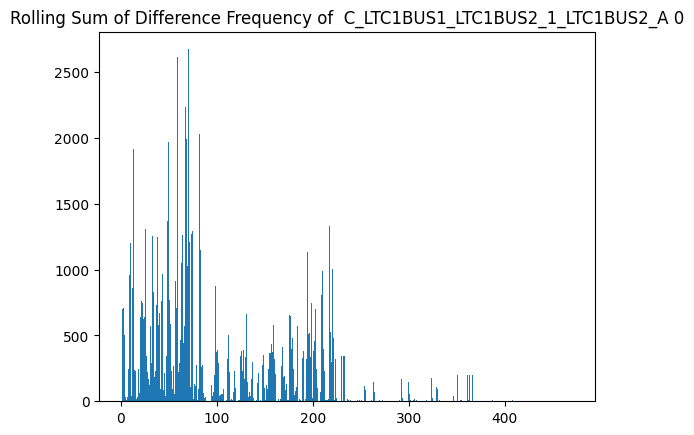

******************************************************************************


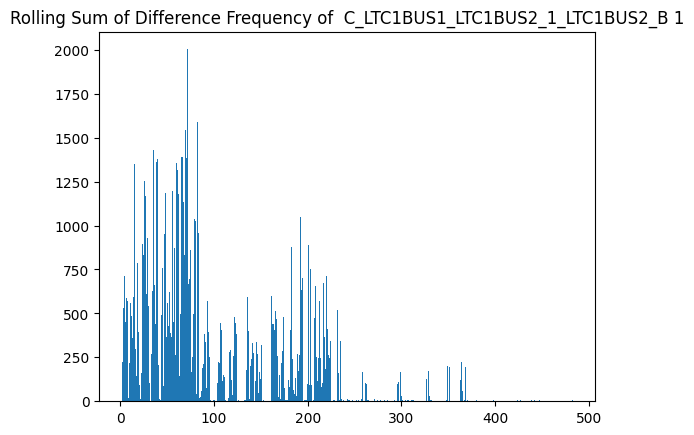

******************************************************************************


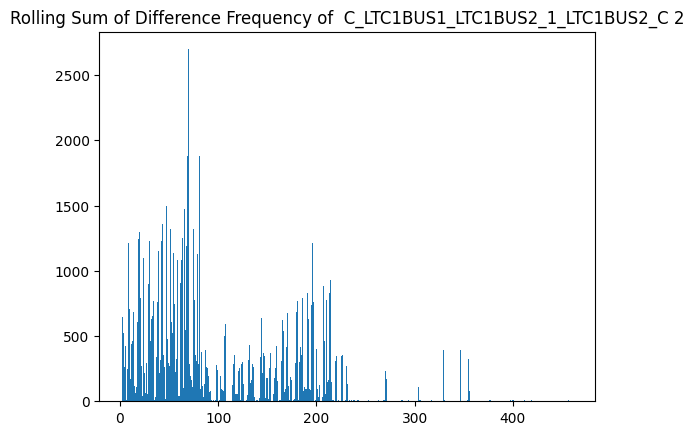

******************************************************************************


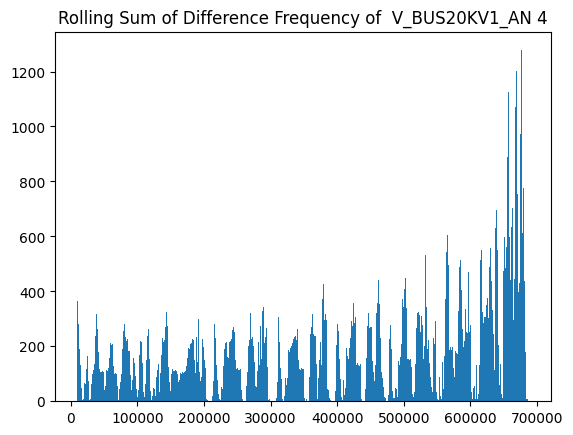

******************************************************************************


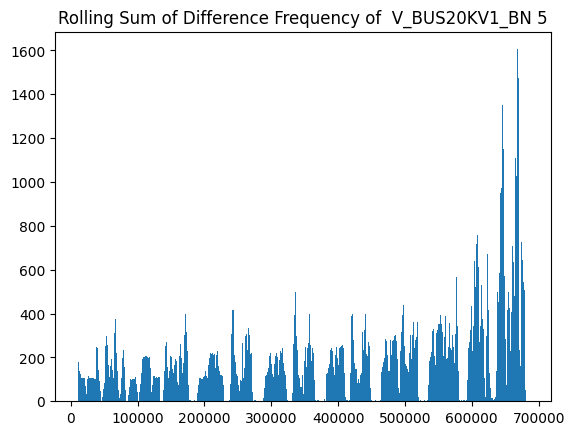

******************************************************************************


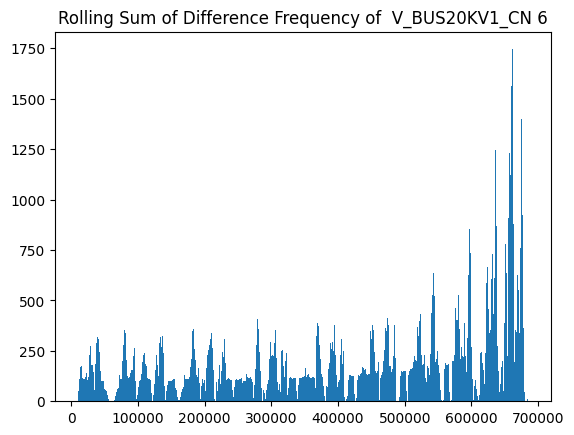

******************************************************************************


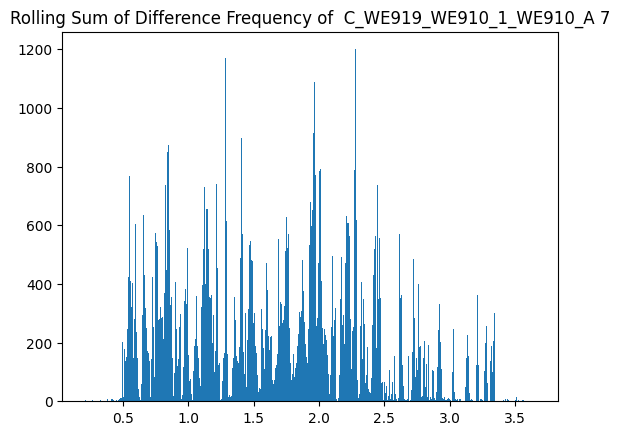

******************************************************************************


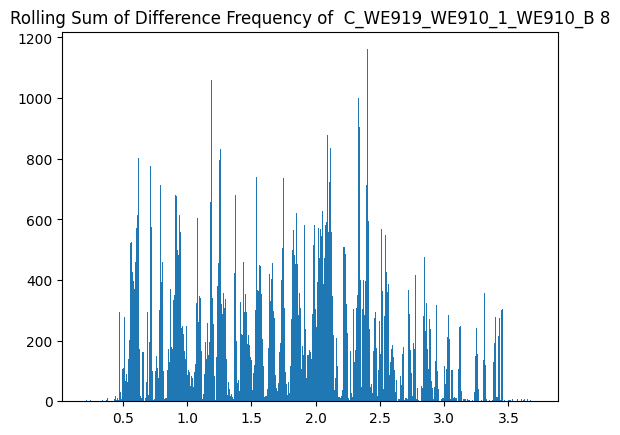

******************************************************************************


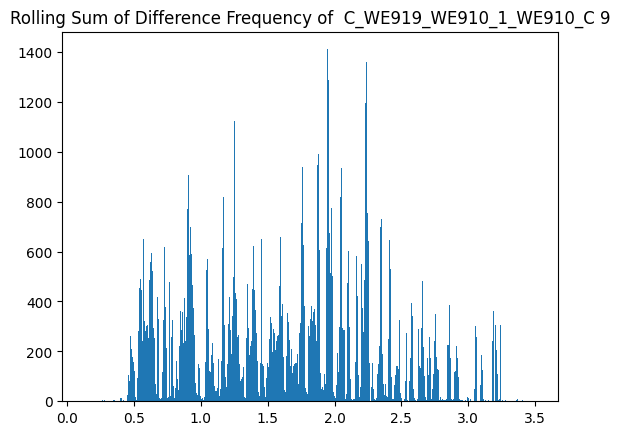

******************************************************************************


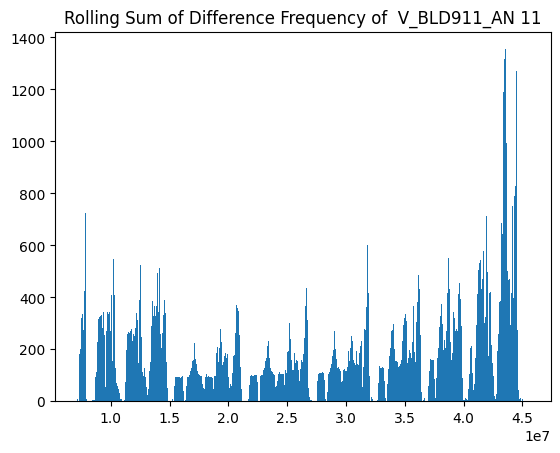

******************************************************************************


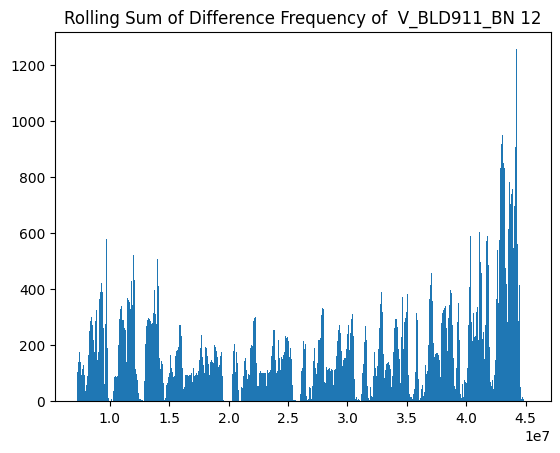

******************************************************************************


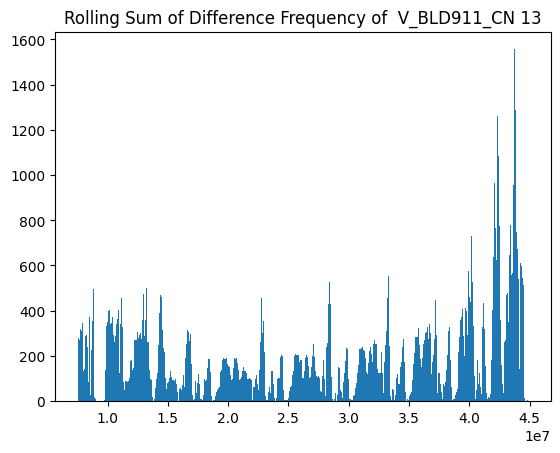

******************************************************************************


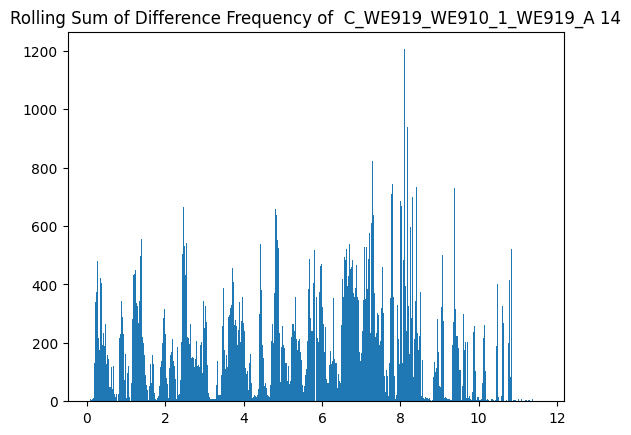

******************************************************************************


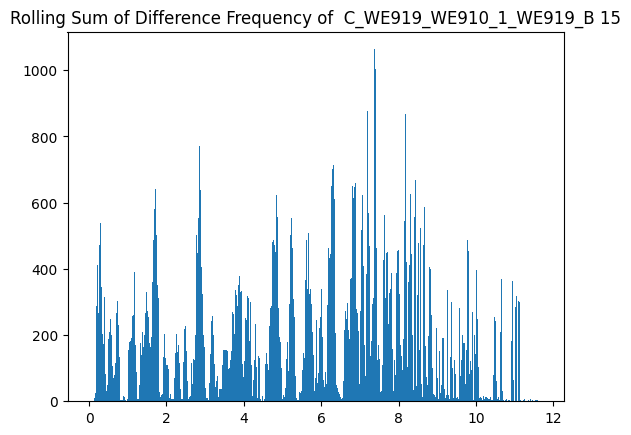

******************************************************************************


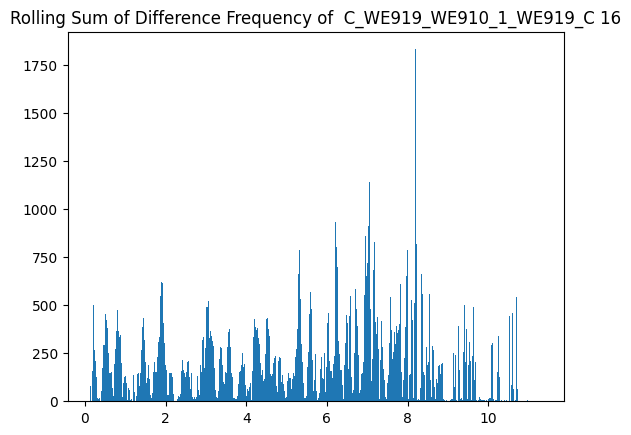

******************************************************************************


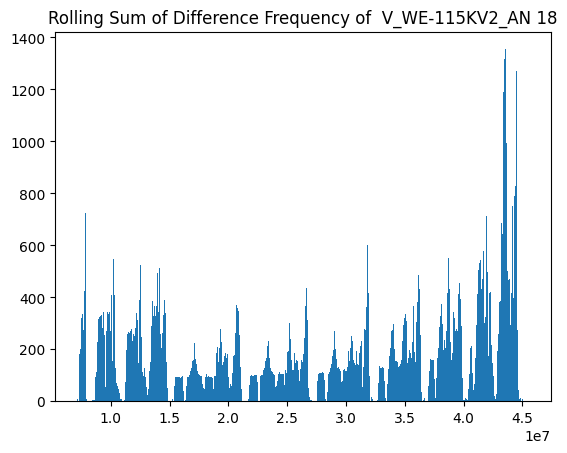

******************************************************************************


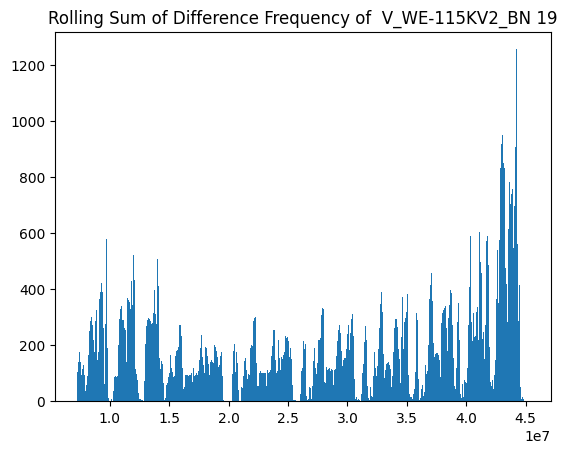

******************************************************************************


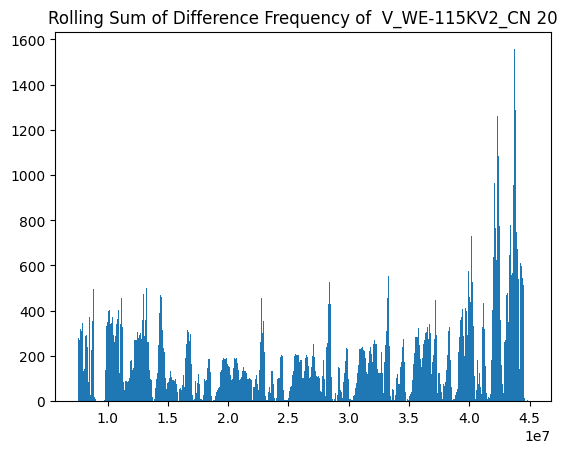

******************************************************************************


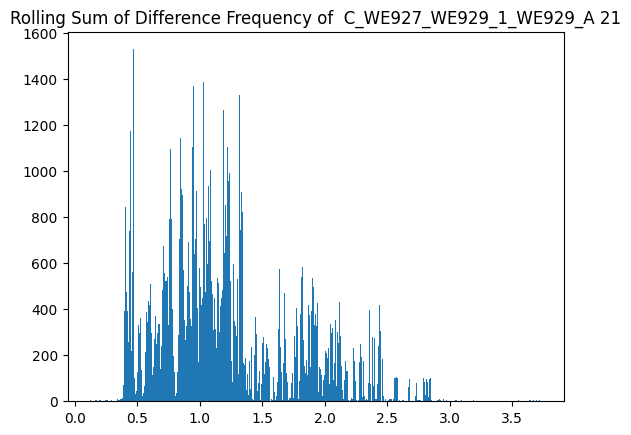

******************************************************************************


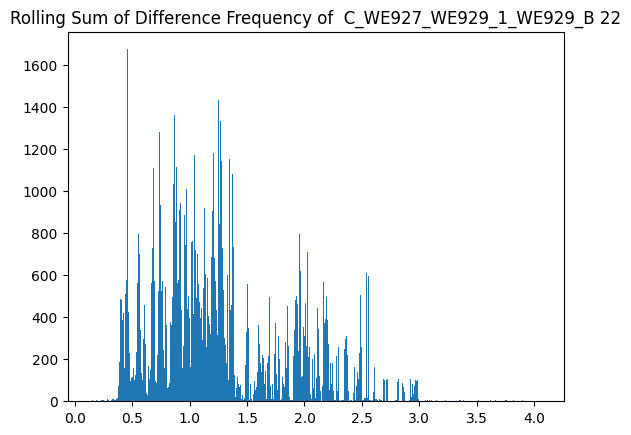

******************************************************************************


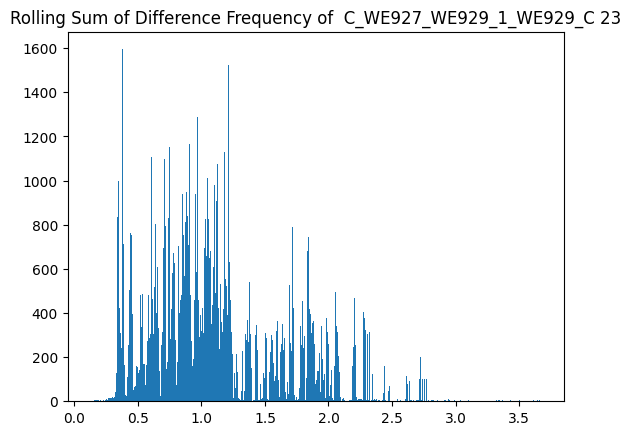

******************************************************************************


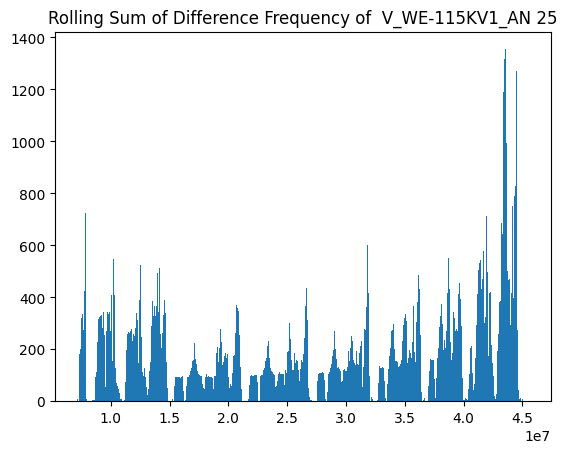

******************************************************************************


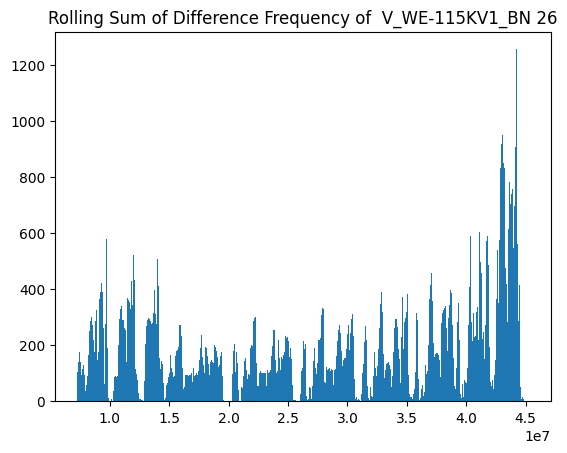

******************************************************************************


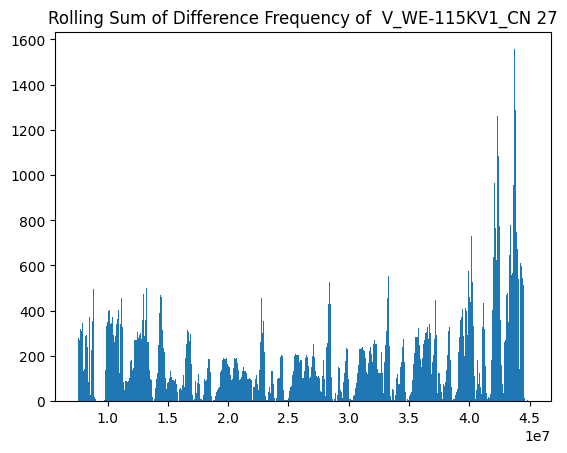

******************************************************************************


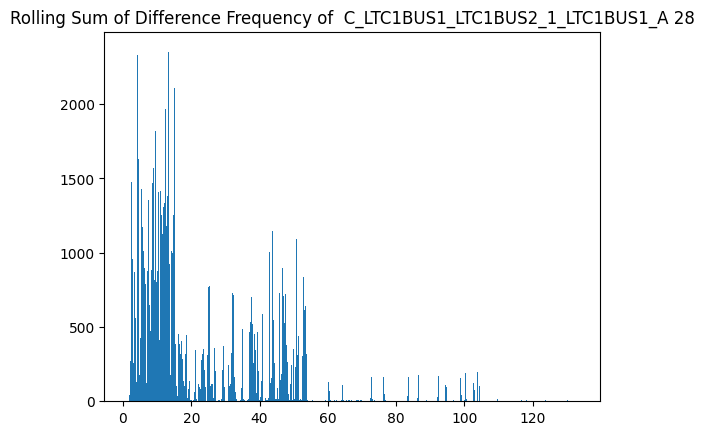

******************************************************************************


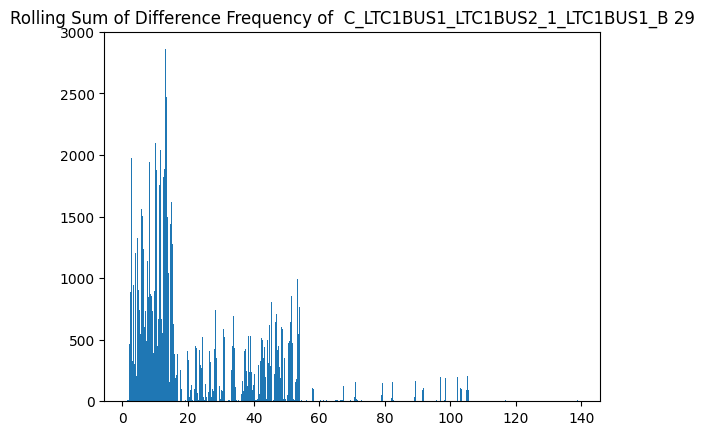

******************************************************************************


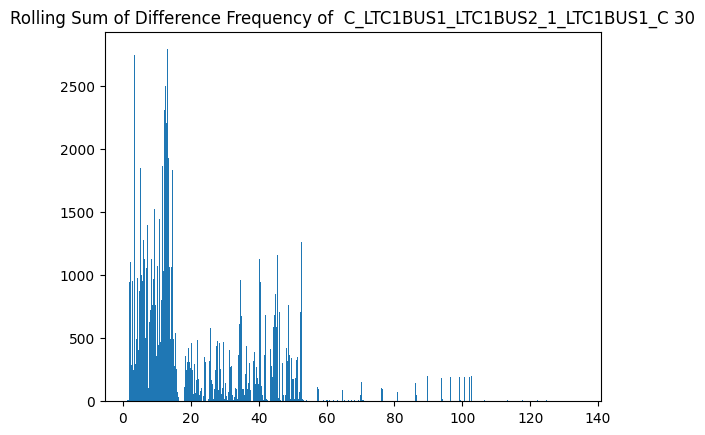

******************************************************************************


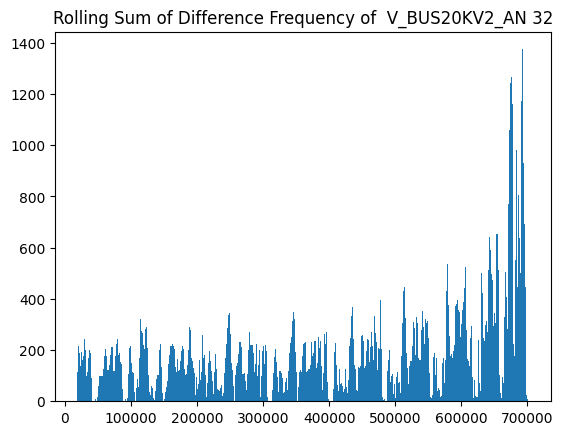

******************************************************************************


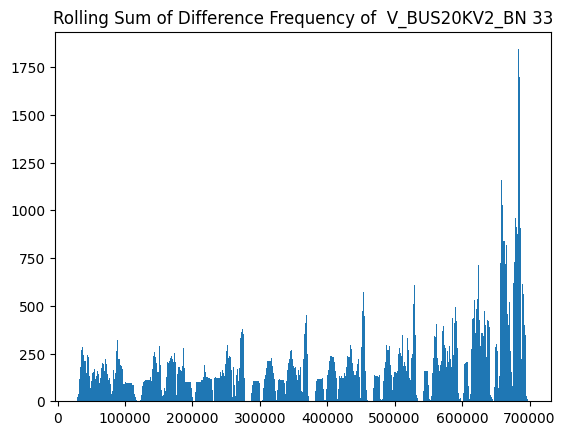

******************************************************************************


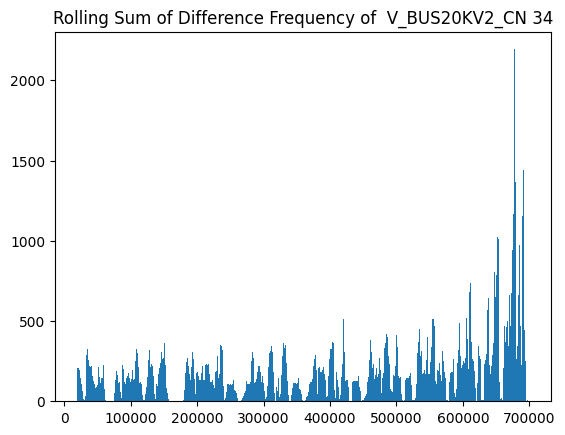

******************************************************************************


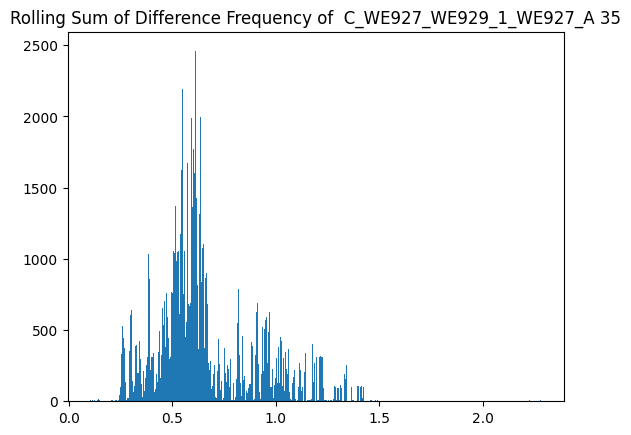

******************************************************************************


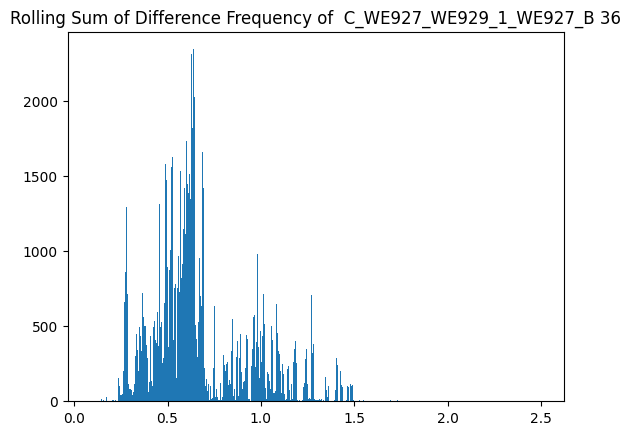

******************************************************************************


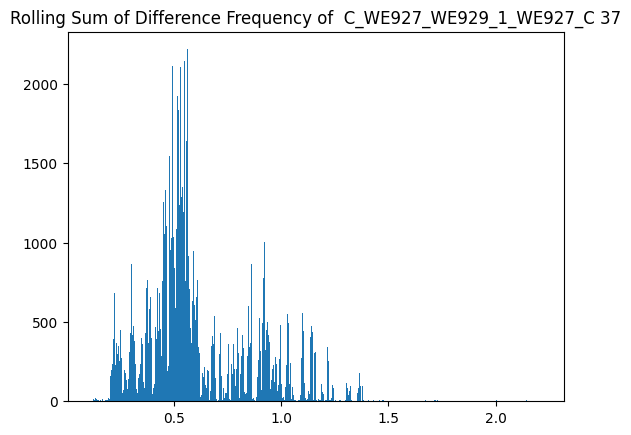

******************************************************************************


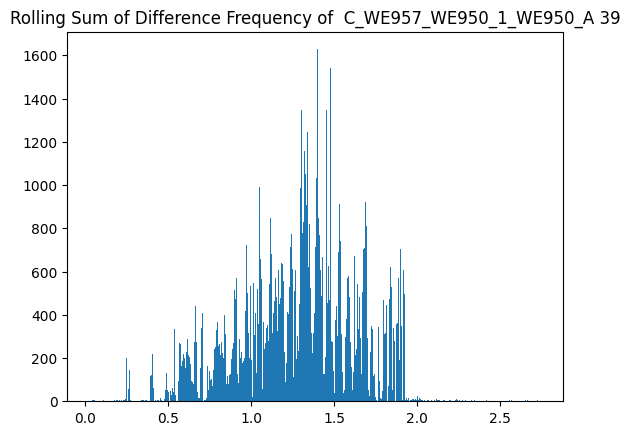

******************************************************************************


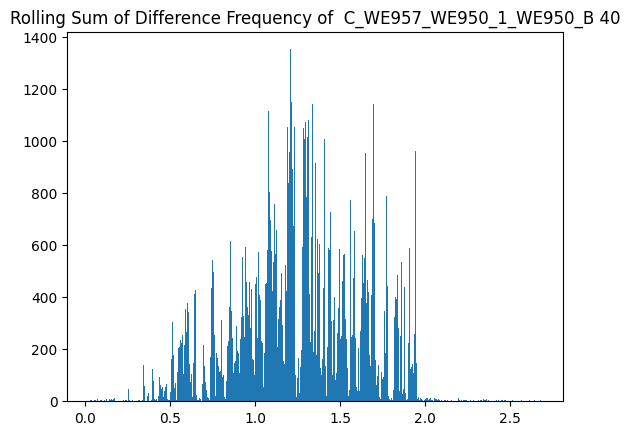

******************************************************************************


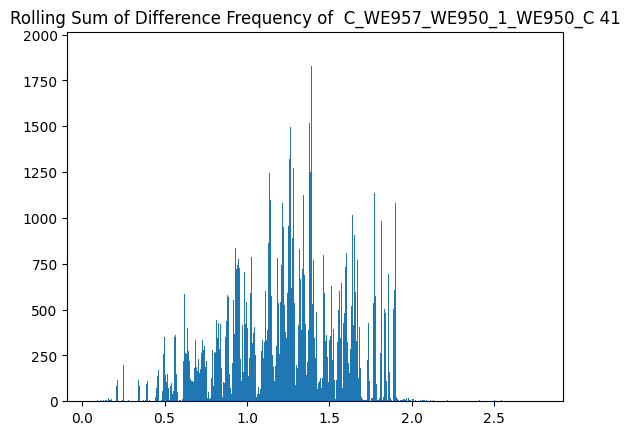

******************************************************************************


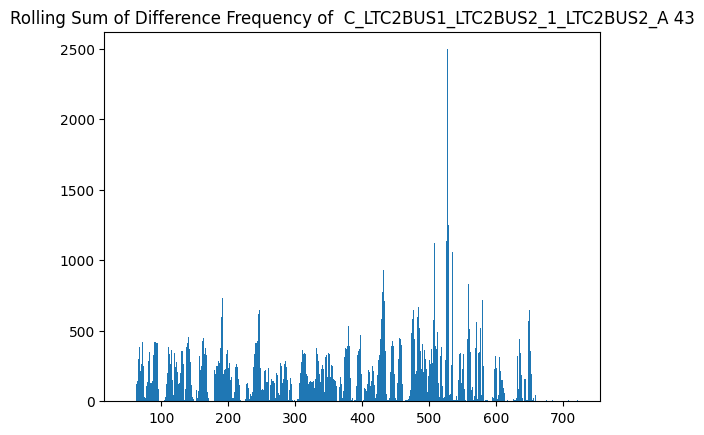

******************************************************************************


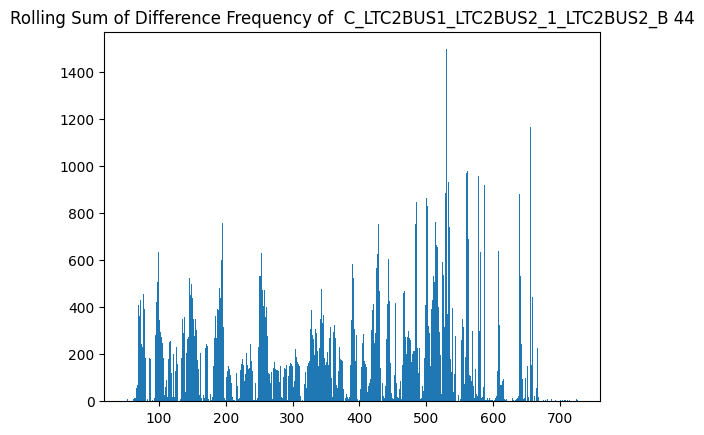

******************************************************************************


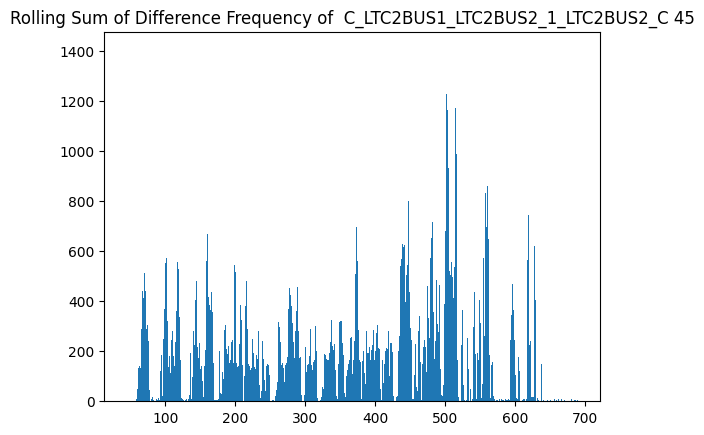

******************************************************************************


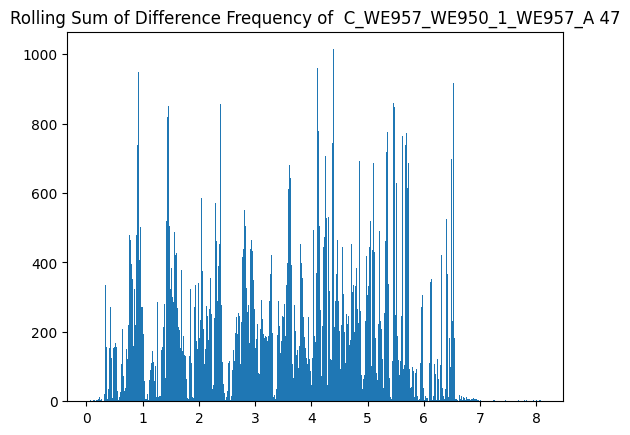

******************************************************************************


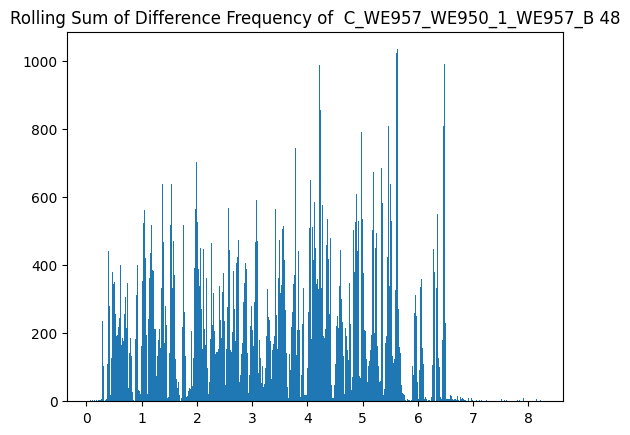

******************************************************************************


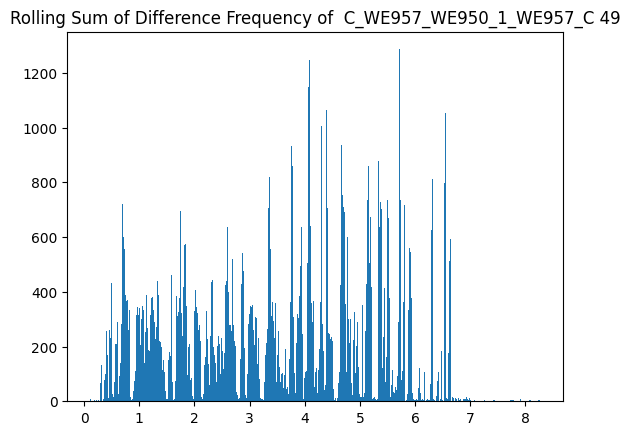

******************************************************************************


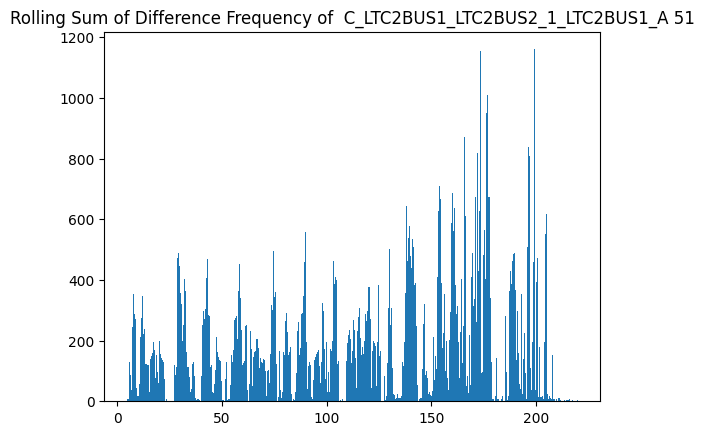

******************************************************************************


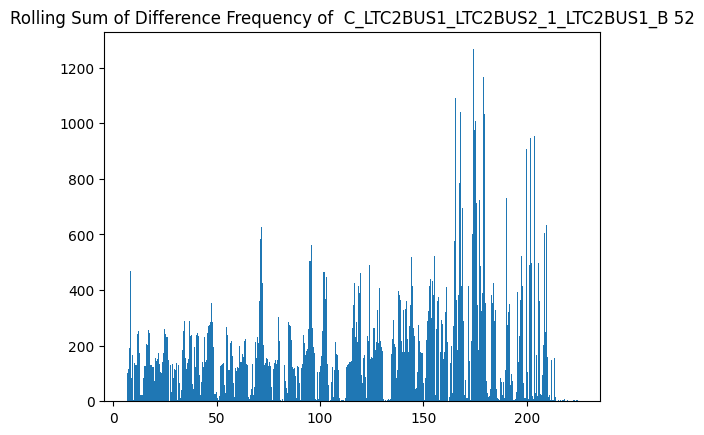

******************************************************************************


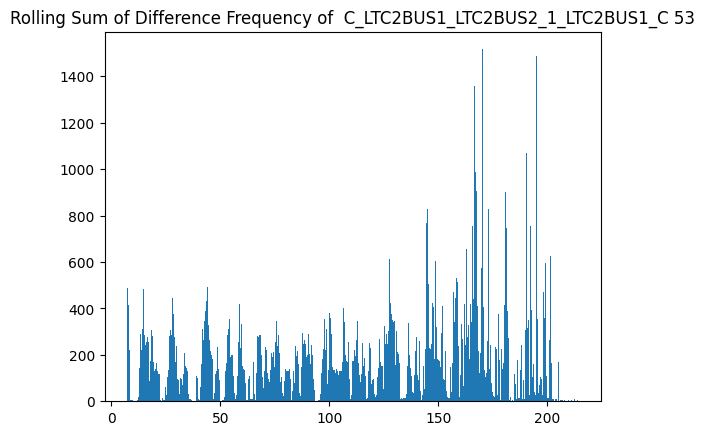

******************************************************************************


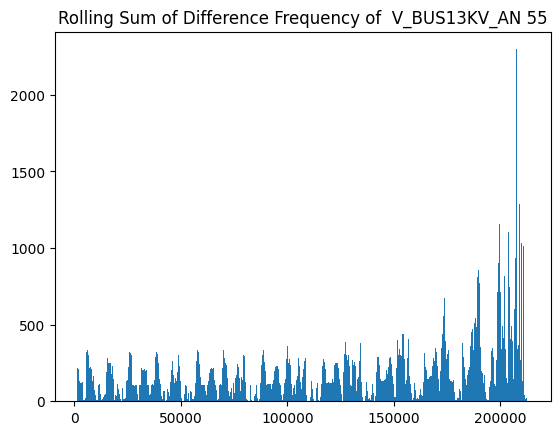

******************************************************************************


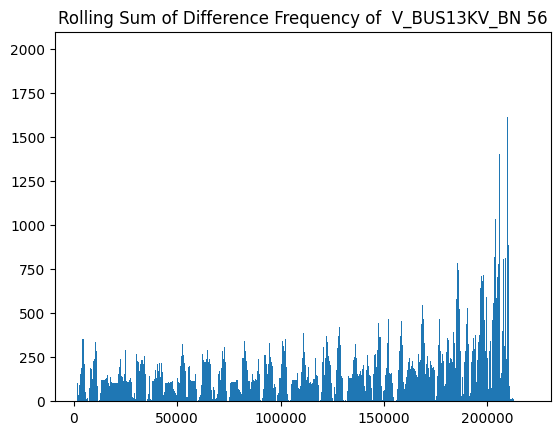

******************************************************************************


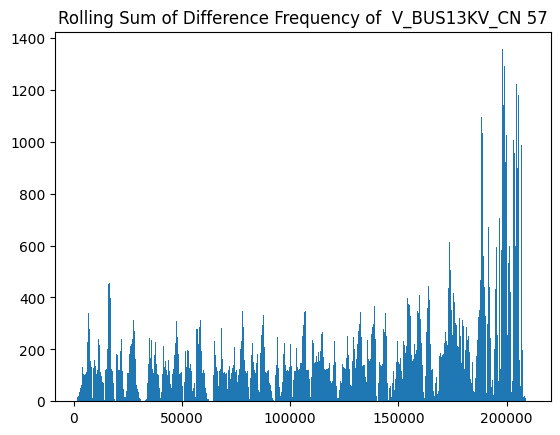

******************************************************************************


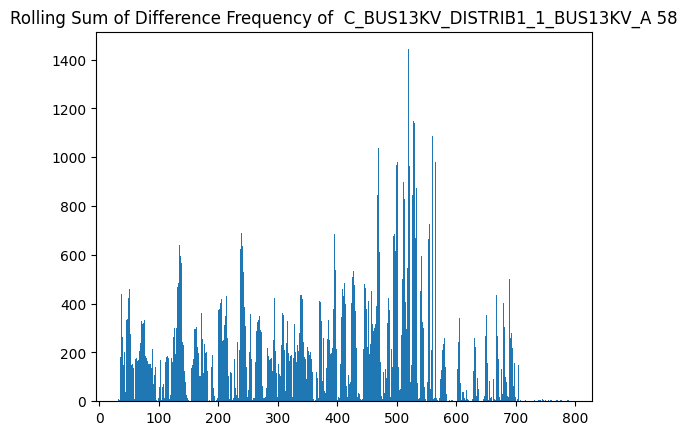

******************************************************************************


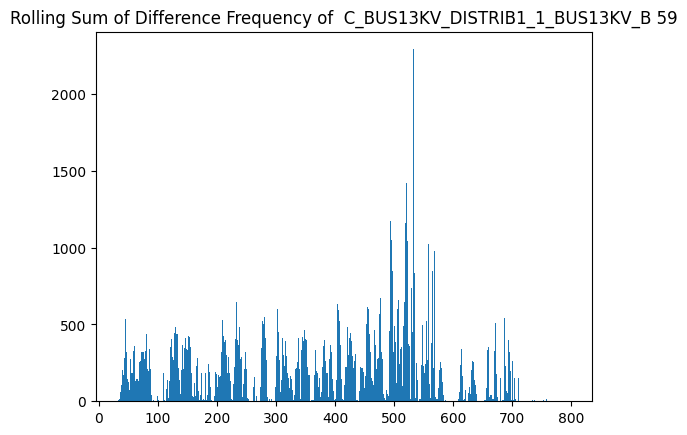

******************************************************************************


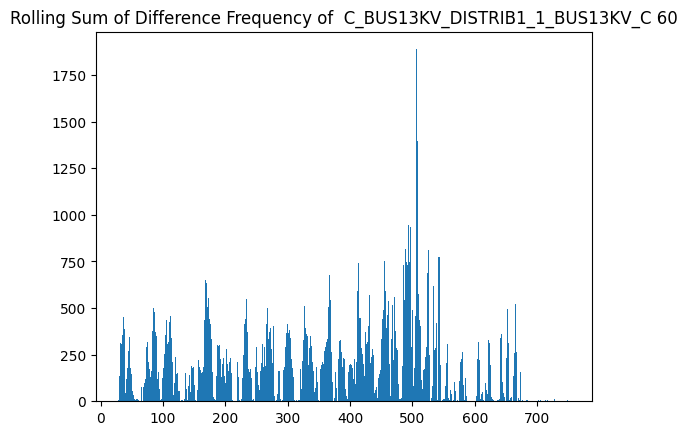

******************************************************************************


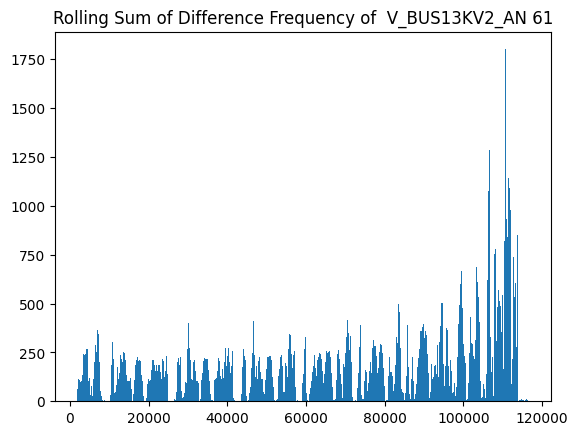

******************************************************************************


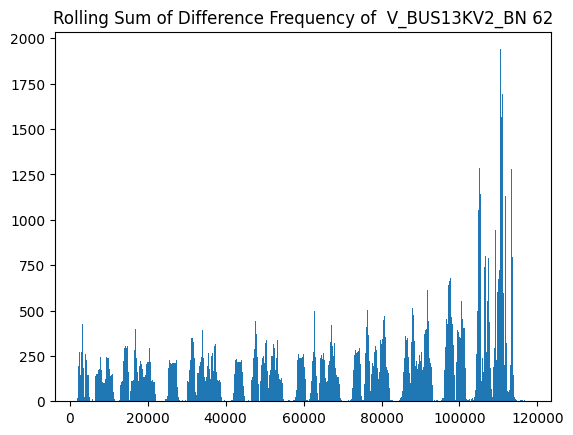

******************************************************************************


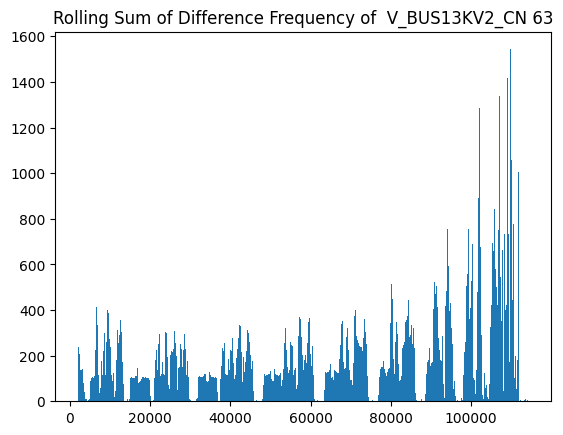

******************************************************************************


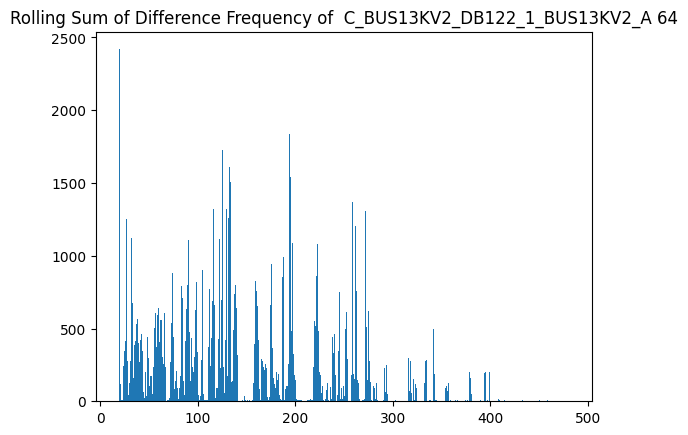

******************************************************************************


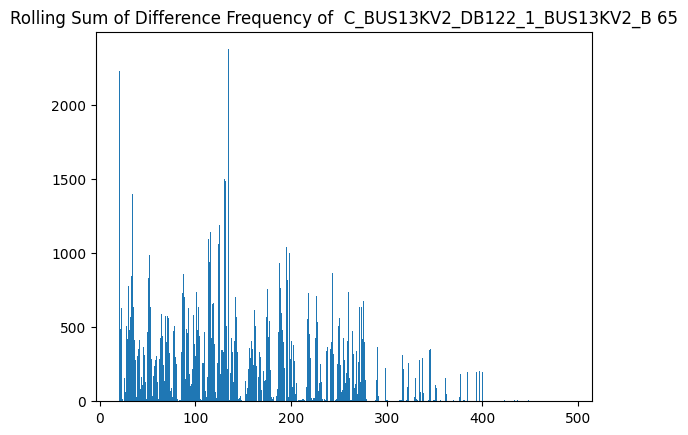

******************************************************************************


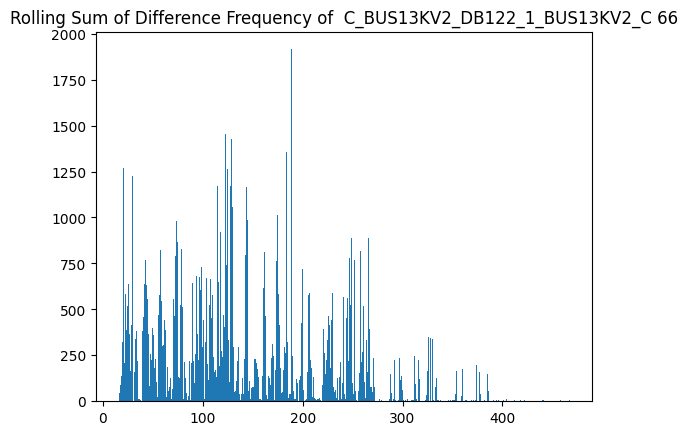

******************************************************************************


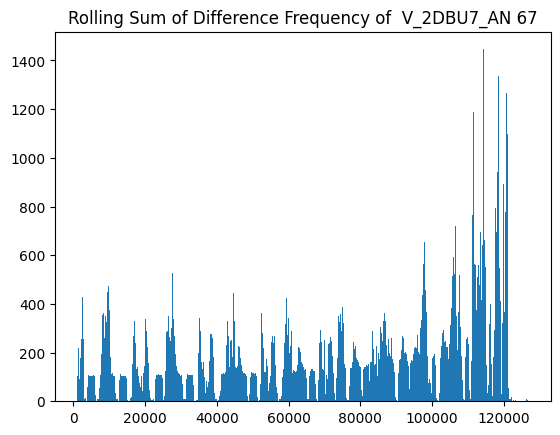

******************************************************************************


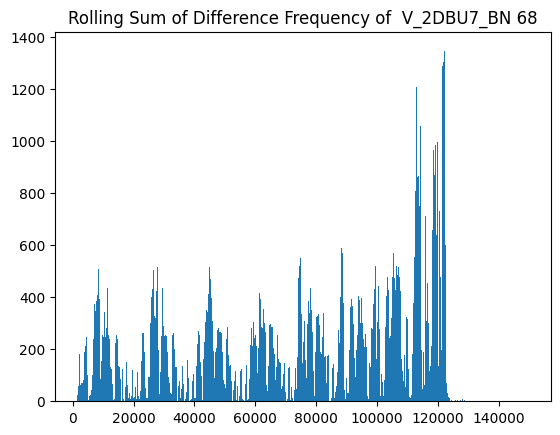

******************************************************************************


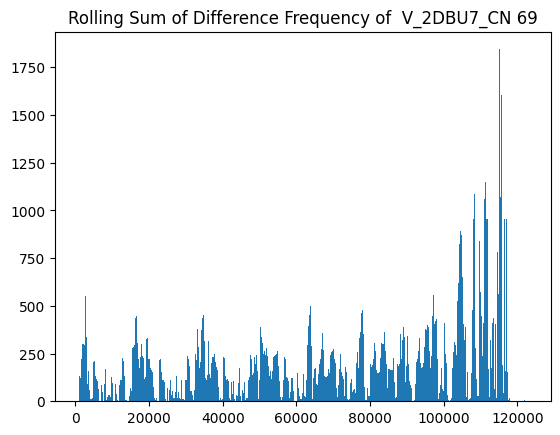

******************************************************************************


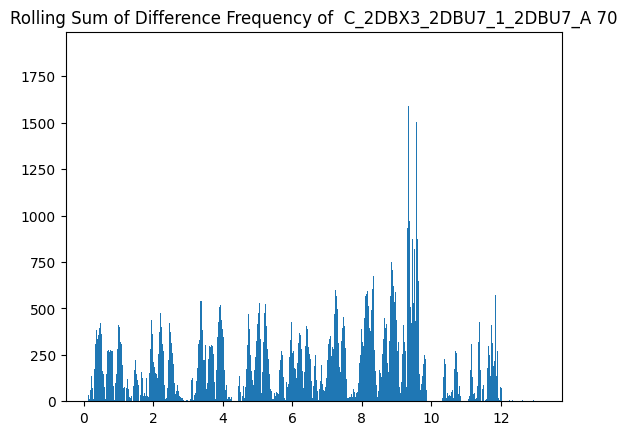

******************************************************************************


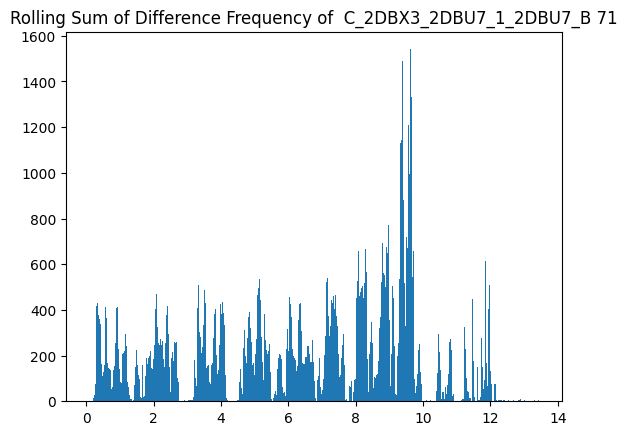

******************************************************************************


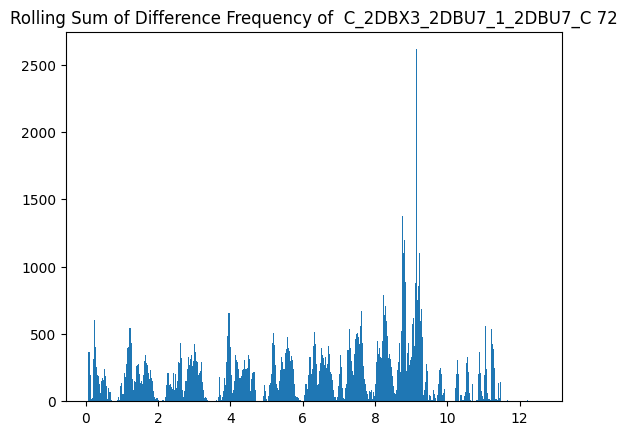

******************************************************************************


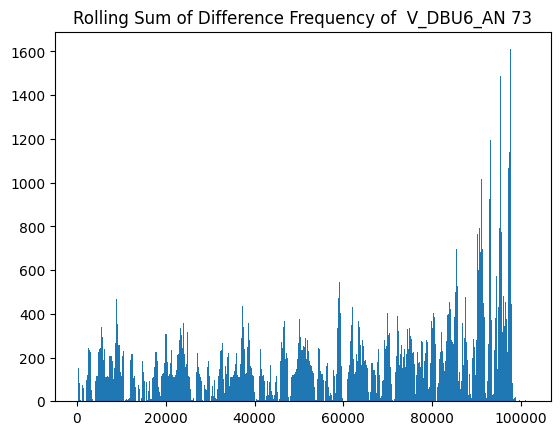

******************************************************************************


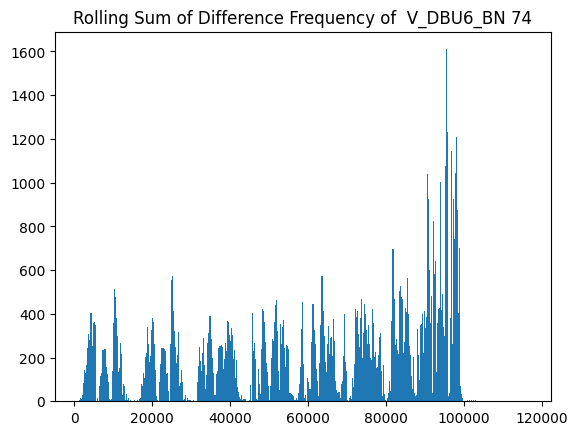

******************************************************************************


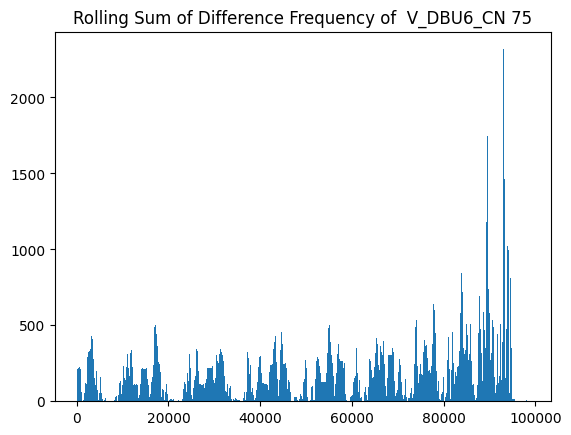

******************************************************************************


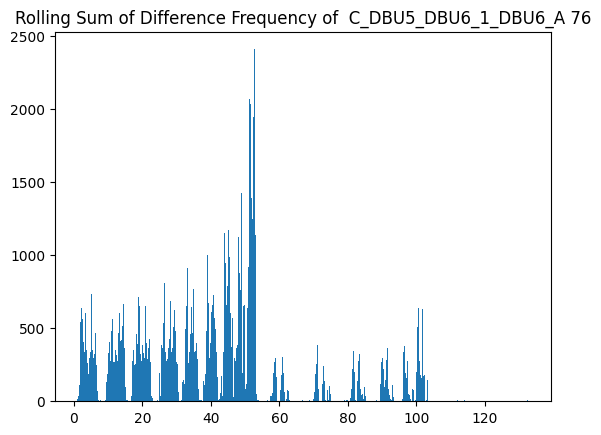

******************************************************************************


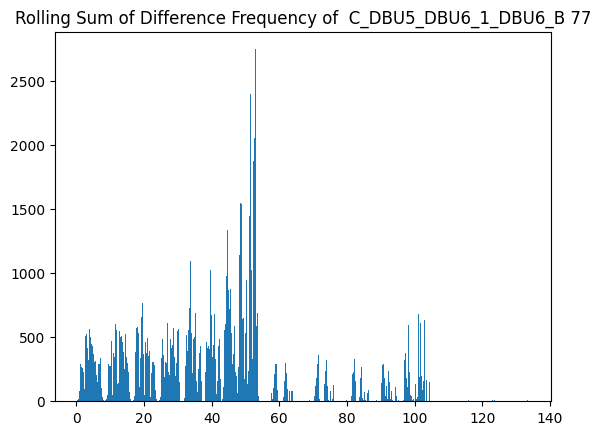

******************************************************************************


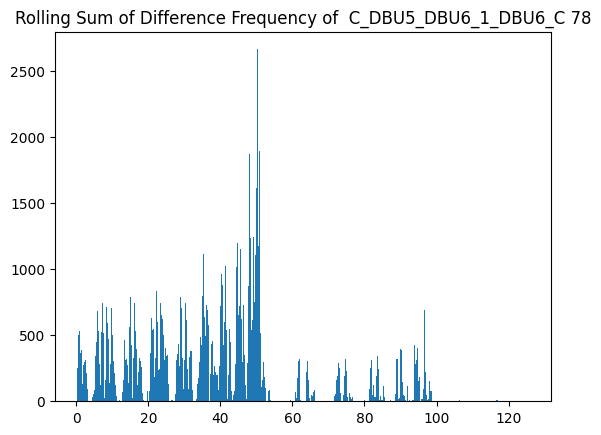

******************************************************************************


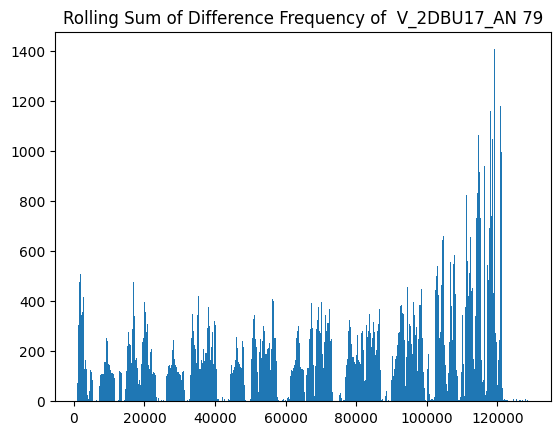

******************************************************************************


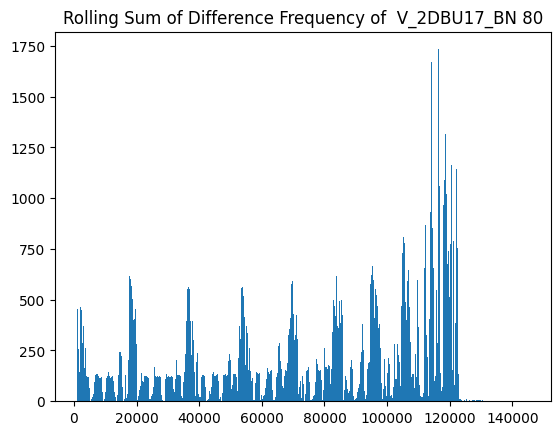

******************************************************************************


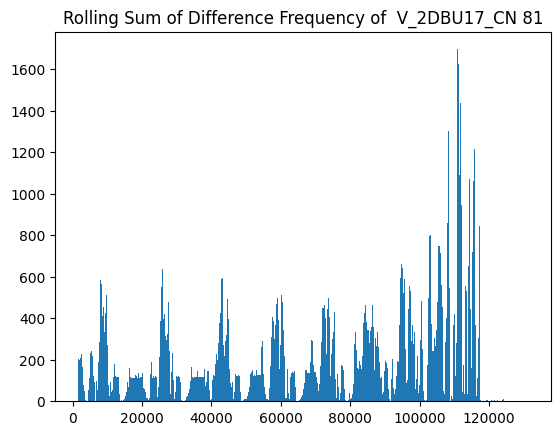

******************************************************************************


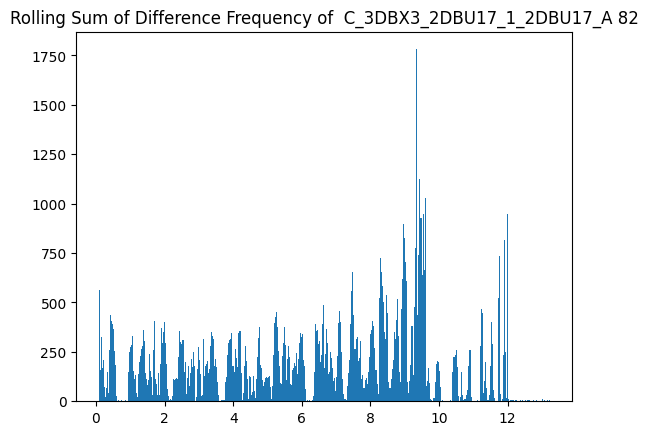

******************************************************************************


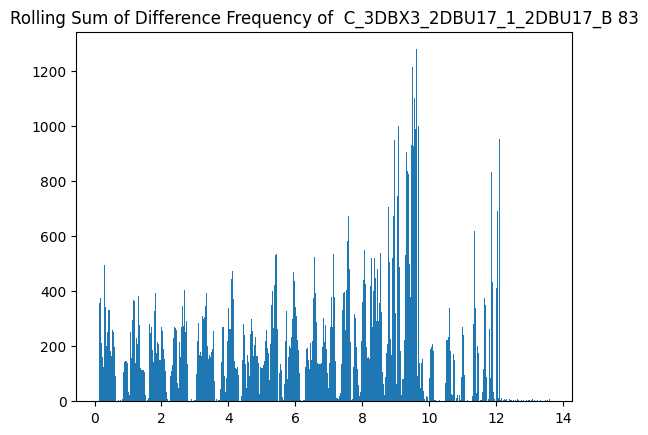

******************************************************************************


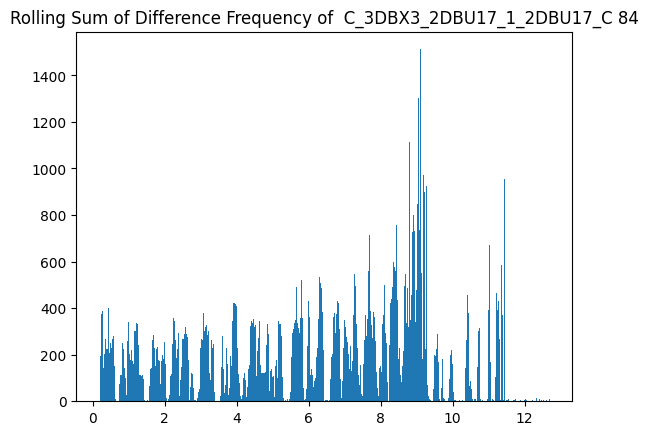

******************************************************************************


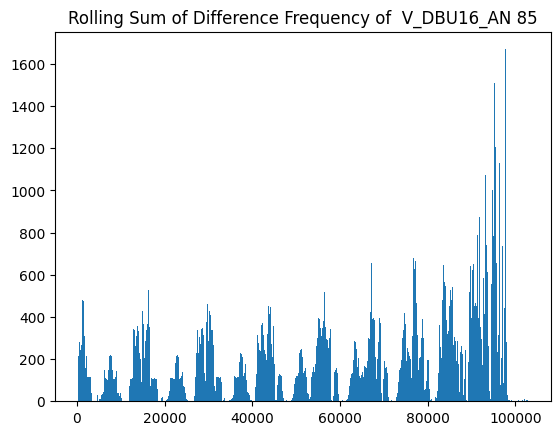

******************************************************************************


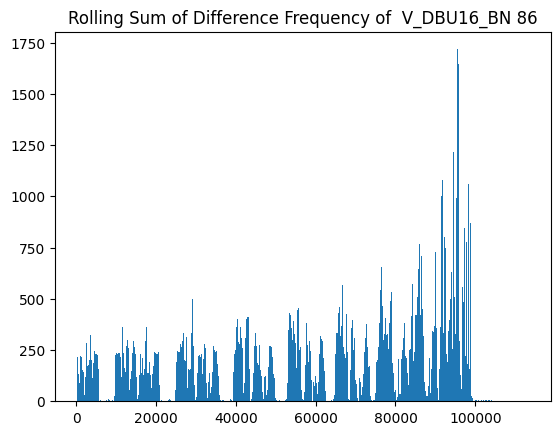

******************************************************************************


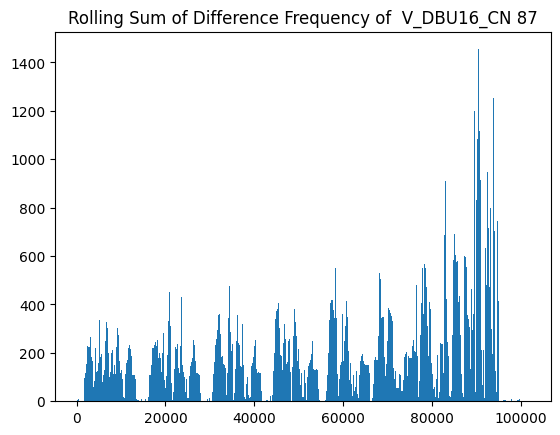

******************************************************************************


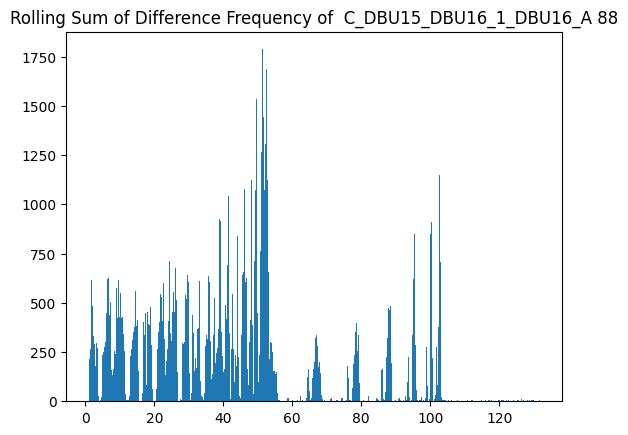

******************************************************************************


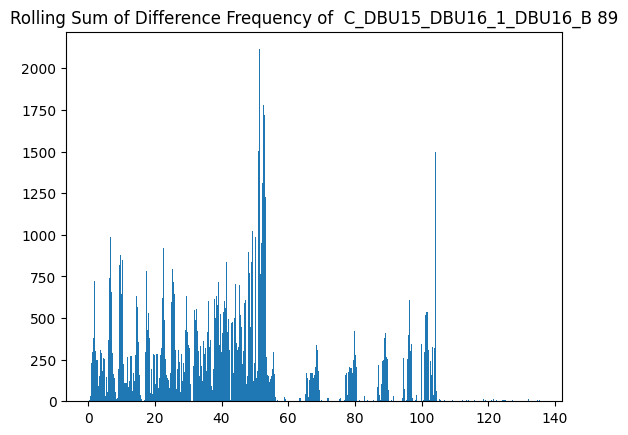

******************************************************************************


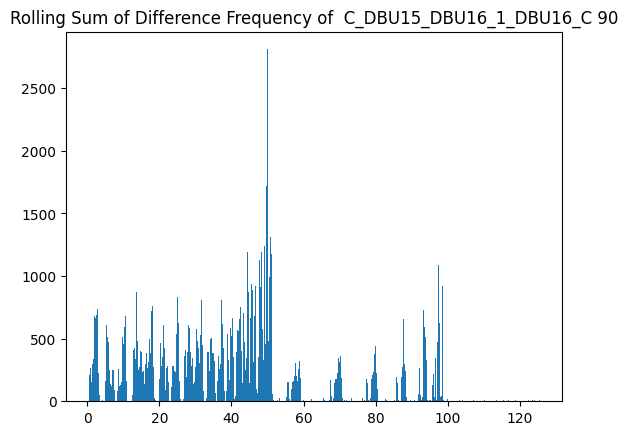

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [56]:
window = 350
w = 1

cov_fn = covariance_pair
thresholds_cov, cov_multi_list = get_threshold_stat_only(weights, data, cov_fn, cols,
              window, adj_list=c_adj_list, plot=True, collate_fn="sum")
thresholds_cov_99, cov_multi_list = get_threshold_stat_only(weights, data, cov_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.99, axis=1, stat_list=cov_multi_list, collate_fn="sum")
thresholds_cov_95, cov_multi_list = get_threshold_stat_only(weights, data, cov_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.95, axis=1, stat_list=cov_multi_list, collate_fn="sum")

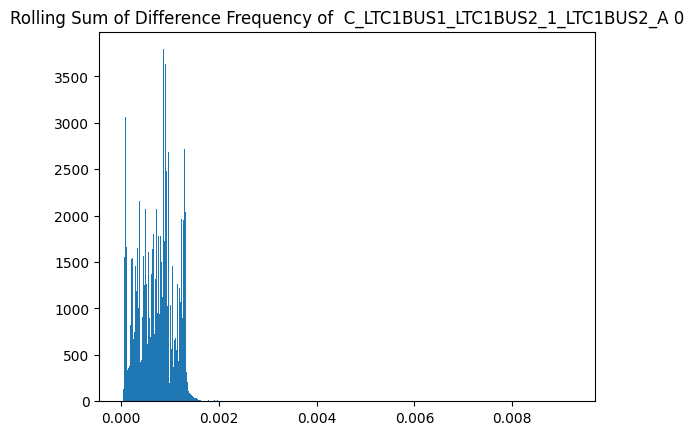

******************************************************************************


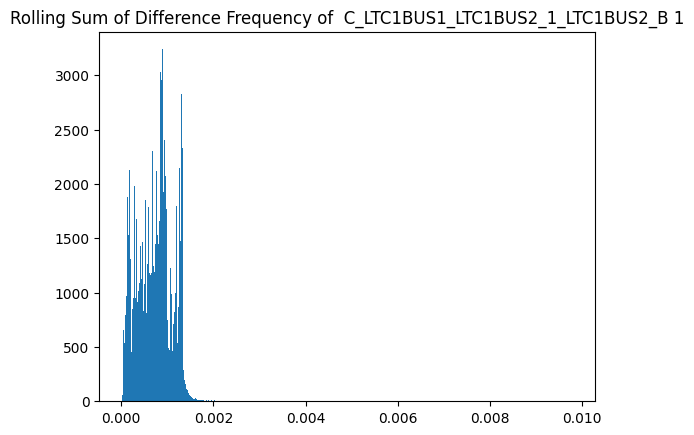

******************************************************************************


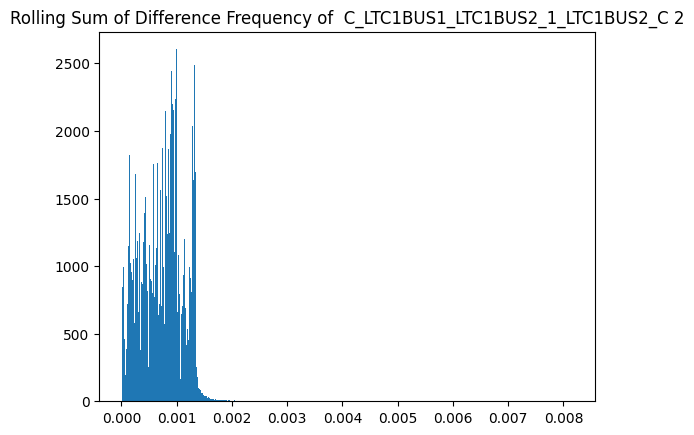

******************************************************************************


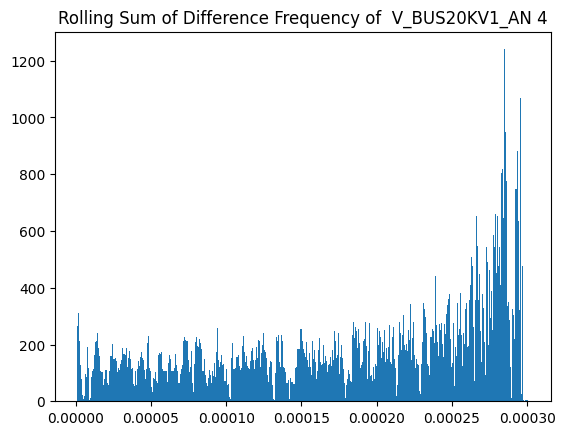

******************************************************************************


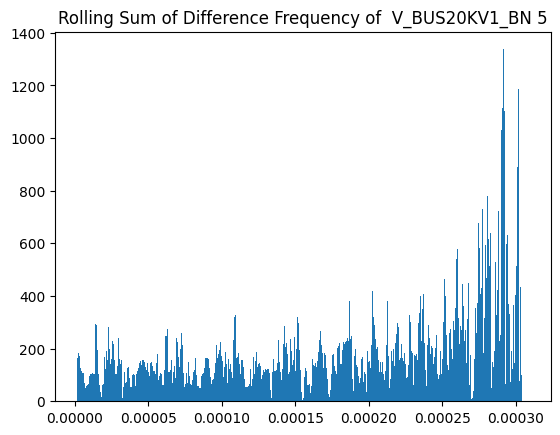

******************************************************************************


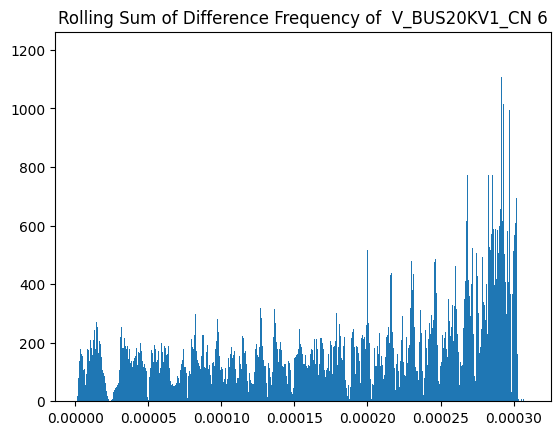

******************************************************************************


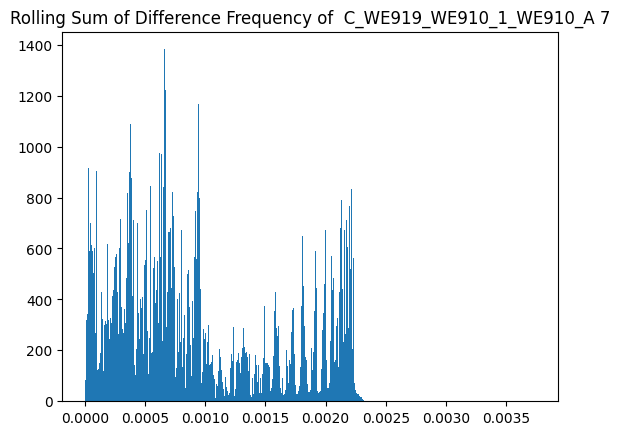

******************************************************************************


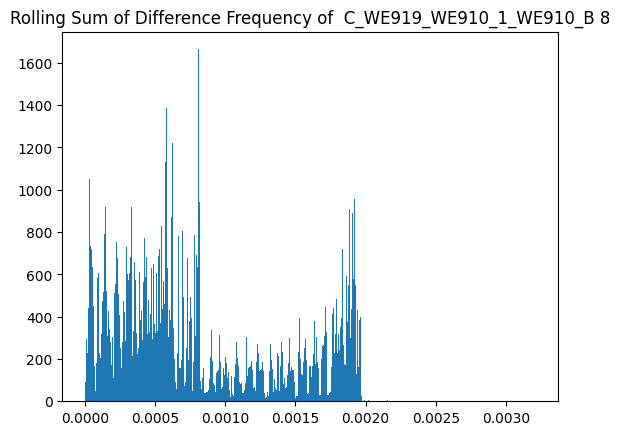

******************************************************************************


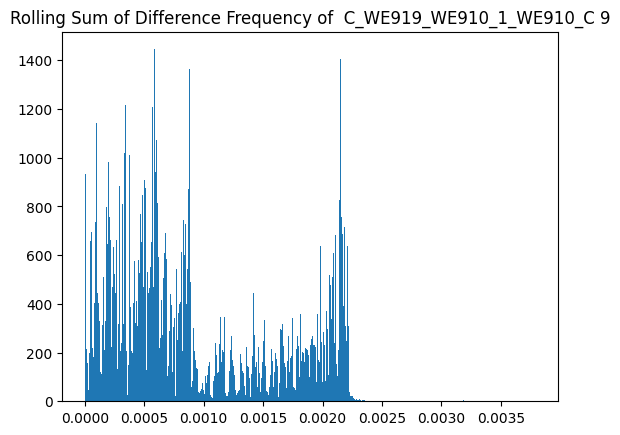

******************************************************************************


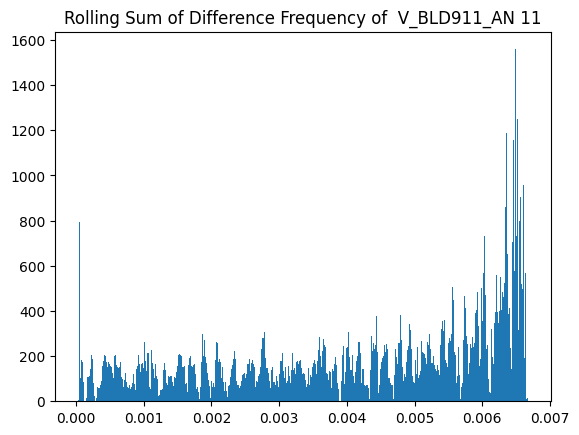

******************************************************************************


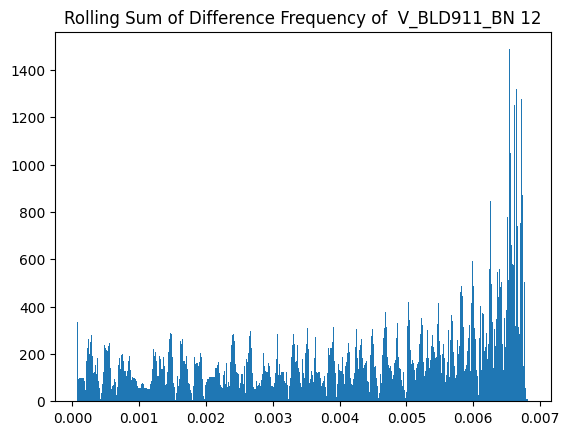

******************************************************************************


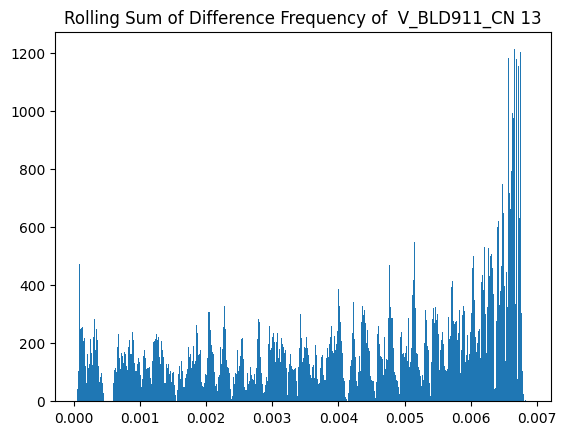

******************************************************************************


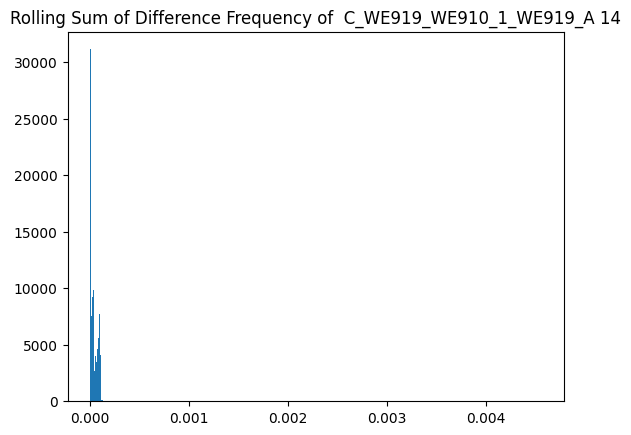

******************************************************************************


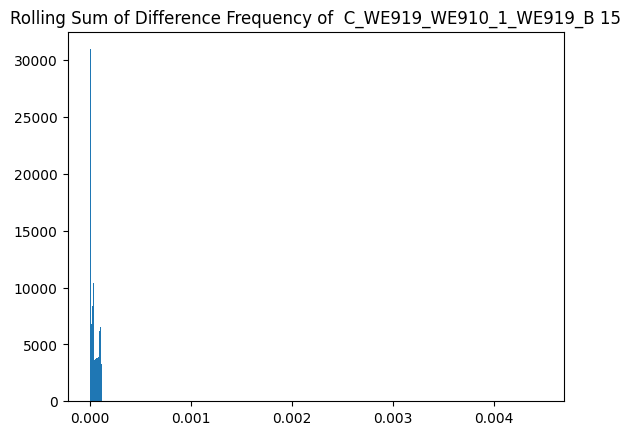

******************************************************************************


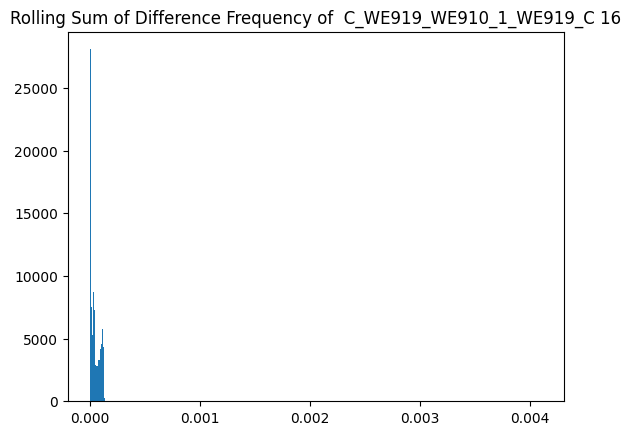

******************************************************************************


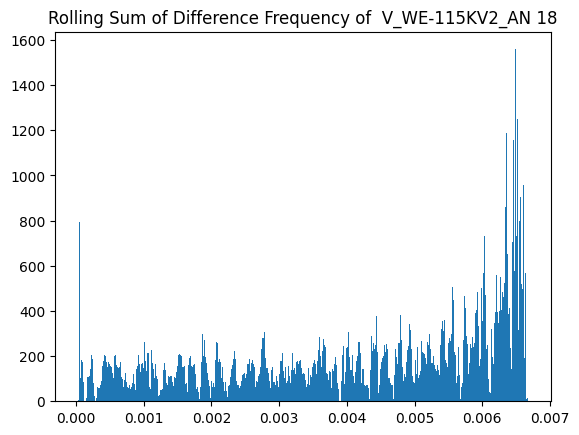

******************************************************************************


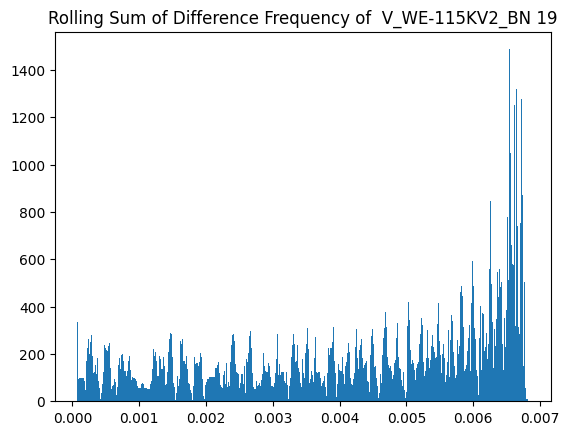

******************************************************************************


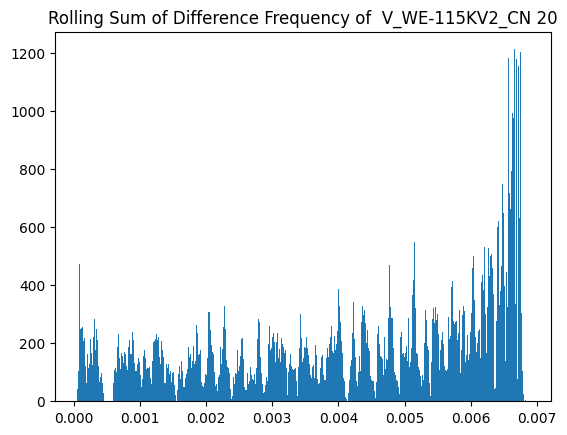

******************************************************************************


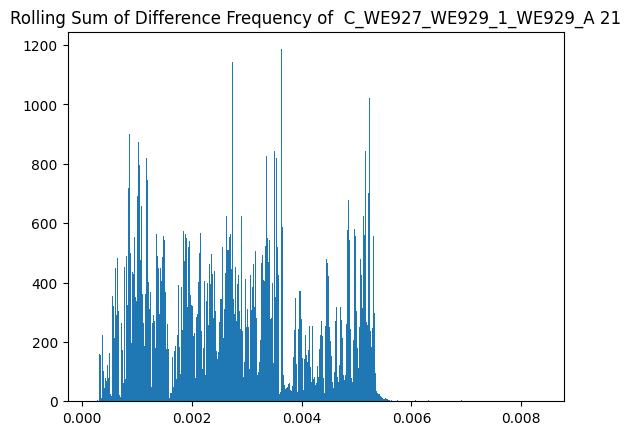

******************************************************************************


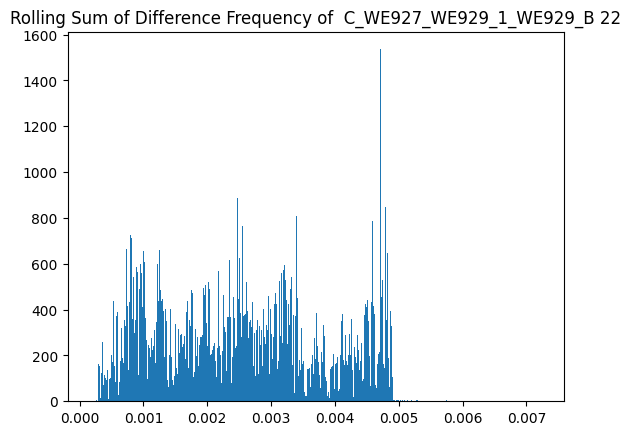

******************************************************************************


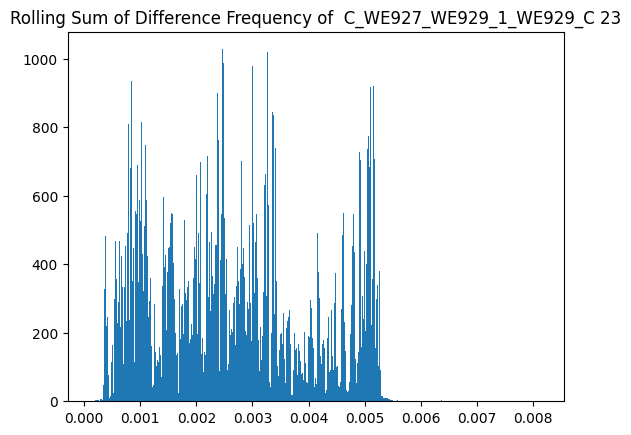

******************************************************************************


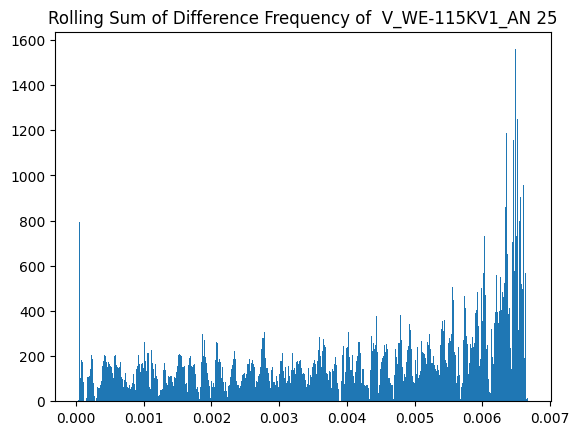

******************************************************************************


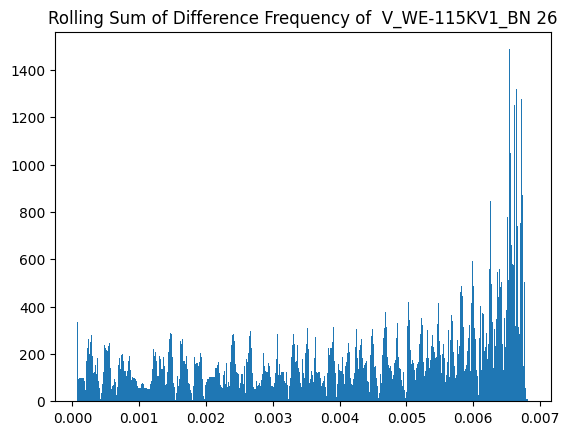

******************************************************************************


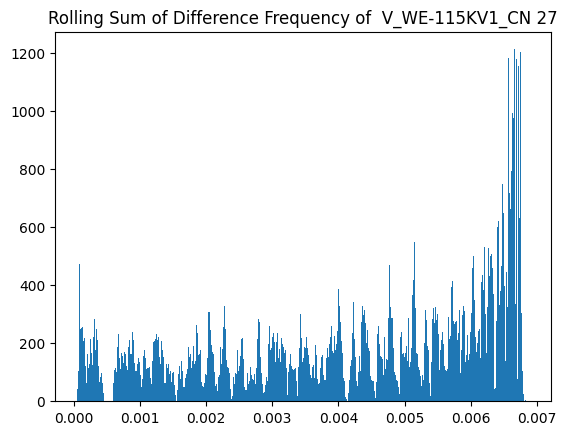

******************************************************************************


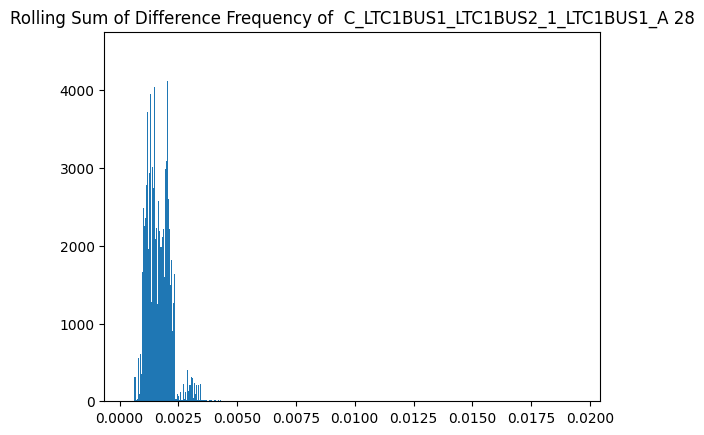

******************************************************************************


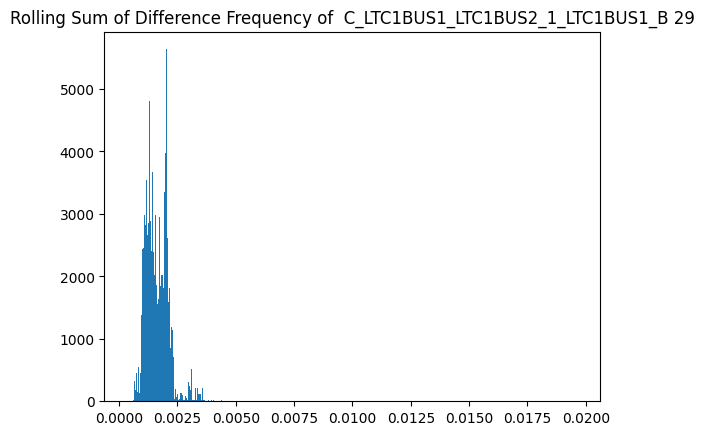

******************************************************************************


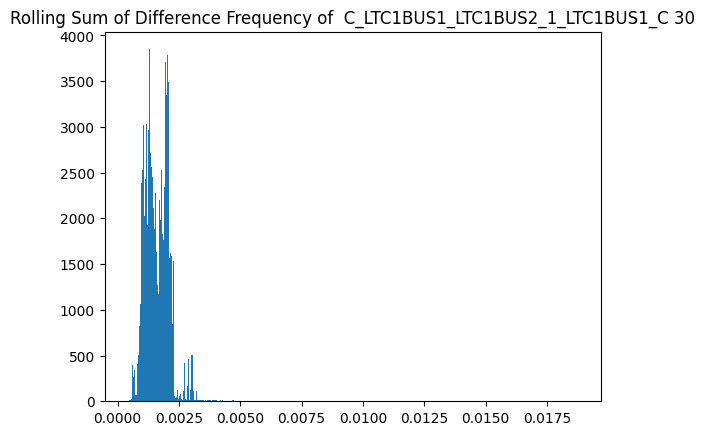

******************************************************************************


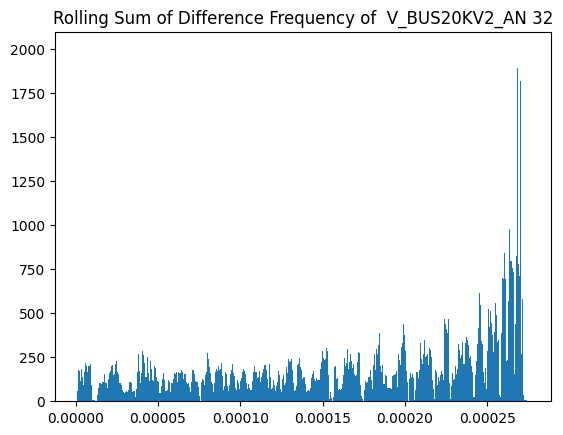

******************************************************************************


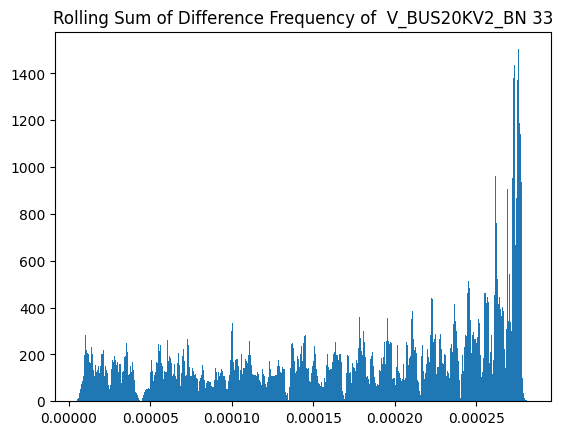

******************************************************************************


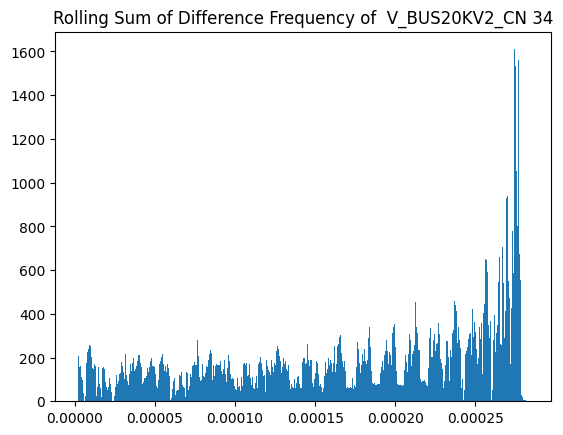

******************************************************************************


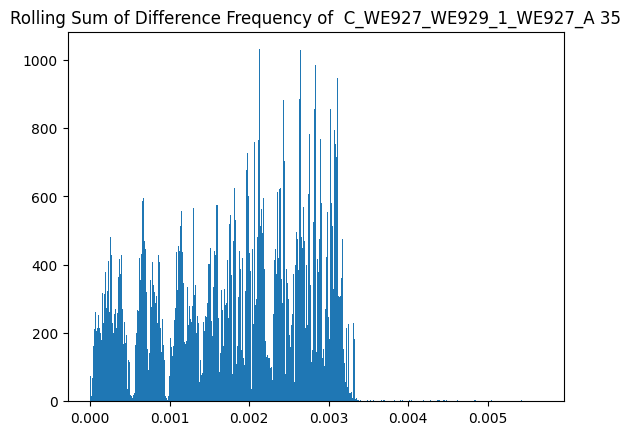

******************************************************************************


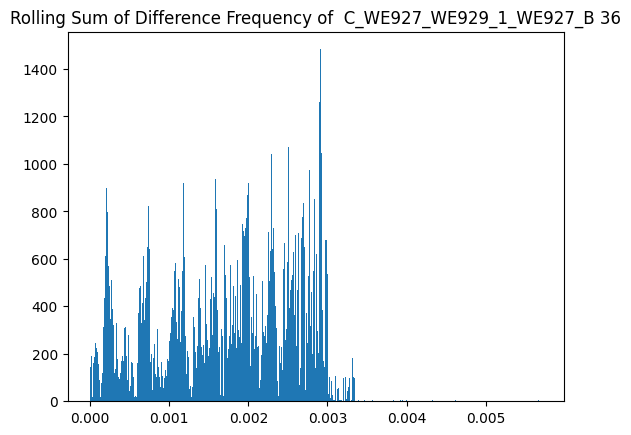

******************************************************************************


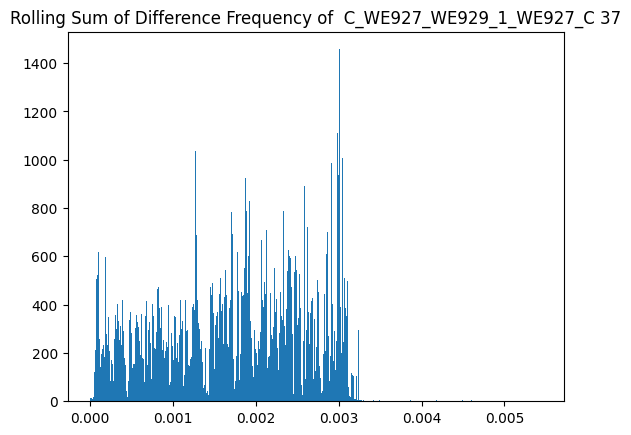

******************************************************************************


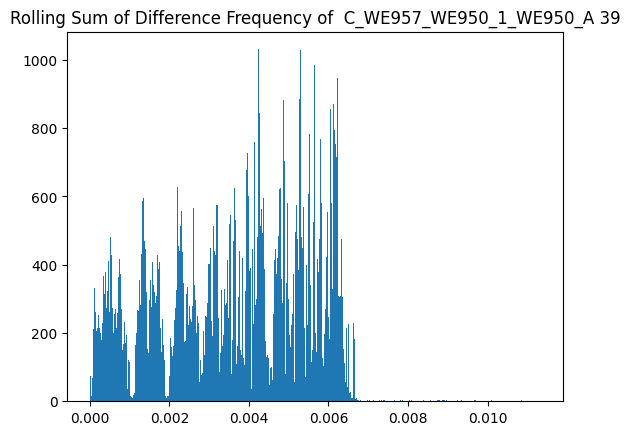

******************************************************************************


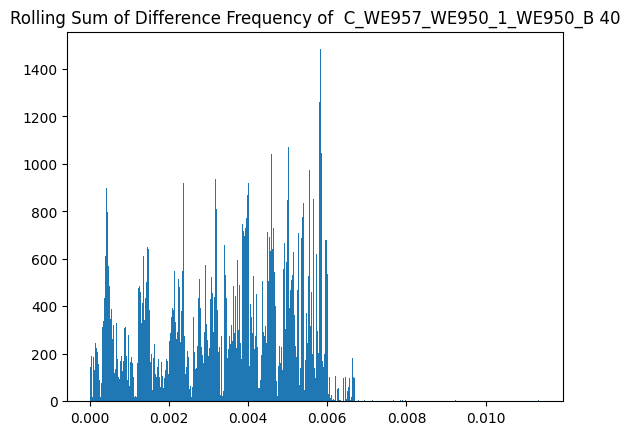

******************************************************************************


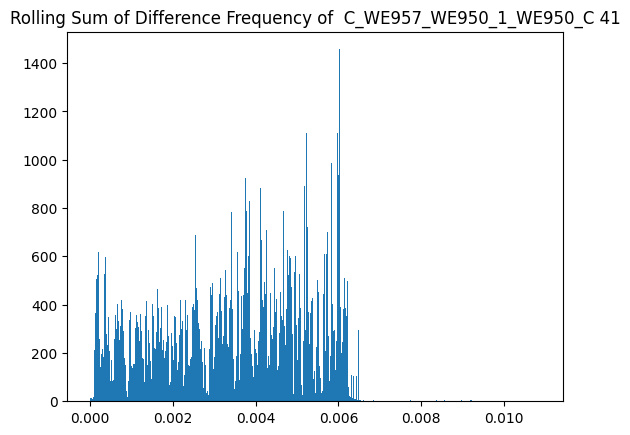

******************************************************************************


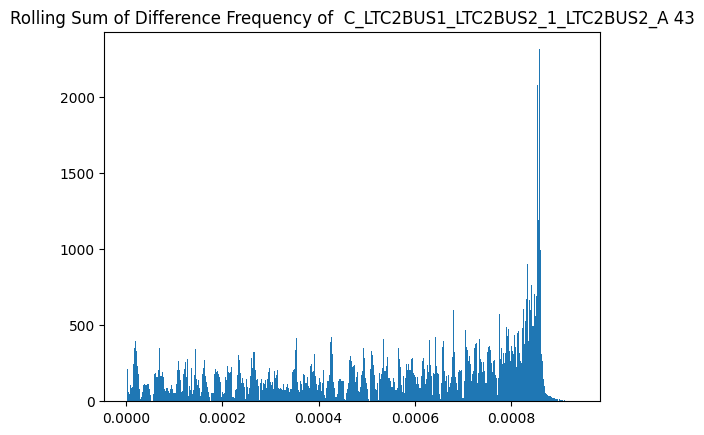

******************************************************************************


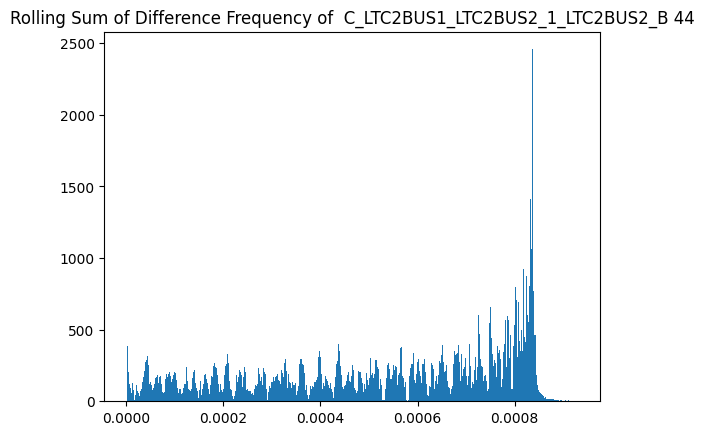

******************************************************************************


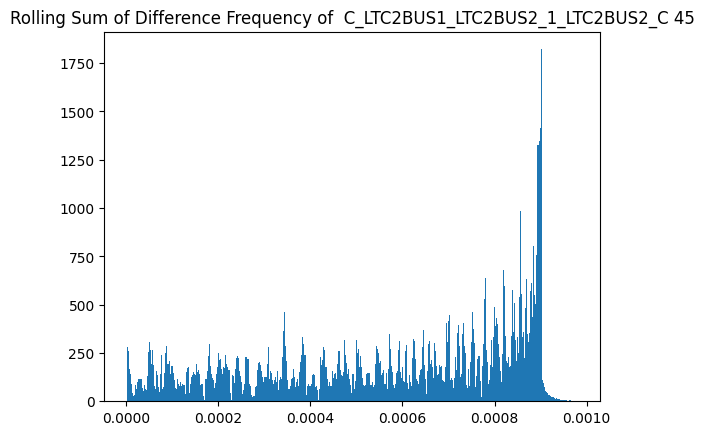

******************************************************************************


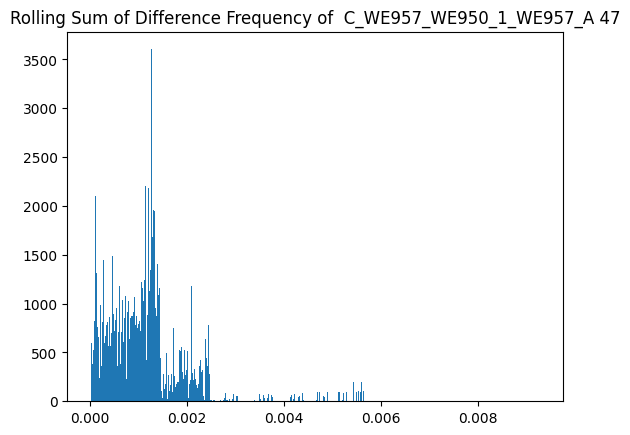

******************************************************************************


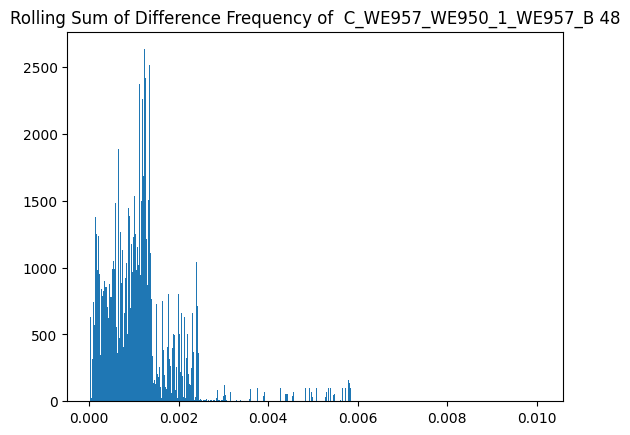

******************************************************************************


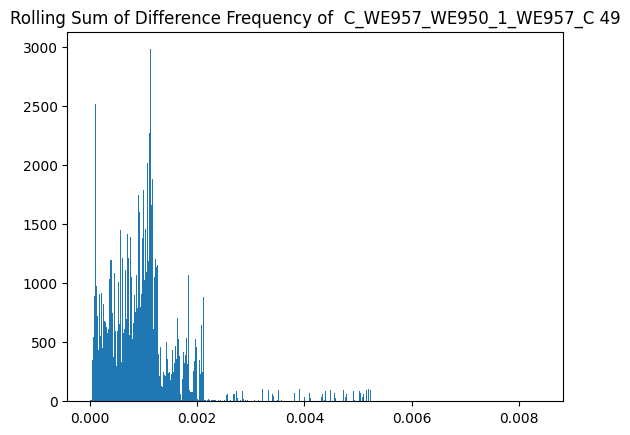

******************************************************************************


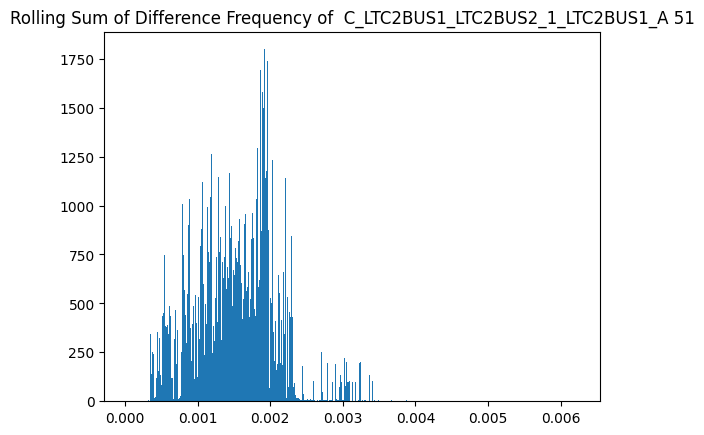

******************************************************************************


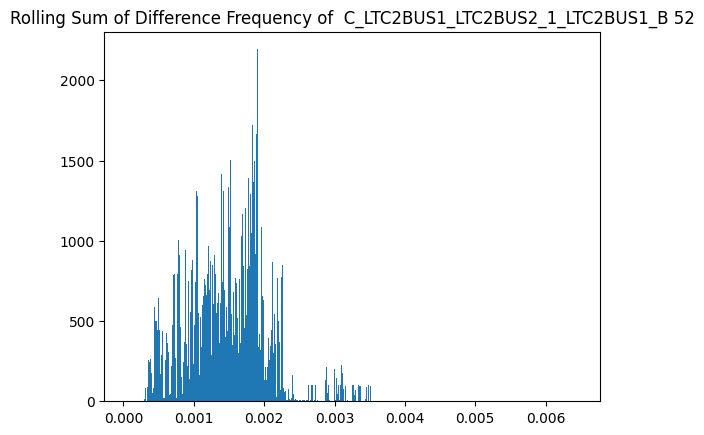

******************************************************************************


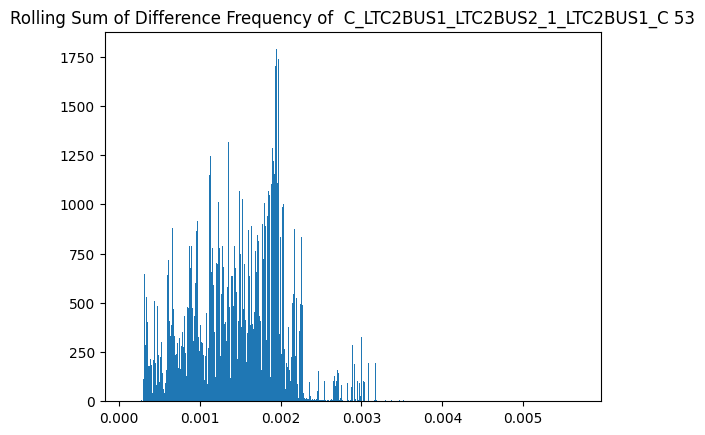

******************************************************************************


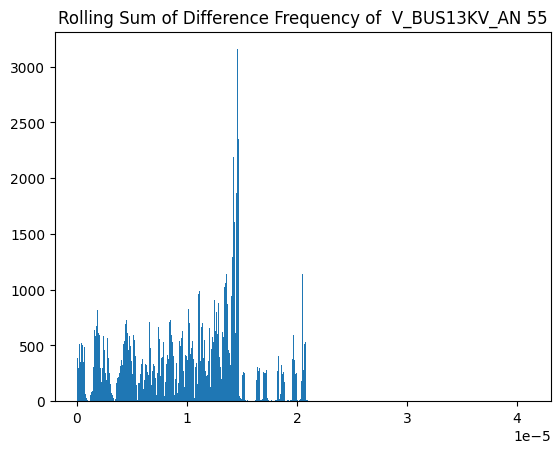

******************************************************************************


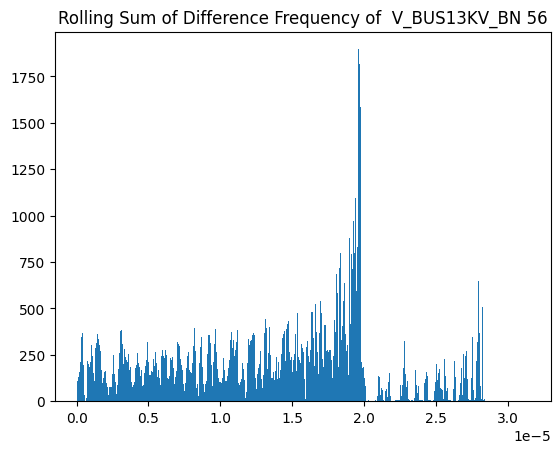

******************************************************************************


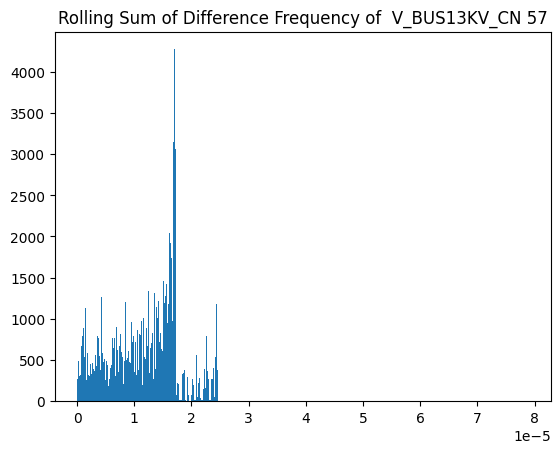

******************************************************************************


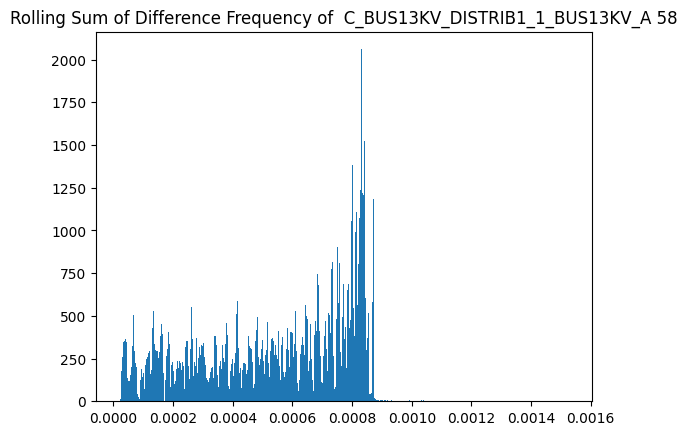

******************************************************************************


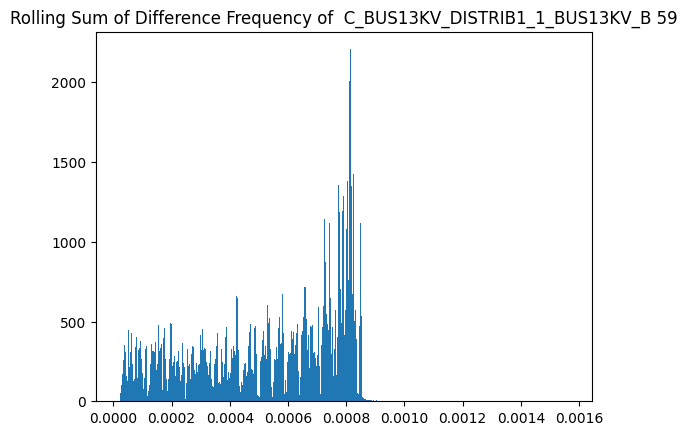

******************************************************************************


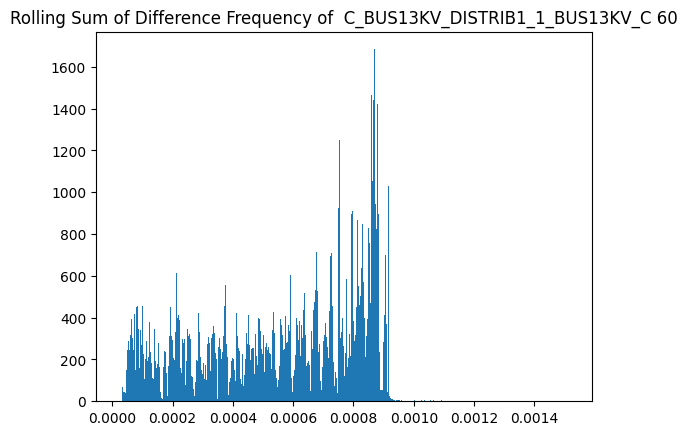

******************************************************************************


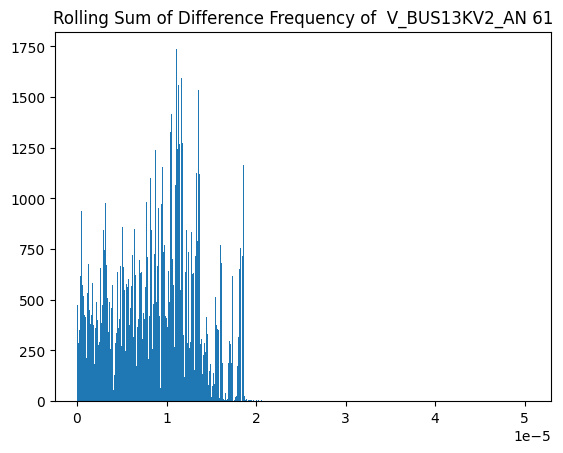

******************************************************************************


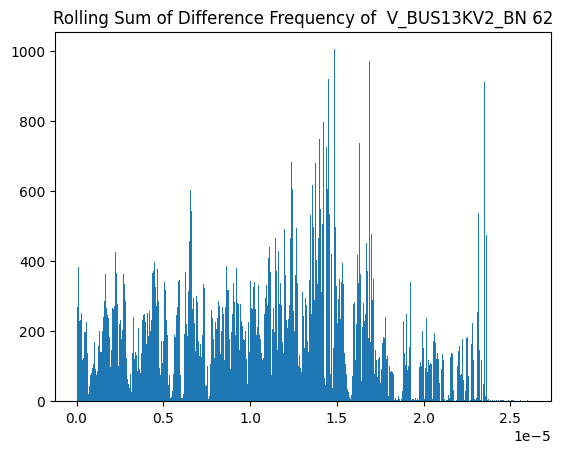

******************************************************************************


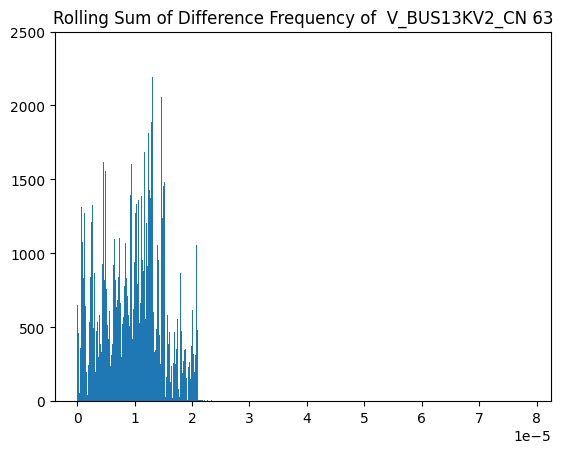

******************************************************************************


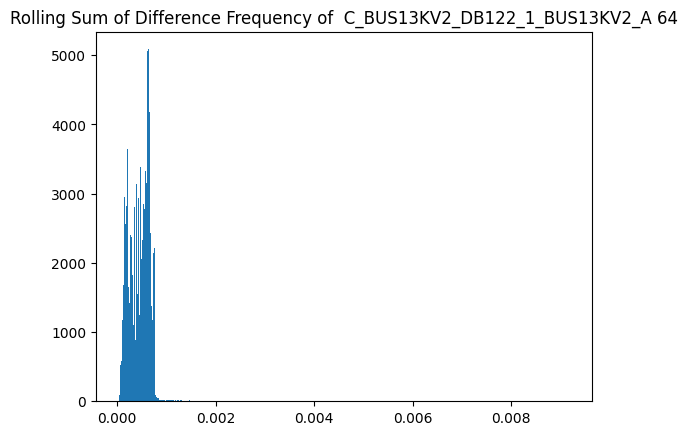

******************************************************************************


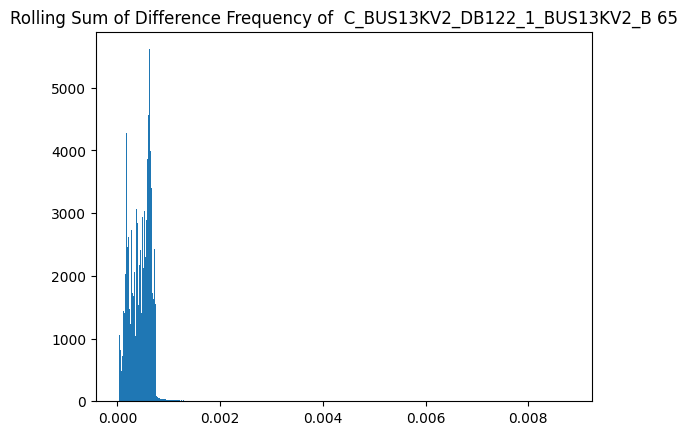

******************************************************************************


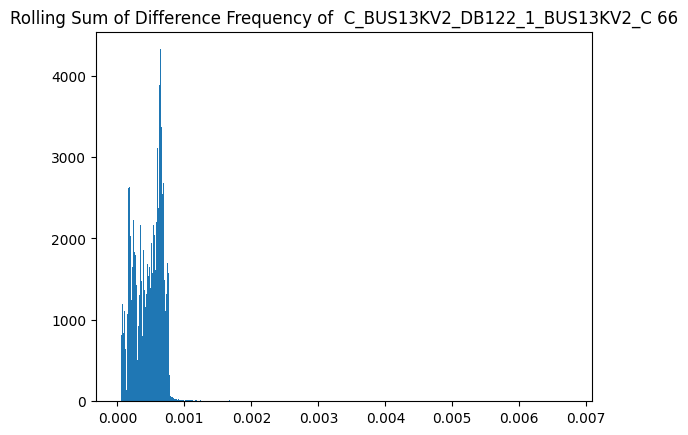

******************************************************************************


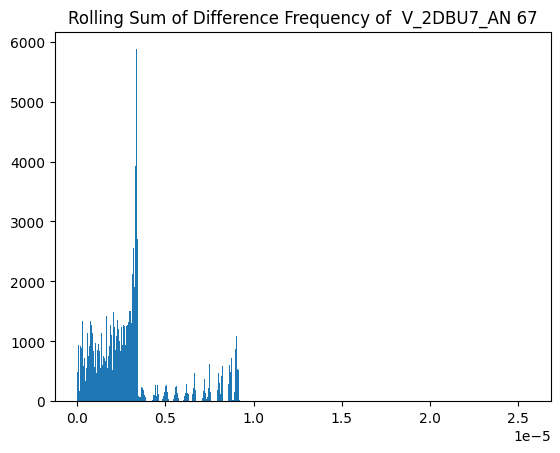

******************************************************************************


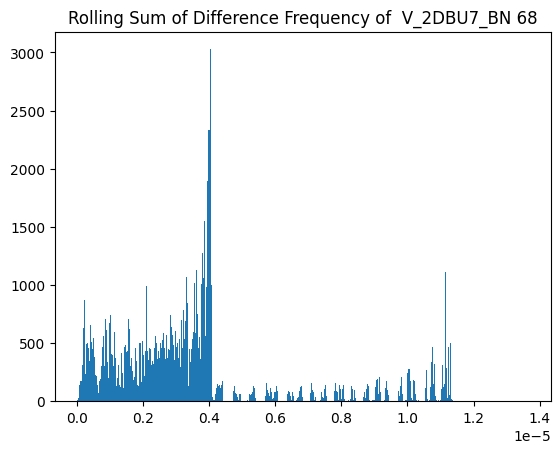

******************************************************************************


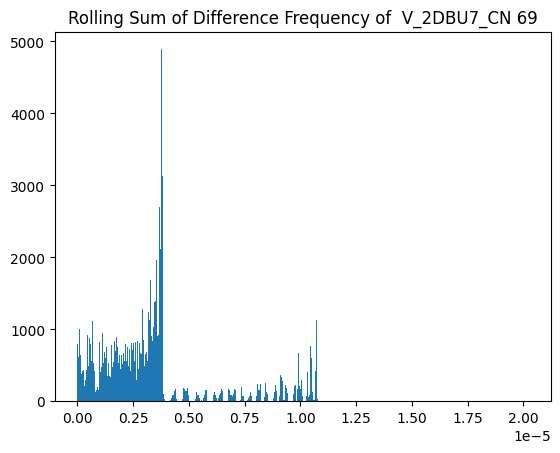

******************************************************************************


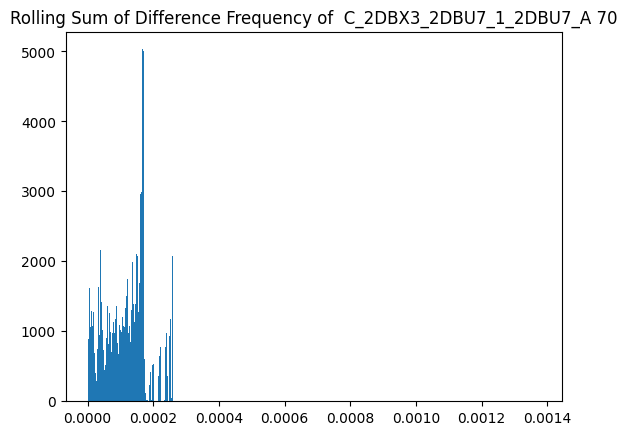

******************************************************************************


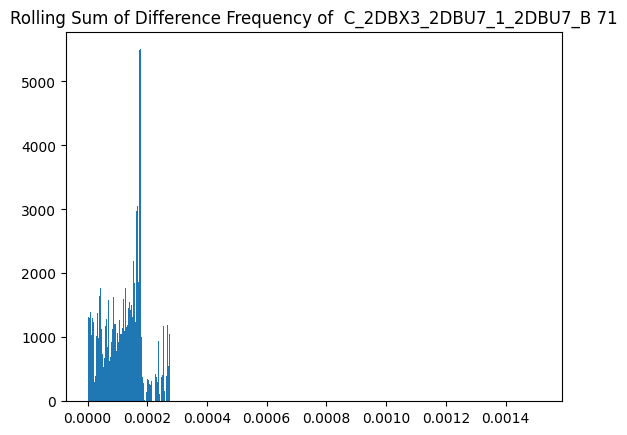

******************************************************************************


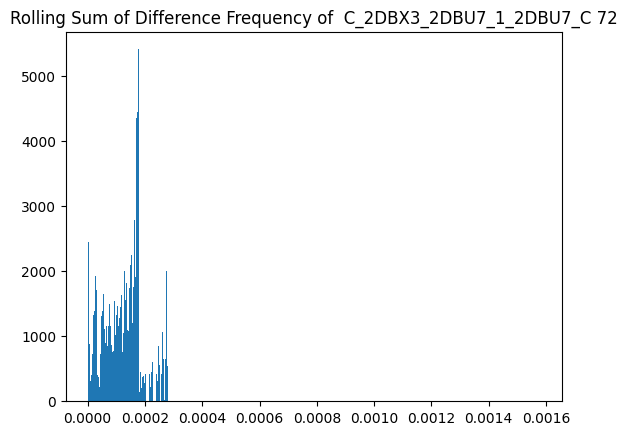

******************************************************************************


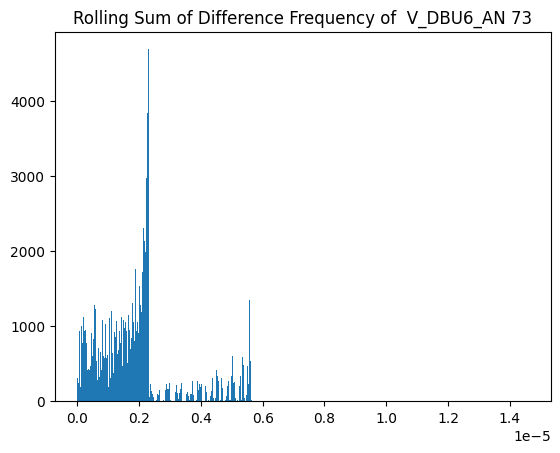

******************************************************************************


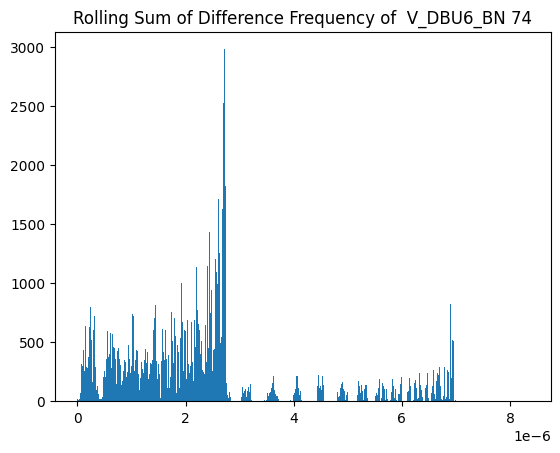

******************************************************************************


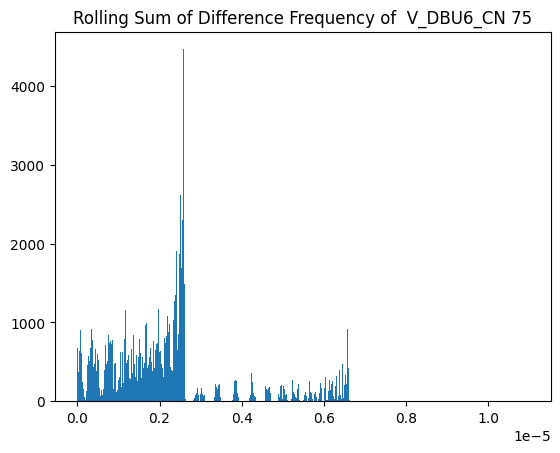

******************************************************************************


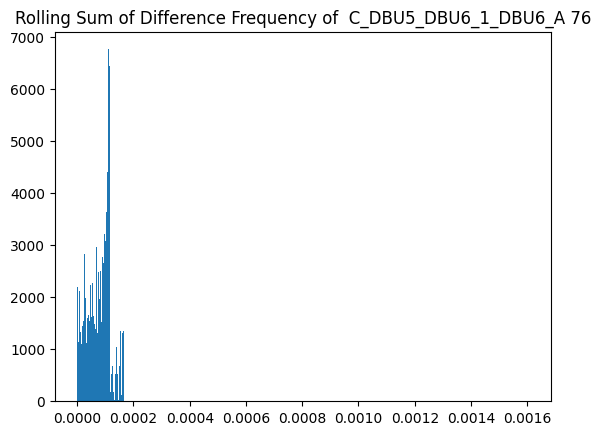

******************************************************************************


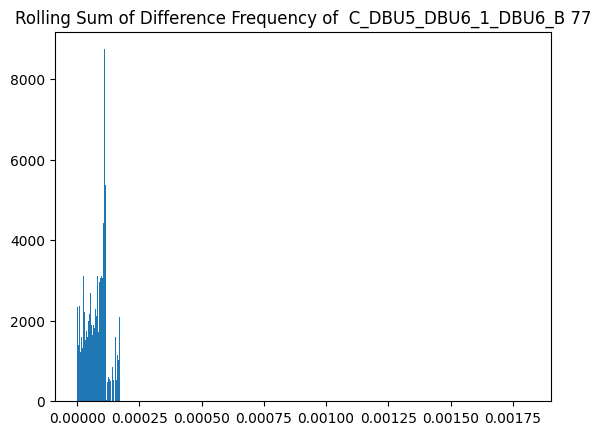

******************************************************************************


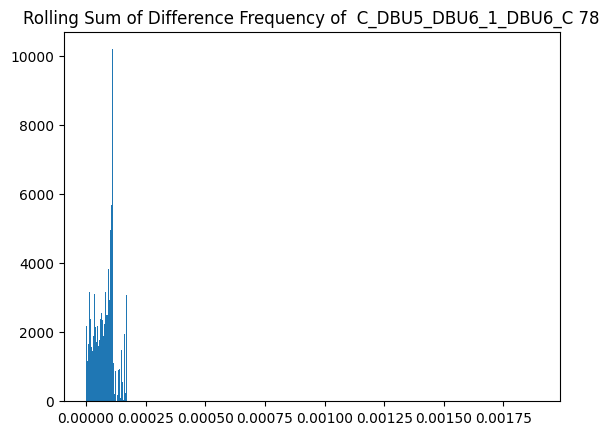

******************************************************************************


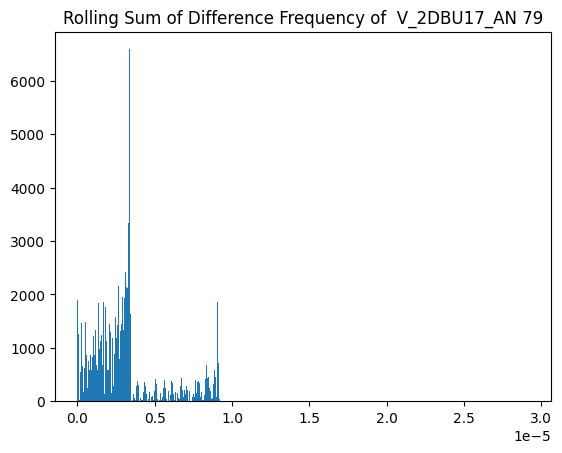

******************************************************************************


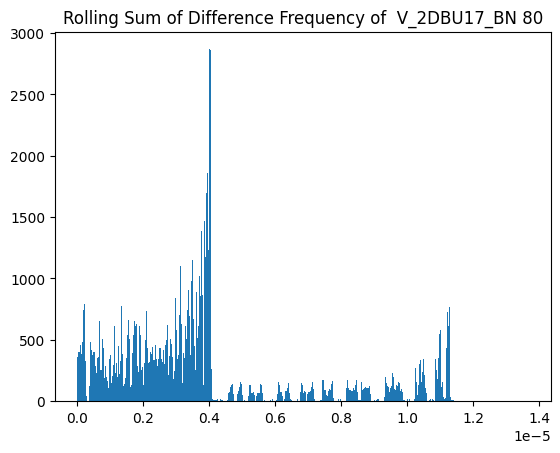

******************************************************************************


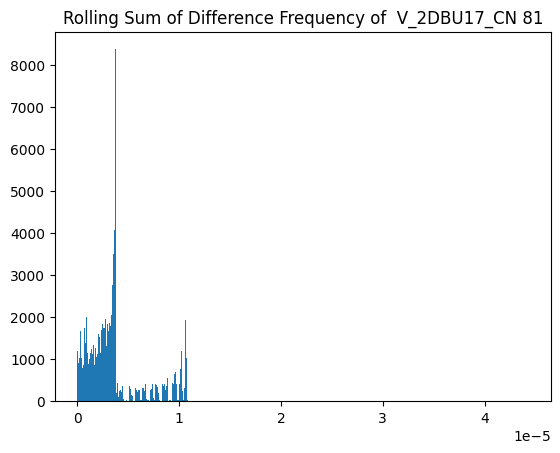

******************************************************************************


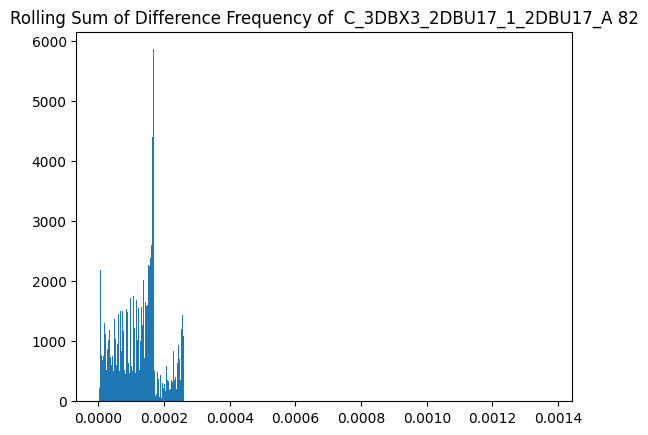

******************************************************************************


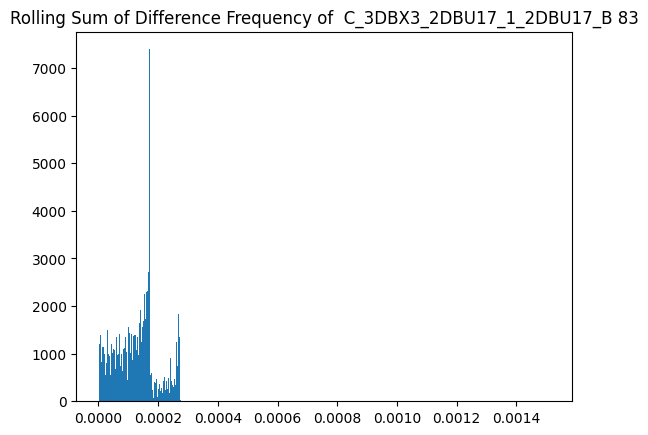

******************************************************************************


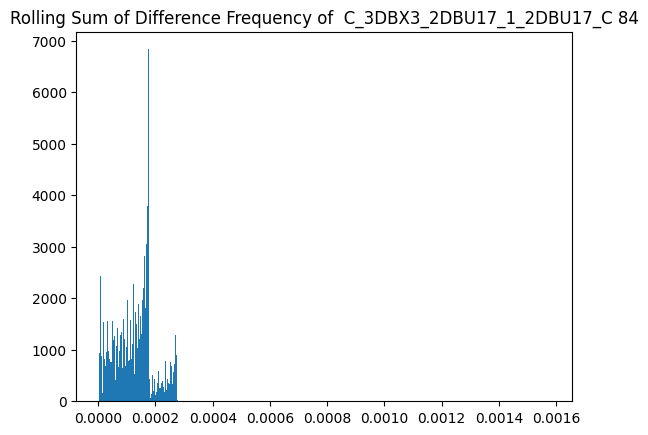

******************************************************************************


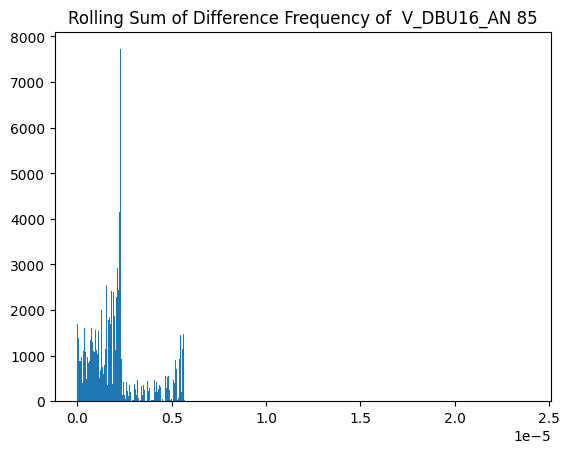

******************************************************************************


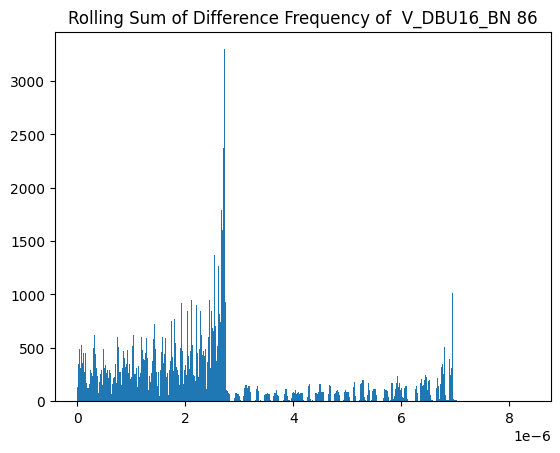

******************************************************************************


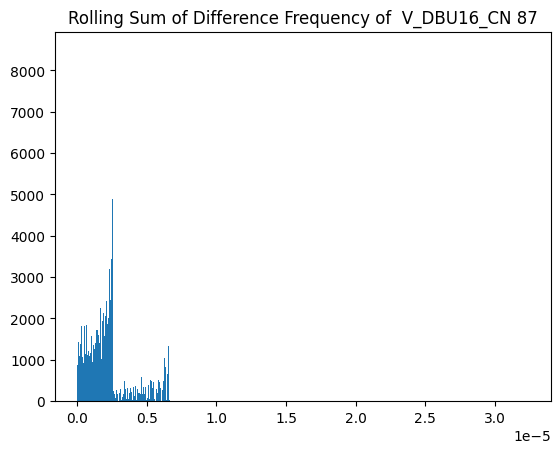

******************************************************************************


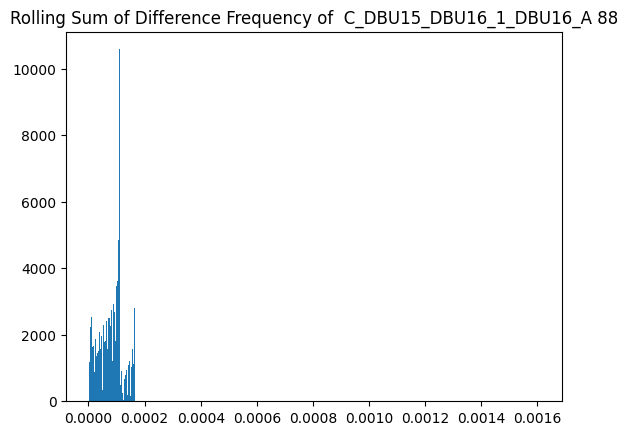

******************************************************************************


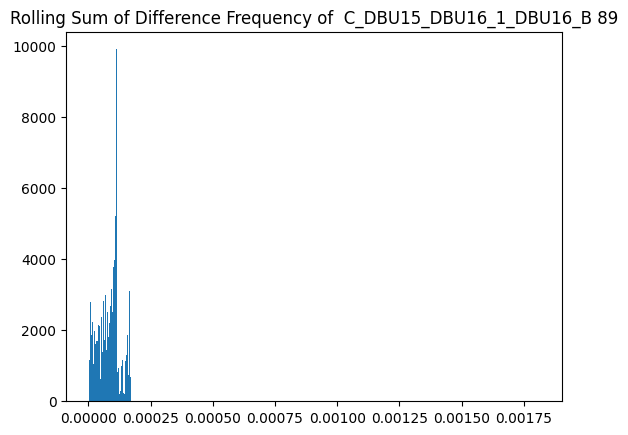

******************************************************************************


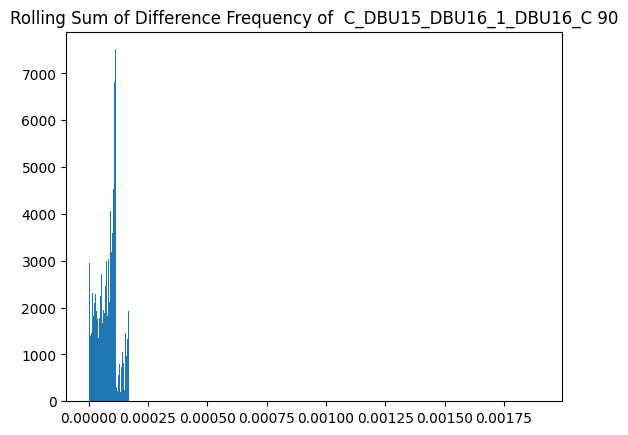

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [57]:
corr_fn = correlation_pair
thresholds_corr, corr_multi_list = get_threshold_stat_only(weights, data, corr_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_corr_99, corr_multi_list = get_threshold_stat_only(weights, data, corr_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.99, axis=1, stat_list=corr_multi_list, collate_fn="sum")
thresholds_corr_95, corr_multi_list = get_threshold_stat_only(weights, data, corr_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.95, axis=1, stat_list=corr_multi_list, collate_fn="sum")

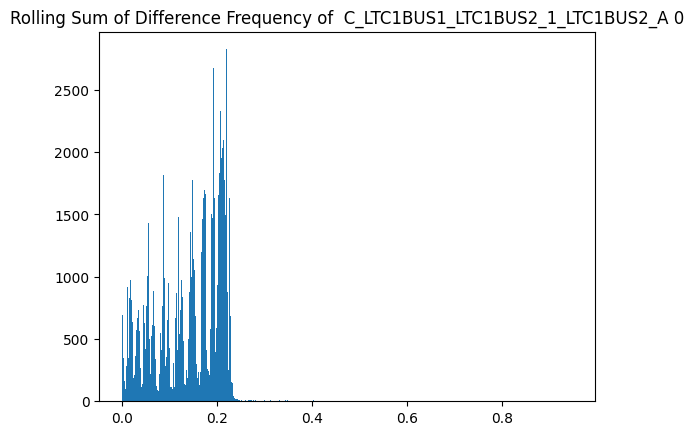

******************************************************************************


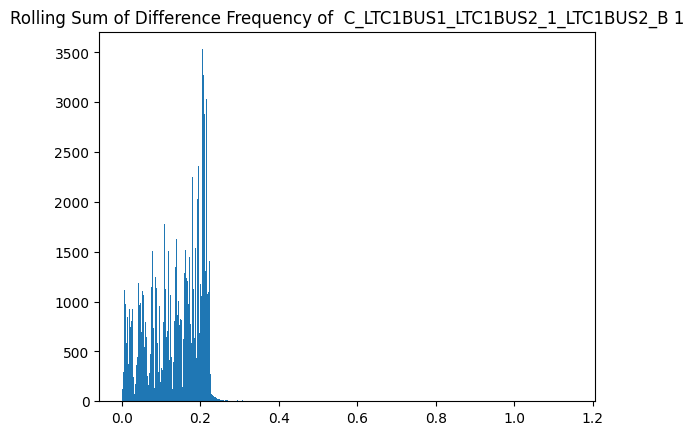

******************************************************************************


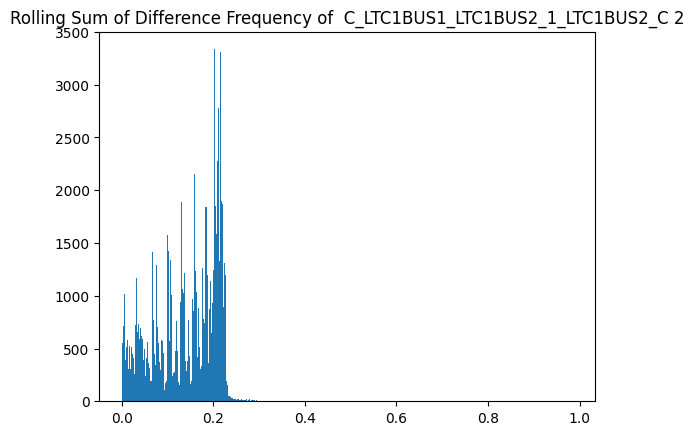

******************************************************************************


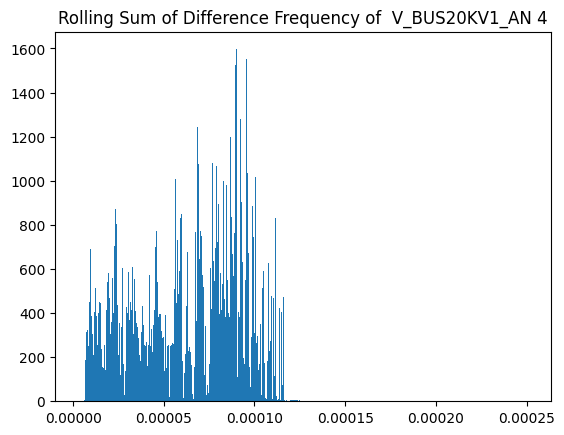

******************************************************************************


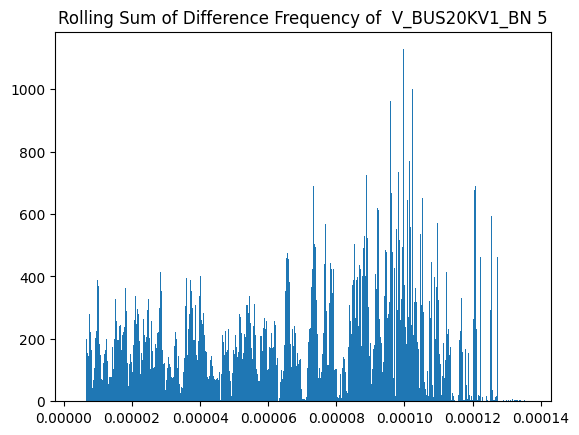

******************************************************************************


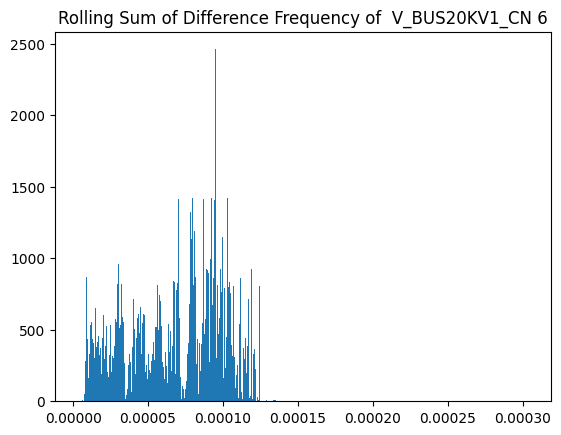

******************************************************************************


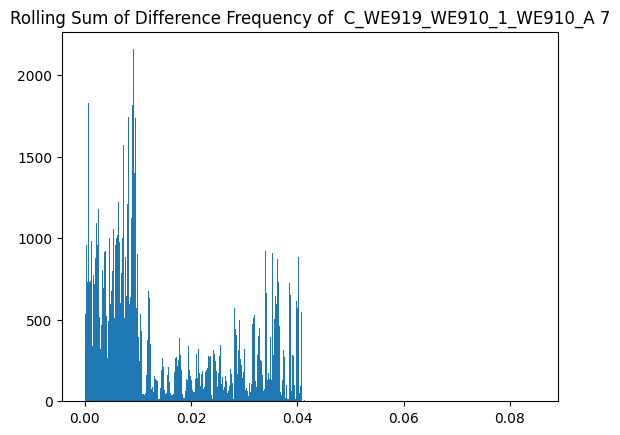

******************************************************************************


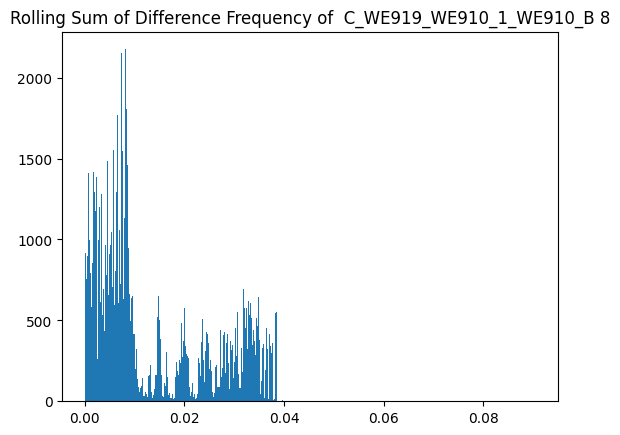

******************************************************************************


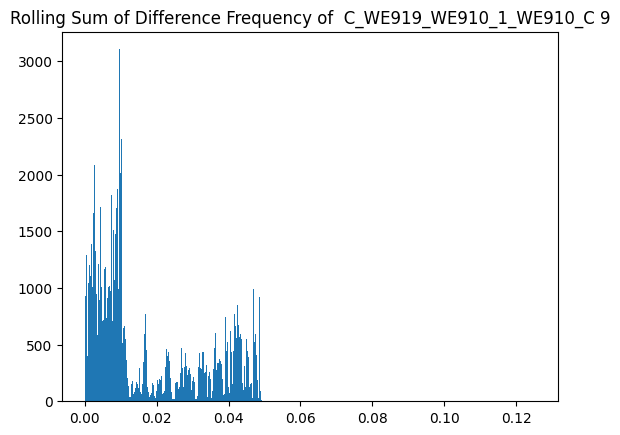

******************************************************************************


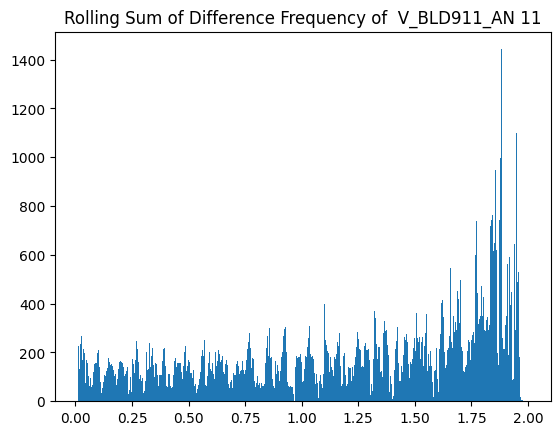

******************************************************************************


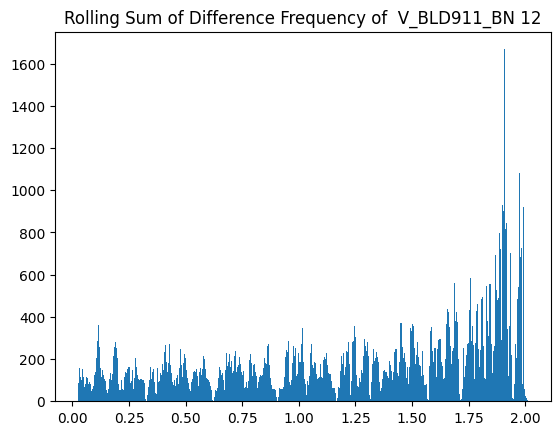

******************************************************************************


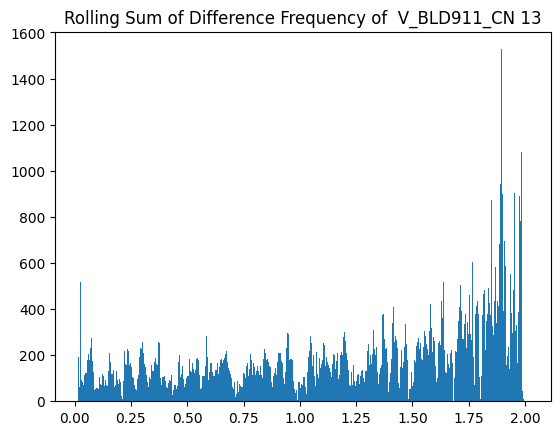

******************************************************************************


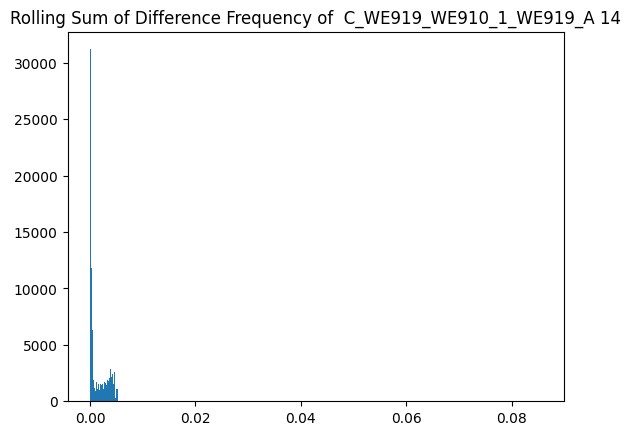

******************************************************************************


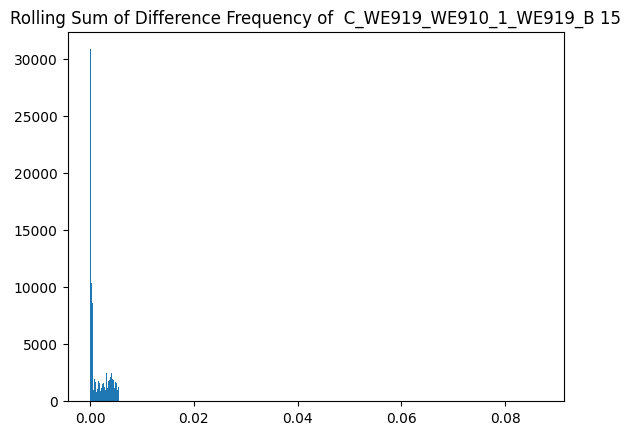

******************************************************************************


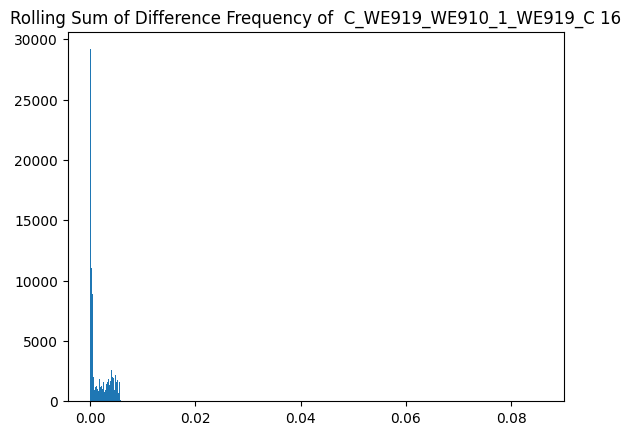

******************************************************************************


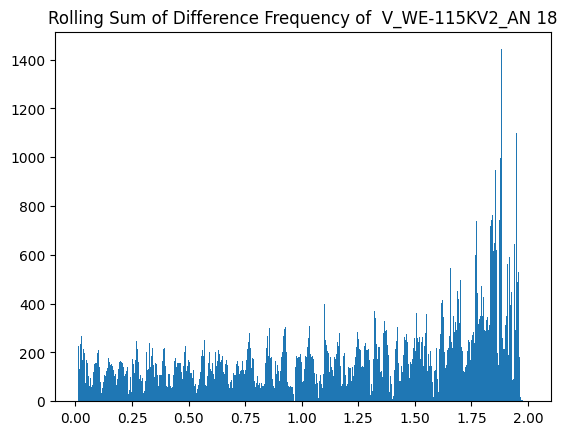

******************************************************************************


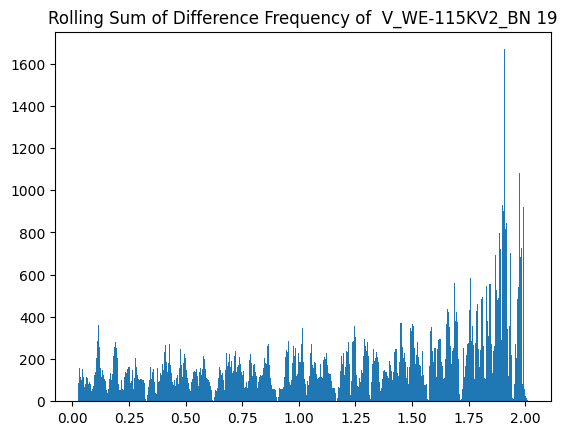

******************************************************************************


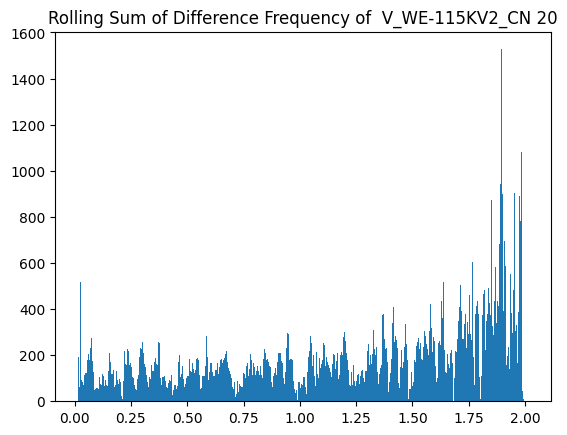

******************************************************************************


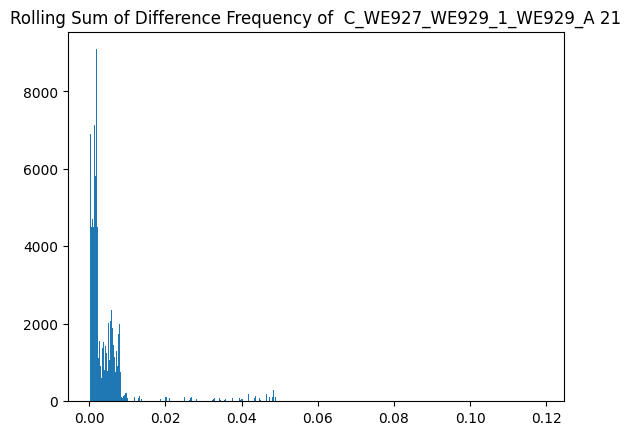

******************************************************************************


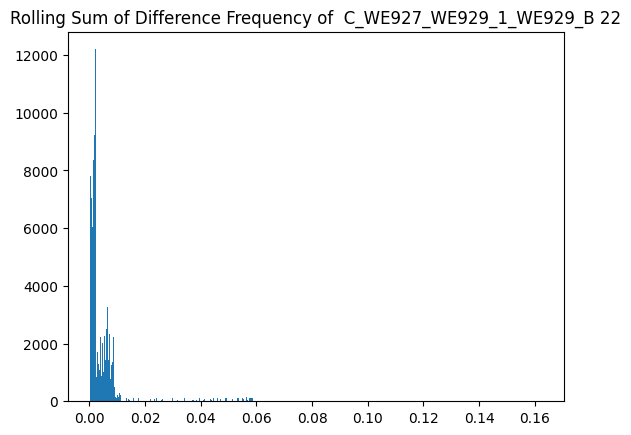

******************************************************************************


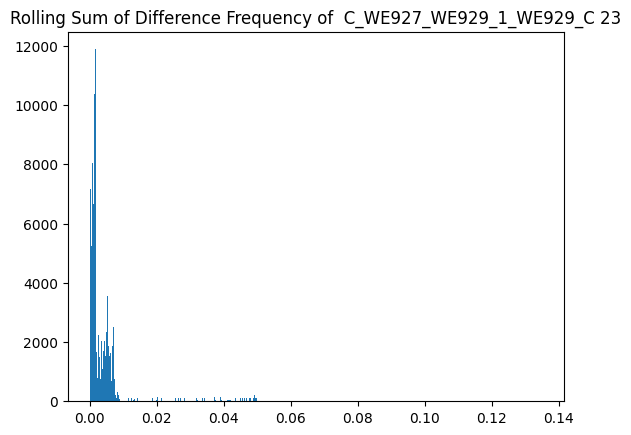

******************************************************************************


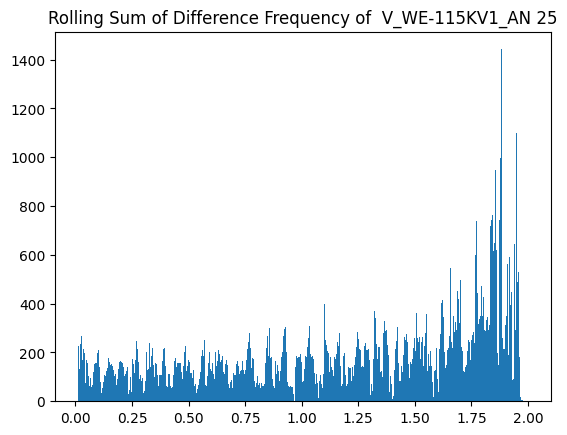

******************************************************************************


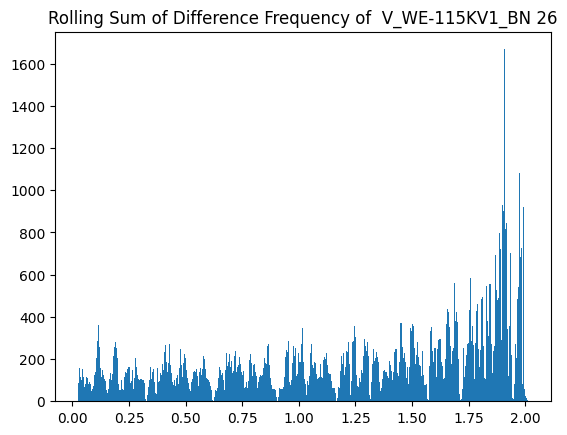

******************************************************************************


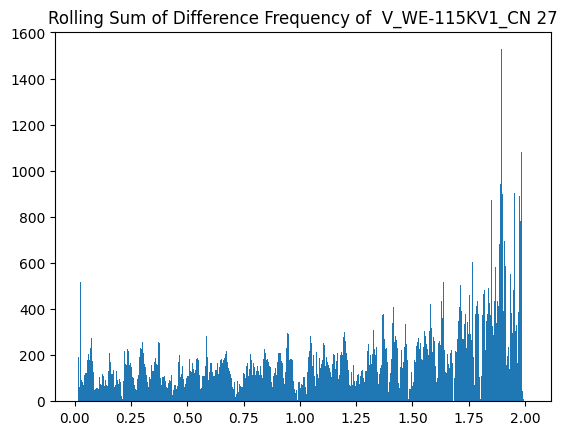

******************************************************************************


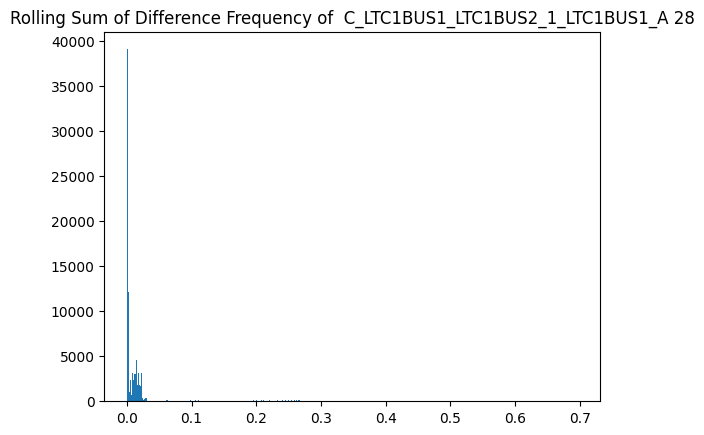

******************************************************************************


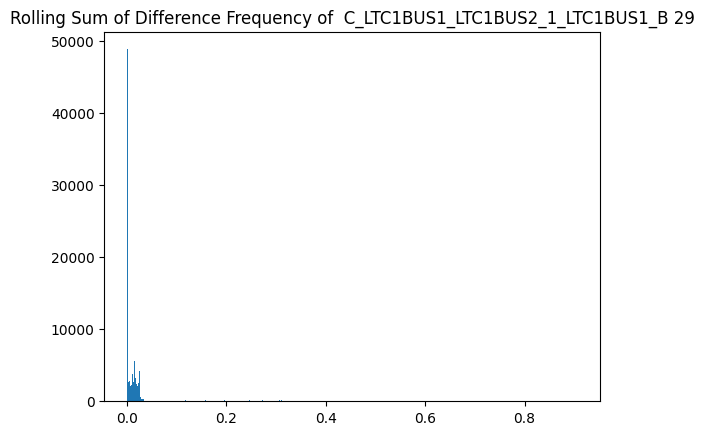

******************************************************************************


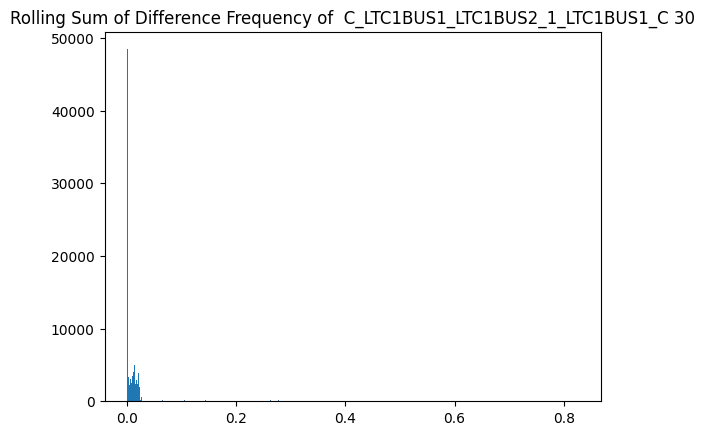

******************************************************************************


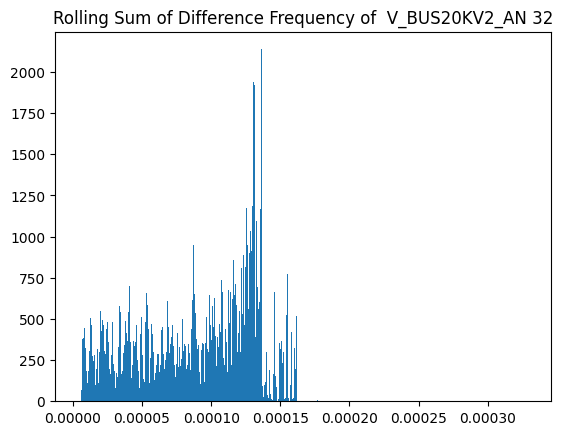

******************************************************************************


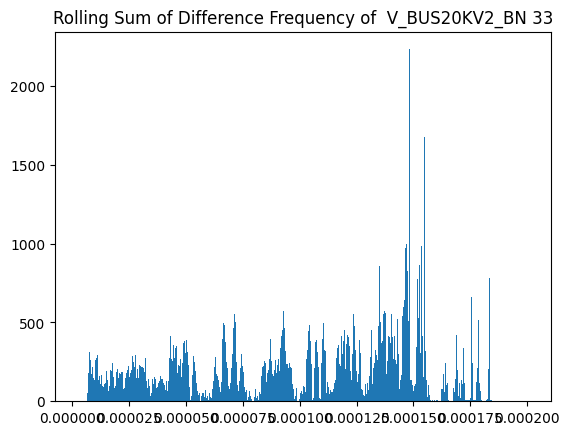

******************************************************************************


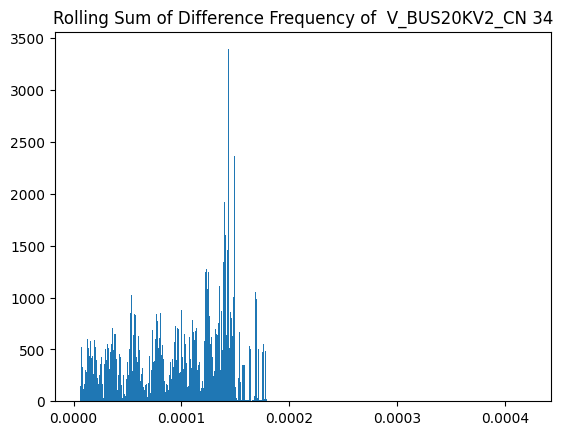

******************************************************************************


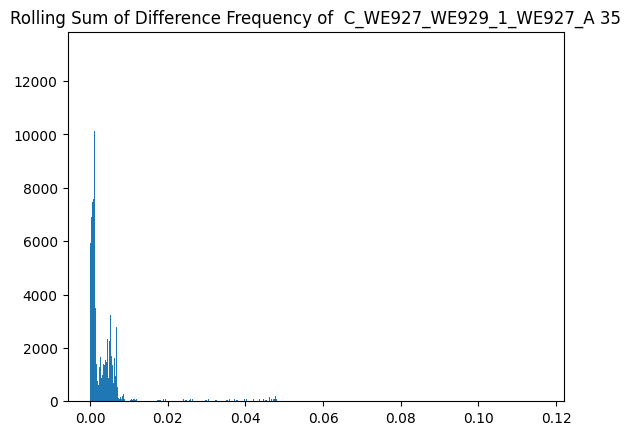

******************************************************************************


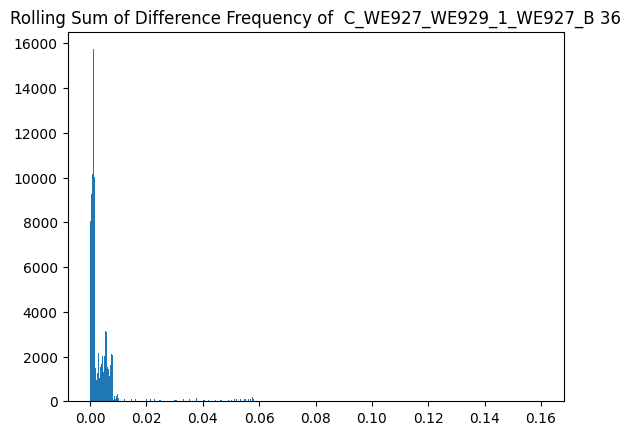

******************************************************************************


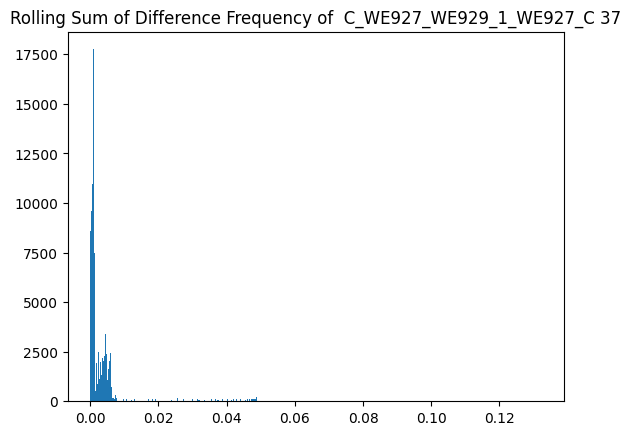

******************************************************************************


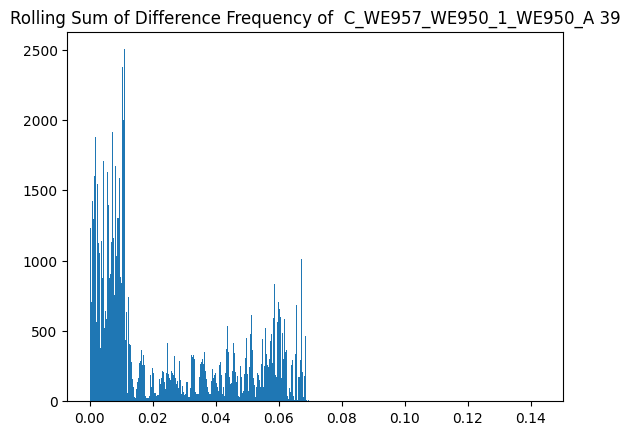

******************************************************************************


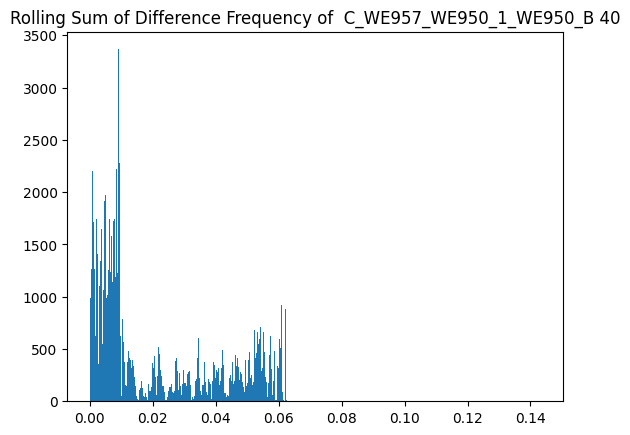

******************************************************************************


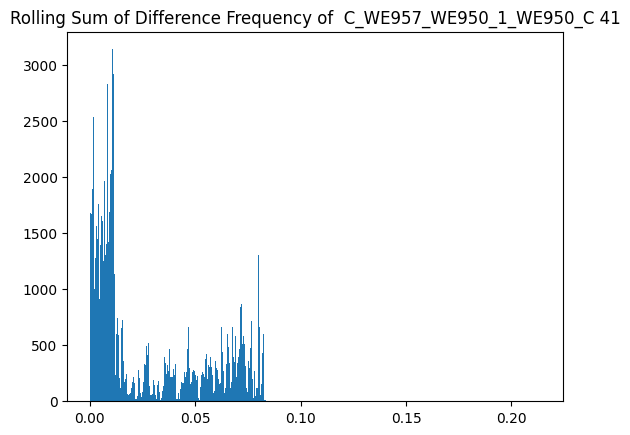

******************************************************************************


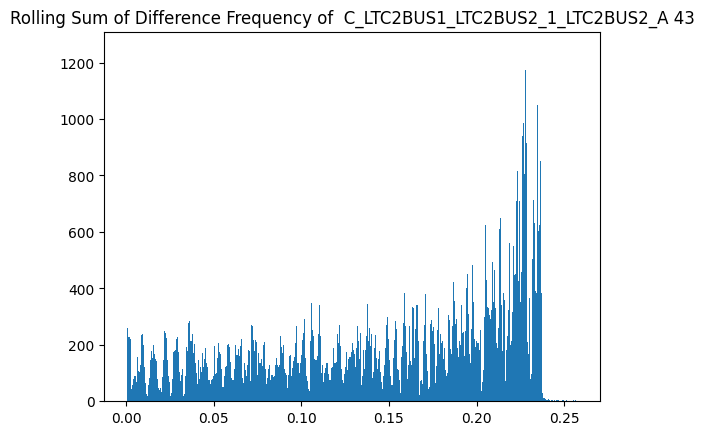

******************************************************************************


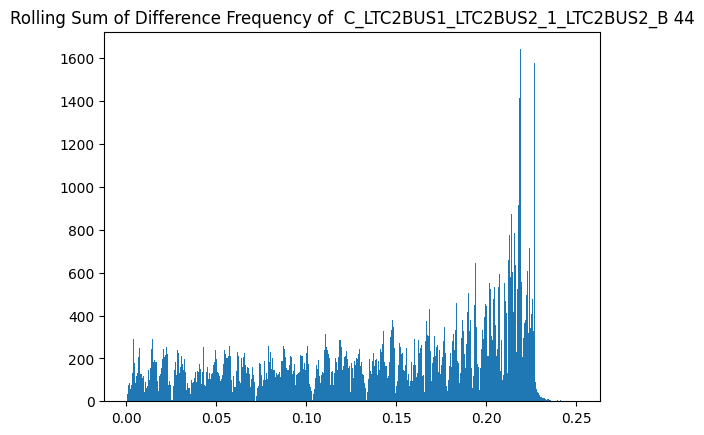

******************************************************************************


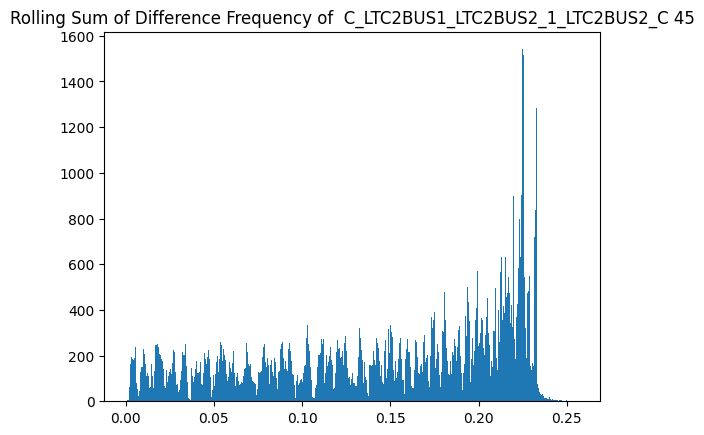

******************************************************************************


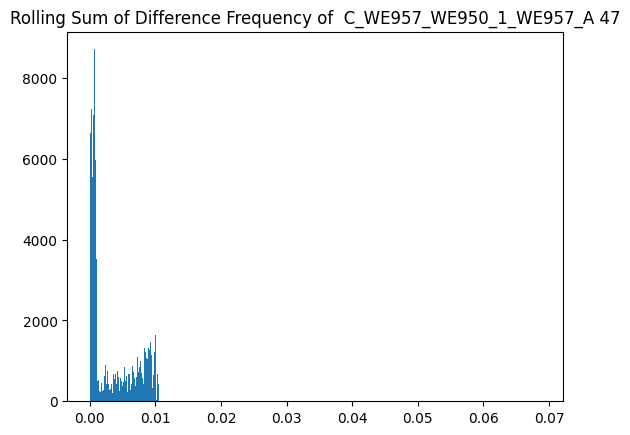

******************************************************************************


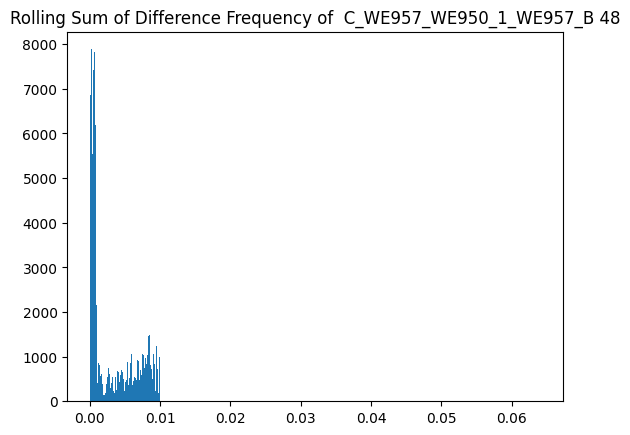

******************************************************************************


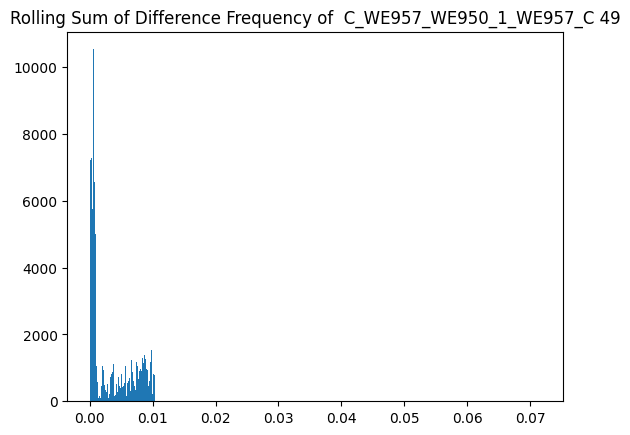

******************************************************************************


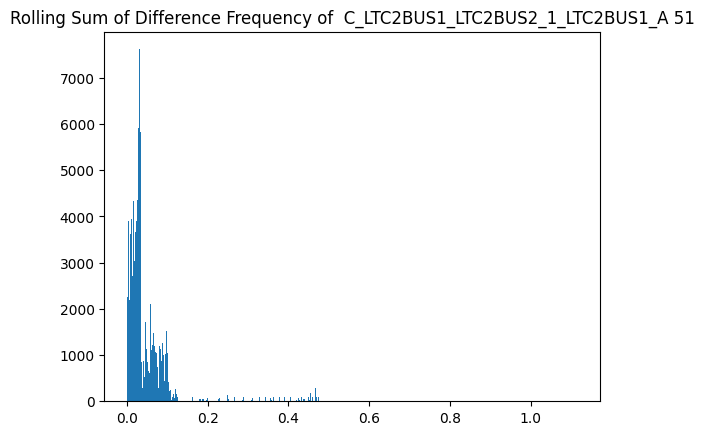

******************************************************************************


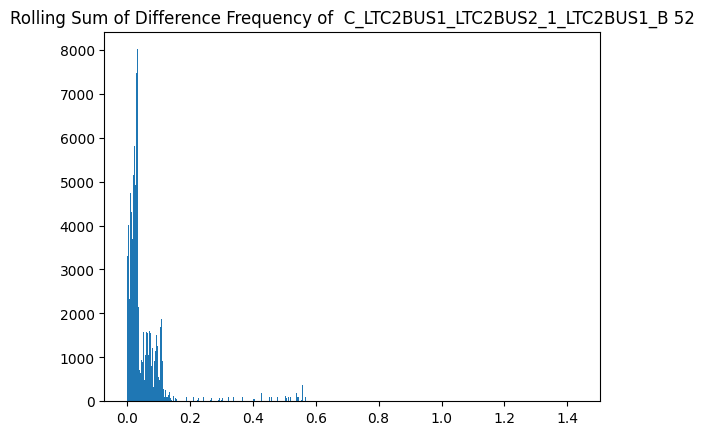

******************************************************************************


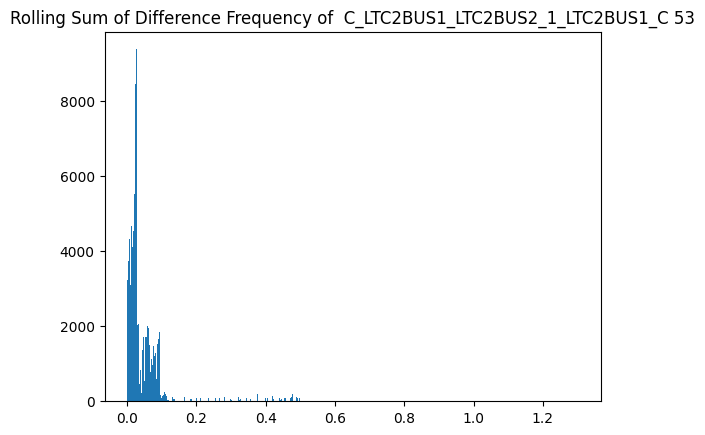

******************************************************************************


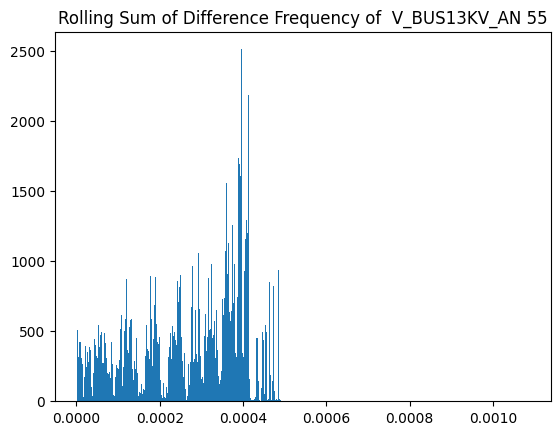

******************************************************************************


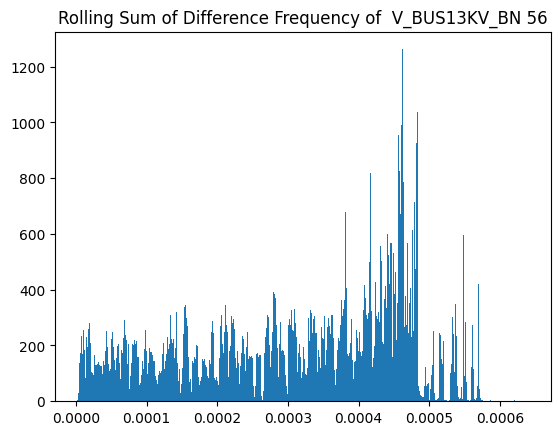

******************************************************************************


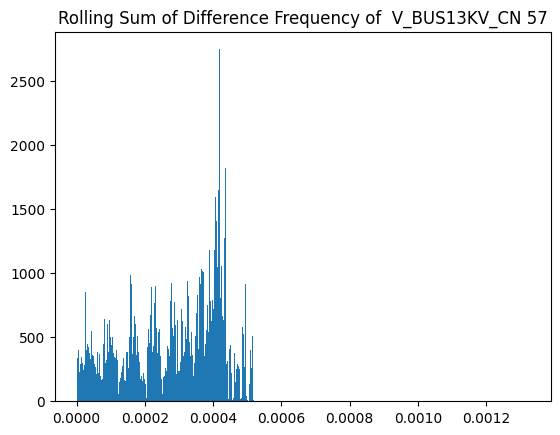

******************************************************************************


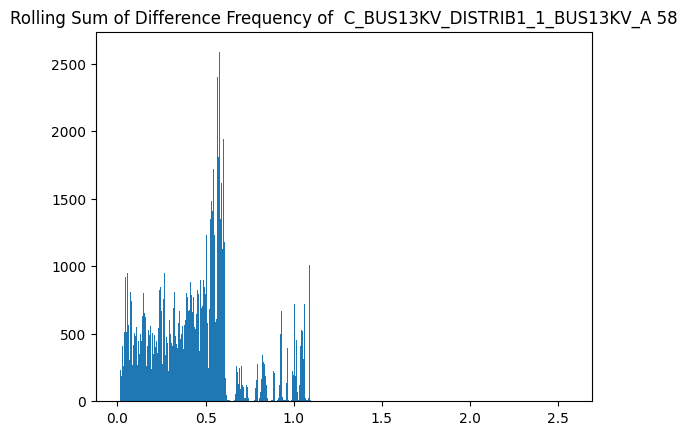

******************************************************************************


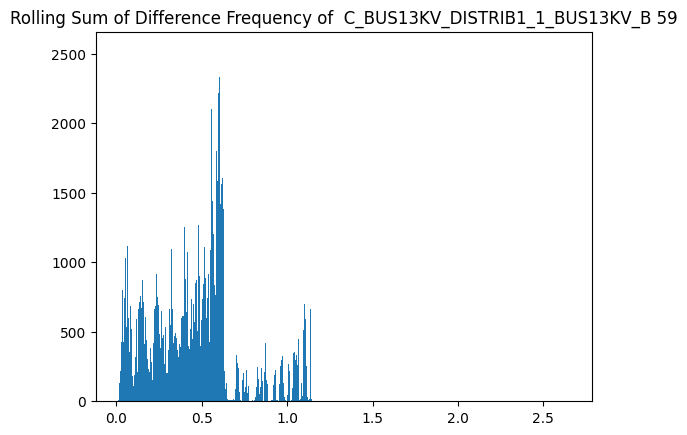

******************************************************************************


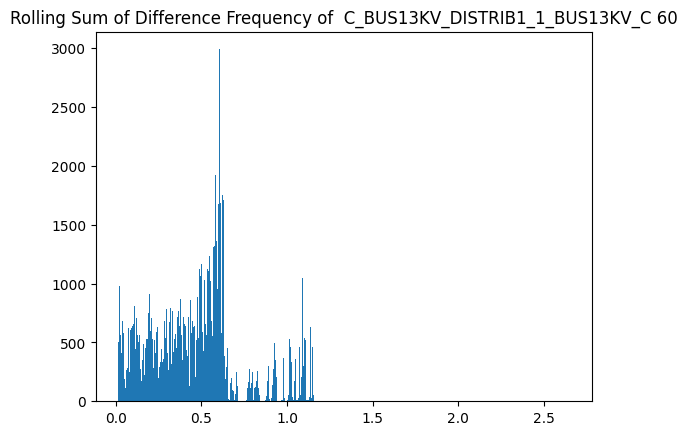

******************************************************************************


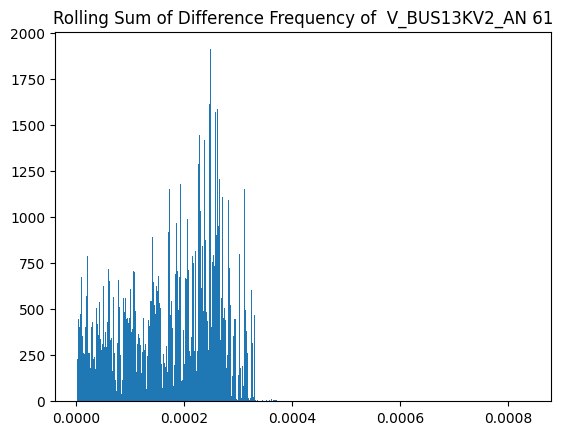

******************************************************************************


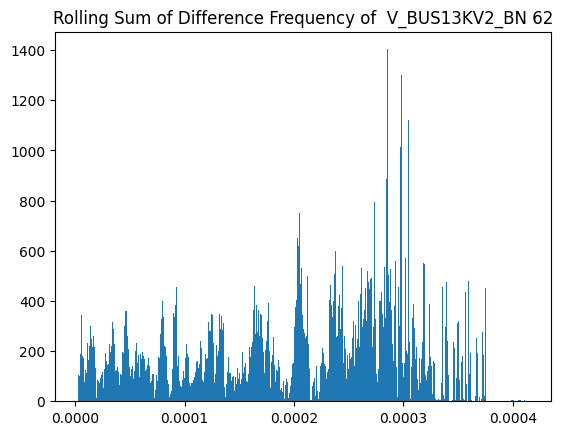

******************************************************************************


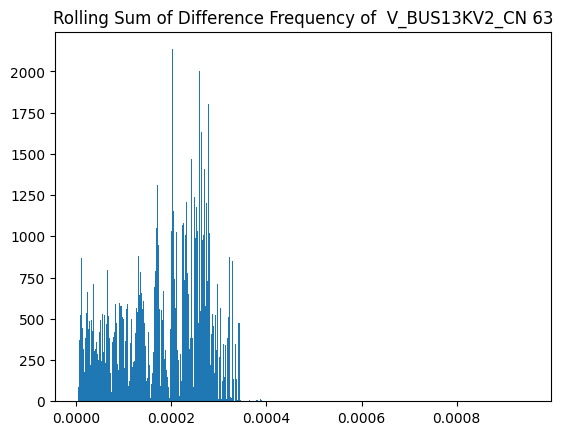

******************************************************************************


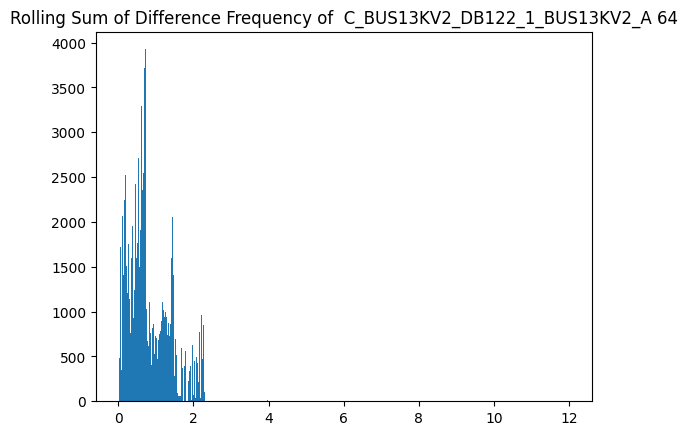

******************************************************************************


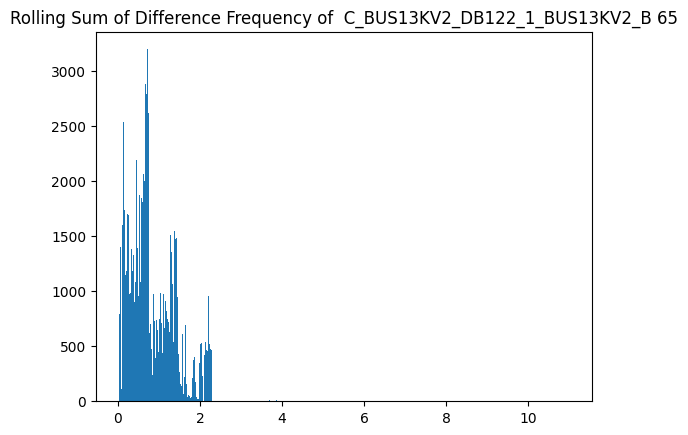

******************************************************************************


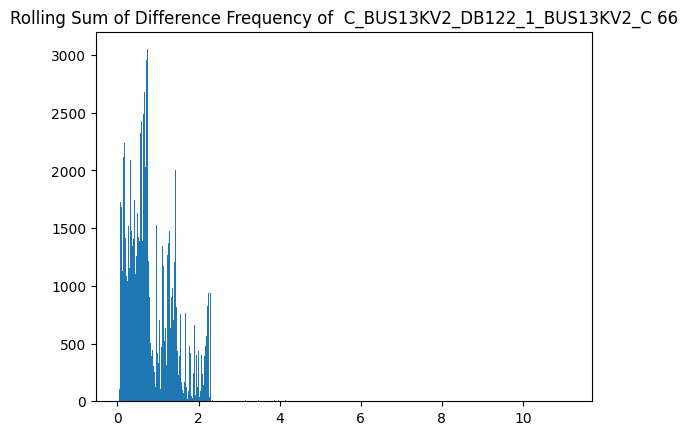

******************************************************************************


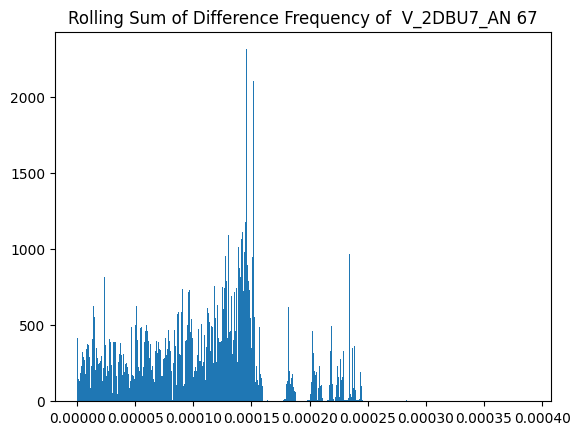

******************************************************************************


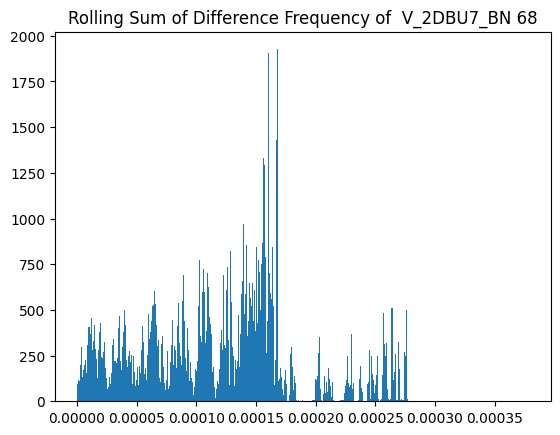

******************************************************************************


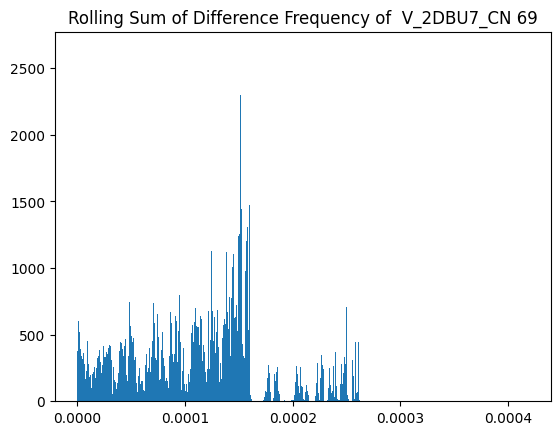

******************************************************************************


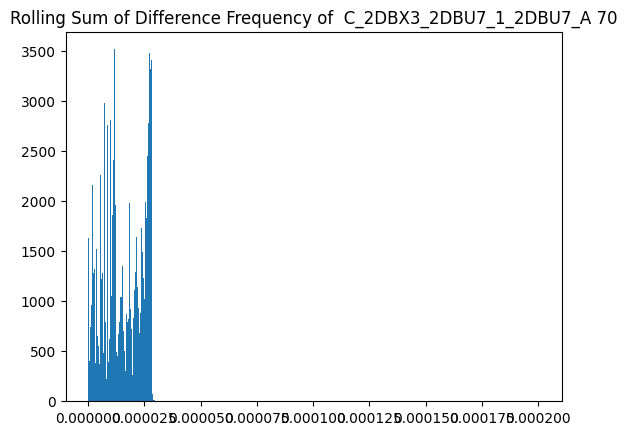

******************************************************************************


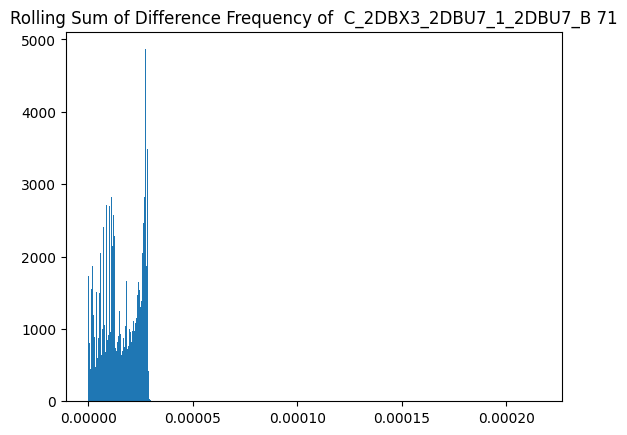

******************************************************************************


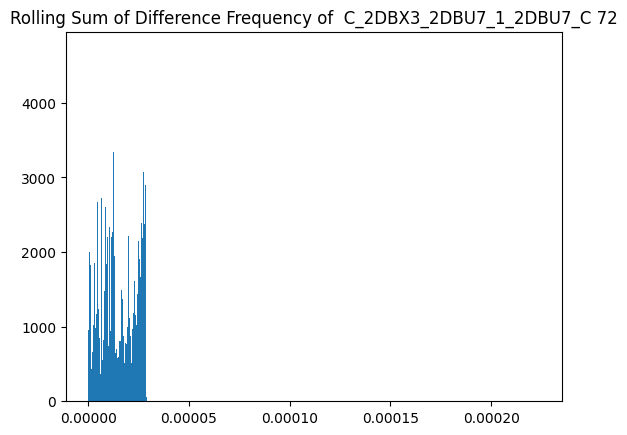

******************************************************************************


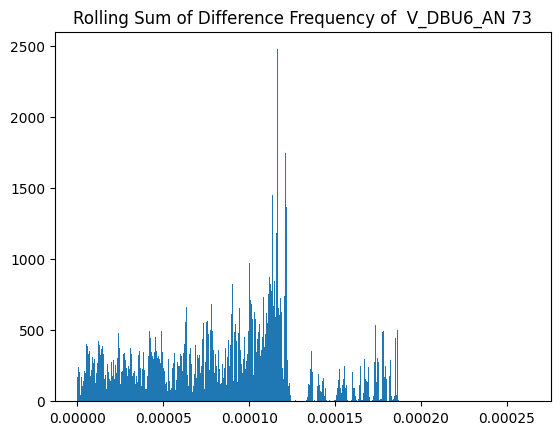

******************************************************************************


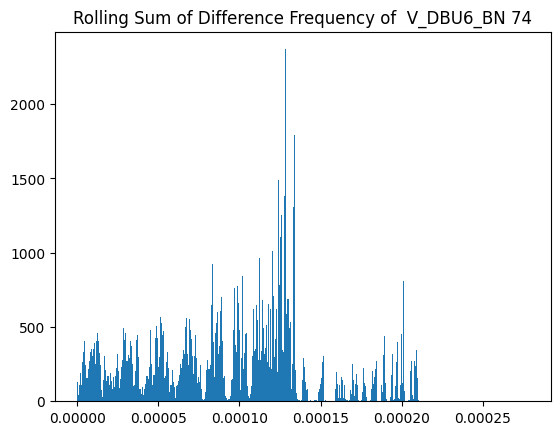

******************************************************************************


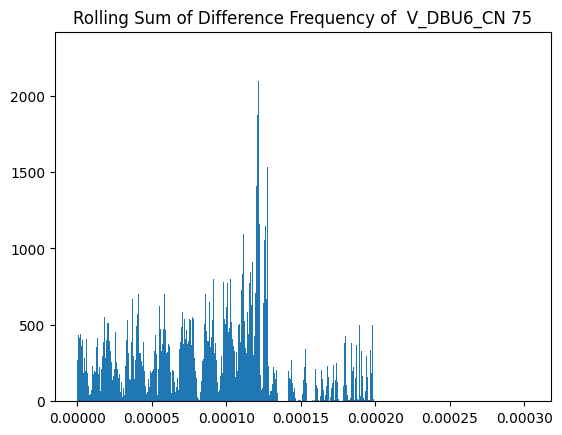

******************************************************************************


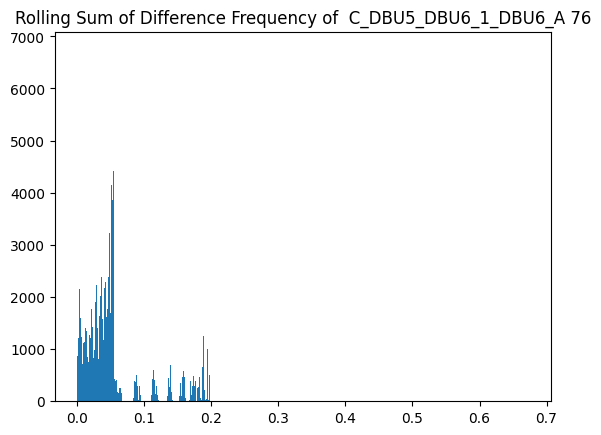

******************************************************************************


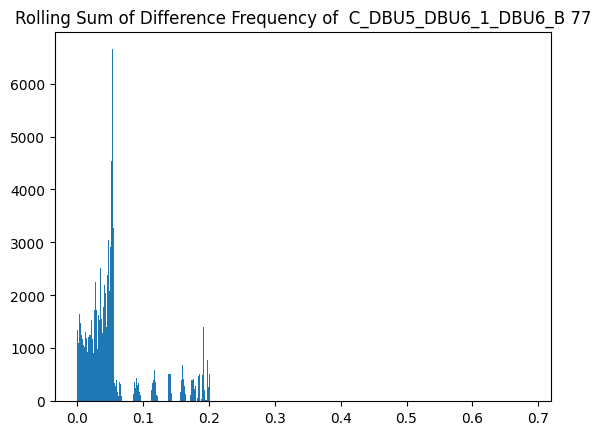

******************************************************************************


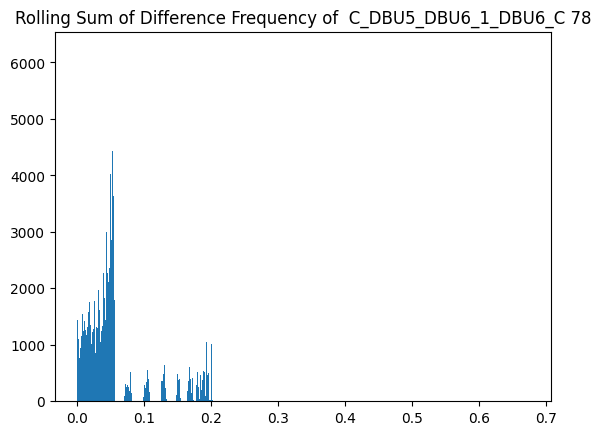

******************************************************************************


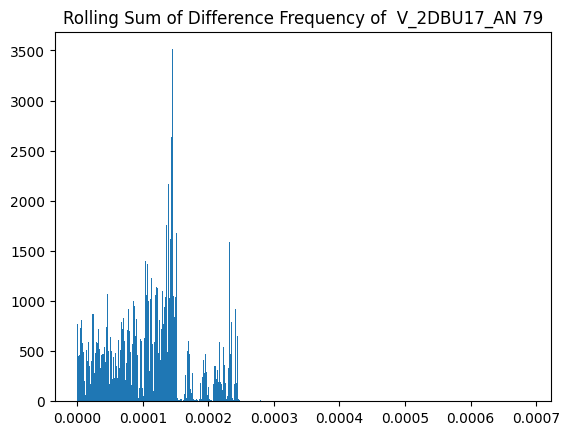

******************************************************************************


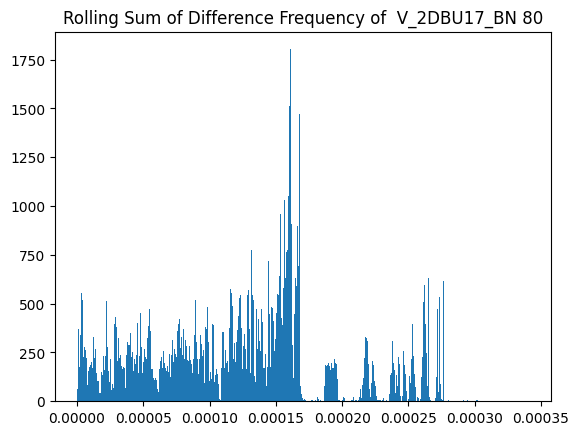

******************************************************************************


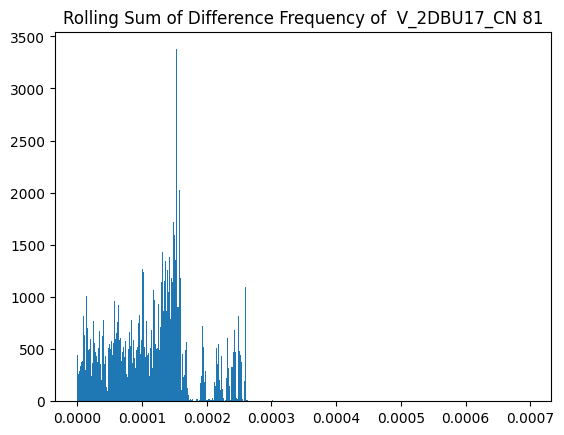

******************************************************************************


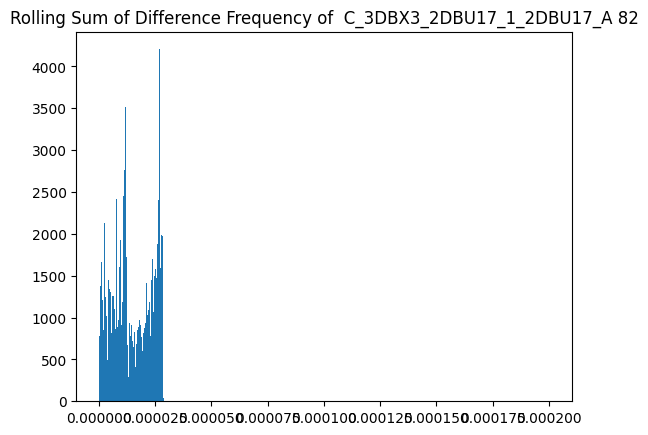

******************************************************************************


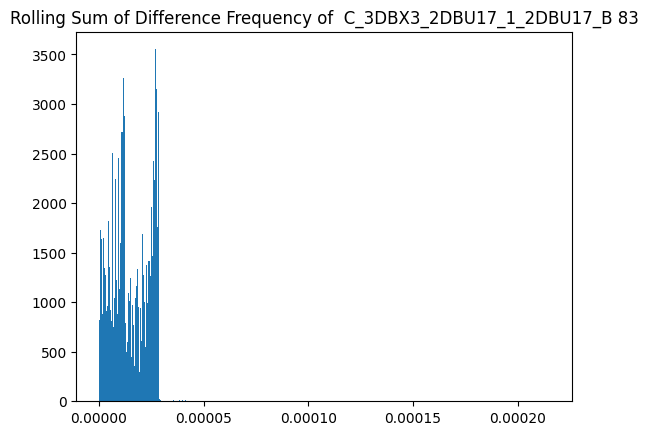

******************************************************************************


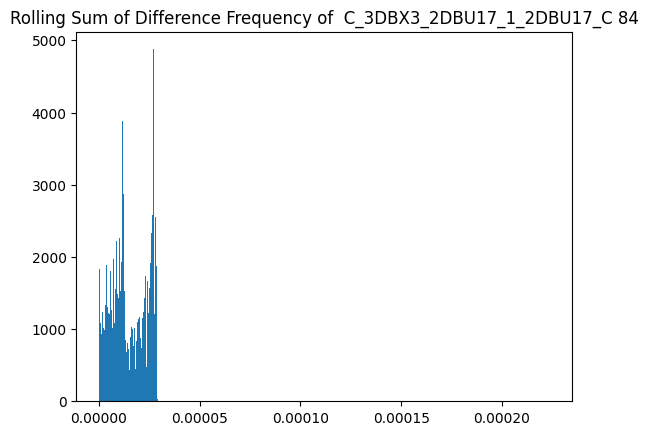

******************************************************************************


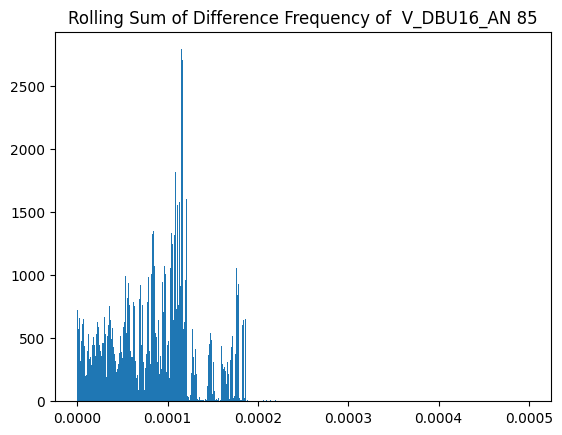

******************************************************************************


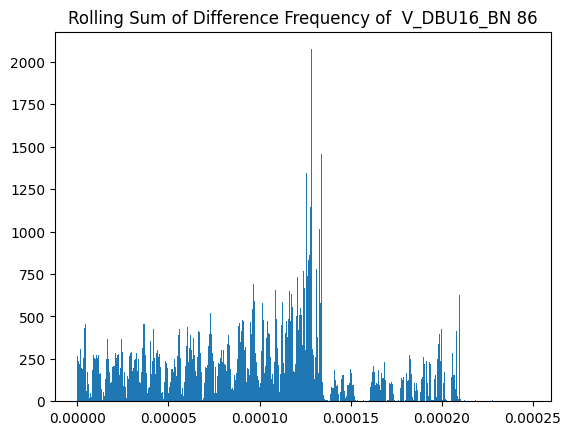

******************************************************************************


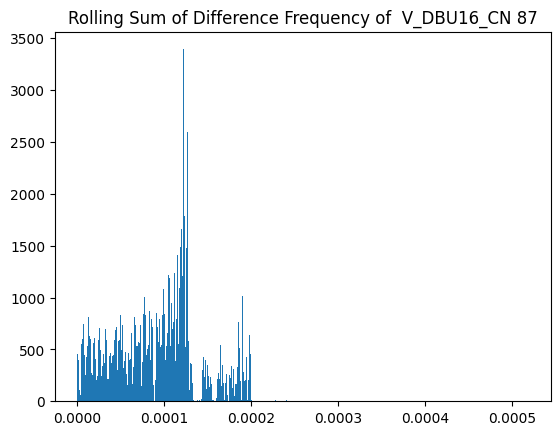

******************************************************************************


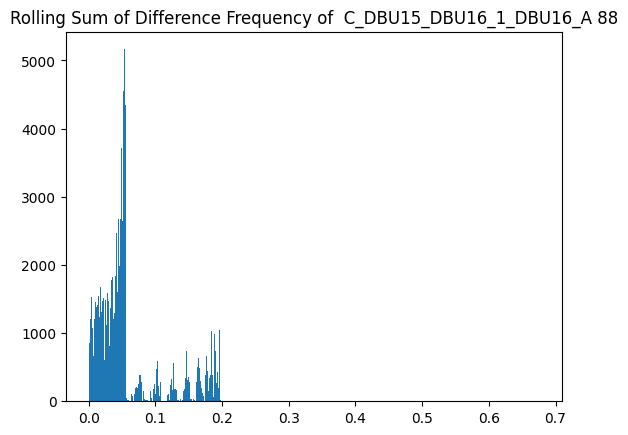

******************************************************************************


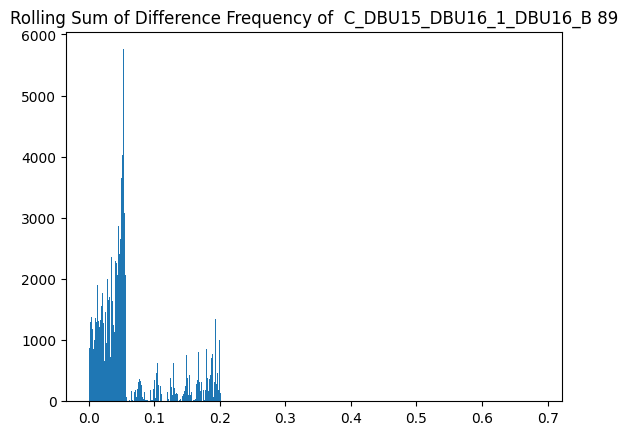

******************************************************************************


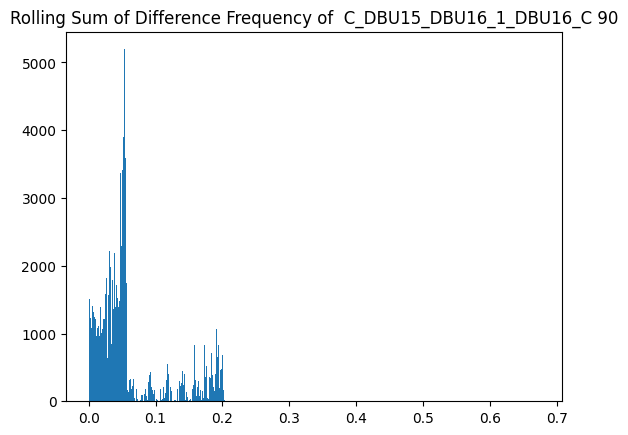

******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
******************************************************************************
****************************************************

In [58]:
window = 350
w = 1

var_fn = var_pair
thresholds_var, var_multi_list = get_threshold_stat_only(weights, data, var_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=1, axis=1, stat_list=None, plot=True, collate_fn="sum")
thresholds_var_99, var_multi_list = get_threshold_stat_only(weights, data, var_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.99, axis=1, stat_list=var_multi_list, collate_fn="sum")
thresholds_var_95, var_multi_list = get_threshold_stat_only(weights, data, var_fn, cols,
              window=window, w=w, adj_list=c_adj_list, quantile=0.95, axis=1, stat_list=var_multi_list, collate_fn="sum")

In [59]:
len(corr_multi_list)

81

### Testing Data

In [60]:
y_true = np.zeros(len(data_test))
for start, end in all_attack_indices:
    y_true[slice(start, end)] = 1

In [61]:
cov_list = []

for var1_index, var2_indices in c_adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    cov_list.append(
        stat_diff(weights[var1_index+1], data_test, var1_index, var2_indices, window=window, stat_fn=covariance_pair, fn="sum")
    )

rsum_list_cov = np.array(cov_list)

In [62]:
corr_list = []

for var1_index, var2_indices in c_adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_list.append(
        stat_diff(weights[var1_index+1],  data_test, var1_index, var2_indices, window=window, stat_fn=correlation_pair, fn="sum")
    )

rsum_list_corr = np.array(corr_list)

In [63]:
var_list = []

for var1_index, var2_indices in c_adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    var_list.append(
        stat_diff(weights[var1_index+1], data_test, var1_index, var2_indices, window=window, stat_fn=var_pair, fn="sum")
    )

rsum_list_var = np.array(var_list)

In [64]:
things.sort()
things

[1,
 2,
 3,
 5,
 6,
 7,
 8,
 9,
 10,
 12,
 13,
 14,
 15,
 16,
 17,
 19,
 20,
 21,
 22,
 23,
 24,
 26,
 27,
 28,
 29,
 30,
 31,
 33,
 34,
 35,
 36,
 37,
 38,
 40,
 41,
 42,
 44,
 45,
 46,
 48,
 49,
 50,
 52,
 53,
 54,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91]

In [65]:
attacks

{1.1: [[52, 44, 59, 48, 15], [53, 45, 60, 49, 16], [54, 17, 50, 46, 61]],
 5.0: [[5, 12, 26, 19, 62]],
 6.6: [[66, 2, 30, 90, 84]],
 9.0: [[68, 56, 74],
  [69, 57, 75],
  [70, 58, 76],
  [71, 59, 77],
  [72, 60, 78],
  [73, 79, 61]],
 10.5: [[36, 22], [37, 23], [38, 24]],
 16.2: [[77, 59, 71], [78, 60, 72], [79, 61, 73]],
 17.4: [[86, 62, 80], [87, 63, 81], [88, 64, 82]]}

In [66]:
attack_start_times

[1.1, 5.0, 6.6, 9.0, 10.5, 16.2, 17.4]

In [67]:
hops

{2.1: [52, 53, 54, 55],
 5.9: [5],
 7.8: [66],
 10.1: [68, 69, 70, 71, 72, 73],
 11.7: [36, 37, 38, 39],
 17.0: [77, 78, 79],
 18.3: [86, 87, 88]}

In [68]:
all_attack_indice

[(4080, 8879),
 (22800, 27119),
 (30480, 36239),
 (42000, 47279),
 (49200, 54959),
 (76560, 80399),
 (82320, 86639)]

In [69]:
attacks_in

{4080: [[52, 44, 59, 48, 15], [53, 45, 60, 49, 16], [54, 17, 50, 46, 61]],
 22800: [[5, 12, 26, 19, 62]],
 30480: [[66, 2, 30, 90, 84]],
 42000: [[68, 56, 74],
  [69, 57, 75],
  [70, 58, 76],
  [71, 59, 77],
  [72, 60, 78],
  [73, 79, 61]],
 49200: [[36, 22], [37, 23], [38, 24]],
 76560: [[77, 59, 71], [78, 60, 72], [79, 61, 73]],
 82320: [[86, 62, 80], [87, 63, 81], [88, 64, 82]]}

In [70]:
total_normal = rsum_list_var.shape[1] + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)

55476


In [71]:
thresholds_cov = np.array(thresholds_cov)
thresholds_cov_99 = np.array(thresholds_cov_99)
thresholds_cov_95 = np.array(thresholds_cov_95)

thresholds_corr = np.array(thresholds_corr)
thresholds_corr_99 = np.array(thresholds_corr_99)
thresholds_corr_95 = np.array(thresholds_corr_95)

In [72]:
thresholds_var = np.array(thresholds_var)
thresholds_var_99 = np.array(thresholds_var_99)
thresholds_var_95 = np.array(thresholds_var_95)

# Covariance

In [73]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_cov

print("Covariance")


for i, threshold in enumerate([thresholds_cov, thresholds_cov_99, thresholds_cov_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Covariance
Threshold: 1.0
Persistency: 1
DD: [4, 16, 7, 0, None, None, 0]
LD: [[4, 31, 17], [16], [7], [0, None, 13, None, None, None], [None, None, None], [None, None, None], [0, None, 12]]
FPR 3.605227579990987e-05
FPR Localisation (Mean): 8.901796493804905e-07
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
****************************************************
Persistency: 3
DD: [45, 18, 9, 15, None, None, 2]
LD: [[45, 72, 58], [18], [9], [21, None, 15, None, None, None], [None, None, Non

# Correlation

In [74]:
rsum_list = rsum_list_corr

print("Correlation")

for i, threshold in enumerate([thresholds_corr, thresholds_corr_99, thresholds_corr_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Correlation
Threshold: 1.0
Persistency: 1
DD: [4799, 0, 3, 0, None, None, 18]
LD: [[4824, 4812, 4799], [0], [3], [5, 0, 0, None, None, None], [None, None, None], [None, None, None], [None, 18, None]]
FPR 7.210455159981973e-05
FPR Localisation (Mean): 2.2254491234512266e-06
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.605227579990987e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 3.605227579990987e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
****************************************************
Persistency: 3
DD: [4801, 2, 5, 2, None, None,

# Combined

In [75]:
print("Combined")

t_corr = [thresholds_corr, thresholds_corr_99, thresholds_corr_95]
t_cov = [thresholds_cov, thresholds_cov_99, thresholds_cov_95]

for i in range(len(t_cov)):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = np.logical_or((rsum_list_corr > t_corr[i].reshape(-1, 1)), (rsum_list_cov > t_cov[i].reshape(-1, 1)))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Combined
Threshold: 1.0
Persistency: 1
DD: [4, 0, 3, 0, None, None, 0]
LD: [[4, 31, 17], [0], [3], [0, 0, 0, None, None, None], [None, None, None], [None, None, None], [0, 18, 12]]
FPR 0.00010815682739972961
FPR Localisation (Mean): 3.1156287728317174e-06
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 3.605227579990987e-05, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 3.605227579990987e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
*****************************************

# Variance

In [76]:
quantiles = [1., 0.99, 0.95]
rsum_list = rsum_list_var

print("Variance")


for i, threshold in enumerate([thresholds_var, thresholds_var_99, thresholds_var_95]):
    print("Threshold:", quantiles[i])

    for persistency in [1, 3]:
        print("Persistency:", persistency)


        # each row is sensor, each col is timestep
        violations = (rsum_list > threshold.reshape(-1, 1))
        ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
        print("DD:", ADD)
        LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
        print("LD:", LD)
        fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency)
        print("FPR", fpr)

        fpr_l = []
        for v in violations:
            fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=persistency))
        print("FPR Localisation (Mean):", np.mean(fpr_l))
        print("####################################################")
        print("FPR Localisation:", fpr_l)
        print("****************************************************")
    print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
    print()

Variance
Threshold: 1.0
Persistency: 1
DD: [0, 0, None, 0, None, None, 14]
LD: [[9, 0, 24], [0], [None], [1, 7, 0, None, None, None], [None, None, None], [None, None, None], [4347, 14, 4321]]
FPR 3.605227579990987e-05
FPR Localisation (Mean): 6.67634737035368e-07
####################################################
FPR Localisation: [0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.8026137899954934e-05, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
****************************************************
Persistency: 3
DD: [2, 2, None, 2, None, None, 16]
LD: [[11, 2, 26], [2], [None], [3, 9, 2, None, None, None], [None, None, None], [None, None, None]

In [77]:
all_sensors =[]
for i in attacks.values():
    for a in i:
        all_sensors += a
all_sensors

[52,
 44,
 59,
 48,
 15,
 53,
 45,
 60,
 49,
 16,
 54,
 17,
 50,
 46,
 61,
 5,
 12,
 26,
 19,
 62,
 66,
 2,
 30,
 90,
 84,
 68,
 56,
 74,
 69,
 57,
 75,
 70,
 58,
 76,
 71,
 59,
 77,
 72,
 60,
 78,
 73,
 79,
 61,
 36,
 22,
 37,
 23,
 38,
 24,
 77,
 59,
 71,
 78,
 60,
 72,
 79,
 61,
 73,
 86,
 62,
 80,
 87,
 63,
 81,
 88,
 64,
 82]

In [78]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{4080: [52, 44, 59, 48, 15, 53, 45, 60, 49, 16, 54, 17, 50, 46, 61],
 22800: [5, 12, 26, 19, 62],
 30480: [66, 2, 30, 90, 84],
 42000: [68,
  56,
  74,
  69,
  57,
  75,
  70,
  58,
  76,
  71,
  59,
  77,
  72,
  60,
  78,
  73,
  79,
  61],
 49200: [36, 22, 37, 23, 38, 24],
 76560: [77, 59, 71, 78, 60, 72, 79, 61, 73],
 82320: [86, 62, 80, 87, 63, 81, 88, 64, 82]}

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


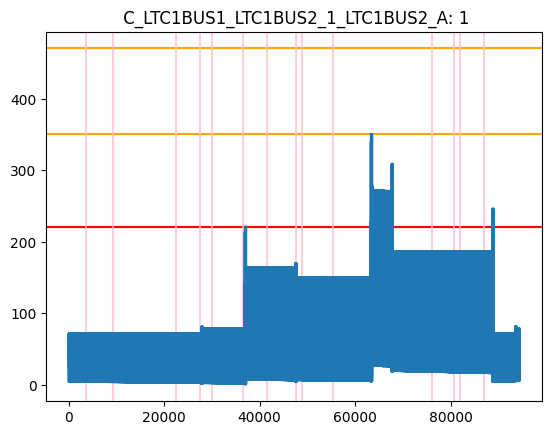

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 50


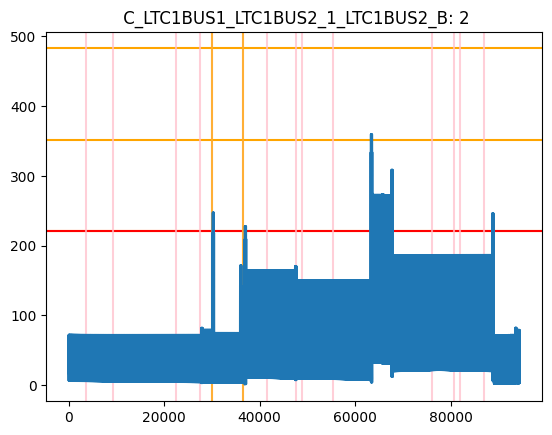

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


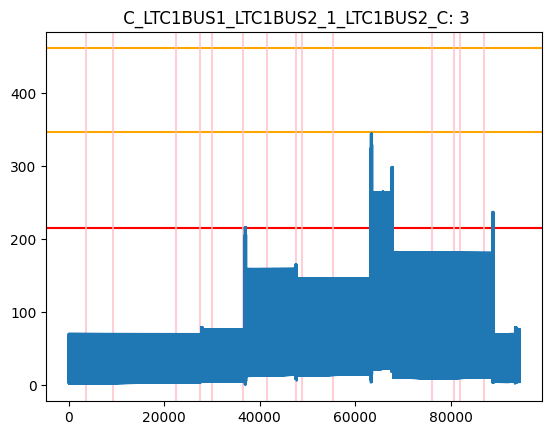

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 20


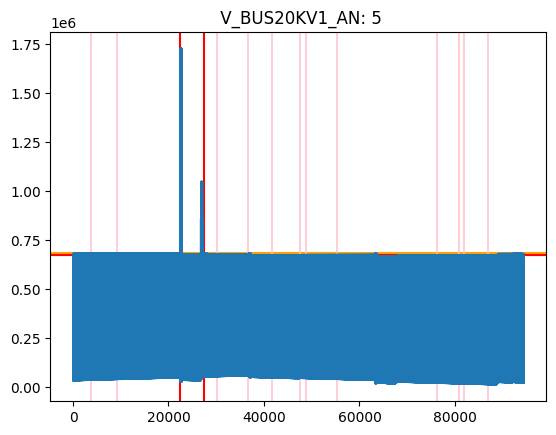

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


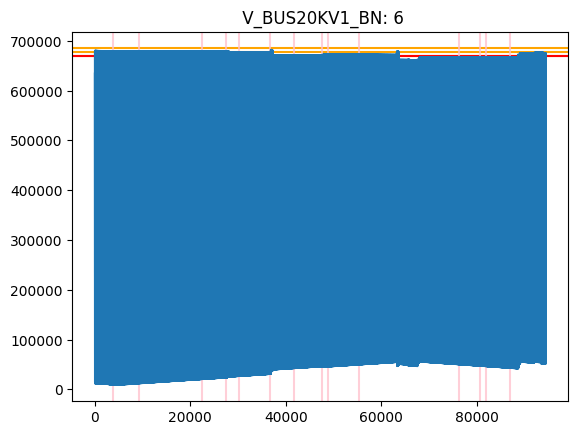

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


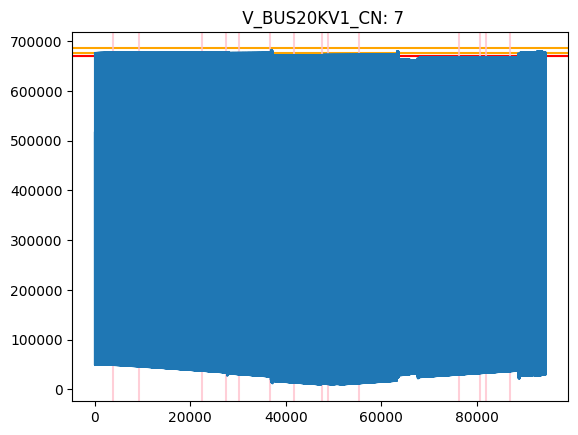

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


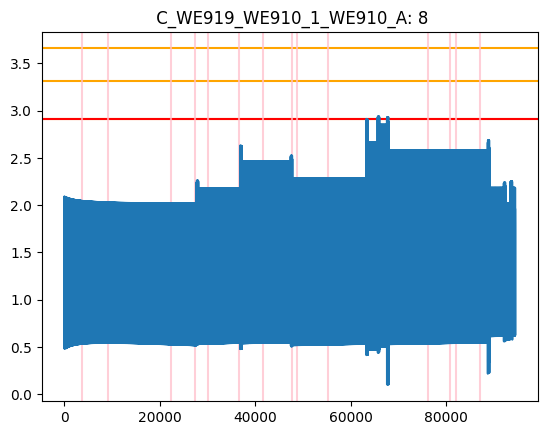

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


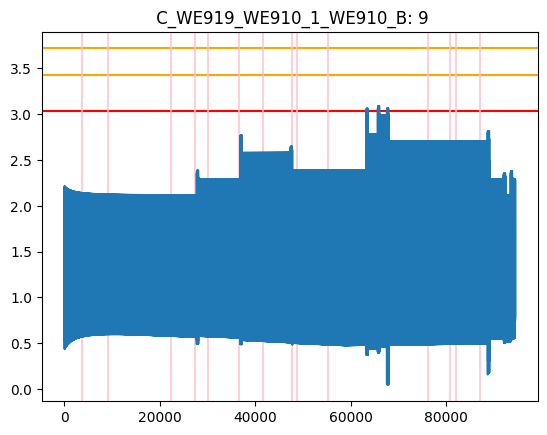

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


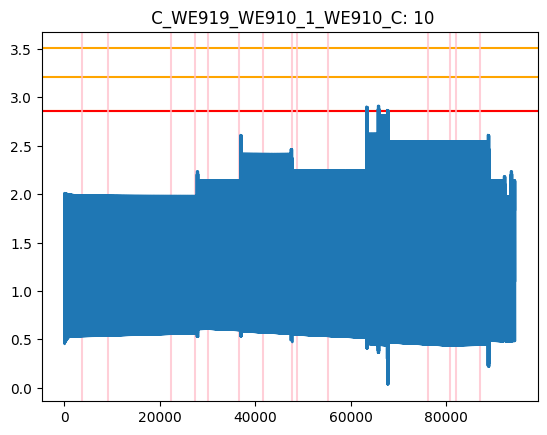

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 22


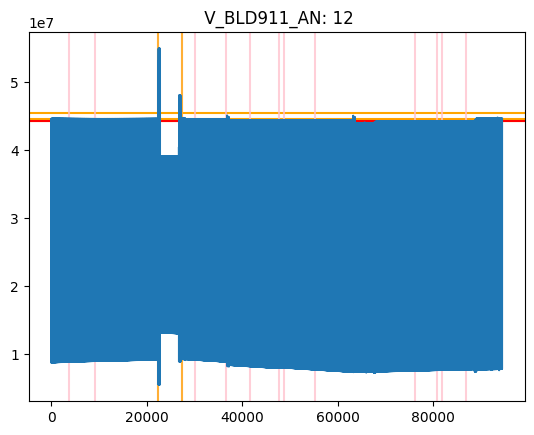

***********************************************************************************************
Sensor: 13  V_BLD911_BN


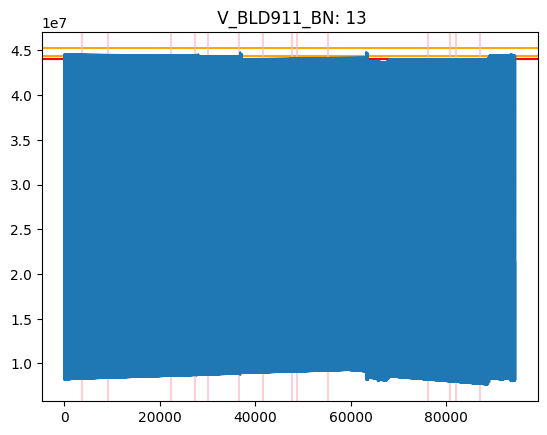

***********************************************************************************************
Sensor: 14  V_BLD911_CN


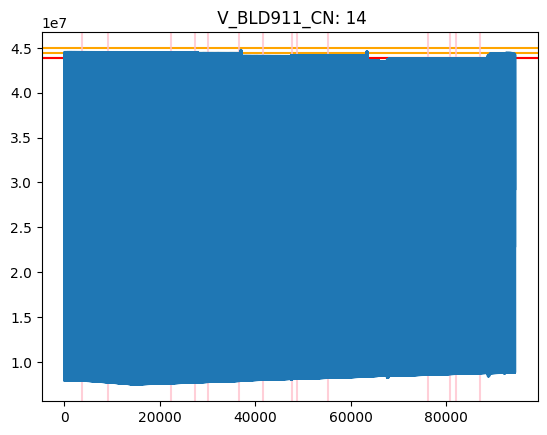

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = None


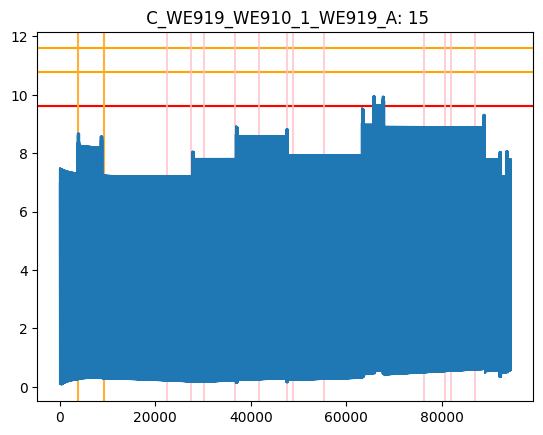

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = None


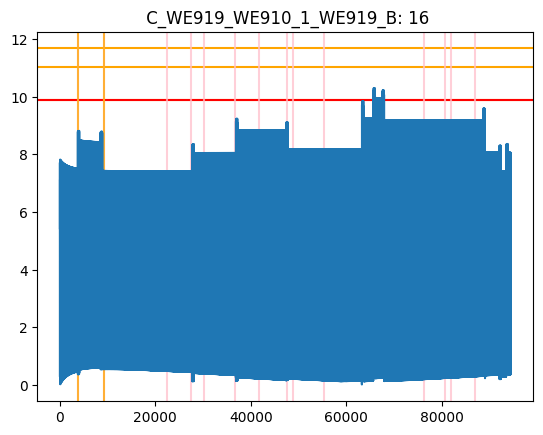

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = None


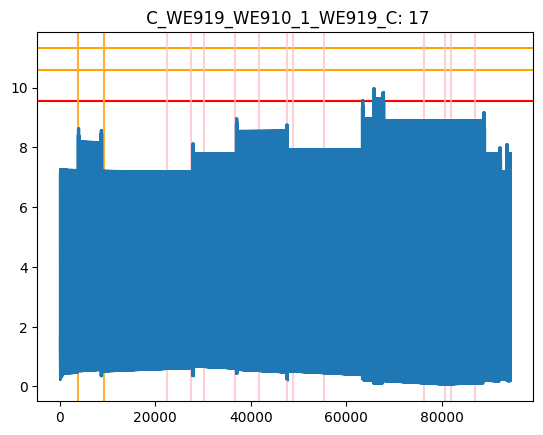

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 22


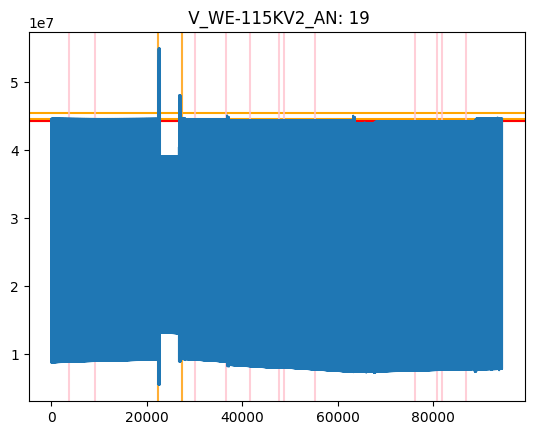

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


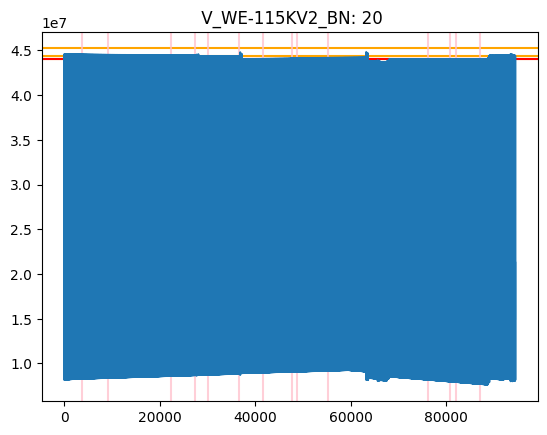

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


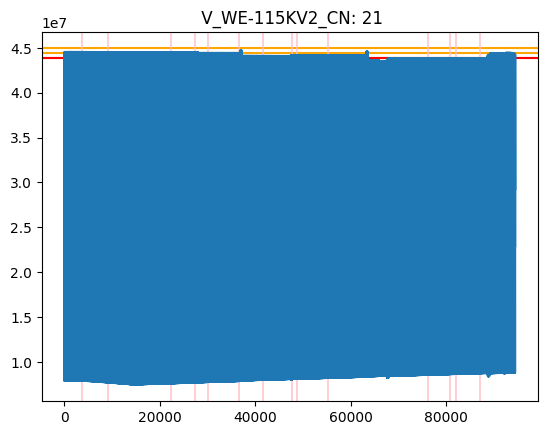

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


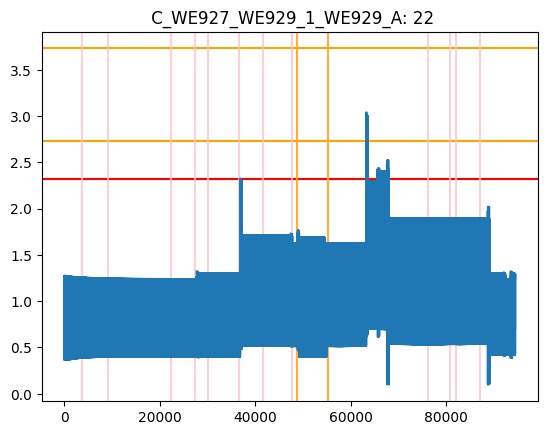

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


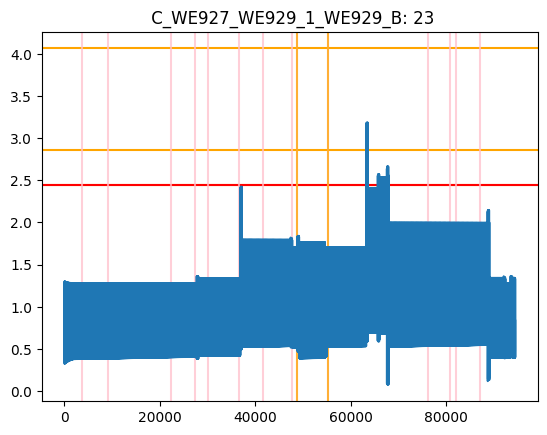

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


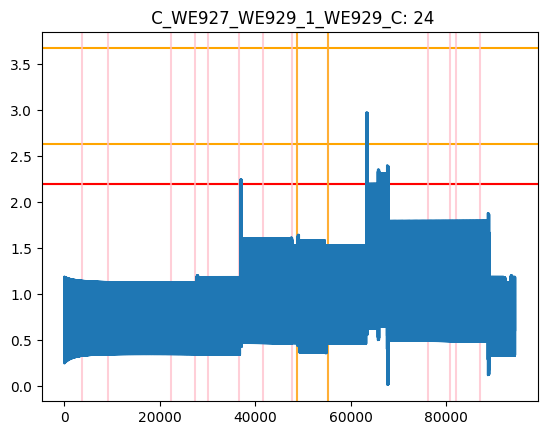

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 22


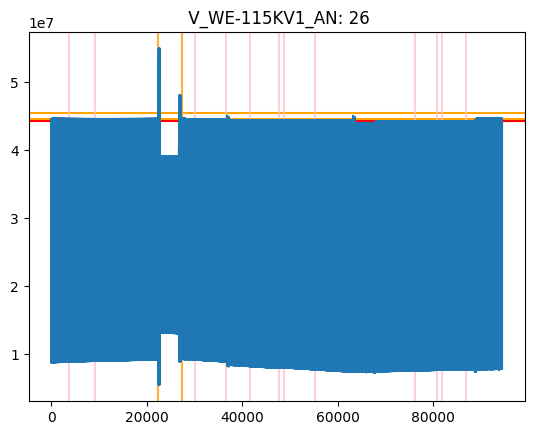

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


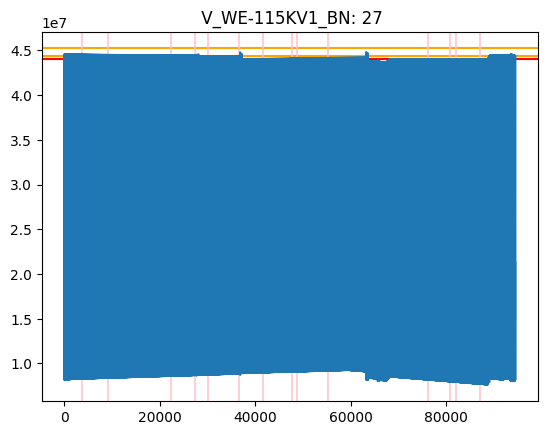

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


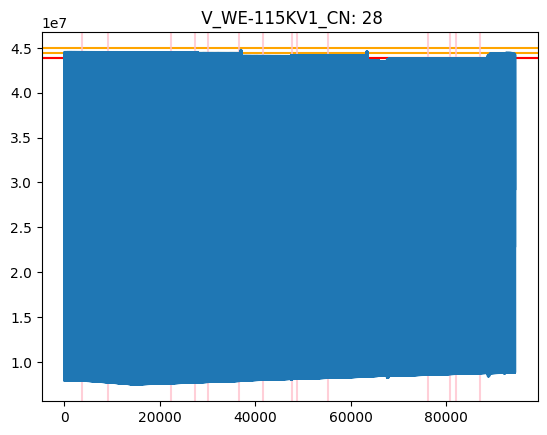

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


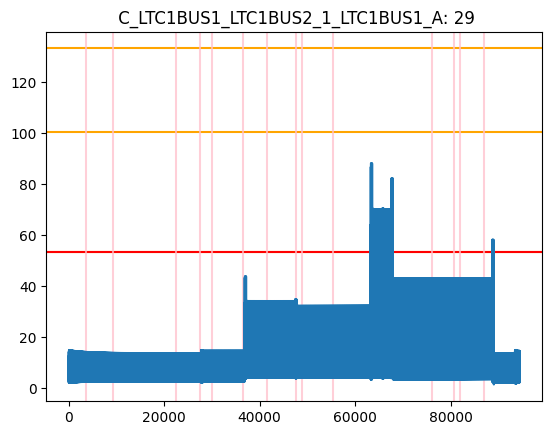

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = None


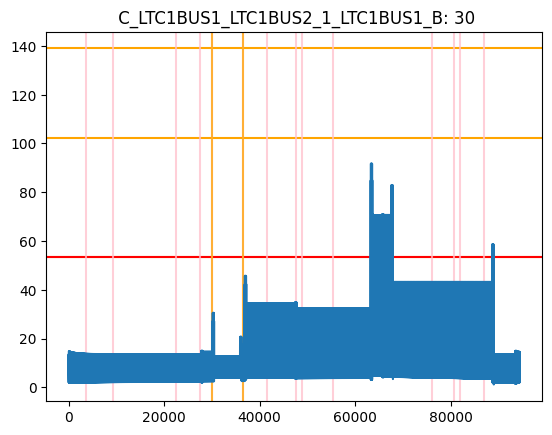

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


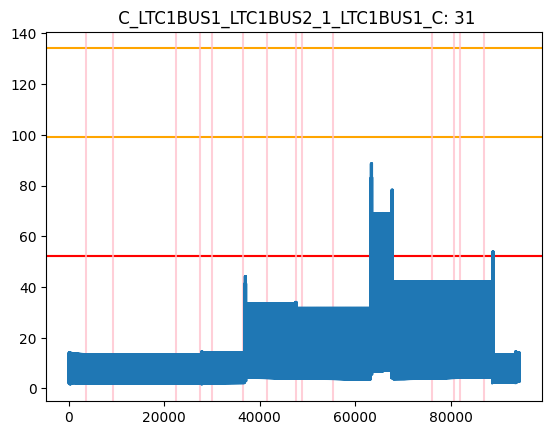

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


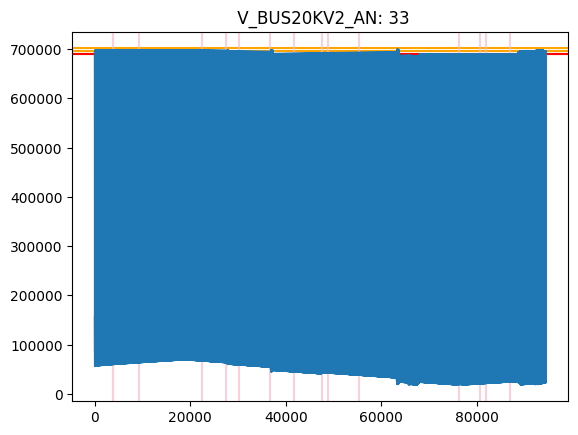

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


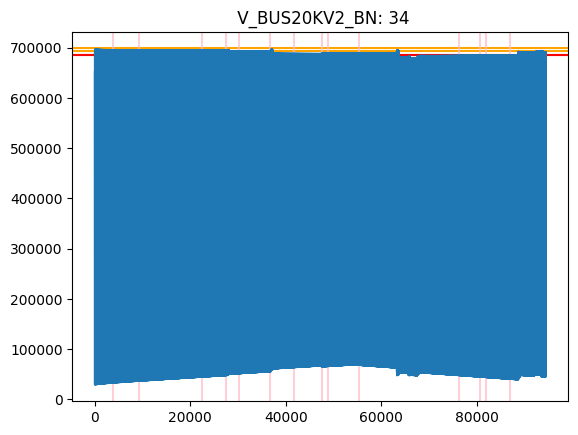

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


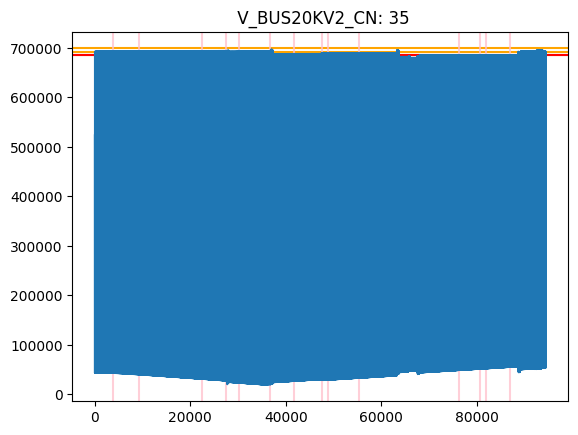

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = None


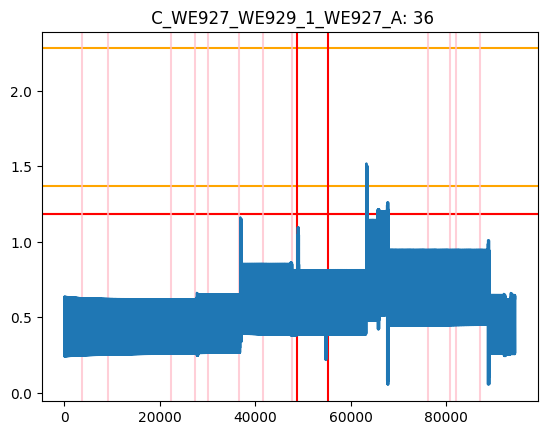

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = None


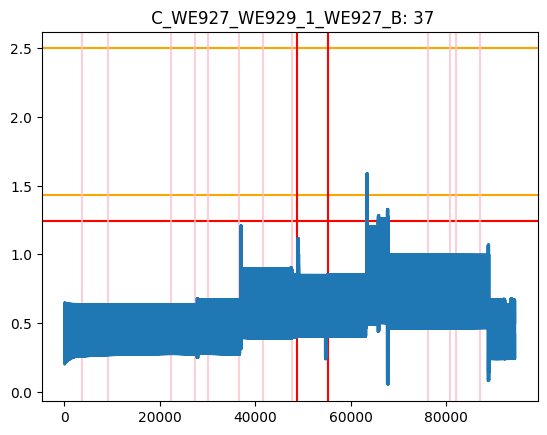

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = None


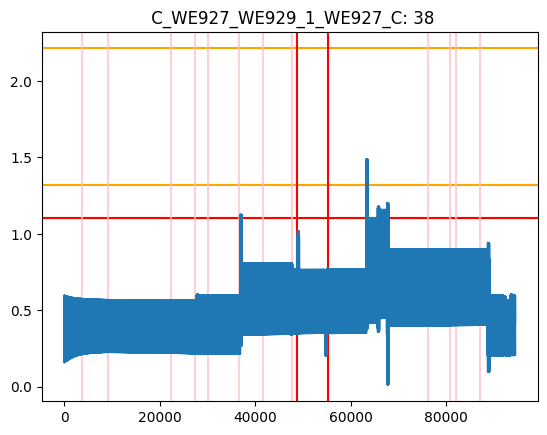

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


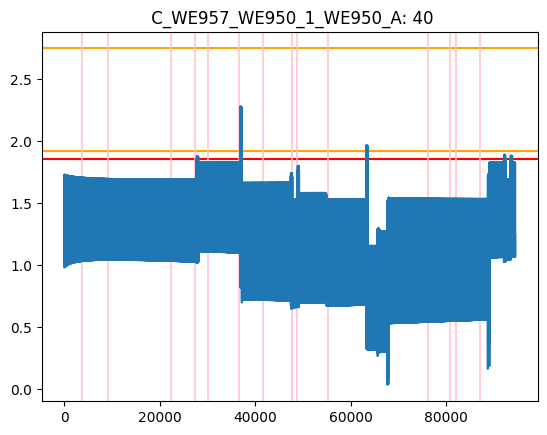

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


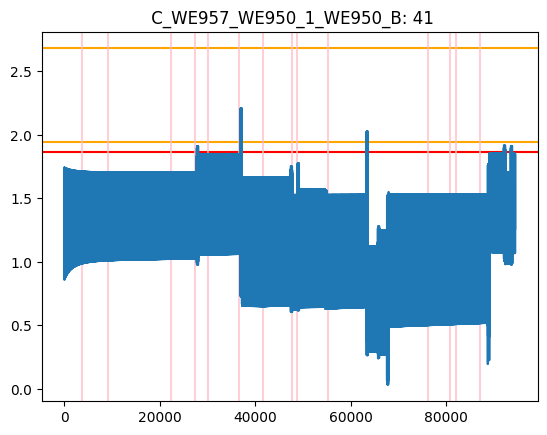

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


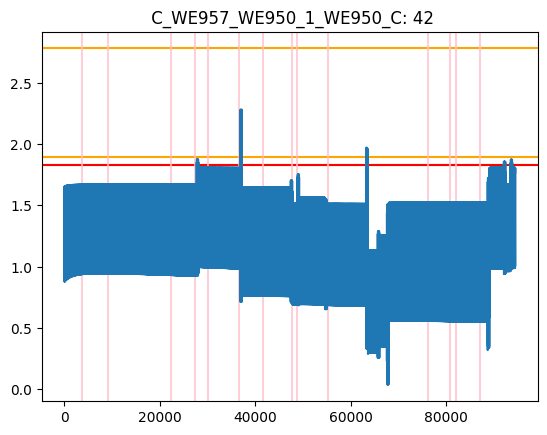

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = None


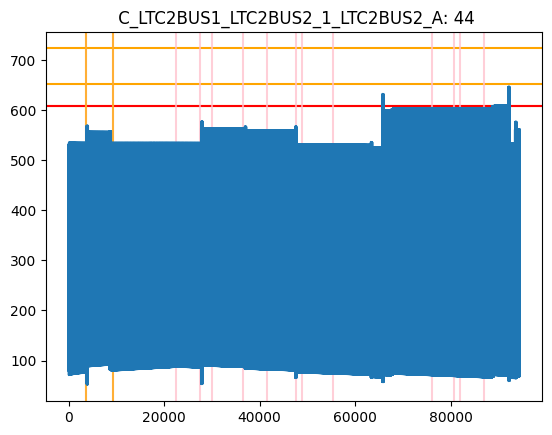

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = None


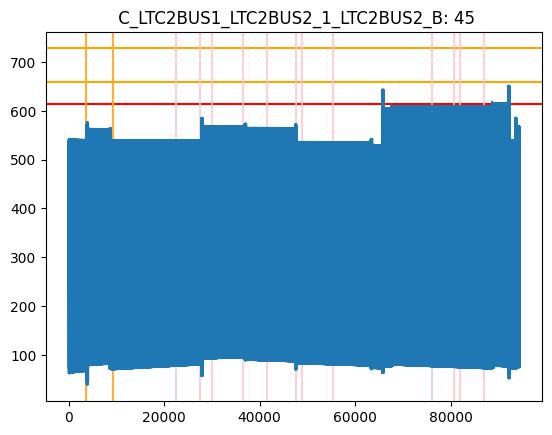

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = None


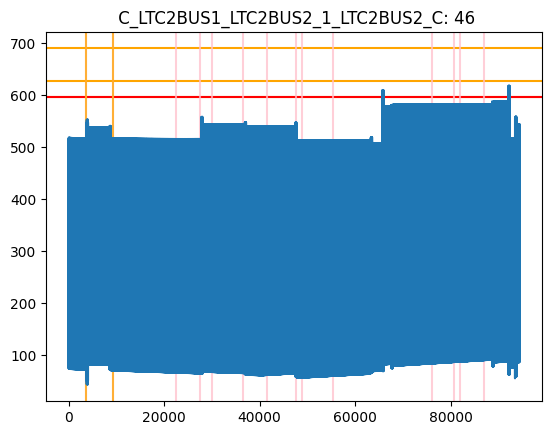

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = 8


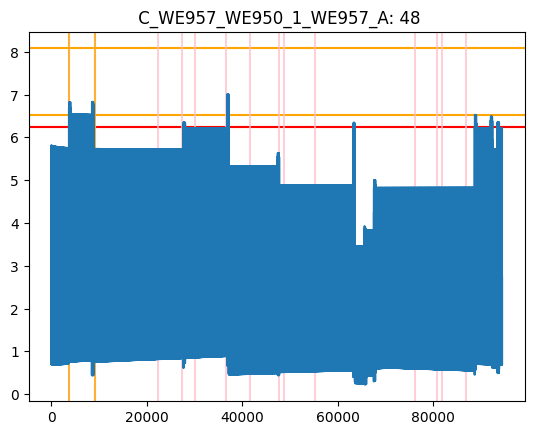

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = 35


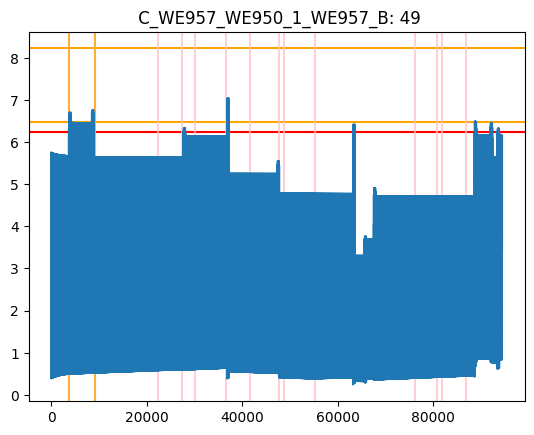

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = 21


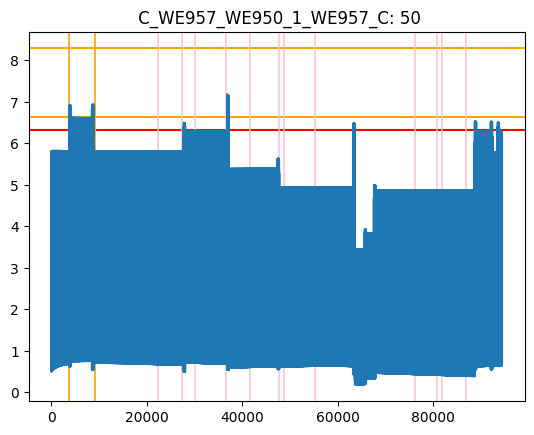

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = 1


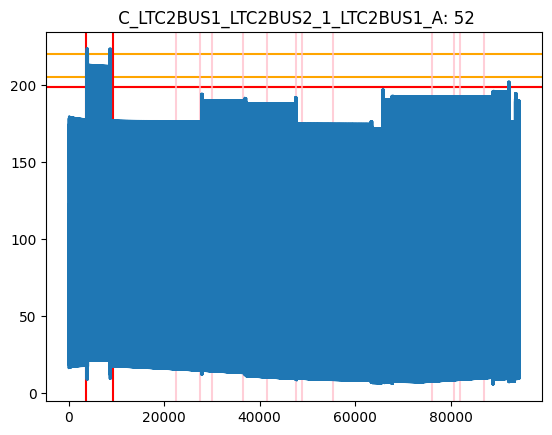

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = 28


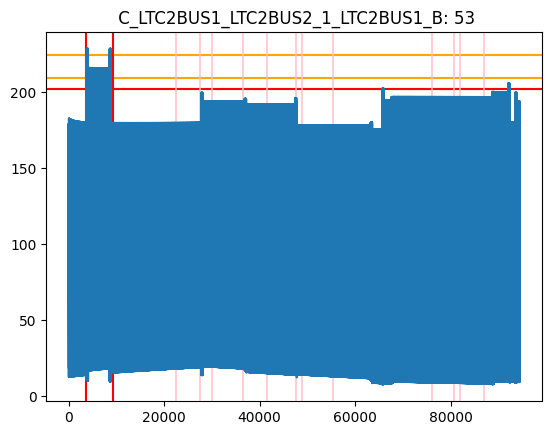

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = 15


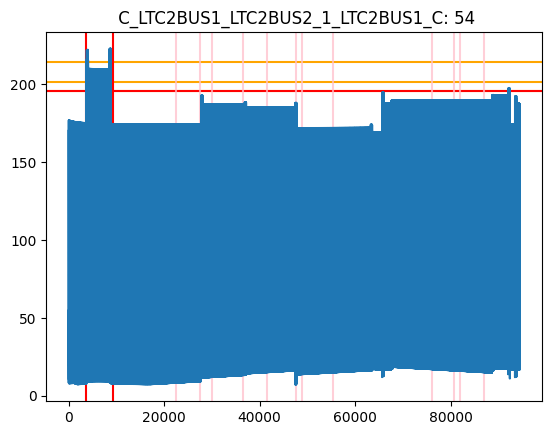

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = 19


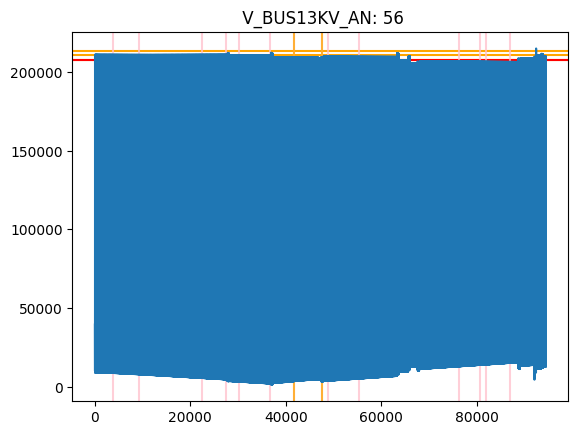

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = 6


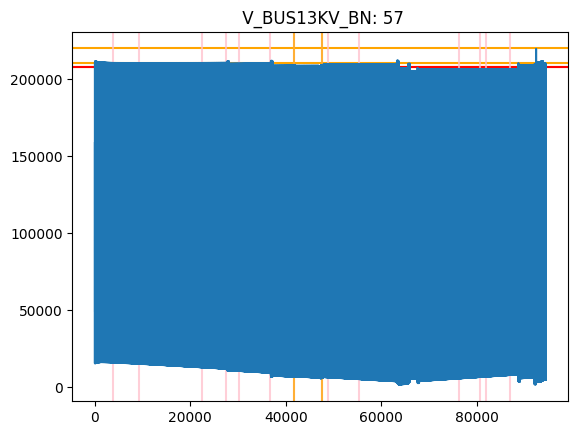

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = 12


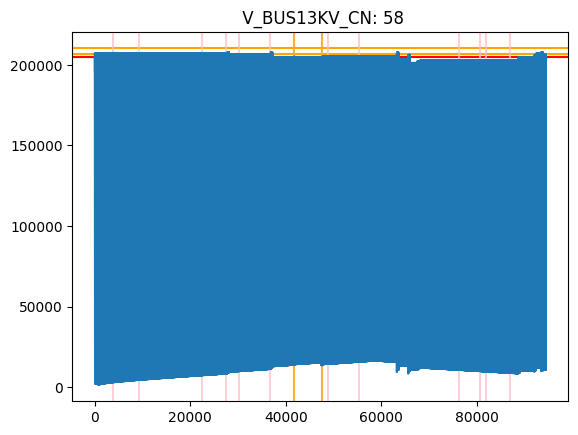

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = None
59
DD = None
59
DD = None


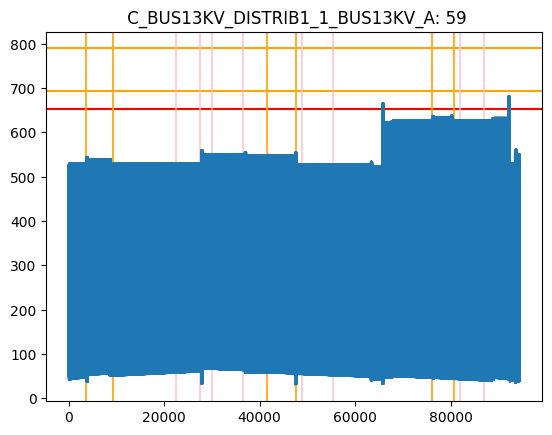

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = None
60
DD = None
60
DD = None


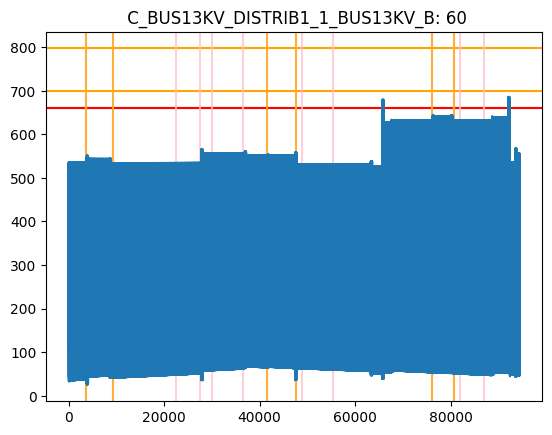

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = None
61
DD = None
61
DD = None


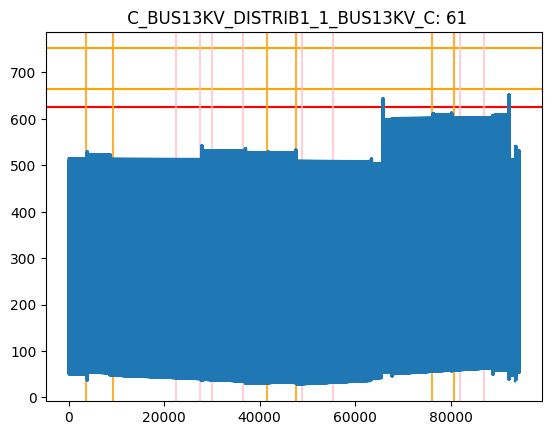

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = 0
62
DD = 15


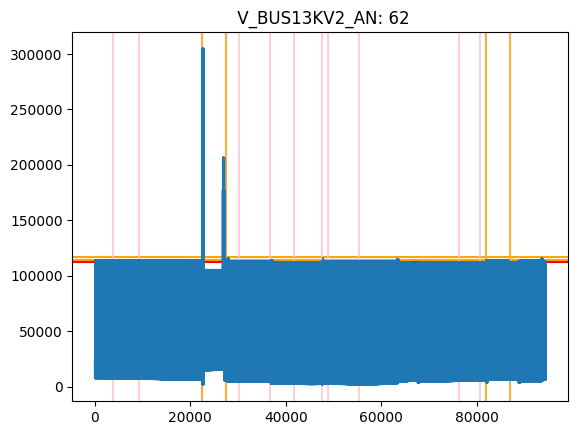

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 25


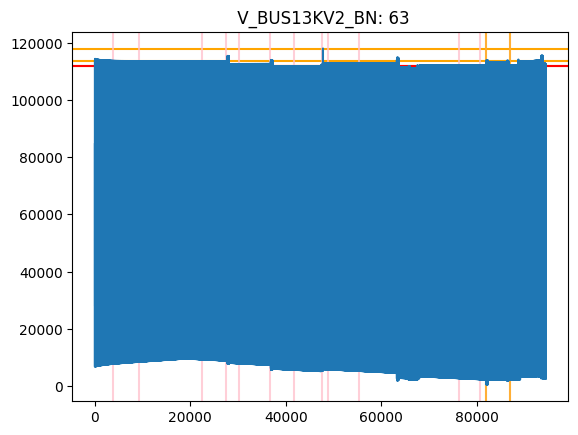

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = 12


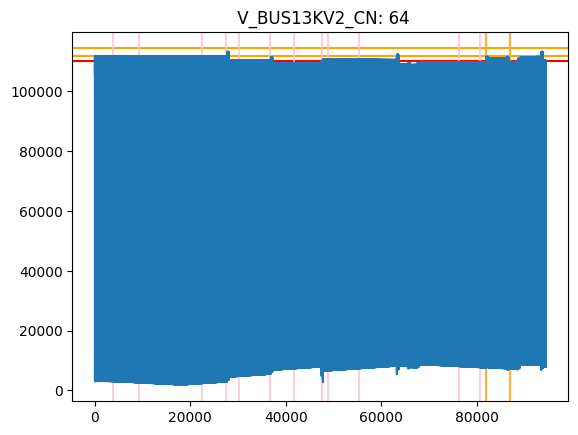

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


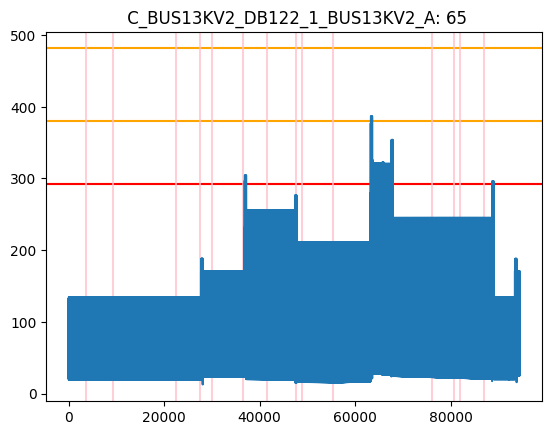

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = 7


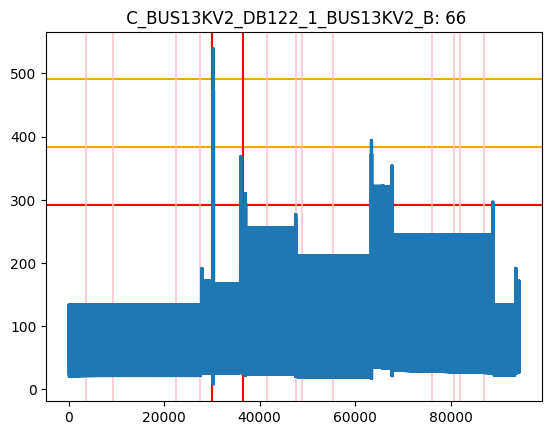

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


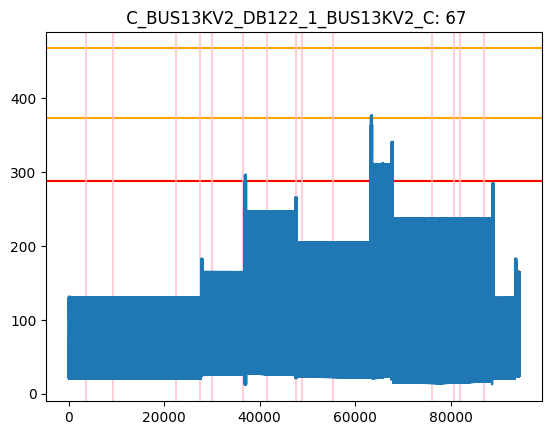

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 0


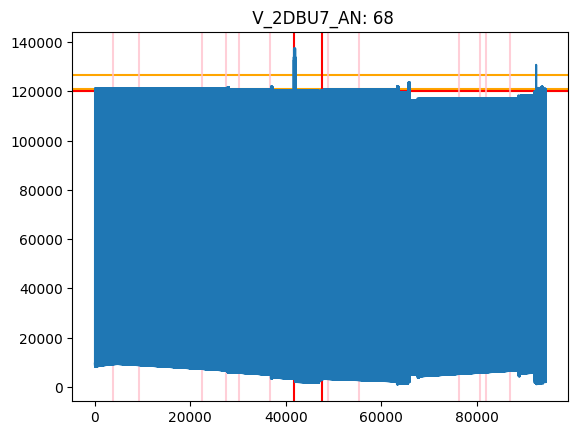

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 5


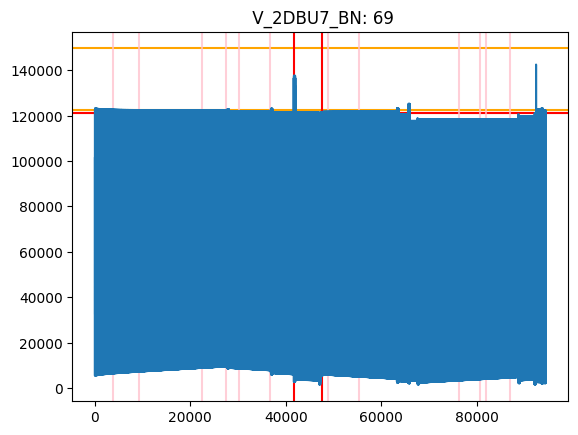

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 12


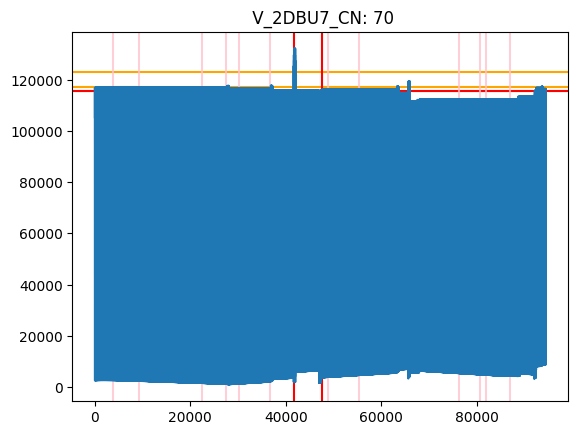

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
DD = 2
DD = None


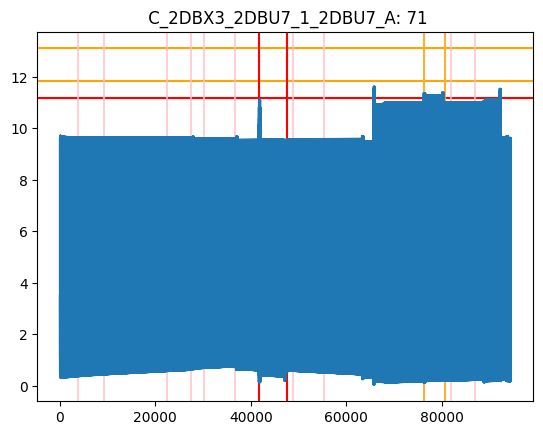

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
DD = 29
DD = None


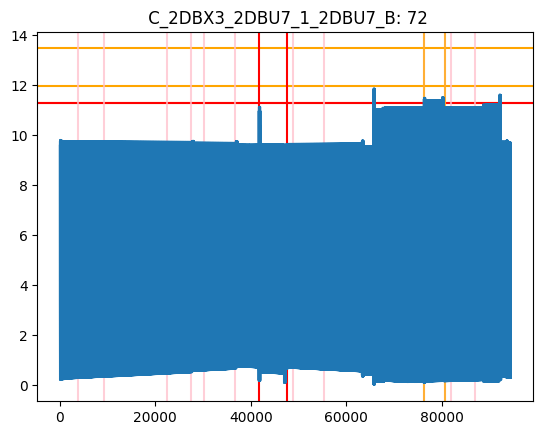

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
DD = 15
DD = 77


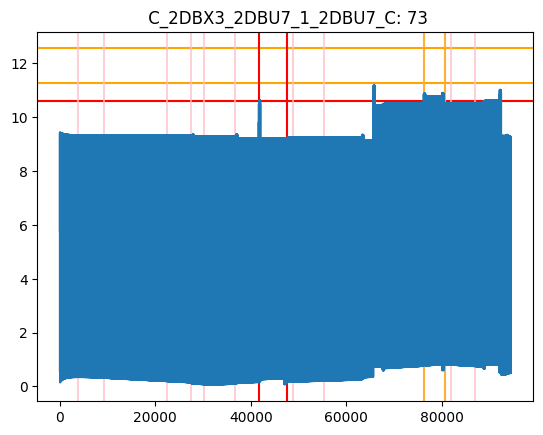

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = 0


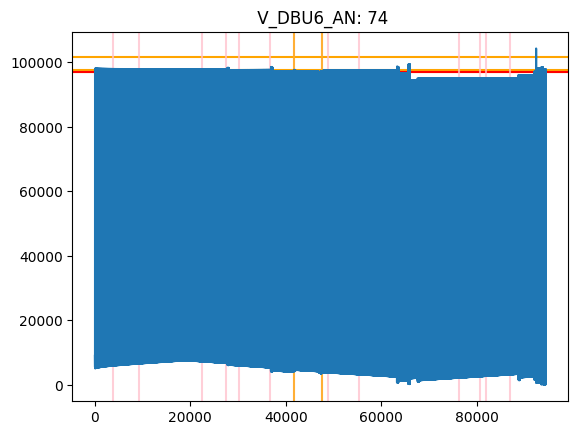

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = 6


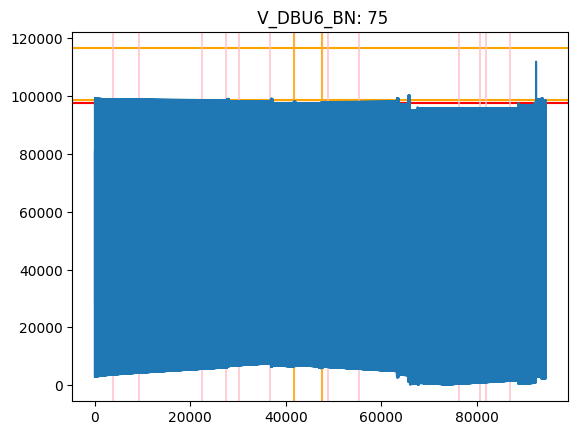

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = 13


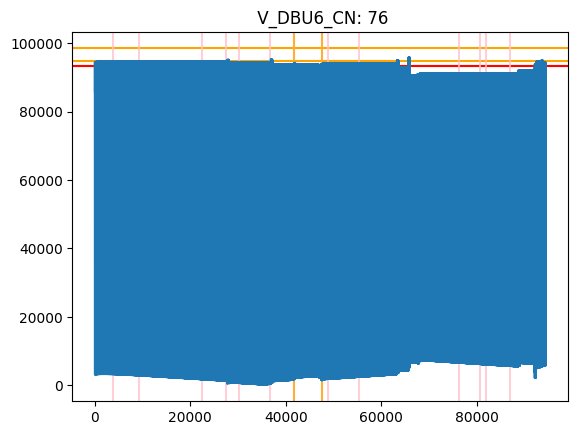

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = None
DD = None


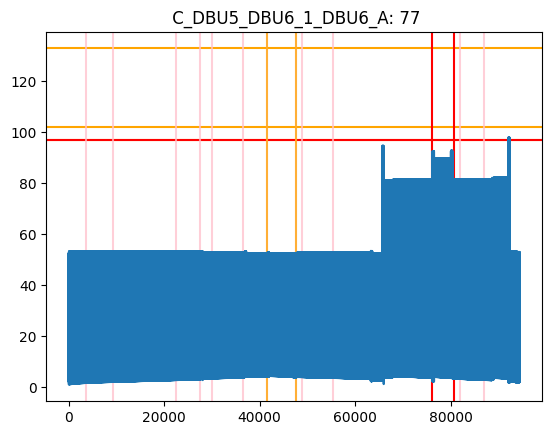

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = None
DD = None


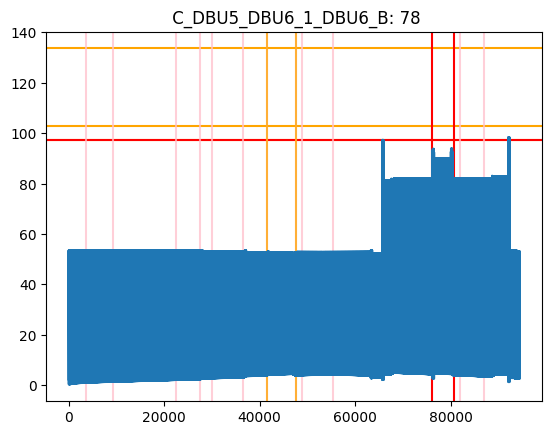

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = None
DD = None


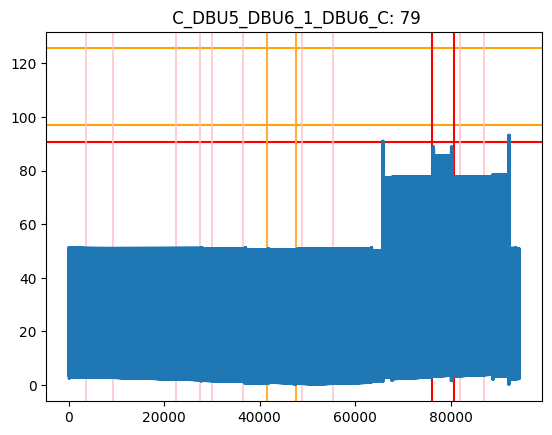

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = 0


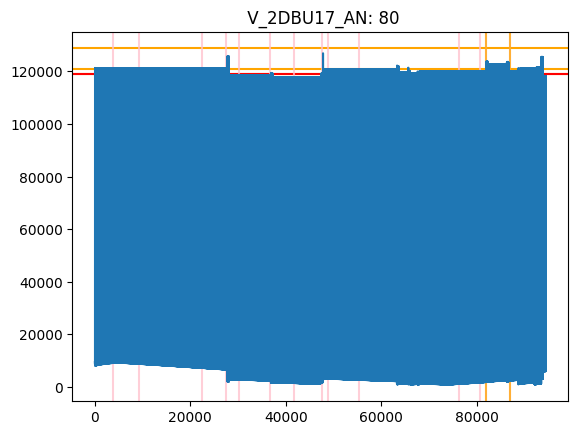

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = 26


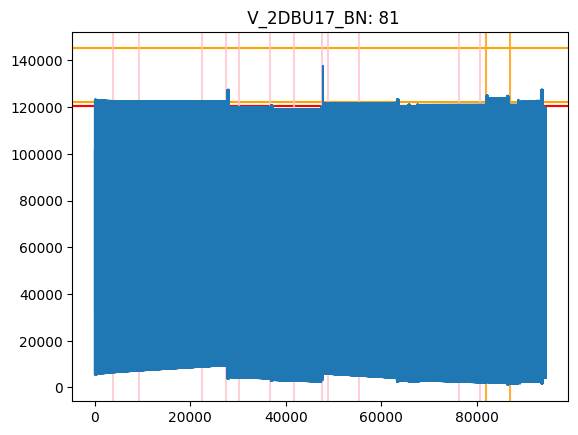

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = 12


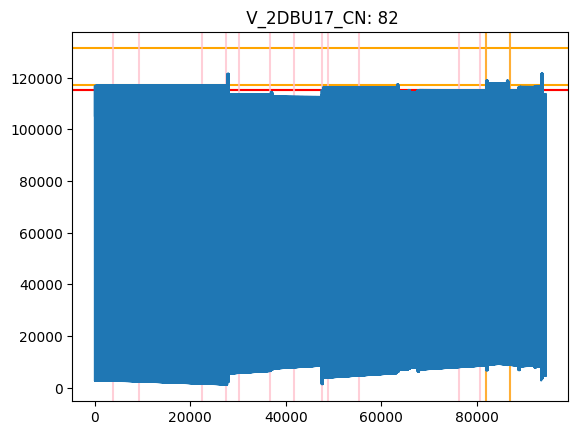

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


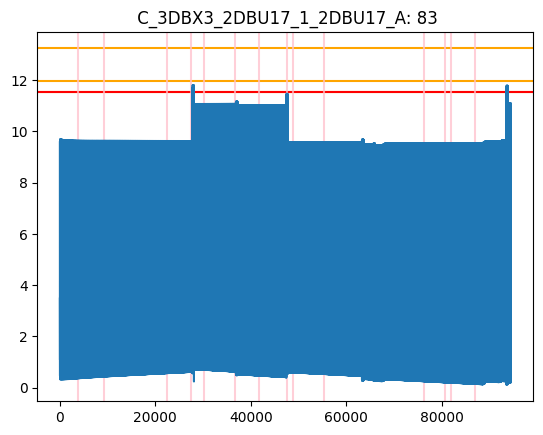

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 7


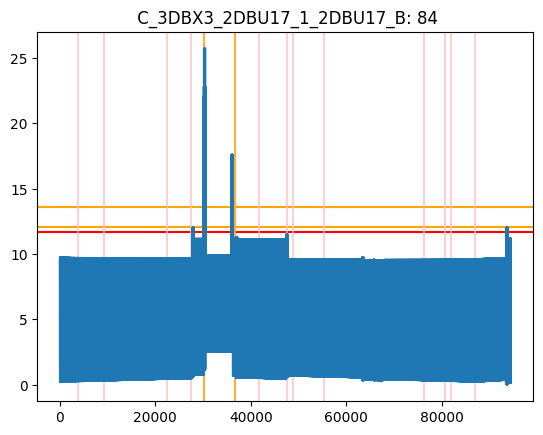

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


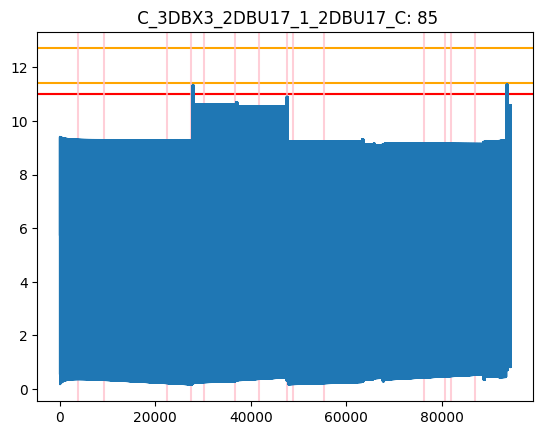

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = 0


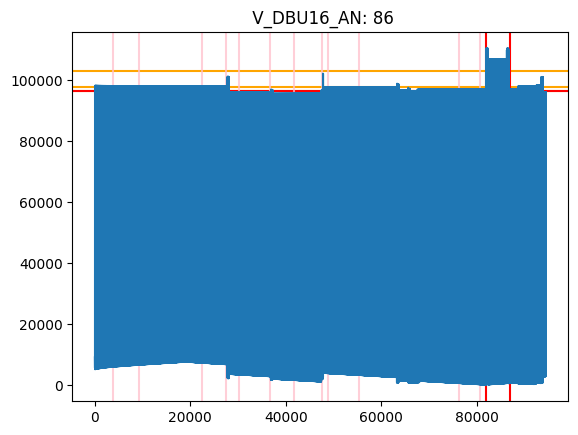

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = 24


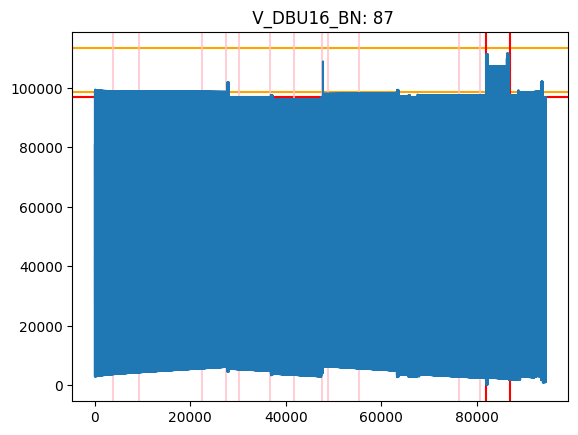

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = 10


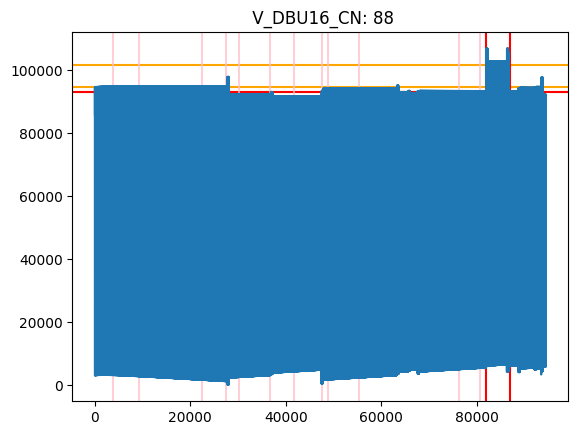

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A


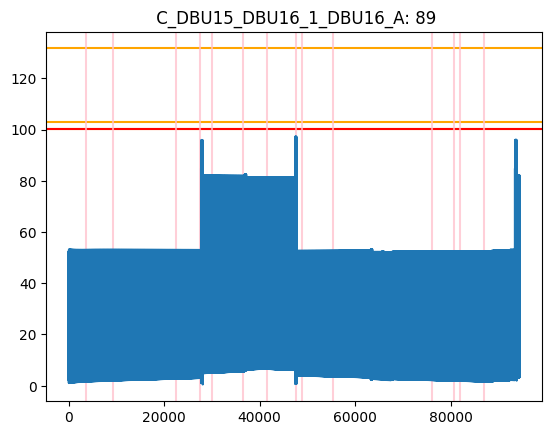

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 6


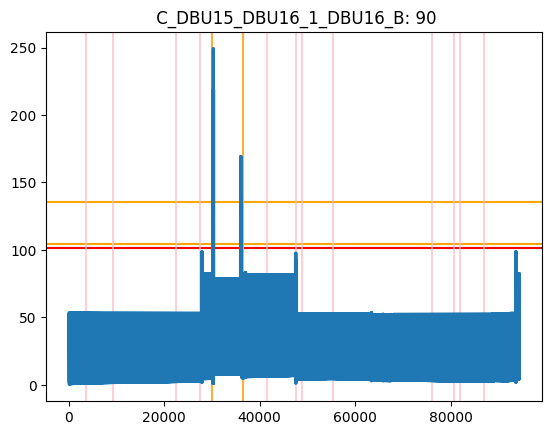

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C


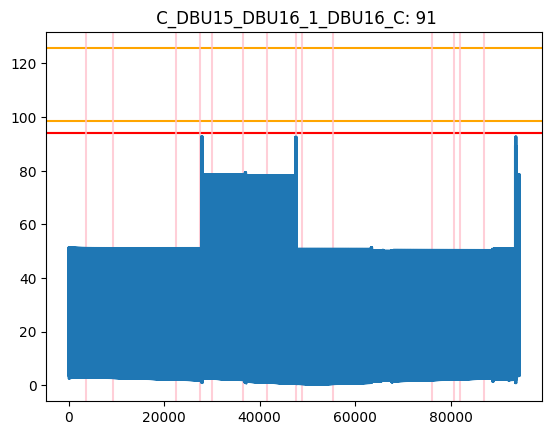

[50, 20, 22, None, None, None, 22, None, None, None, 22, None, None, None, None, None, None, None, 8, 35, 21, 1, 28, 15, 19, 6, 12, None, None, None, None, None, None, None, None, None, 0, 15, 25, 12, 7, 0, 5, 12, 2, None, 29, None, 15, 77, 0, 6, 13, None, None, None, None, None, None, 0, 26, 12, 7, 0, 24, 10, 6]


In [79]:
LD_cov = []
at_neighbor = {}

rsum_list = rsum_list_cov
threshold = thresholds_cov_95
t_list = t_cov
persistency = 1

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_cov.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_cov.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_cov.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_cov)

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


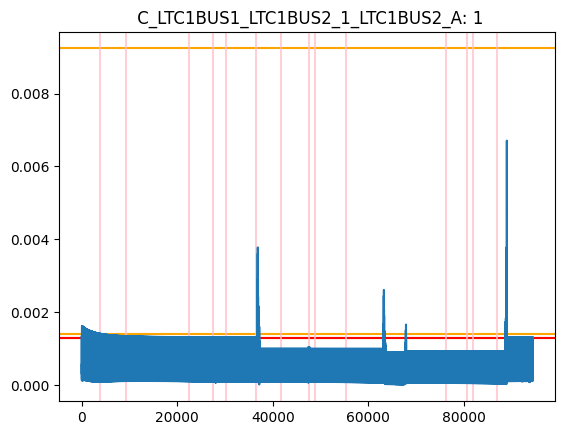

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 0


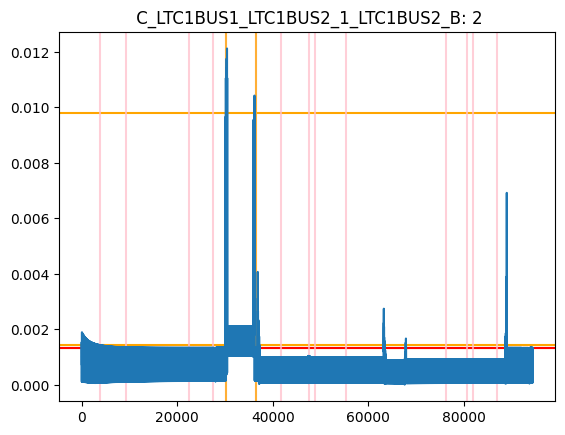

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


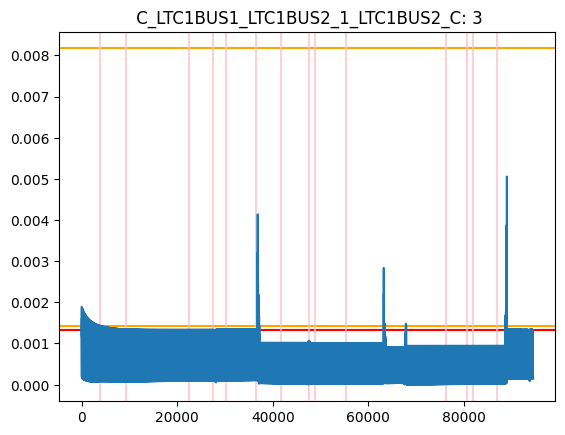

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 0


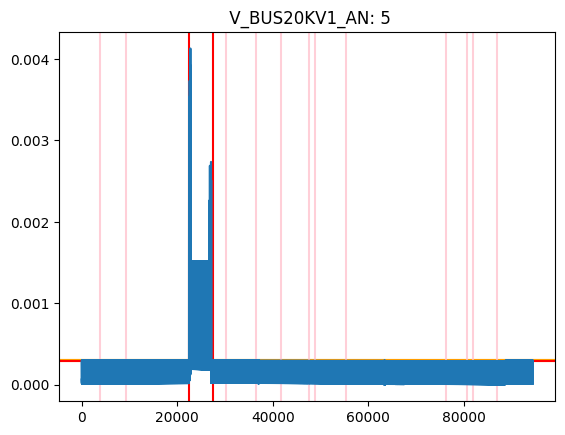

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


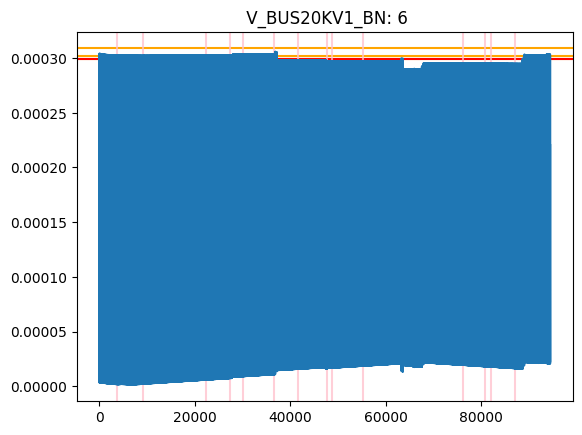

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


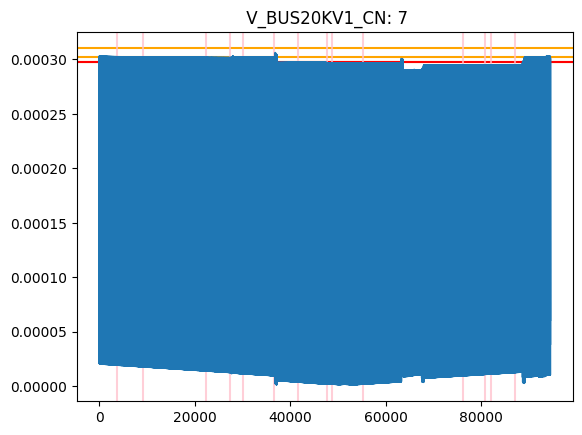

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


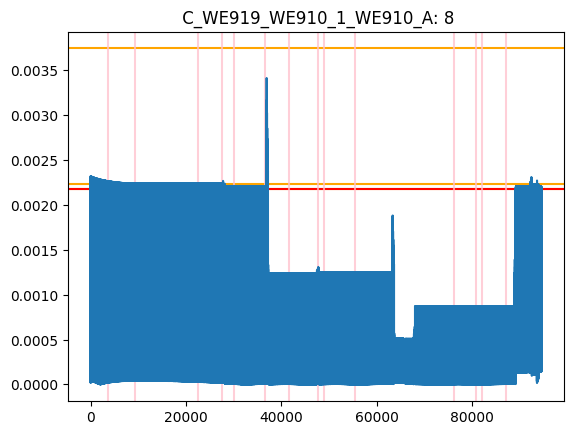

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


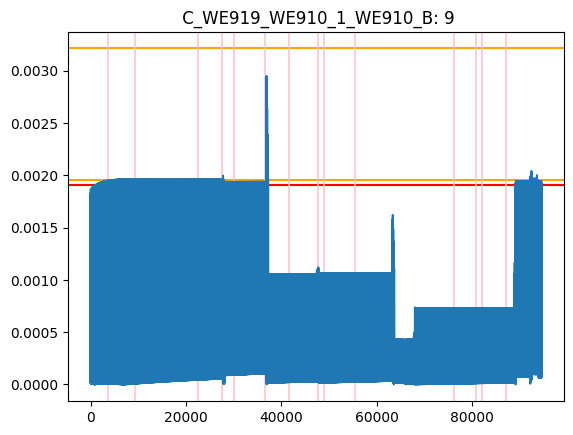

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


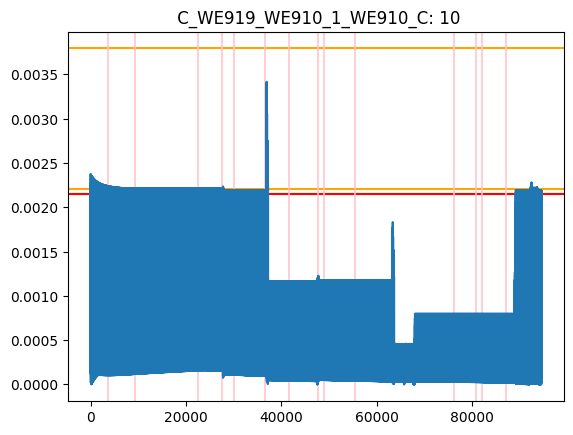

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 0


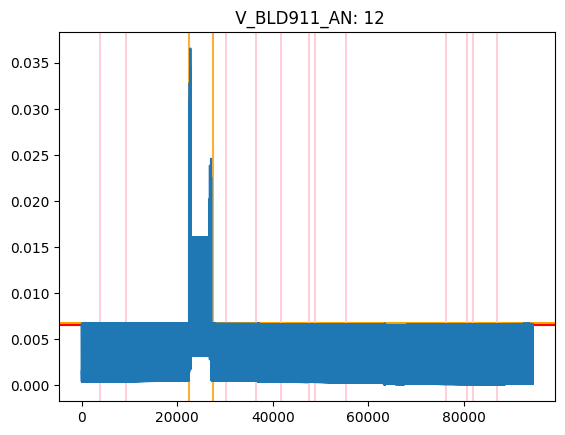

***********************************************************************************************
Sensor: 13  V_BLD911_BN


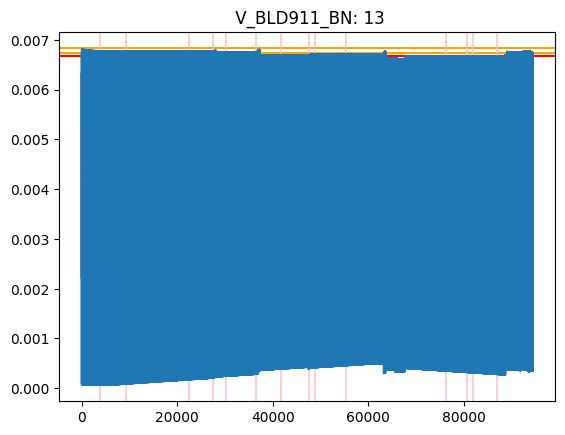

***********************************************************************************************
Sensor: 14  V_BLD911_CN


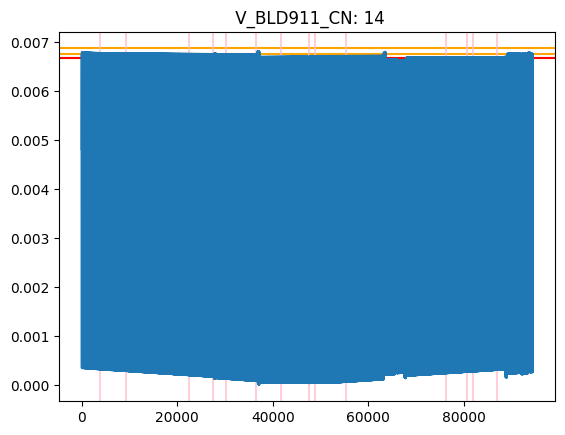

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = 0


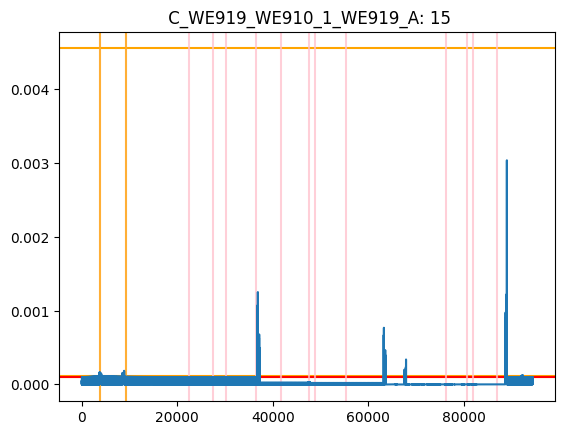

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = 17


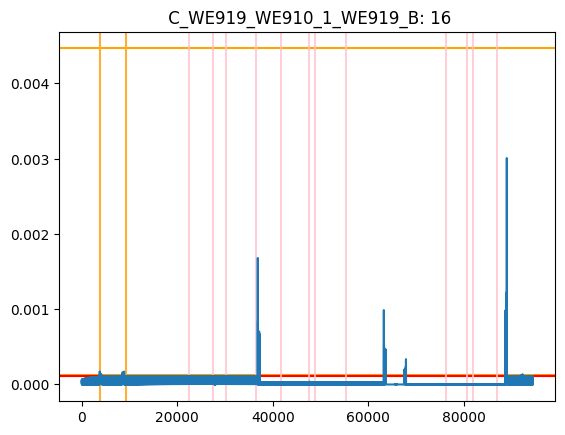

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = 4


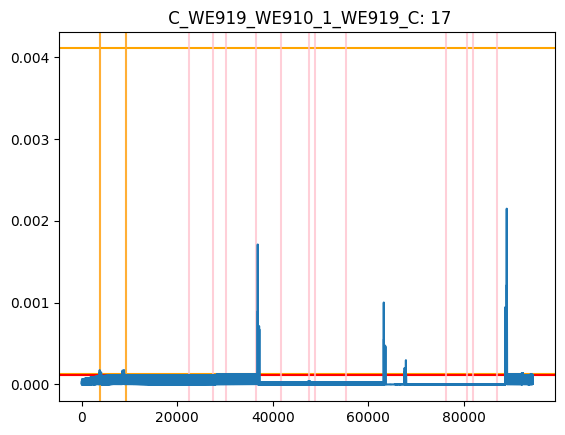

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 0


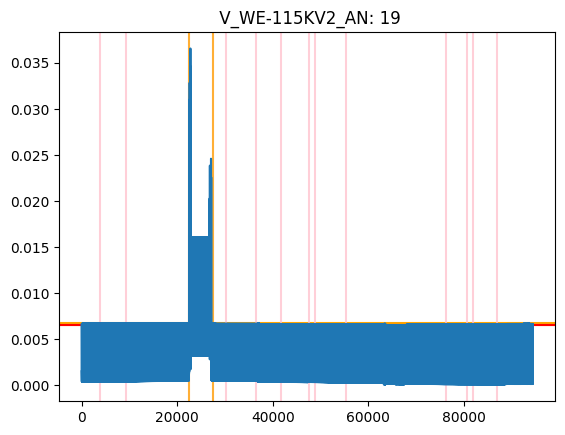

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


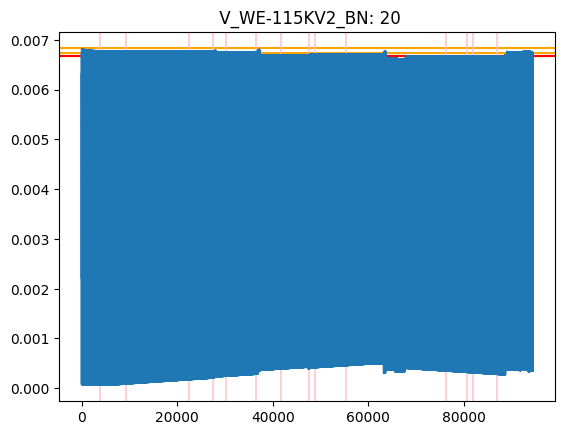

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


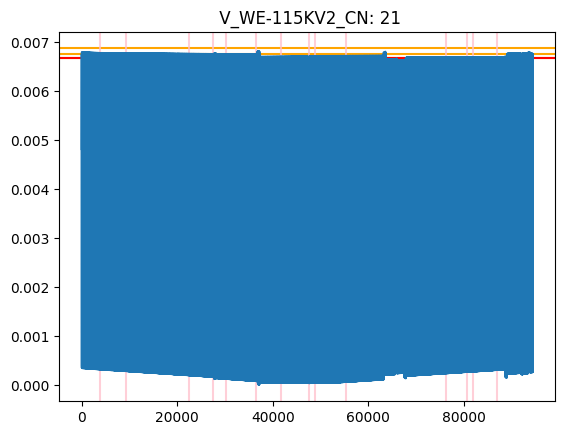

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


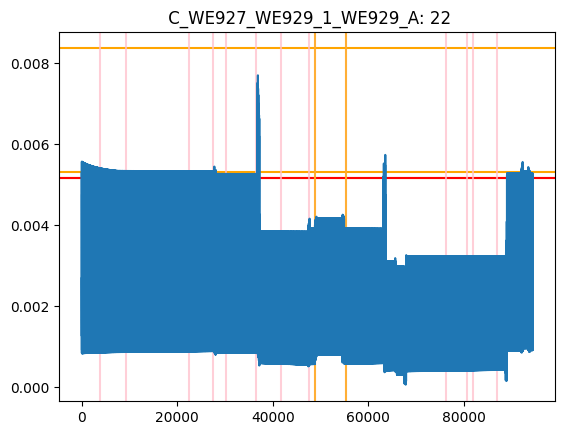

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


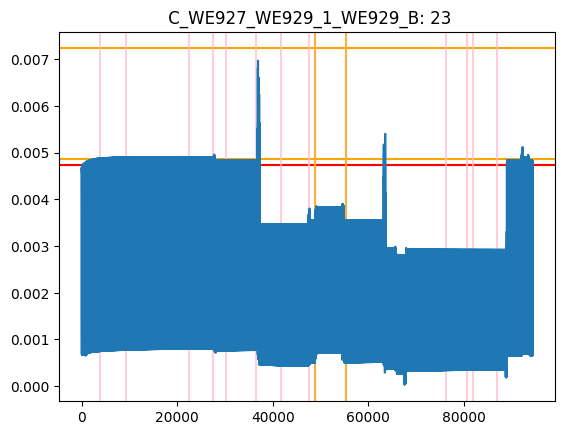

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


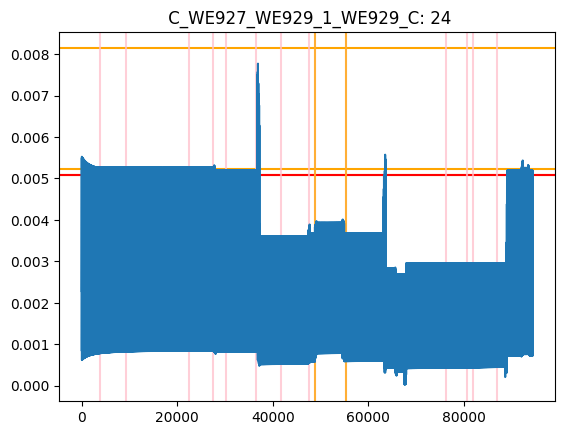

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 0


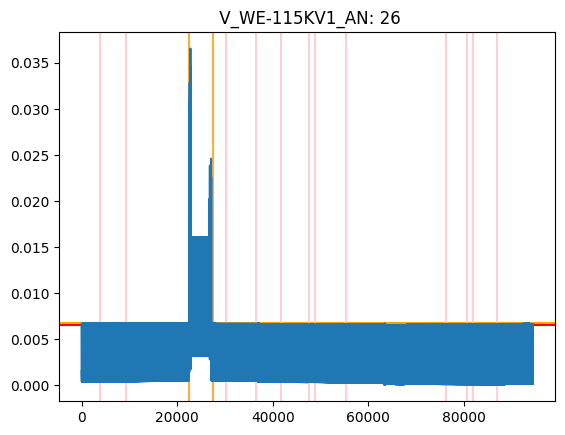

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


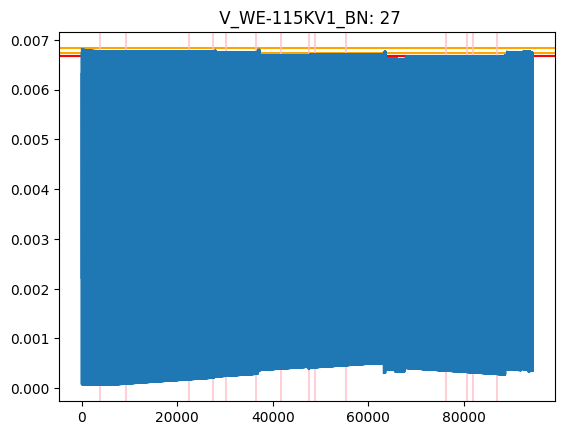

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


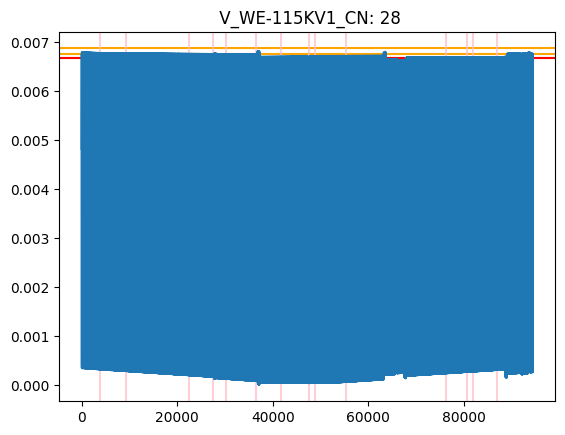

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


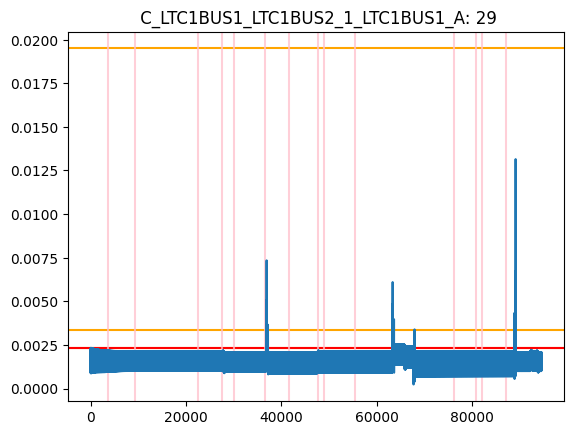

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = 6


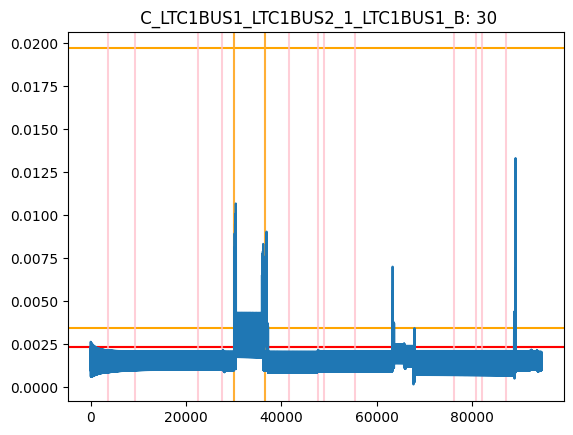

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


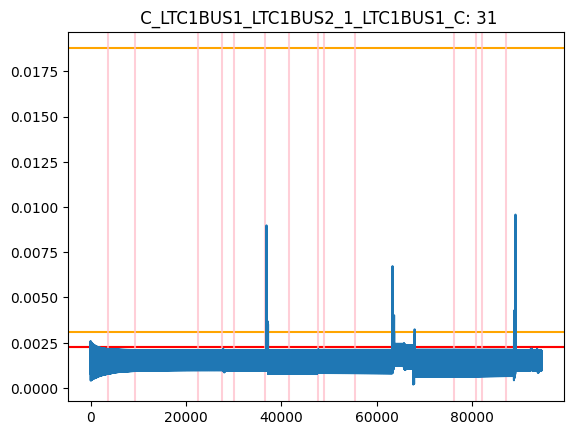

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


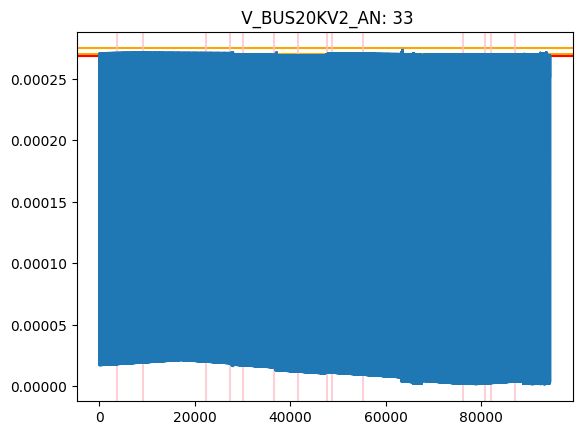

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


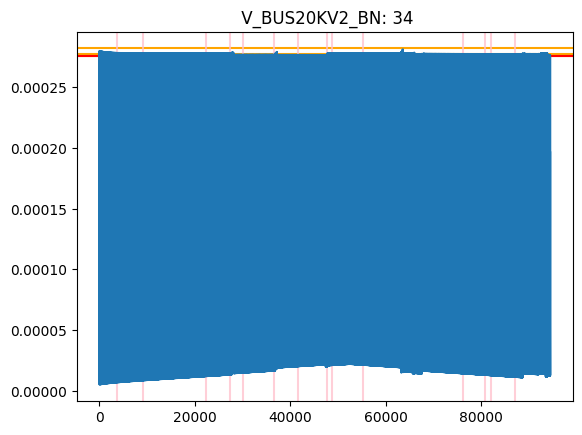

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


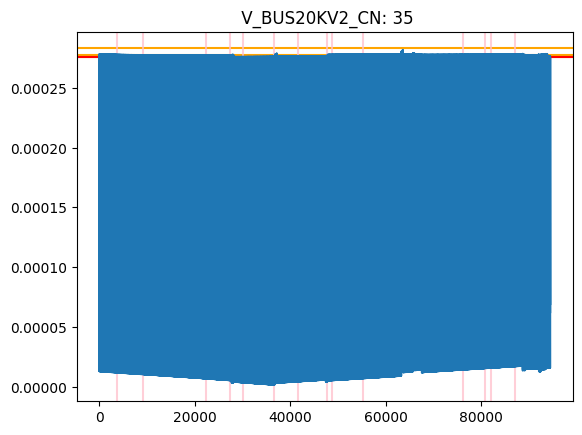

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = 4


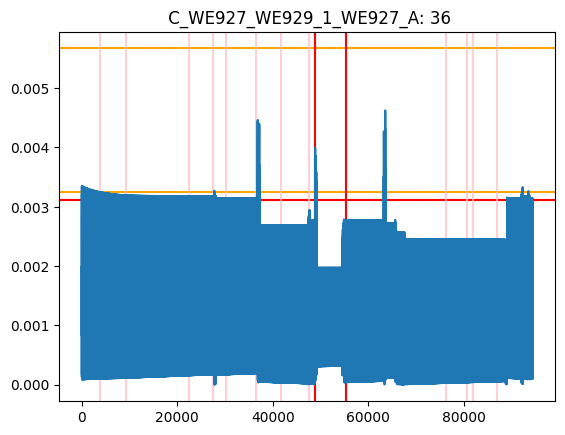

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = 0


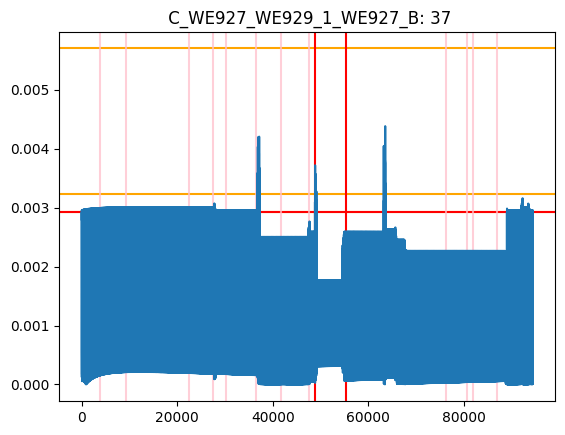

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = 18


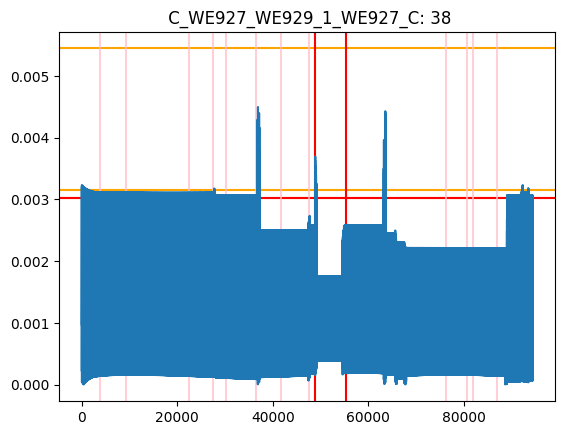

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


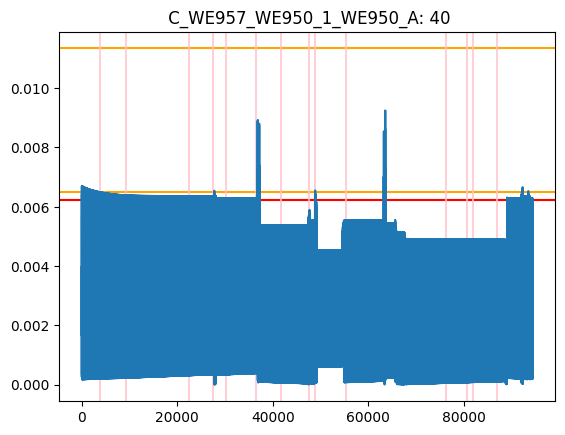

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


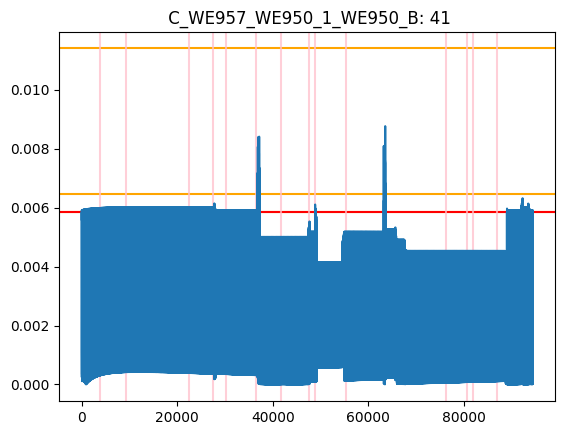

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


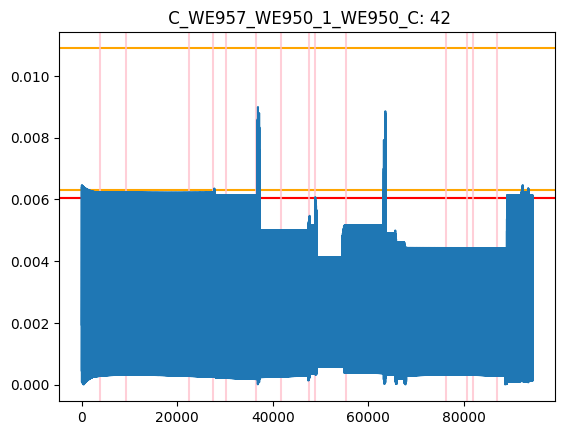

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 364


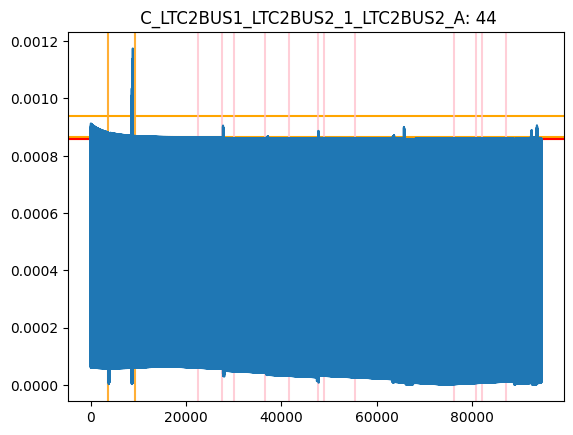

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 350


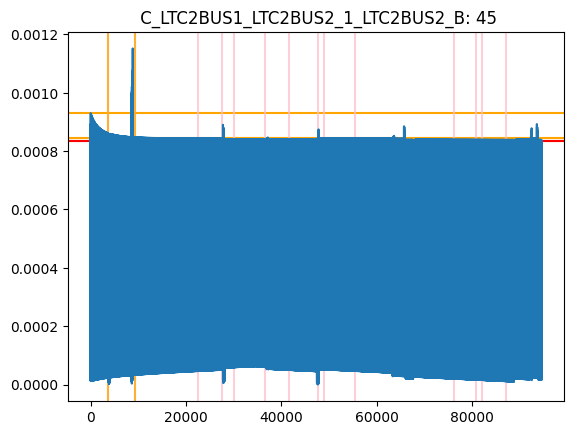

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 358


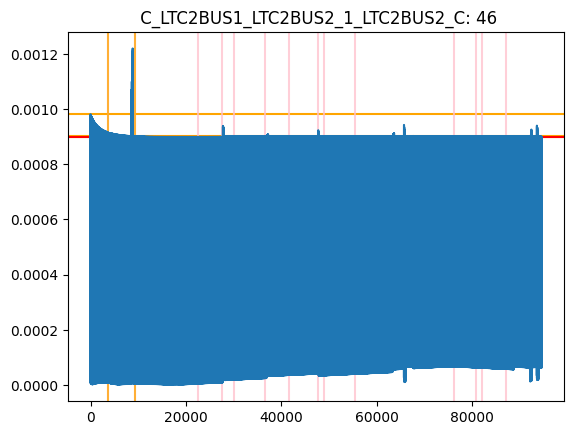

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = None


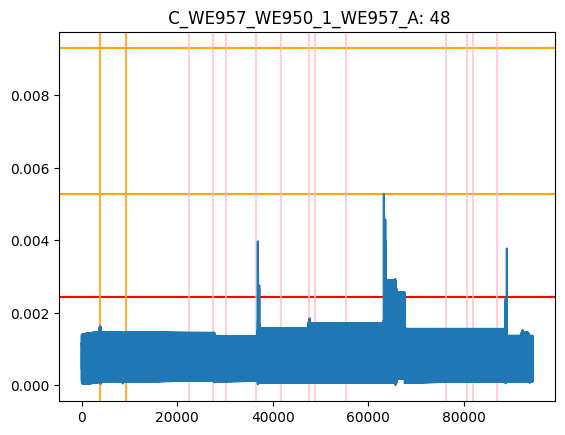

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


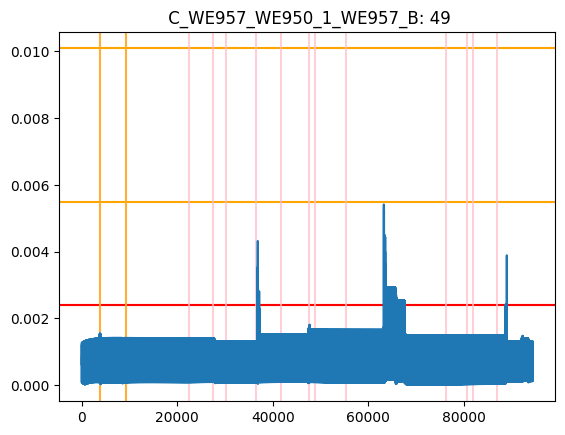

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = None


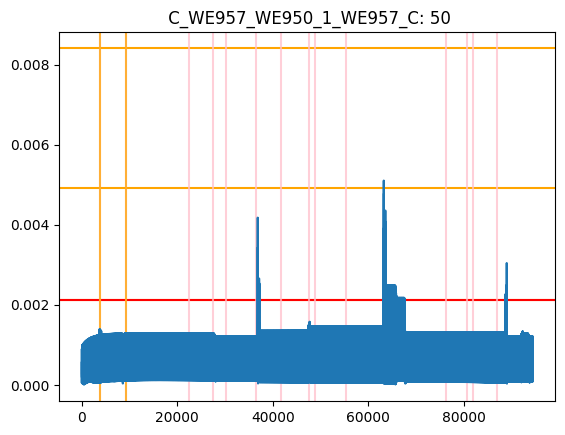

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = 5084


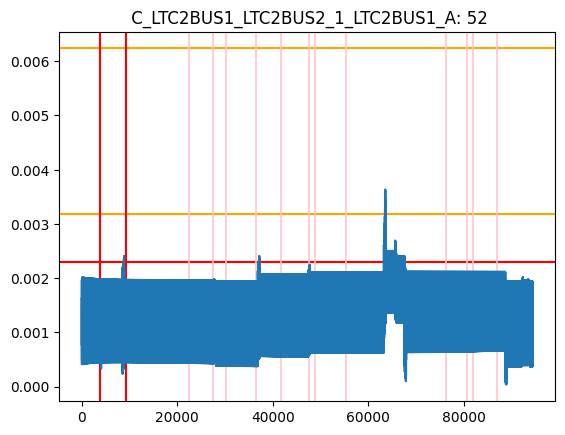

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = 5110


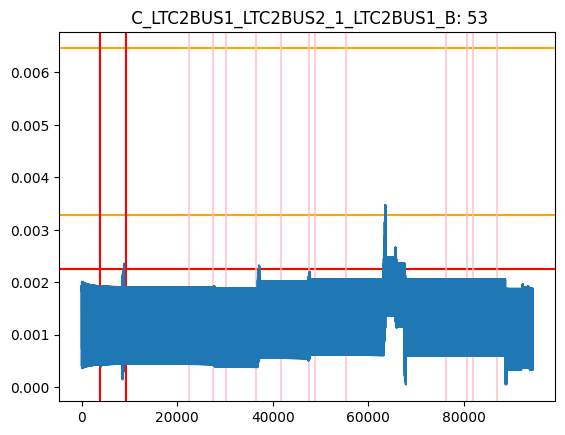

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = 4920


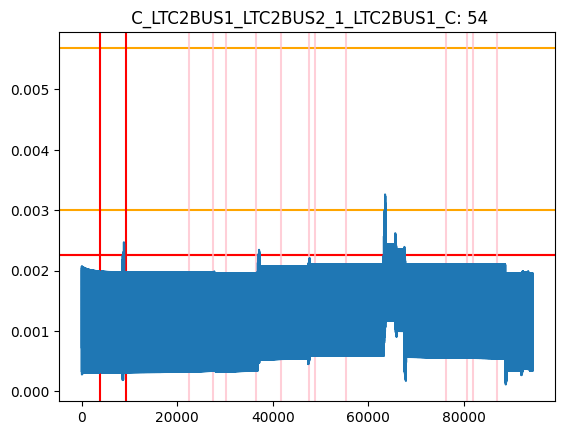

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = None


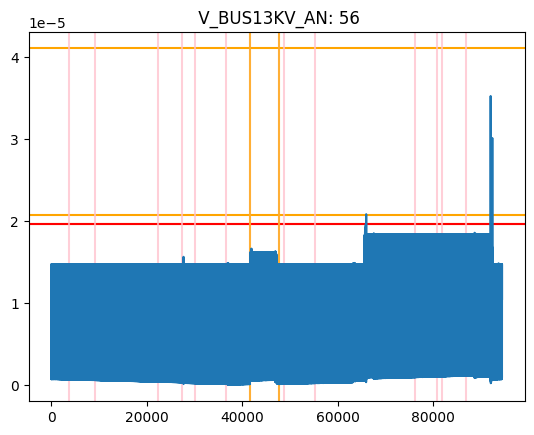

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = None


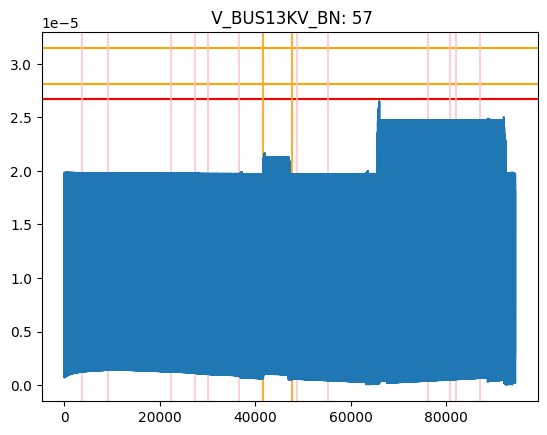

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = None


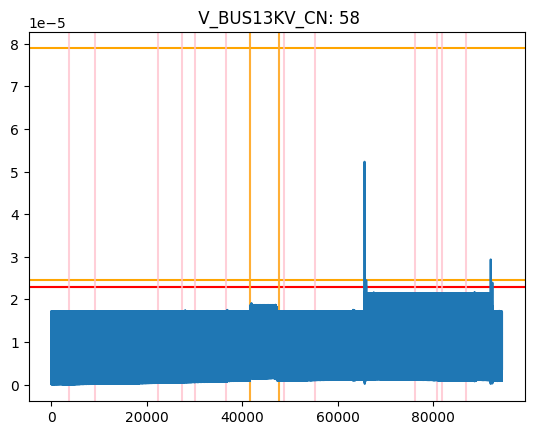

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = 404
59
DD = 4
59
DD = 21


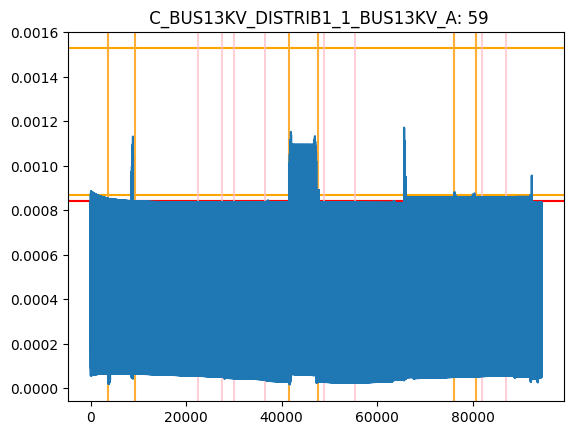

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = 391
60
DD = 11
60
DD = 8


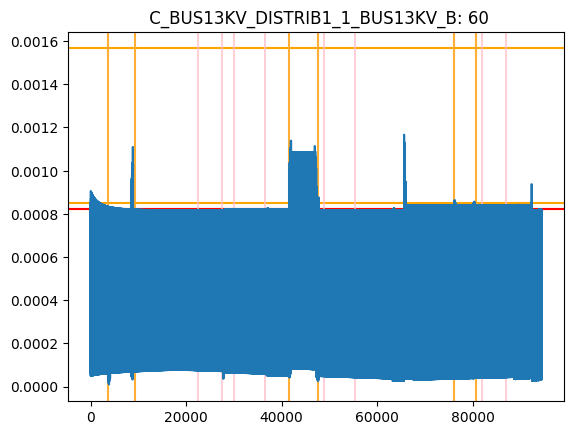

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = 358
61
DD = 0
61
DD = 0


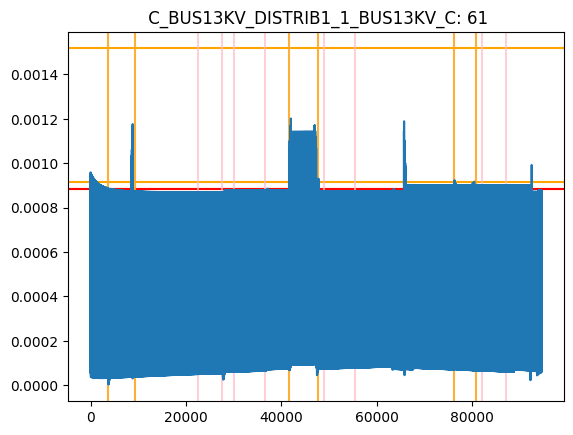

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = None
62
DD = 0


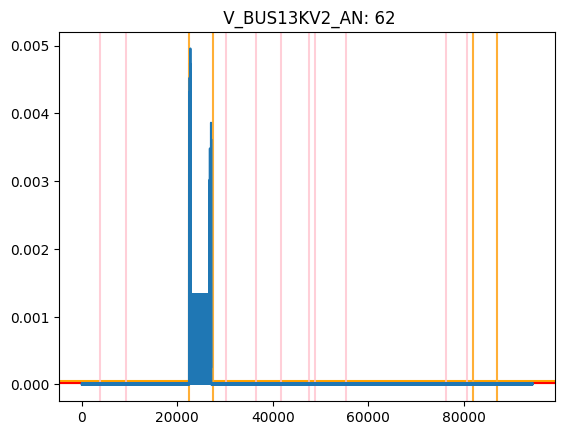

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = None


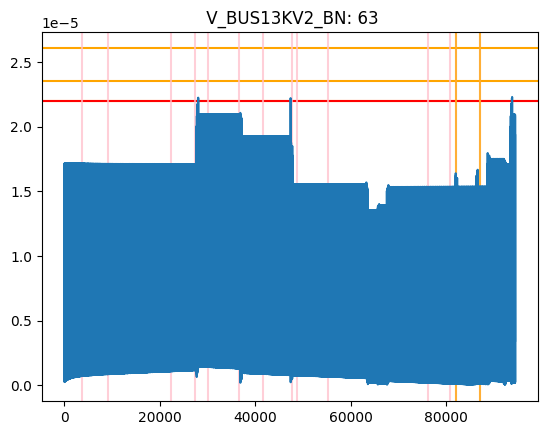

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = None


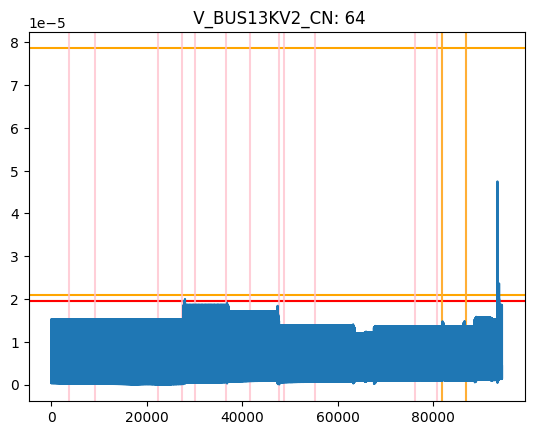

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


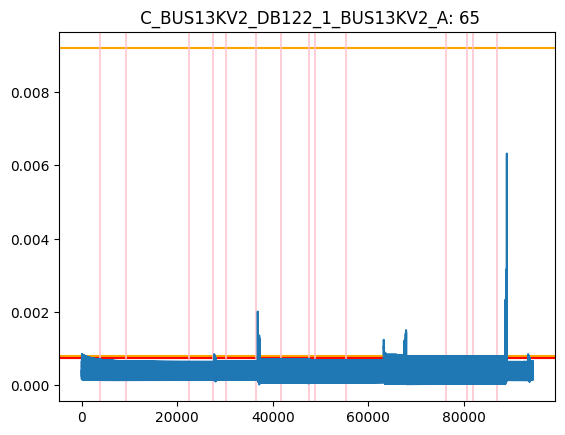

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = 0


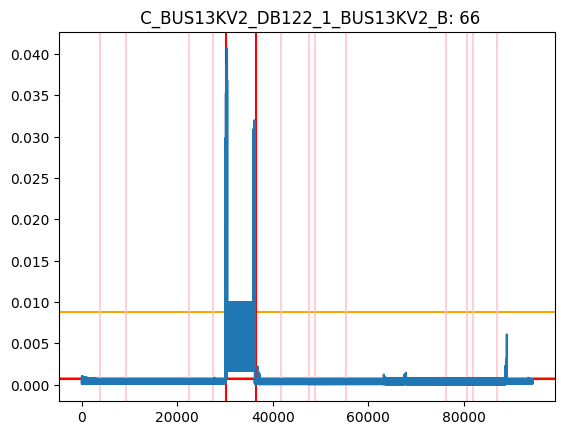

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


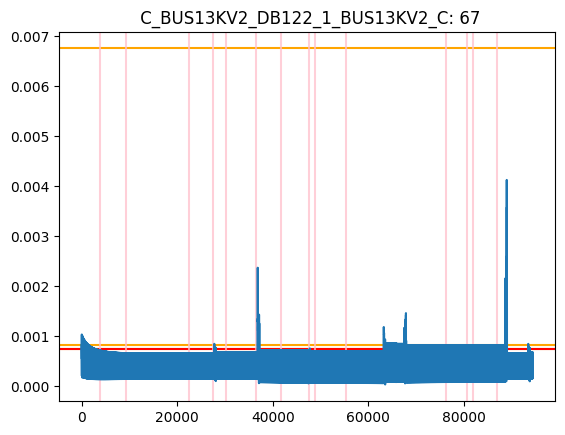

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 1


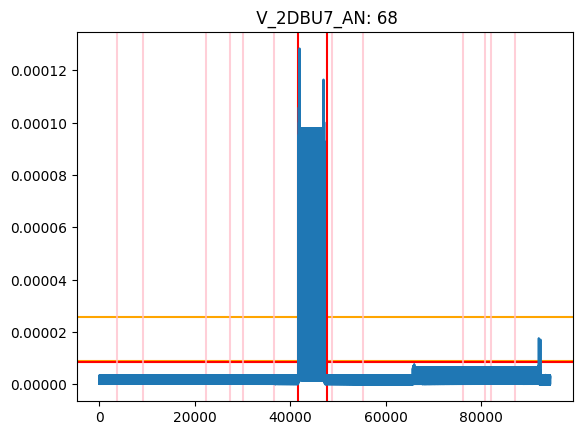

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 0


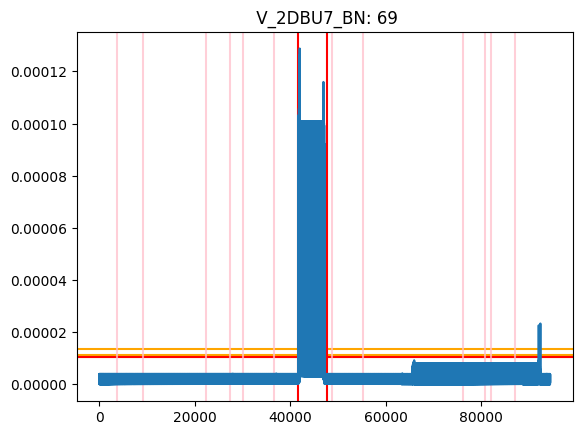

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 0


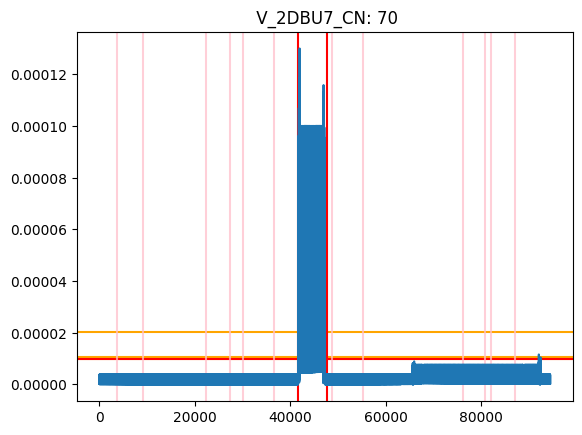

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
DD = 1
DD = 11


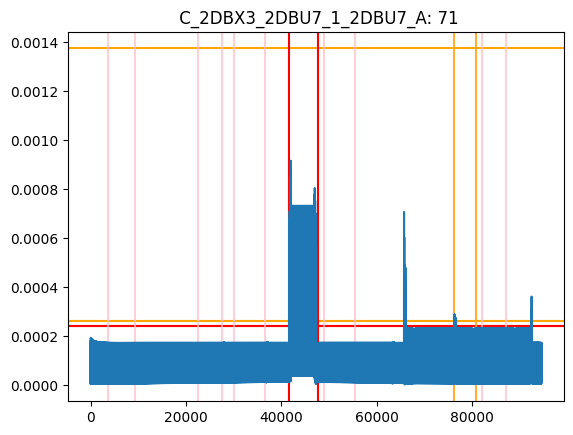

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
DD = 8
DD = 0


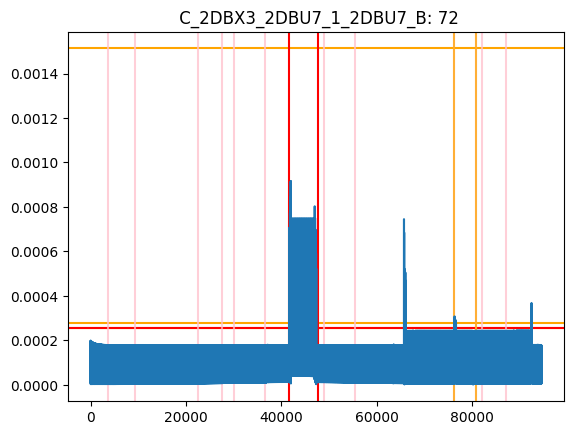

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
DD = 0
DD = 0


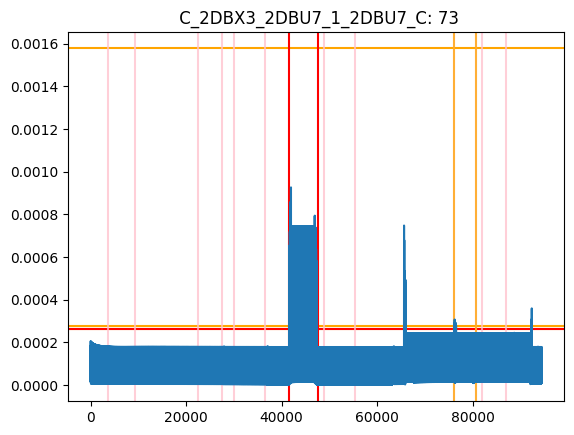

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None


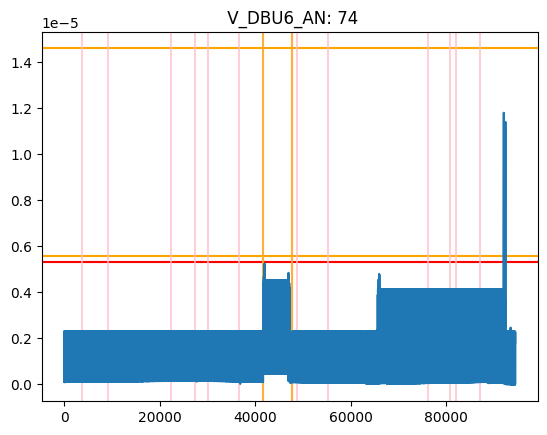

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None


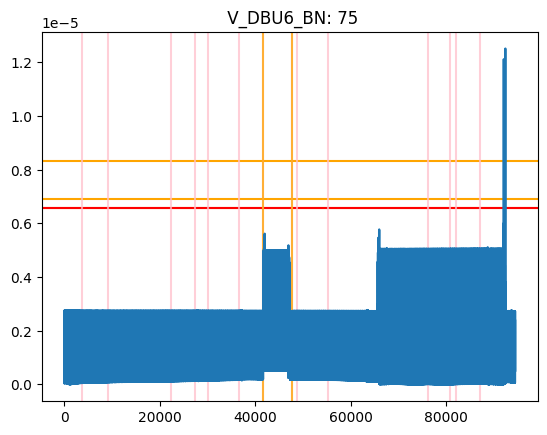

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None


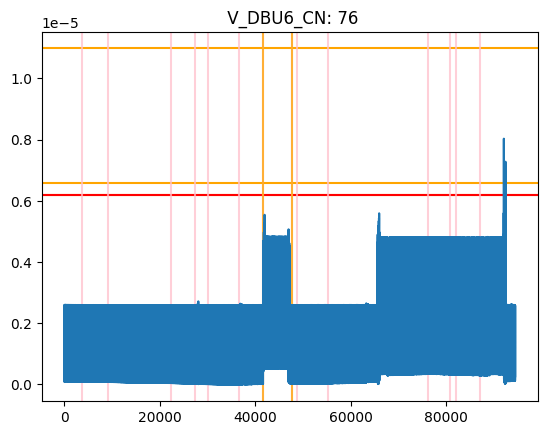

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = 0
DD = 12


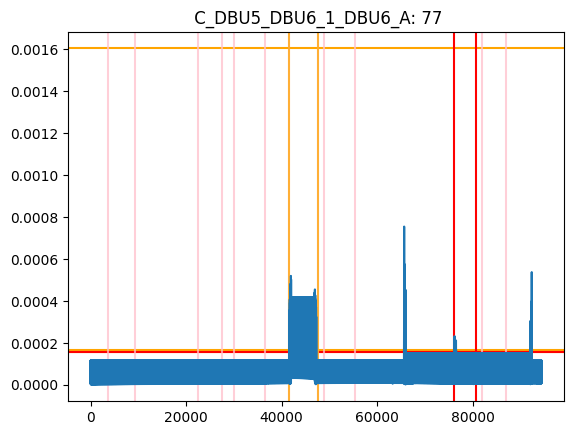

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = 7
DD = 0


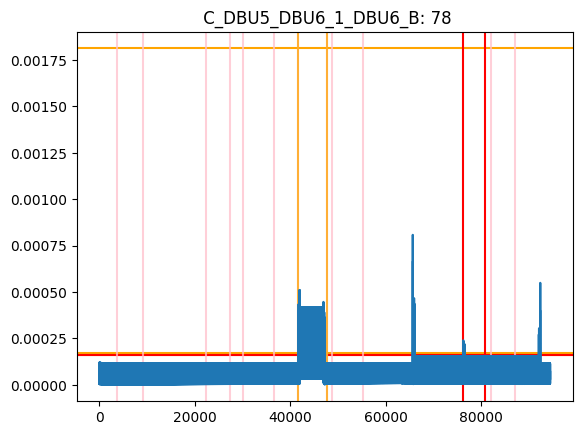

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = 0
DD = 0


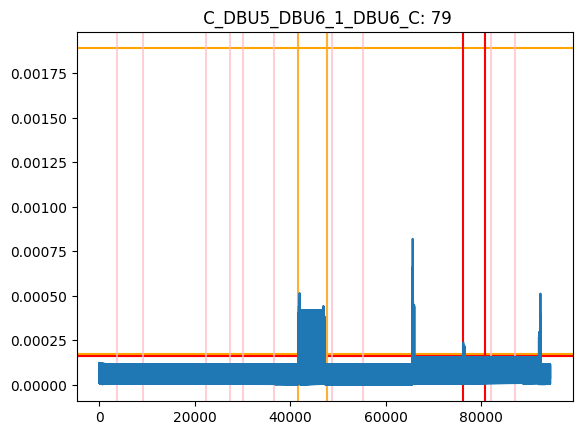

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = None


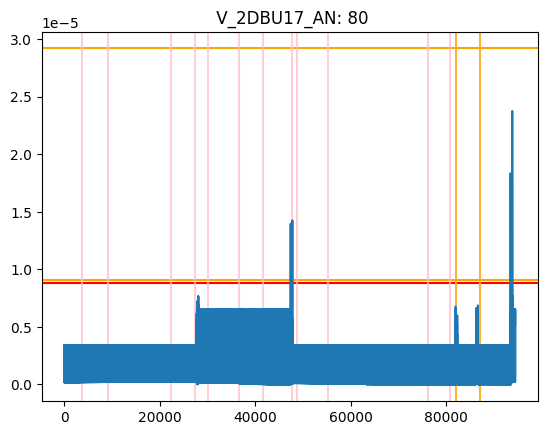

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = None


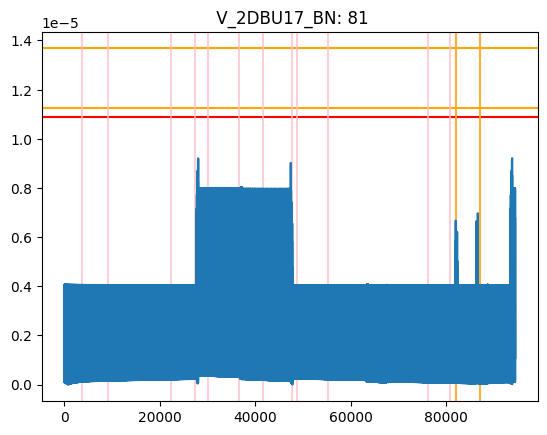

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = None


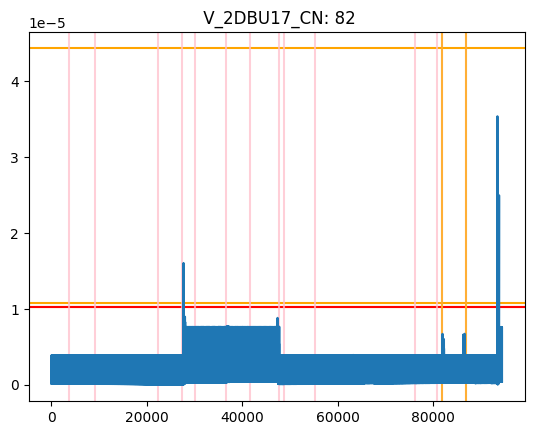

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


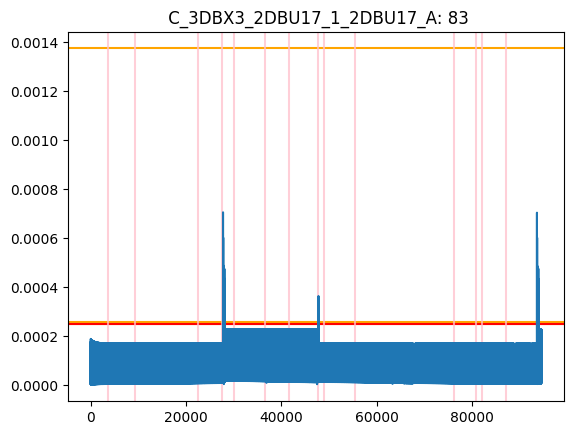

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 1


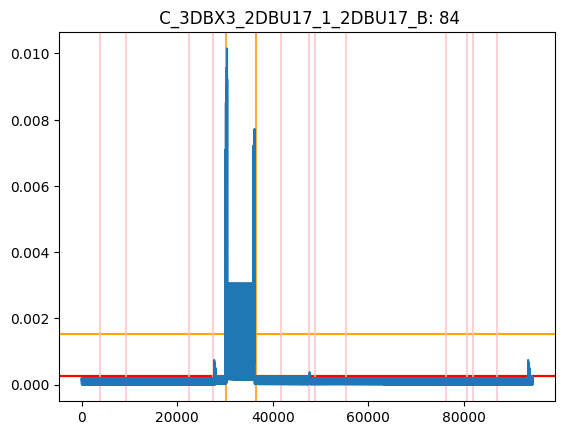

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


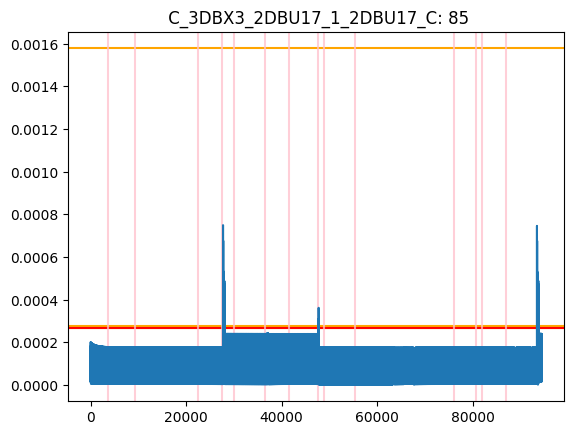

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = 0


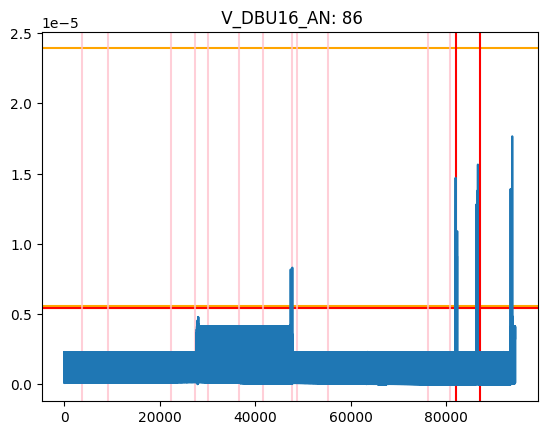

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = 16


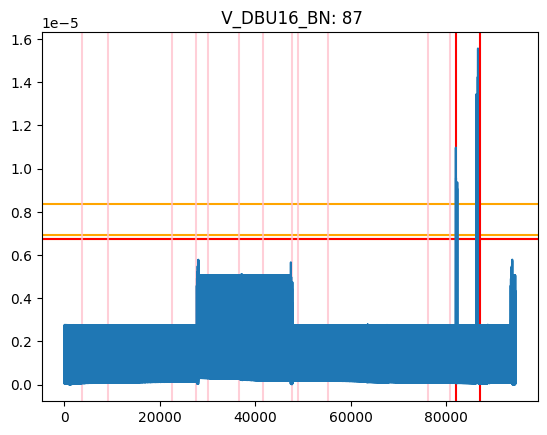

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = 1


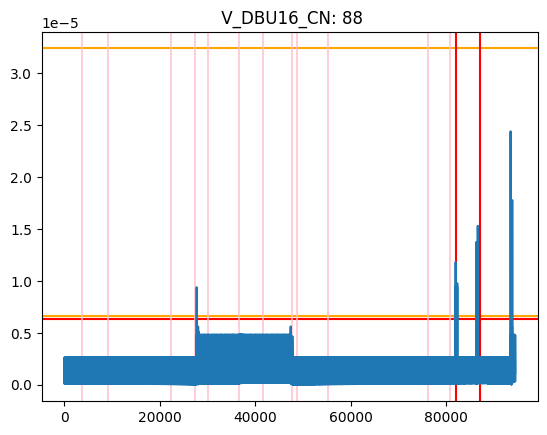

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A


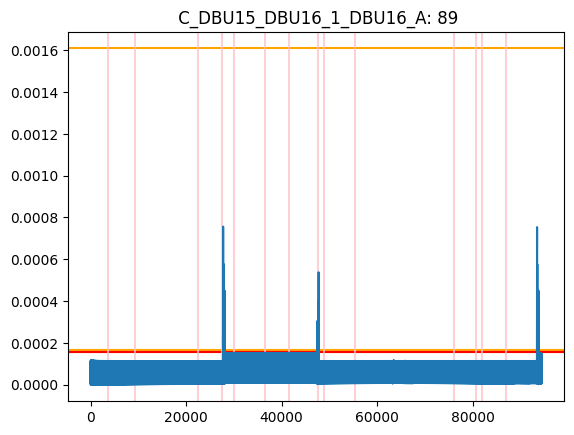

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 0


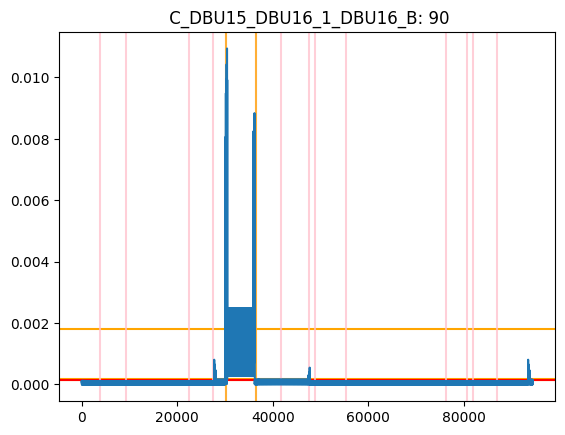

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C


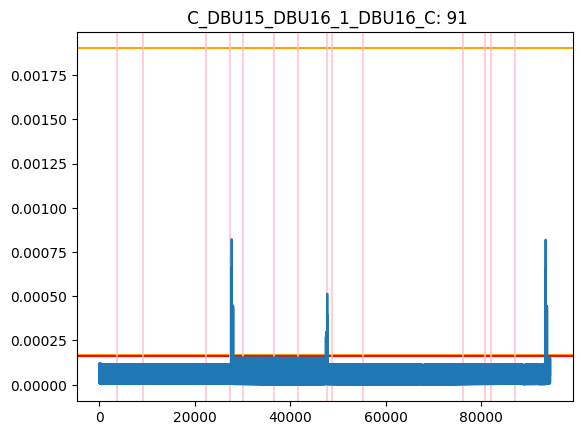

[0, 0, 0, 0, 17, 4, 0, None, None, None, 0, 6, 4, 0, 18, 364, 350, 358, None, None, None, 5084, 5110, 4920, None, None, None, 404, 4, 21, 391, 11, 8, 358, 0, 0, None, 0, None, None, 0, 1, 0, 0, 1, 11, 8, 0, 0, 0, None, None, None, 0, 12, 7, 0, 0, 0, None, None, None, 1, 0, 16, 1, 0]


In [80]:
LD_corr = []
at_neighbor = {}

rsum_list = rsum_list_corr
threshold = thresholds_corr_95
t_list = t_corr
persistency = 1

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_corr.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_corr.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_corr.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_corr)

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


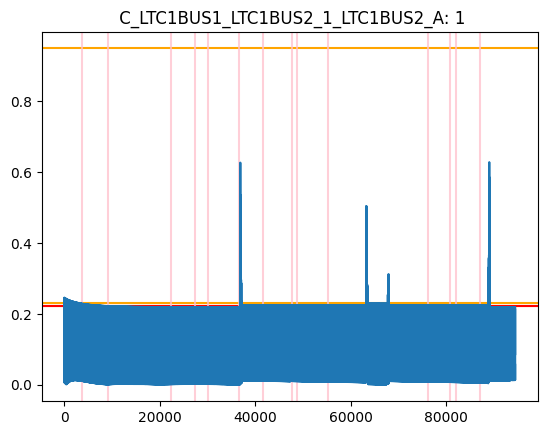

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = None


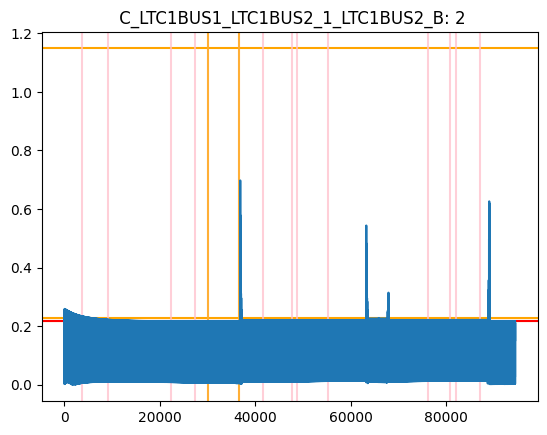

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


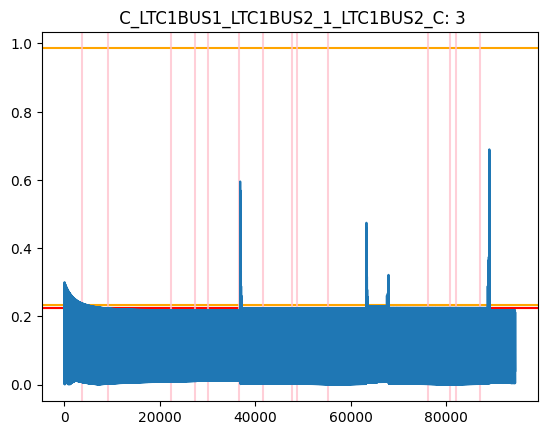

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 0


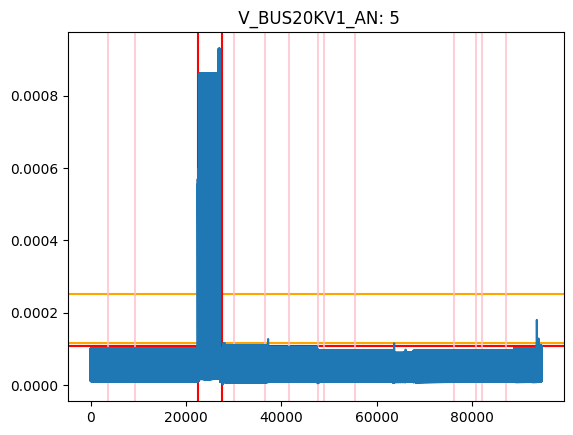

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


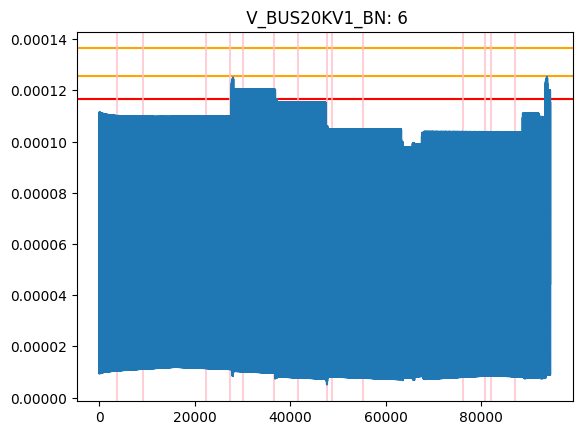

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


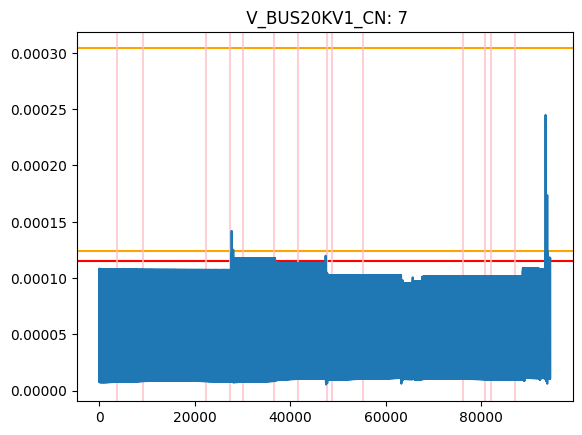

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


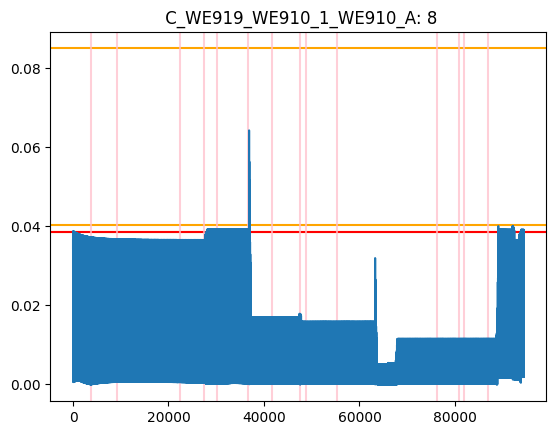

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


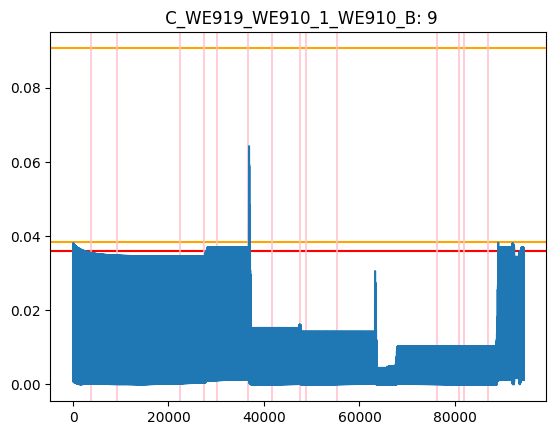

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


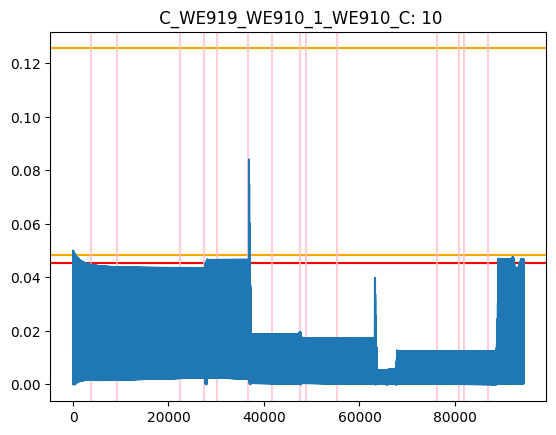

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 349


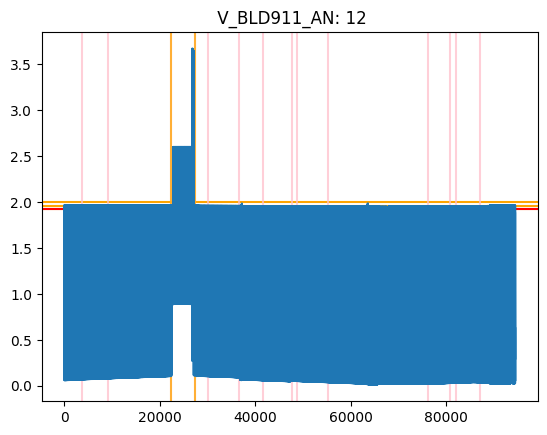

***********************************************************************************************
Sensor: 13  V_BLD911_BN


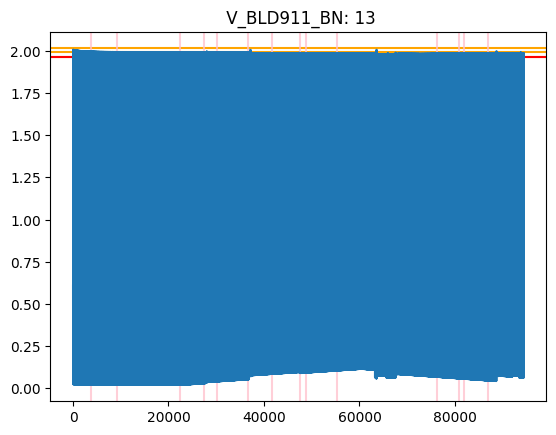

***********************************************************************************************
Sensor: 14  V_BLD911_CN


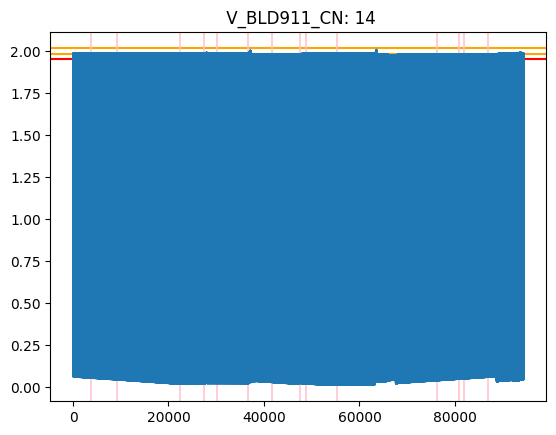

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = 37


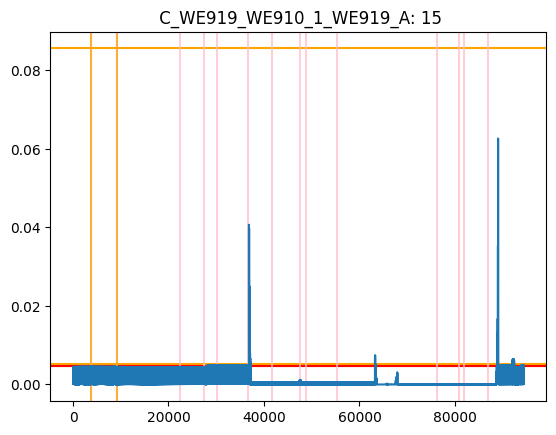

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = 62


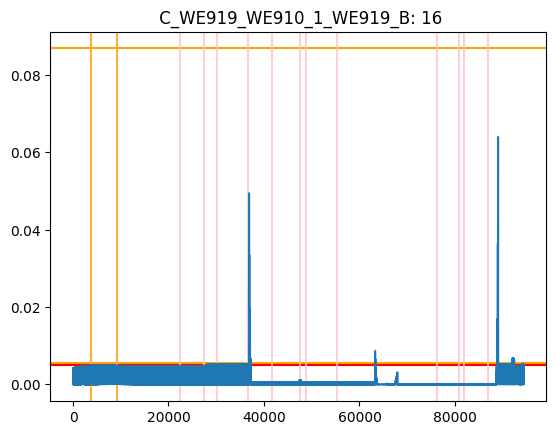

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = 48


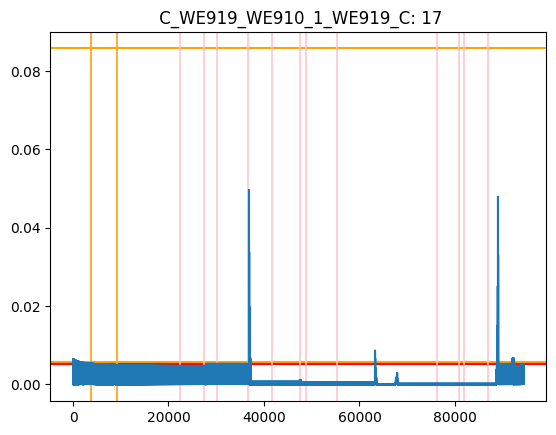

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 349


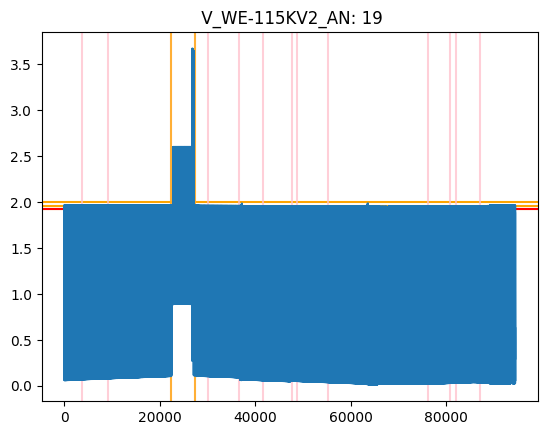

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


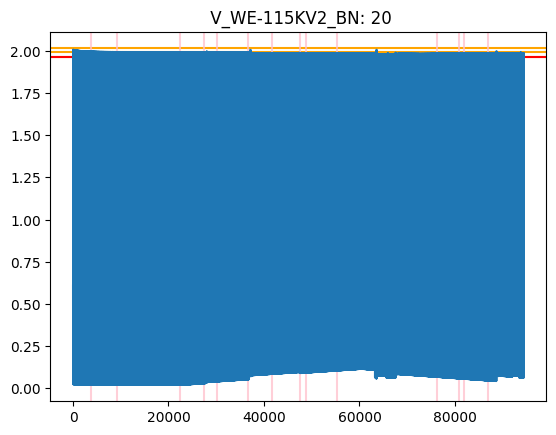

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


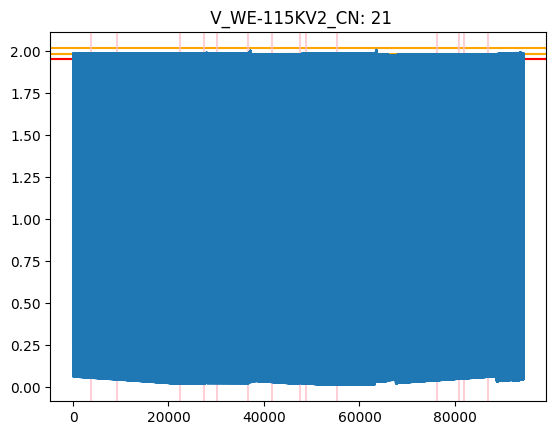

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


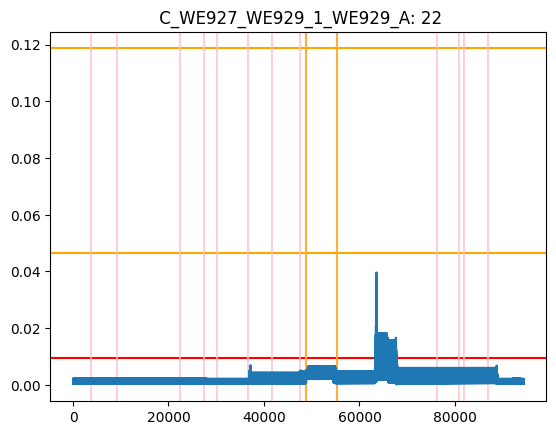

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


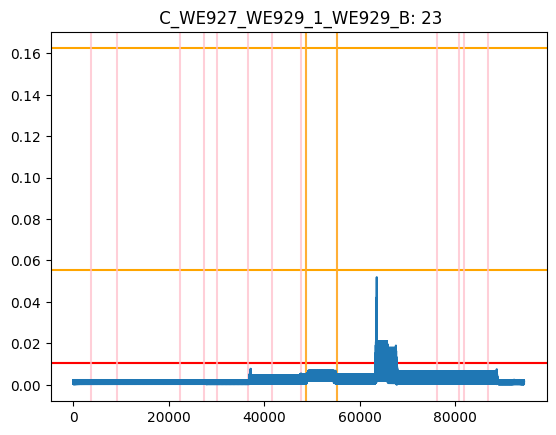

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


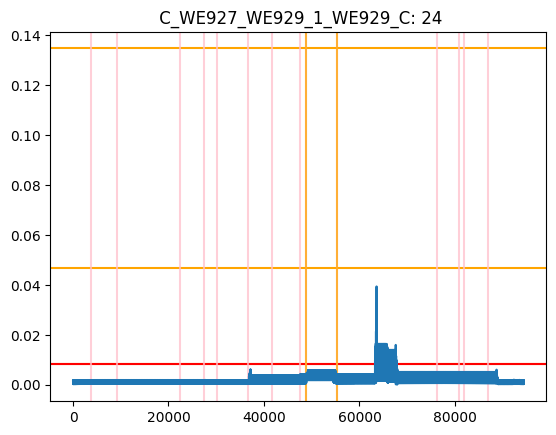

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 349


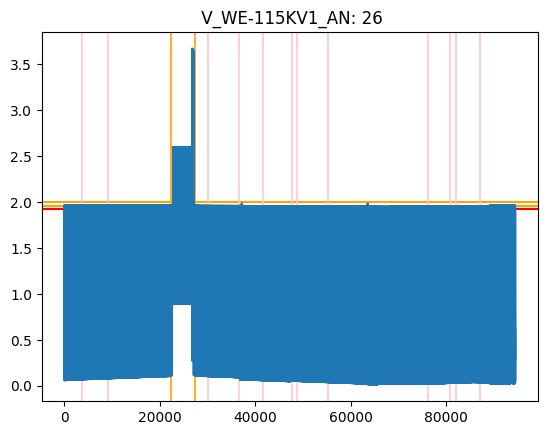

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


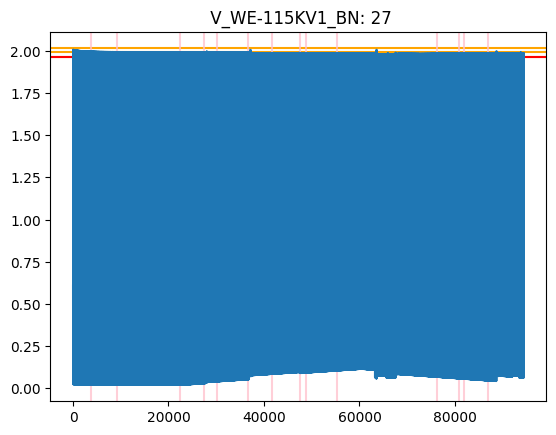

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


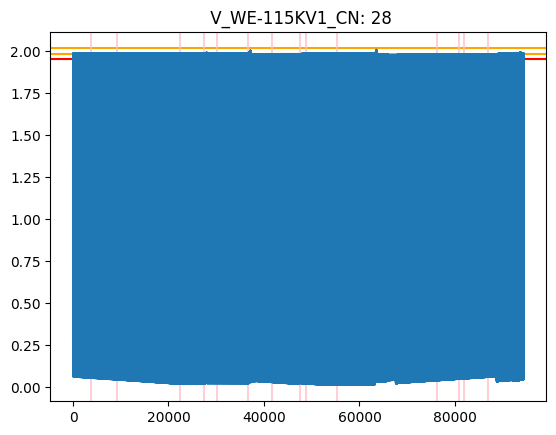

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


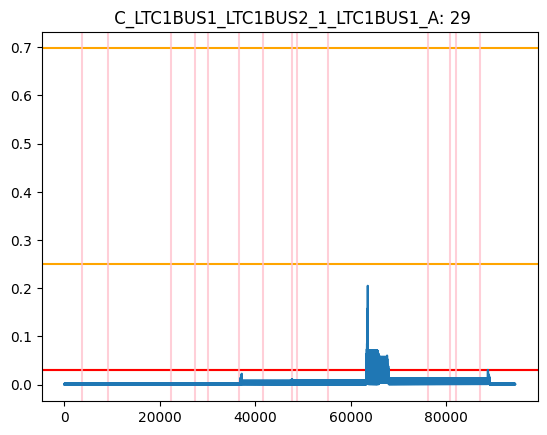

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = None


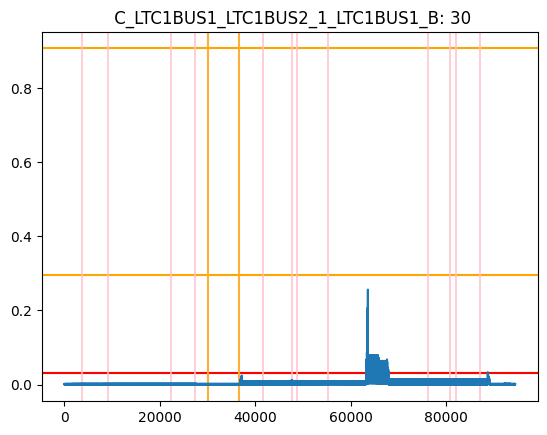

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


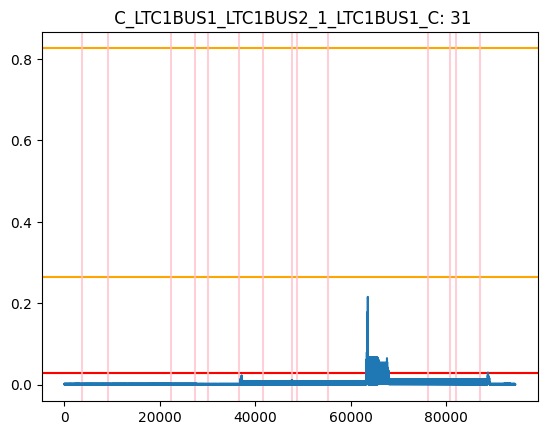

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


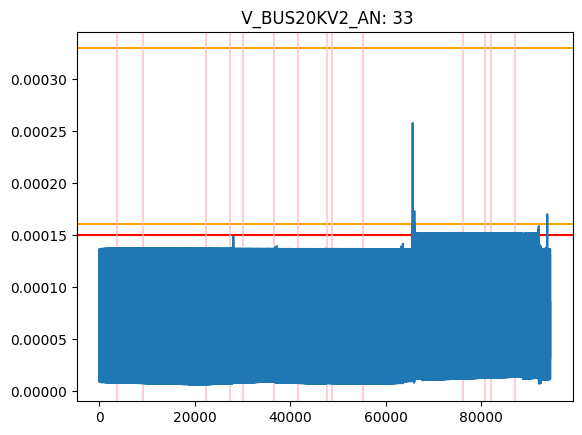

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


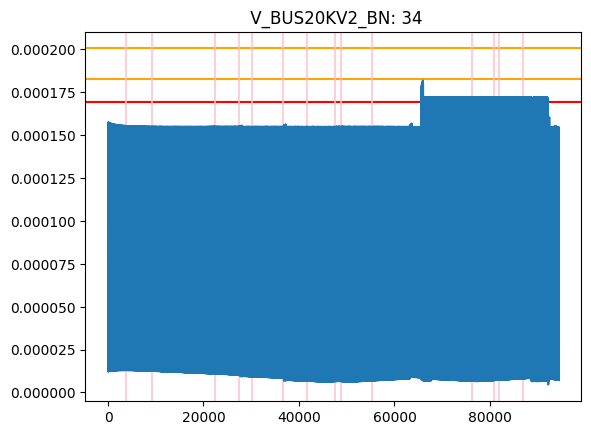

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


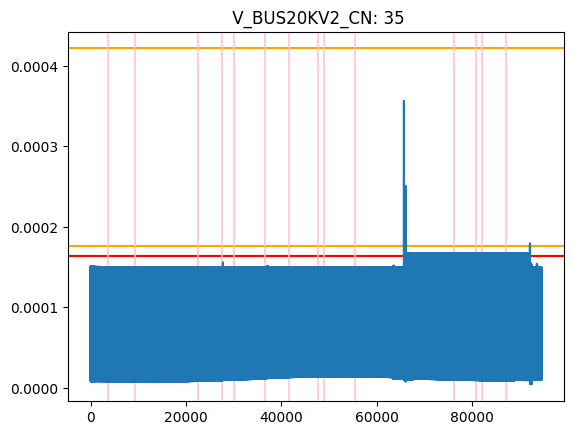

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = None


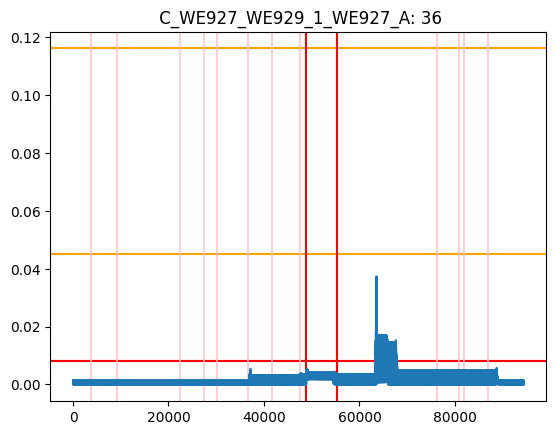

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = None


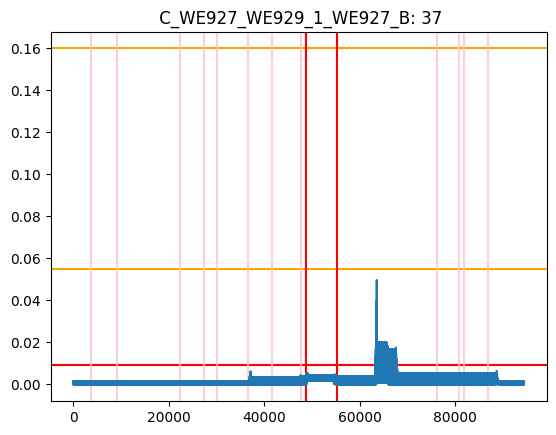

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = None


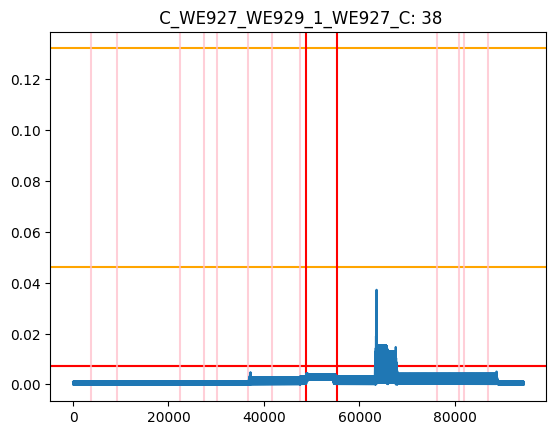

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


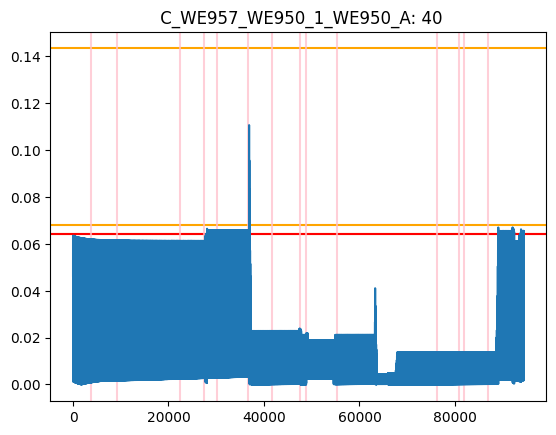

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


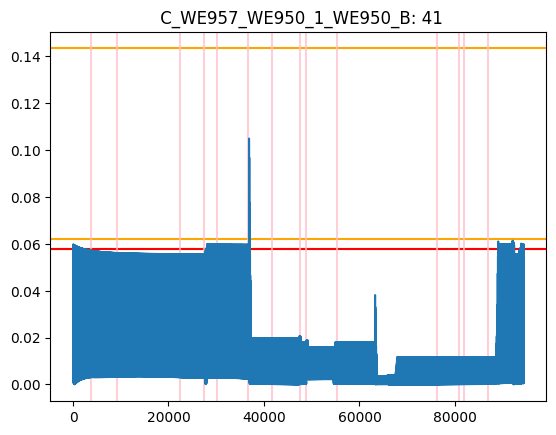

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


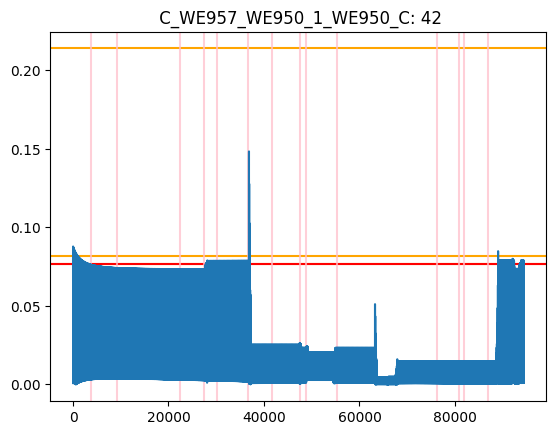

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 8


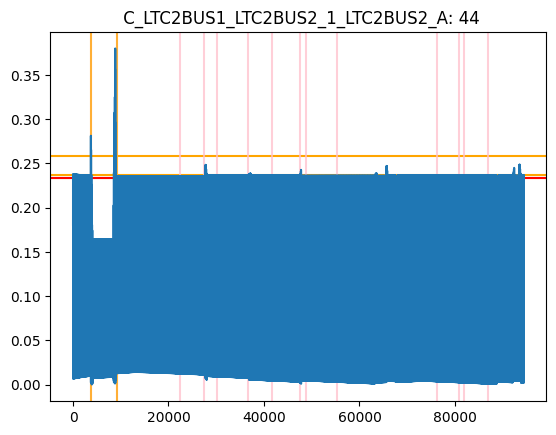

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 0


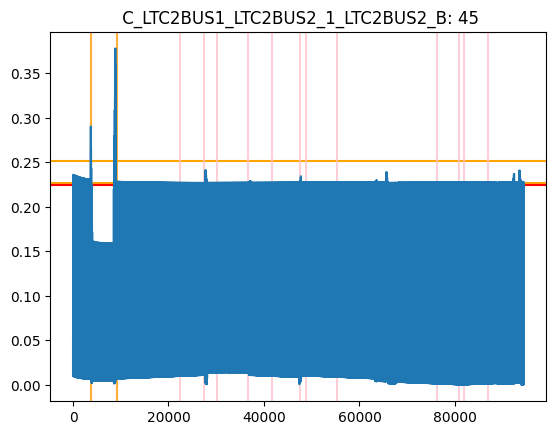

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 22


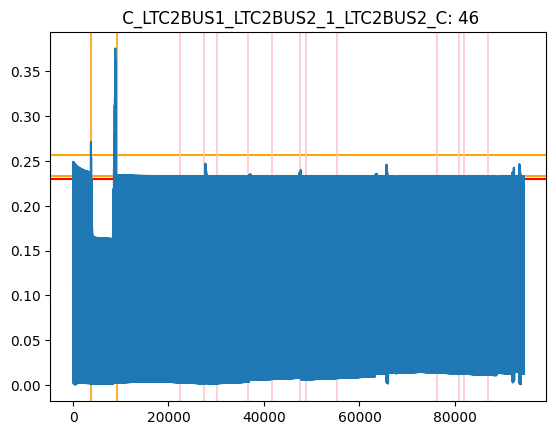

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = 38


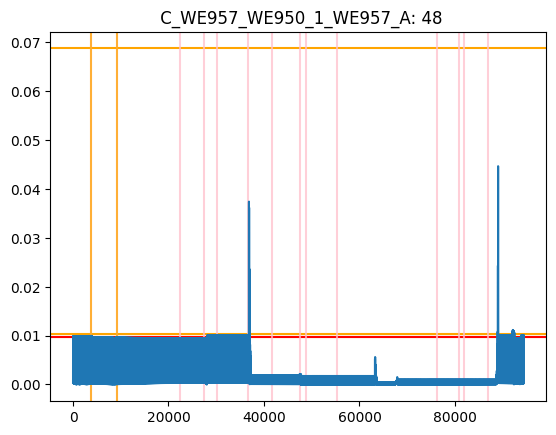

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


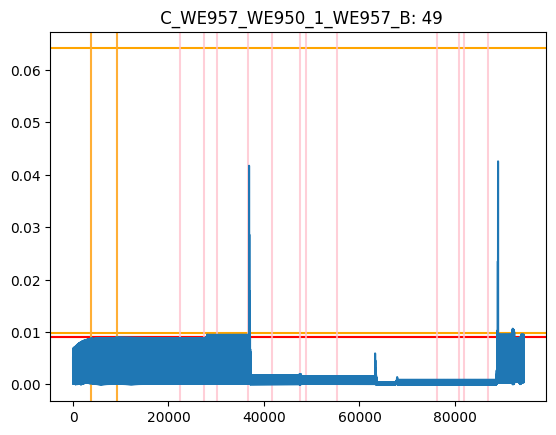

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = 51


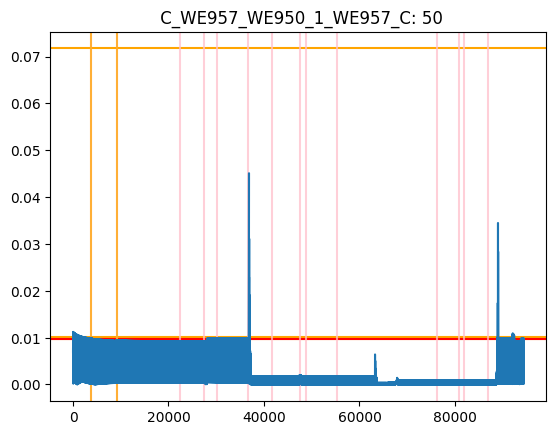

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = None


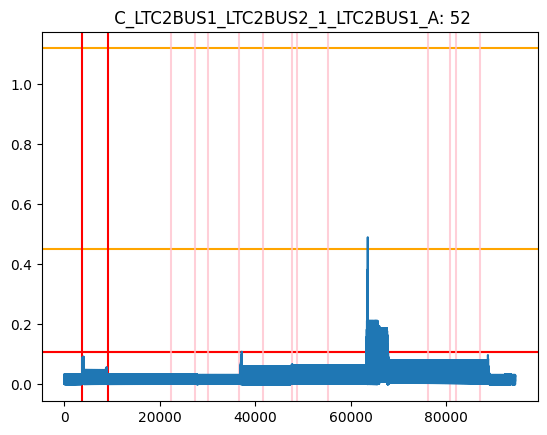

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = None


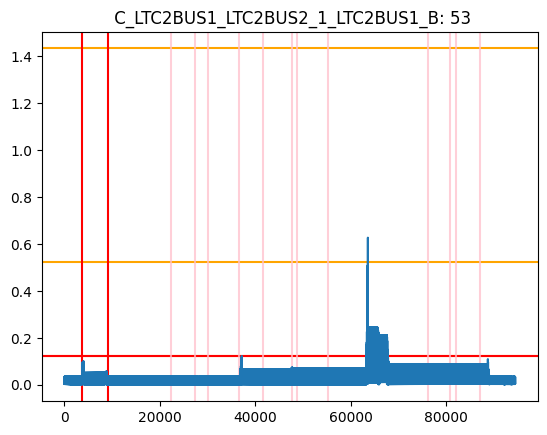

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = None


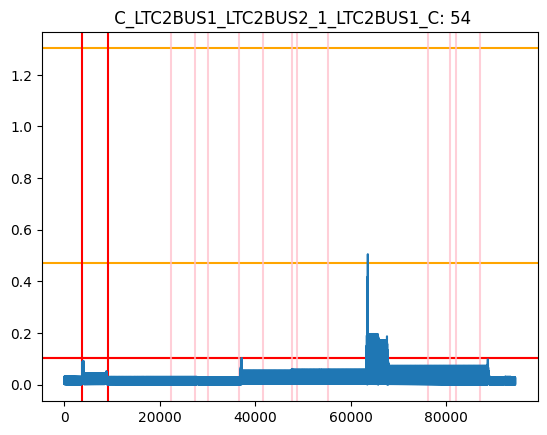

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = None


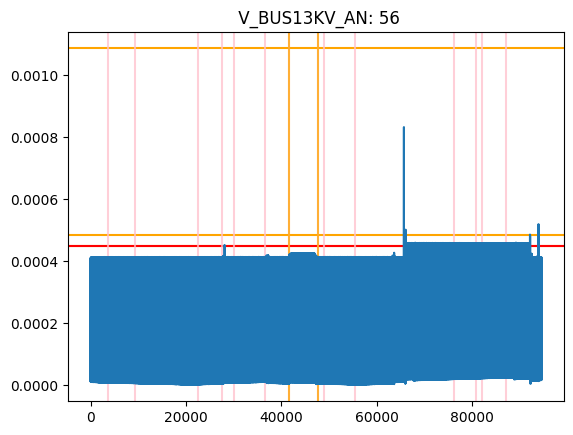

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = None


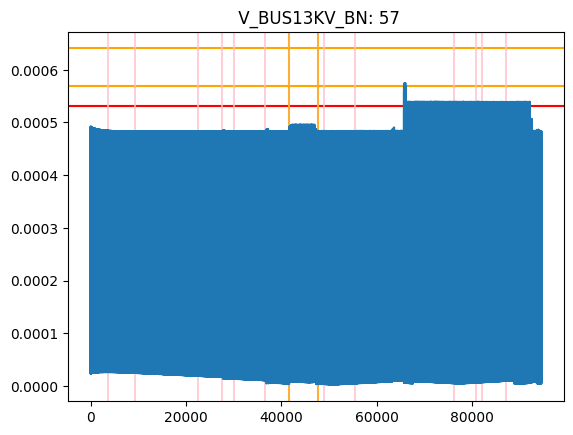

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = None


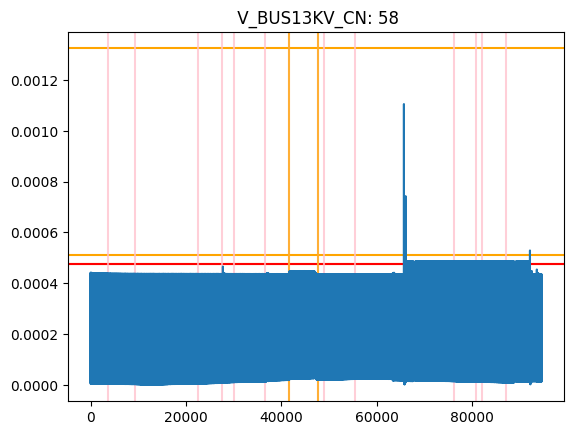

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = None
59
DD = None
59
DD = 9


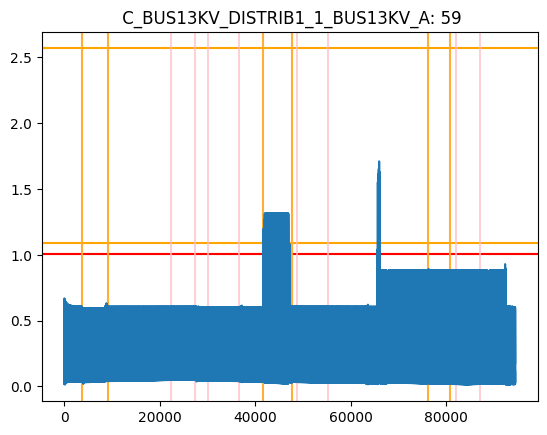

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = None
60
DD = None
60
DD = 16


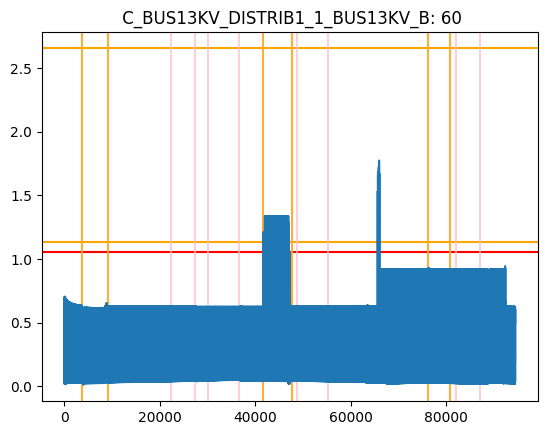

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = None
61
DD = None
61
DD = 2


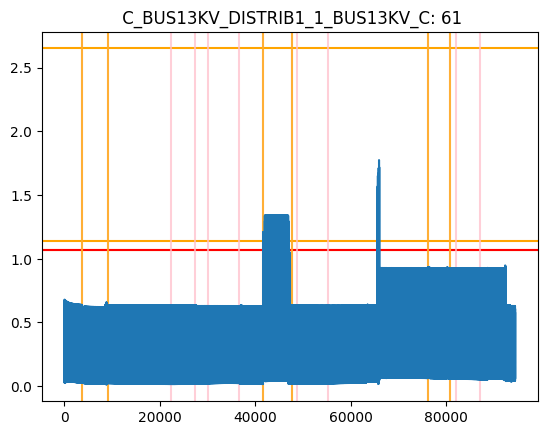

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = 29
62
DD = 0


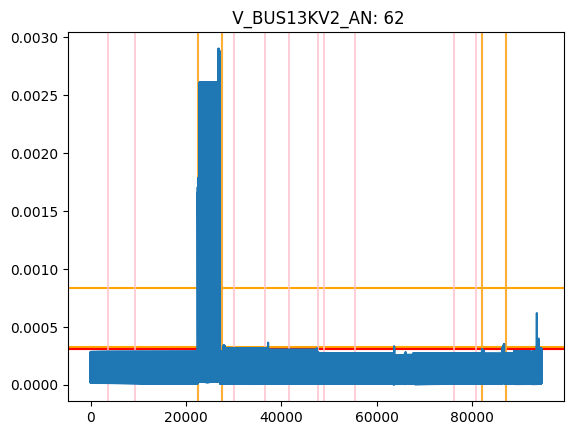

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 4336


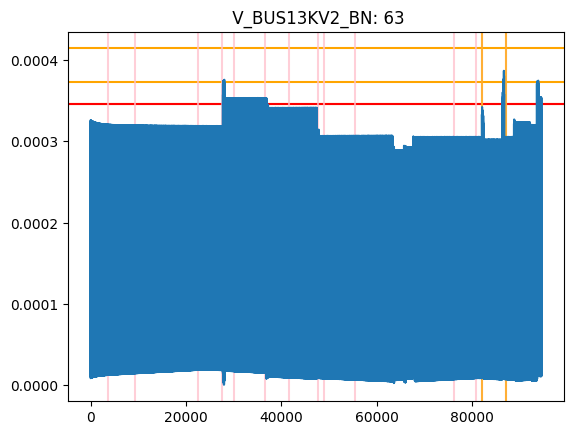

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = 4322


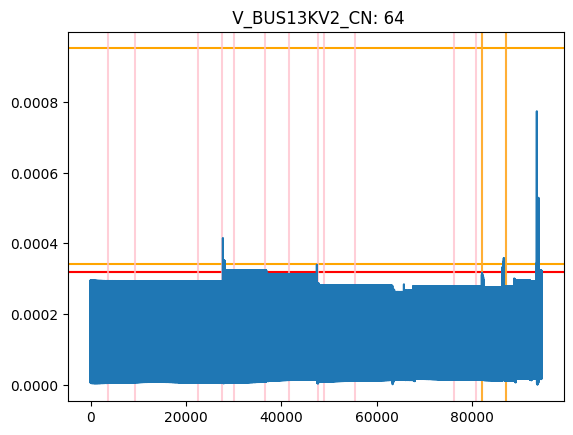

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


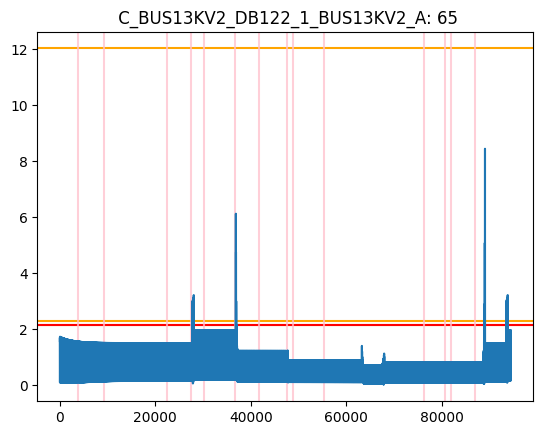

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = 3


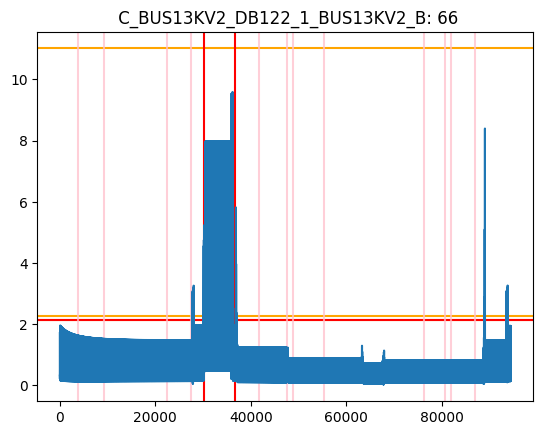

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


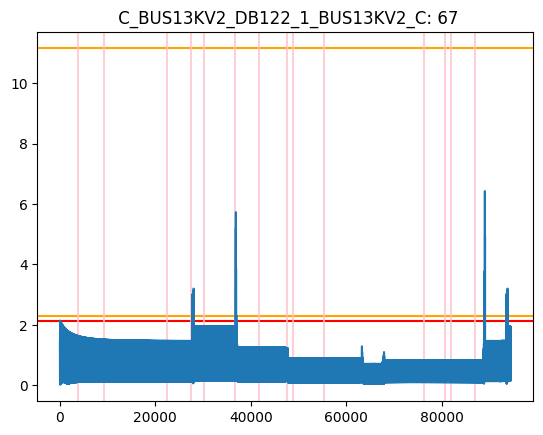

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 0


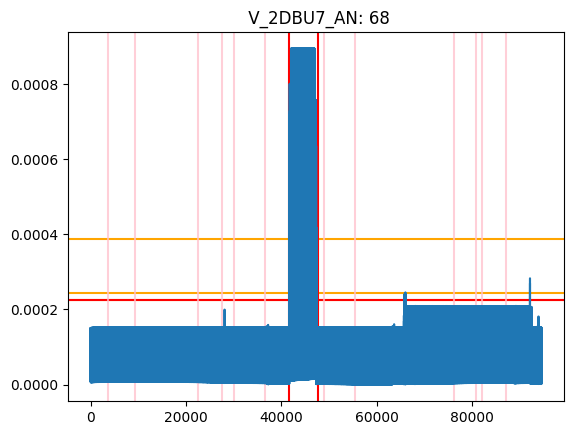

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 0


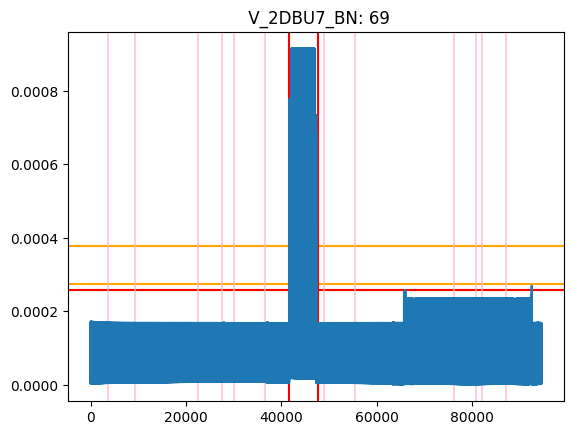

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 0


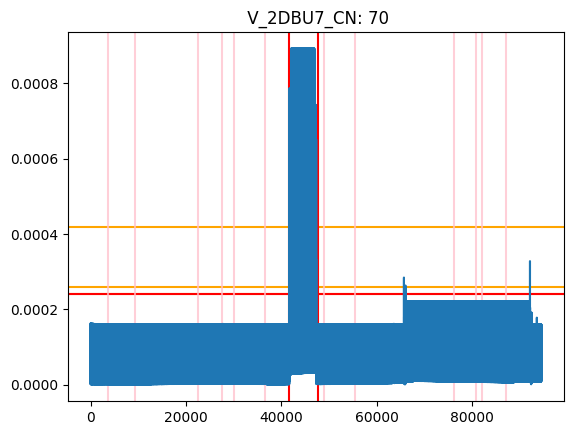

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
DD = 33
DD = 6


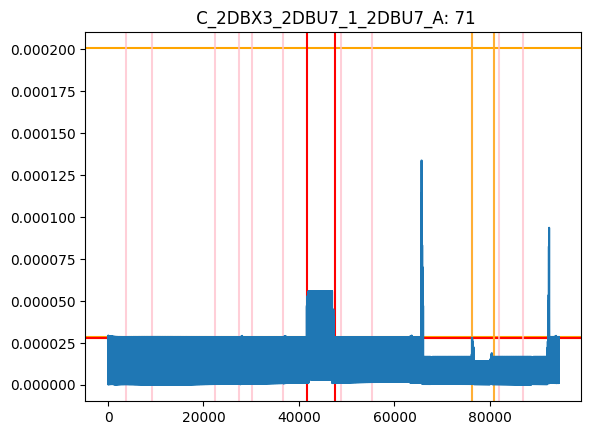

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
DD = 59
DD = 0


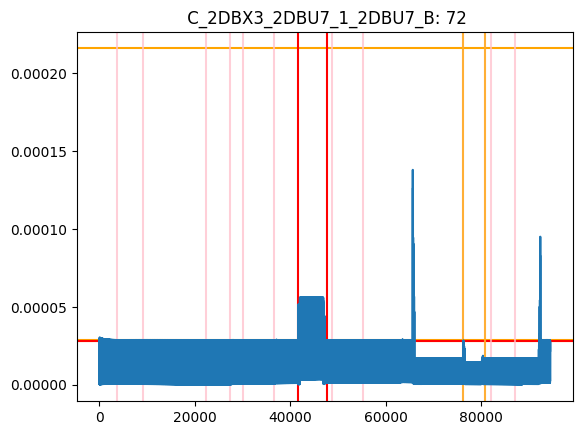

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
DD = 6
DD = 0


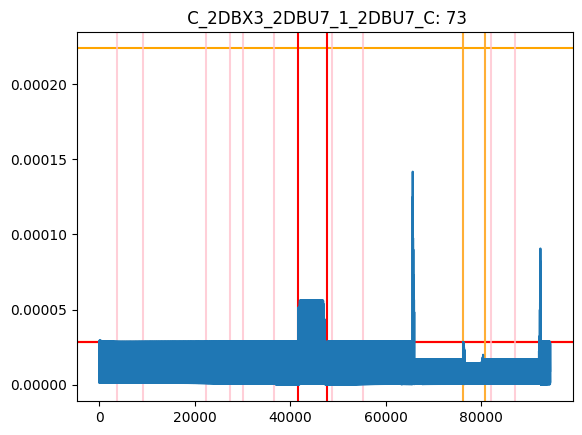

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None


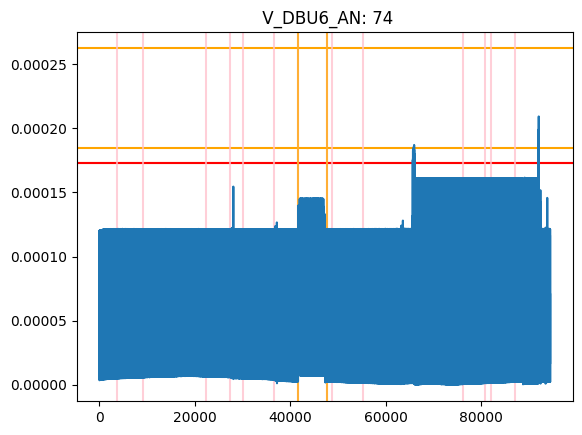

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None


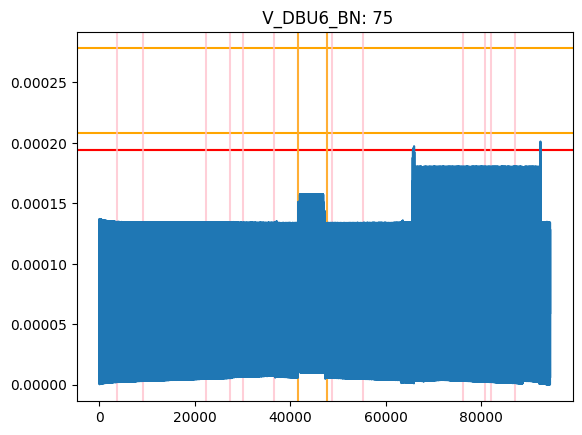

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None


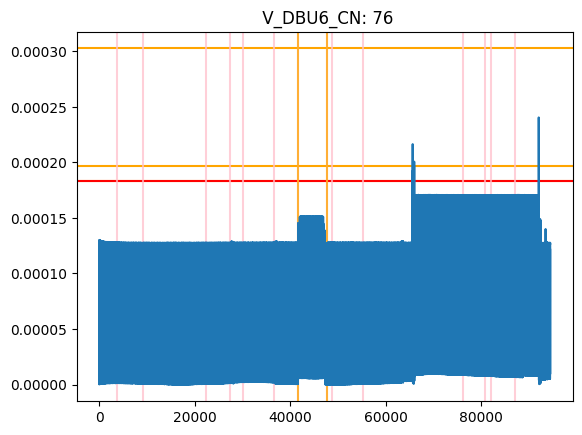

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = 29
DD = None


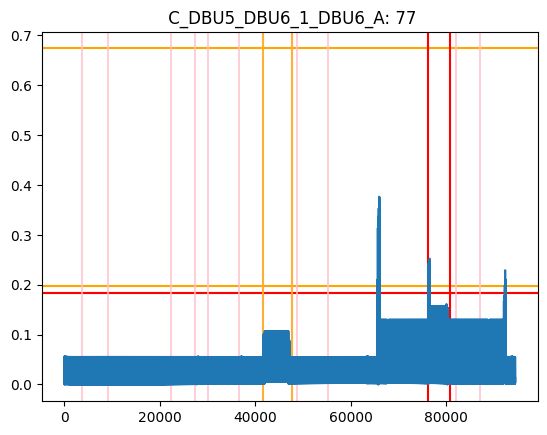

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = 17
DD = None


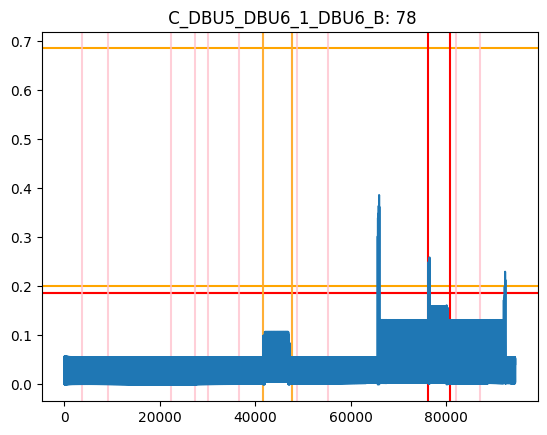

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = 3
DD = None


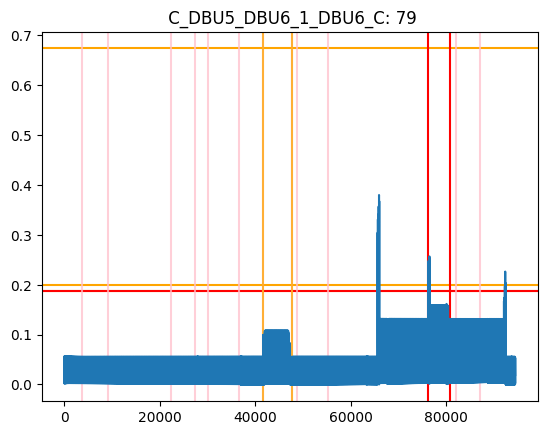

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = 27


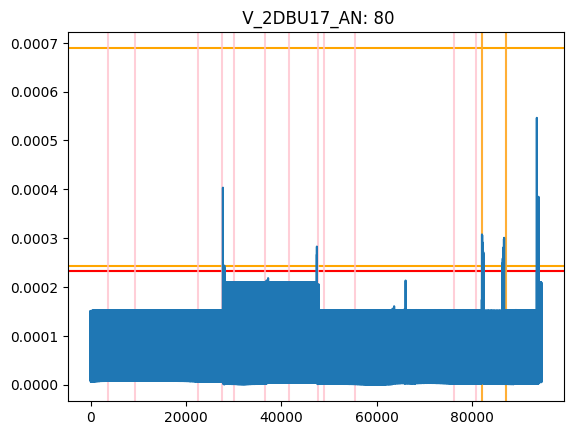

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = 14


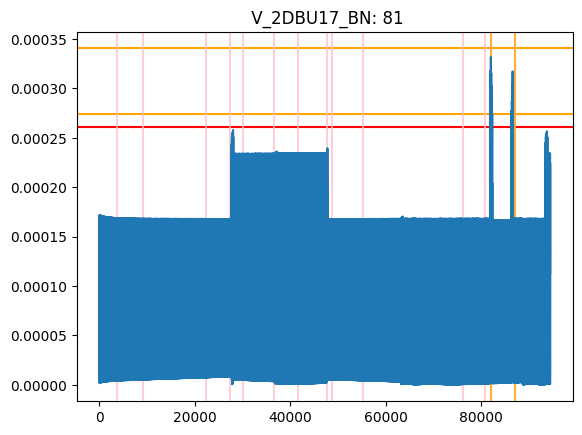

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = 0


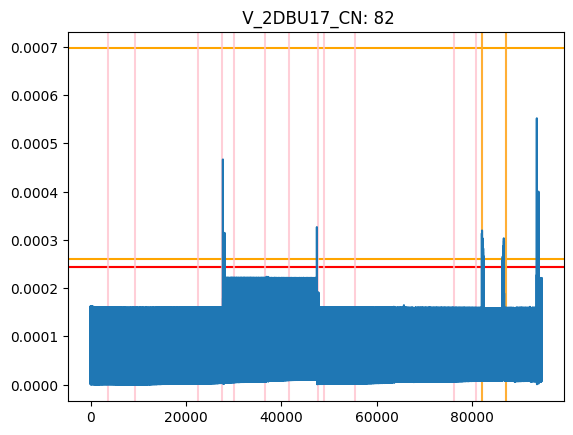

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


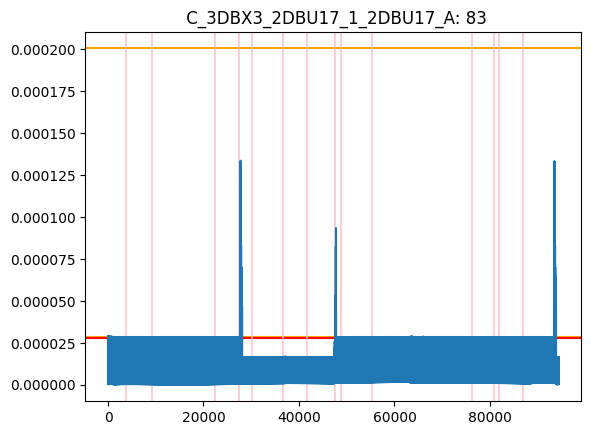

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = None


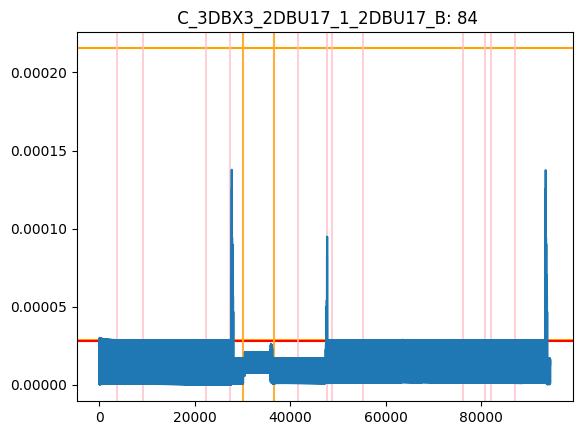

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


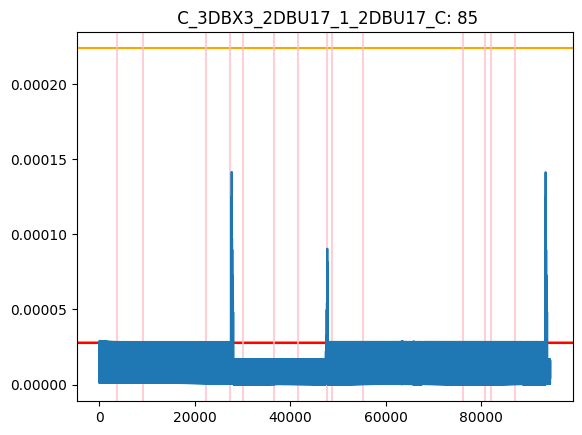

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = 0


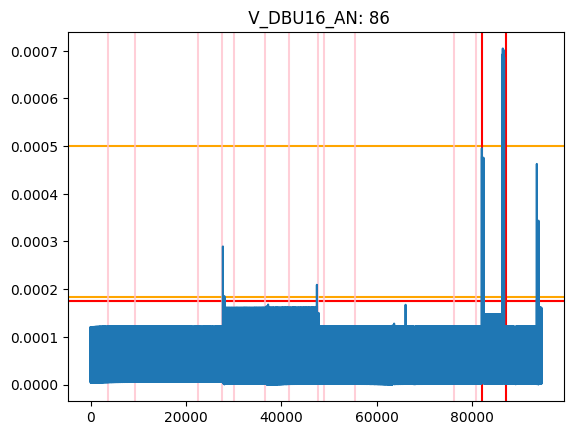

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = 12


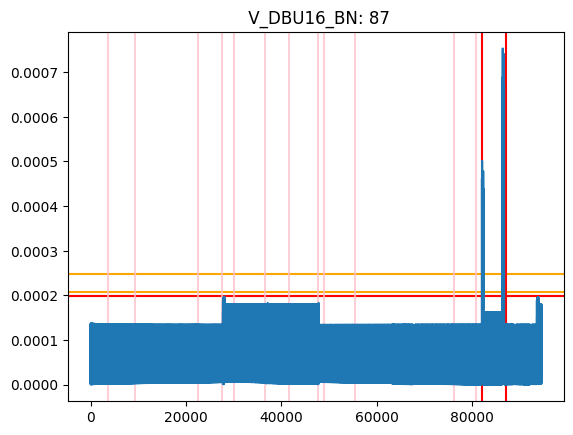

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = 0


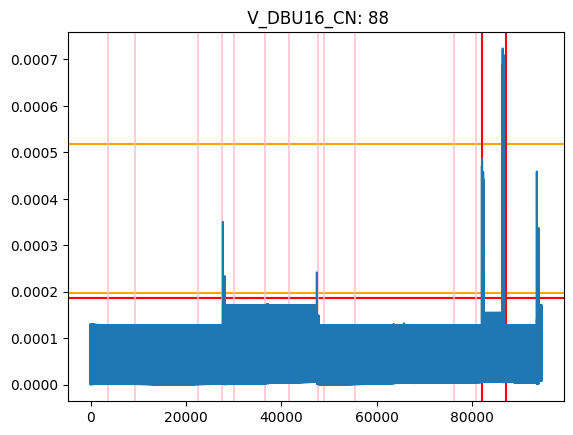

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A


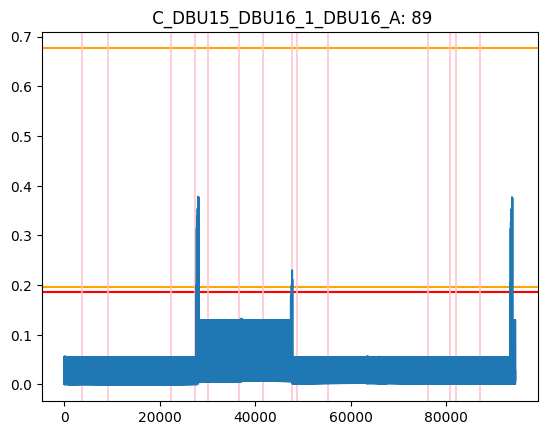

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = None


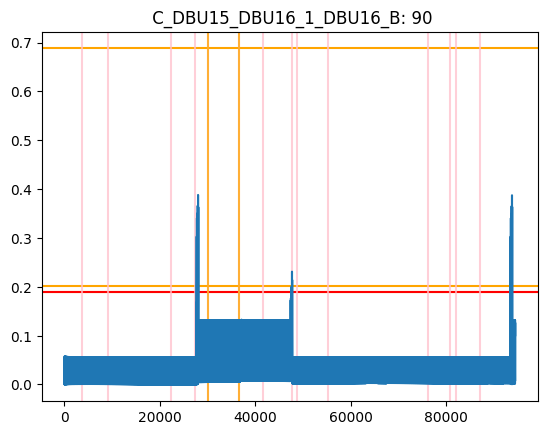

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C


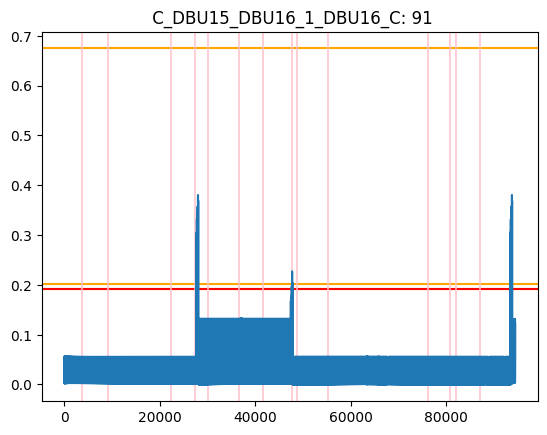

[None, 0, 349, 37, 62, 48, 349, None, None, None, 349, None, None, None, None, 8, 0, 22, 38, None, 51, None, None, None, None, None, None, None, None, 9, None, None, 16, None, None, 2, 29, 0, 4336, 4322, 3, 0, 0, 0, 33, 6, 59, 0, 6, 0, None, None, None, 29, None, 17, None, 3, None, 27, 14, 0, None, 0, 12, 0, None]


In [81]:
LD_var = []
at_neighbor = {}

rsum_list = rsum_list_var
threshold = thresholds_var_95
t_list = [thresholds_var, thresholds_var_99, thresholds_var_95]
persistency = 1

for index, i in enumerate(rsum_list):
    print("***********************************************************************************************")
    attack_in = (i > threshold[index]).nonzero()

    violations = (rsum_list > threshold.reshape(-1, 1))

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")

    for t in t_list:
        plt.axhline(t[index], color='orange')

    plt.axhline(threshold[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                LD_var.append(DD)
                print(f"DD = {DD}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

                start_w = start-window-w
                end_w = end+window+w-1
                for starts, ate in attack_i.items():
                  if starts == start and things[index] in ate:
                    DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                    LD_var.append(DD)
                    print(f"DD = {DD}")
                    plt.axvline(start_w, color='orange', alpha=0.75)
                    plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD = detection_delay(violations[index], [(start, end)], window, w, persistency)[0]
                  LD_var.append(DD)
                  print(f"DD = {DD}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

print(LD_var)

In [82]:
LD_corr, LD_cov

([0,
  0,
  0,
  0,
  17,
  4,
  0,
  None,
  None,
  None,
  0,
  6,
  4,
  0,
  18,
  364,
  350,
  358,
  None,
  None,
  None,
  5084,
  5110,
  4920,
  None,
  None,
  None,
  404,
  4,
  21,
  391,
  11,
  8,
  358,
  0,
  0,
  None,
  0,
  None,
  None,
  0,
  1,
  0,
  0,
  1,
  11,
  8,
  0,
  0,
  0,
  None,
  None,
  None,
  0,
  12,
  7,
  0,
  0,
  0,
  None,
  None,
  None,
  1,
  0,
  16,
  1,
  0],
 [50,
  20,
  22,
  None,
  None,
  None,
  22,
  None,
  None,
  None,
  22,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  8,
  35,
  21,
  1,
  28,
  15,
  19,
  6,
  12,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  0,
  15,
  25,
  12,
  7,
  0,
  5,
  12,
  2,
  None,
  29,
  None,
  15,
  77,
  0,
  6,
  13,
  None,
  None,
  None,
  None,
  None,
  None,
  0,
  26,
  12,
  7,
  0,
  24,
  10,
  6])

In [83]:
at_neighbor

{1: (array([    0,     1,     2, ..., 89055, 89056, 89057]),),
 2: (array([    6,     7,     8, ..., 89041, 89042, 89043]),),
 3: (array([   14,    15,    33, ..., 89055, 89056, 89057]),),
 5: (array([22449, 22450, 22451, ..., 94439, 94440, 94441]),),
 6: (array([27744, 27745, 27746, 27747, 27784, 27785, 27786, 27787, 27824,
         27825, 27826, 27827, 27864, 27865, 27866, 27867, 27904, 27905,
         27906, 27907, 27944, 27945, 27946, 27947, 27984, 27985, 27986,
         27987, 28024, 28025, 28026, 28027, 28064, 28065, 28066, 28067,
         28105, 28106, 28107, 28145, 28146, 28147, 28185, 28186, 28187,
         28225, 28226, 28227, 28265, 28266, 28267, 28305, 28306, 28307,
         28345, 28346, 28347, 28385, 28386, 28387, 28425, 28426, 28427,
         28465, 28466, 28467, 28505, 28506, 28507, 28545, 28546, 28547,
         28585, 28586, 28587, 28625, 28626, 28627, 28665, 28666, 28667,
         28705, 28706, 28707, 28745, 28746, 28747, 28785, 28786, 28787,
         28825, 28826, 28

Summary:

In [84]:
n = 0
falseLR = []
for start, end in sorted(all_attack_indice):
  attack_list = []
  print("***********************************************************************************************")
  print(f'For the {order_attack[n]} attack starting at index: {start} and ending at index: {end}')
  for key, values in at_neighbor.items():
    for i in values:
      if len(i) > 0:
        for k in i:
          if k+350 > start and k+350 < end:
            if key not in attack_list:
              attack_list += [key]
  print(f'These were the sensors that were detected inside that particular attack interval: {attack_list}')
  for atta in attack_list:
    hop = []
    for j in hops[stu[n]]:
      if j not in emptyr:
        hop += [j]
        hop += adj_list[j]
      else:
        hop +=[j]
    falseLRs = false_localization(attack_list, hop)
    falseLR += [falseLRs]
    if atta in hop:
      print(f'Attacked has been detected at sensor: {atta}')
    else:
      print(f'{atta} is a False Localization')

  if len(attack_list) > 0:
    print(f'This is the 1-hop neighborhood that we are interested in {sorted(hop)}')
  n += 1

***********************************************************************************************
For the CT attack starting at index: 4080 and ending at index: 8879
These were the sensors that were detected inside that particular attack interval: [1, 2, 3, 12, 13, 14, 15, 16, 17, 19, 20, 21, 26, 27, 28, 44, 45, 46, 48, 50, 71, 72, 73, 83, 84, 85]
1 is a False Localization
2 is a False Localization
3 is a False Localization
12 is a False Localization
13 is a False Localization
14 is a False Localization
Attacked has been detected at sensor: 15
Attacked has been detected at sensor: 16
Attacked has been detected at sensor: 17
19 is a False Localization
20 is a False Localization
21 is a False Localization
26 is a False Localization
27 is a False Localization
28 is a False Localization
Attacked has been detected at sensor: 44
Attacked has been detected at sensor: 45
Attacked has been detected at sensor: 46
Attacked has been detected at sensor: 48
Attacked has been detected at sensor: 50
71 

In [85]:
falseLR

[1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 1.125,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 3.0,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 6.6,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.7777777777777778,
 0.777

In [86]:
np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

208.33200075946164

In [87]:
at = [62, 64, 80, 82, 86, 87, 88]+[59, 60, 61, 71, 72, 73, 77, 78, 79]+[5, 12, 19, 26, 62]+[52, 53, 54]+[58, 68, 70, 76]
len(at)

28

In [88]:
neighbors = []
for i in attack_dict:
  neighbors += [i]
  if i not in [55,39]:
    for j in adj_list[i]:
      neighbors += [j]